In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import os
from collections import defaultdict
import matplotlib.pyplot as plt
from scipy import stats
import decoupler as dc
from tqdm import tqdm
from typing import Union, List, Dict
from pandas.core.frame import DataFrame



In [2]:
def filter_df(
        df: DataFrame,
        filter_dict: Dict[str, List[str]]
) -> DataFrame:
    for k, v in filter_dict.items():
        df = df[df[k].isin(v)]
    return df
    


In [39]:
df[df['ligand_complex'].str.startswith('CXCL')]['ligand_complex'].value_counts()

CXCL12    22073
CXCL8     17953
CXCL10    14545
CXCL13    14445
CXCL11    13071
CXCL9     12447
CXCL2      7906
CXCL1      7463
CXCL6      7463
CXCL5      7463
CXCL3      5808
CXCL16     4860
CXCL14     2098
Name: ligand_complex, dtype: int64

In [ ]:
filter_df(
    df,
    filter_dict={
        'source': [
            'Basal'
        ],
        'target': [
            'Ciliated'
        ],
        'batch': context_dict_rev['healthy_ctrl']
    }
)

,batch,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank,magnitude_rank_inverted
3351254,GER02_CTRL,Basal,Ciliated,APP,CD74,7.439235,0.0,55.085064,0.570090,0.725866,0.016544,0.890240,0.000284,6.786678e-09,8.168343e+00
3351527,GER02_CTRL,Basal,Ciliated,HLA-A,APLP2,6.389989,1.0,40.024670,-0.605920,-0.656102,0.011447,0.873637,0.323233,2.489593e-05,4.603872e+00
3351715,GER02_CTRL,Basal,Ciliated,MDK,TSPAN1,6.288268,0.0,36.746464,0.370341,0.590375,0.013695,0.868844,0.000795,7.214451e-05,4.141797e+00
3351836,GER02_CTRL,Basal,Ciliated,APP,LRP10,6.039634,0.0,35.680626,0.221050,0.285056,0.013616,0.867158,0.001433,1.116280e-04,3.952227e+00
3351853,GER02_CTRL,Basal,Ciliated,COPA,CD74,6.197906,0.0,35.357014,0.263578,0.194982,0.014390,0.866632,0.000918,1.179675e-04,3.928238e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6919044,ST08_GnR_CTRL,Basal,Ciliated,DNAJB11,PRTG,0.390647,1.0,0.152335,-1.234724,-3.590366,0.000503,0.296867,1.000000,1.000000e+00,-9.643275e-17
6919047,ST08_GnR_CTRL,Basal,Ciliated,IRAK4,TLR7,0.390647,1.0,0.152335,-1.234724,-3.590366,0.000503,0.296867,1.000000,1.000000e+00,-9.643275e-17
6919076,ST08_GnR_CTRL,Basal,Ciliated,LGI2,ADAM23,0.390647,1.0,0.152335,-1.234724,-3.590366,0.000503,0.296867,1.000000,1.000000e+00,-9.643275e-17
6919297,ST08_GnR_CTRL,Basal,Ciliated,RSPO3,ZNRF3,0.390647,1.0,0.152335,-1.234724,-3.590366,0.000503,0.296867,1.000000,1.000000e+00,-9.643275e-17


In [ ]:
progeny

In [ ]:
type(df)

pandas.core.frame.DataFrame

In [4]:
data_dir = os.path.join(os.getcwd(), '.data')
os.makedirs(data_dir, exist_ok=True)
os.listdir(data_dir)

['liana_res_compartment.csv',
 'initial_tensor.pkl',
 'final_tensor.pkl',
 'anndata_liana.h5ad',
 'final_tensor_compartment.pkl',
 'final_tensor_compartment_healthy.pkl',
 'initial_tensor_compartment.pkl',
 'Marburg_cell_states_locked_ctl240709.raw.h5ad',
 'final_tensor_compartment_COPD.pkl']

In [5]:
adata = sc.read_h5ad(os.path.join(data_dir, 'Marburg_cell_states_locked_ctl240709.raw.h5ad'))
adata

AnnData object with n_obs × n_vars = 97573 × 27208
    obs: 'sex', 'age', 'ethnicity', 'PaCO2', 'donor', 'infection', 'disease', 'SMK', 'illumina_stimunr', 'bd_rhapsody', 'n_genes', 'doublet_scores', 'predicted_doublets', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'percent_mt2', 'n_counts', 'percent_chrY', 'XIST-counts', 'S_score', 'G2M_score', 'condition', 'sample_group', 'IAV_score', 'group', 'Viral_score', 'cell_type', 'cell_states', 'leiden', 'cell_compartment', '_scvi_batch', '_scvi_labels', 'C_scANVI', 'viral_counts', 'infected_status', 'seed_labels', 'batch-scANVI'
    var: 'mt', 'ribo'
    uns: 'cell_compartment_colors', 'cell_states_colors', 'disease_colors', 'group_colors', 'infection_colors'
    obsm: 'X_scANVI', 'X_umap'

In [6]:
progeny = dc.get_progeny('human', 500)
progeny

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
6995,p53,ZMYM4,-2.325752,1.522388e-06
6996,p53,CFDP1,-1.628168,1.526045e-06
6997,p53,VPS37D,2.309503,1.537098e-06
6998,p53,TEDC1,-2.274823,1.547037e-06


In [7]:
sample_key = 'batch'
condition_key = 'group'
groupby = 'cell_compartment'
context_dict = adata.obs[[sample_key, condition_key]].drop_duplicates()
context_dict = dict(zip(context_dict[sample_key], context_dict[condition_key]))
context_dict = defaultdict(lambda: 'Unknown', context_dict)
context_dict

defaultdict(<function __main__.<lambda>()>,
            {'ST07_CSE_CTRL': 'copd_ctrl',
             'CSE_06_CRTL': 'copd_ctrl',
             'GER14_CRTL': 'healthy_ctrl',
             'GnR08_CTRL': 'healthy_ctrl',
             'GER12_CTRL': 'healthy_ctrl',
             'GER02_CTRL': 'healthy_ctrl',
             'ST10_GnR_IAV': 'healthy_iav',
             'GnR_07_IAV': 'healthy_iav',
             'CHE01_IAV': 'copd_iav',
             'CHE02_IAV': 'copd_iav',
             'CHE03_IAV': 'copd_iav',
             'CSE03_IAV': 'copd_iav',
             'ST09_CSE_IAV': 'copd_iav',
             'GnR_07_CTRL': 'healthy_ctrl',
             'CHE01_CTRL': 'copd_ctrl',
             'CHE02_CTRL': 'copd_ctrl',
             'CHE03_CTRL': 'copd_ctrl',
             'CSE03_CTRL': 'copd_ctrl',
             'ST08_GnR_CTRL': 'healthy_ctrl',
             'CSE_06_IAV': 'copd_iav',
             'GER14_IAV': 'healthy_iav',
             'GnR08_IAV': 'healthy_iav',
             'GER12_IAV': 'healthy_iav',
         

In [8]:
df = pd.read_csv(os.path.join(data_dir, 'liana_res_compartment.csv'), index_col=0)
df

,batch,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank
0,CHE01_CTRL,Basal,Mixed,APP,CD74,7.412088,0.0,53.983128,0.739385,1.108115,0.016137,0.892482,0.000250,2.808640e-10
1,CHE01_CTRL,Goblet,Mixed,APP,CD74,7.376490,0.0,53.385807,0.701348,0.888435,0.015959,0.891947,0.000293,1.123452e-09
2,CHE01_CTRL,Basal,Ciliated,APP,CD74,7.283055,0.0,52.322640,0.640498,0.938717,0.015641,0.890974,0.000250,2.527757e-09
3,CHE01_CTRL,Goblet,Ciliated,APP,CD74,7.247458,0.0,51.743690,0.602461,0.719037,0.015468,0.890432,0.000635,1.011091e-08
4,CHE01_CTRL,Club,Mixed,APP,CD74,7.198581,0.0,50.400566,0.511244,0.612547,0.015066,0.889142,0.000798,2.274930e-08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7766863,ST10_GnR_IAV,SupraB,SupraB,TPH1,HTR2A,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00
7766864,ST10_GnR_IAV,SupraB,SupraB,TPH1,HTR4,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00
7766865,ST10_GnR_IAV,SupraB,SupraB,TPH1,HTR1D,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00
7766866,ST10_GnR_IAV,SupraB,SupraB,ADO,ADORA3,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00


In [9]:
df['magnitude_rank_inverted'] = df['magnitude_rank'].apply(lambda x: -np.log10(x + np.finfo(float).eps))
df

,batch,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank,magnitude_rank_inverted
0,CHE01_CTRL,Basal,Mixed,APP,CD74,7.412088,0.0,53.983128,0.739385,1.108115,0.016137,0.892482,0.000250,2.808640e-10,9.551504e+00
1,CHE01_CTRL,Goblet,Mixed,APP,CD74,7.376490,0.0,53.385807,0.701348,0.888435,0.015959,0.891947,0.000293,1.123452e-09,8.949446e+00
2,CHE01_CTRL,Basal,Ciliated,APP,CD74,7.283055,0.0,52.322640,0.640498,0.938717,0.015641,0.890974,0.000250,2.527757e-09,8.597265e+00
3,CHE01_CTRL,Goblet,Ciliated,APP,CD74,7.247458,0.0,51.743690,0.602461,0.719037,0.015468,0.890432,0.000635,1.011091e-08,7.995210e+00
4,CHE01_CTRL,Club,Mixed,APP,CD74,7.198581,0.0,50.400566,0.511244,0.612547,0.015066,0.889142,0.000798,2.274930e-08,7.643032e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7766863,ST10_GnR_IAV,SupraB,SupraB,TPH1,HTR2A,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00,-9.643275e-17
7766864,ST10_GnR_IAV,SupraB,SupraB,TPH1,HTR4,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00,-9.643275e-17
7766865,ST10_GnR_IAV,SupraB,SupraB,TPH1,HTR1D,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00,-9.643275e-17
7766866,ST10_GnR_IAV,SupraB,SupraB,ADO,ADORA3,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00,-9.643275e-17


In [10]:
egfr_genes = set(progeny[progeny['source'] == 'EGFR']['target'])
hypoxia_genes = set(progeny[progeny['source'] == 'Hypoxia']['target'])
mapk_genes = set(progeny[progeny['source'] == 'MAPK']['target'])
tgfbeta_genes = set(progeny[progeny['source'] == 'TGFb']['target'])
goi = set(
    list(egfr_genes)
    + list(hypoxia_genes)
    + list(mapk_genes)
    #+ list(tgfbeta_genes)
)

In [11]:
filtered_df = df[df['target'].isin(['SupraB', 'Basal', 'Secretory', 'Goblet'])] #| df['source'].isin(['SupraB', 'Basal'])]
filtered_df = filtered_df[filtered_df['ligand_complex'].isin(goi) | filtered_df['receptor_complex'].isin(goi)]
filtered_df

,batch,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank,magnitude_rank_inverted
11,CHE01_CTRL,Basal,Basal,PKM,CD44,7.060767,0.0,48.840897,0.469795,0.994477,0.021982,0.887584,0.000026,9.099416e-08,7.040986e+00
27,CHE01_CTRL,Mixed,Basal,PKM,CD44,6.984523,0.0,47.917732,0.245594,0.798675,0.021566,0.886628,0.000031,3.440148e-07,6.463423e+00
30,CHE01_CTRL,Goblet,Basal,PKM,CD44,6.957776,0.0,47.593876,0.166943,0.759209,0.021420,0.886287,0.000116,4.055117e-07,6.391997e+00
32,CHE01_CTRL,Club,Basal,PKM,CD44,6.944938,0.0,47.438427,0.129192,0.739143,0.021350,0.886122,0.000219,4.493171e-07,6.347447e+00
35,CHE01_CTRL,SupraB,Basal,PKM,CD44,6.927807,0.0,47.231014,0.078819,0.712843,0.021257,0.885901,0.000476,5.192362e-07,6.284635e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7766778,ST10_GnR_IAV,SupraB,SupraB,EFEMP2,PLSCR4,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00,-9.643275e-17
7766819,ST10_GnR_IAV,SupraB,SupraB,CALM1,KCNN4,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00,-9.643275e-17
7766822,ST10_GnR_IAV,SupraB,SupraB,EFEMP2,AQP1,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00,-9.643275e-17
7766825,ST10_GnR_IAV,SupraB,SupraB,S100A10,TRPV6,0.364809,1.0,0.131731,-1.273457,-3.774718,0.000628,0.286524,1.000000,1.000000e+00,-9.643275e-17


Ionocyte
healthy_pval: nan; copd_pval: nan


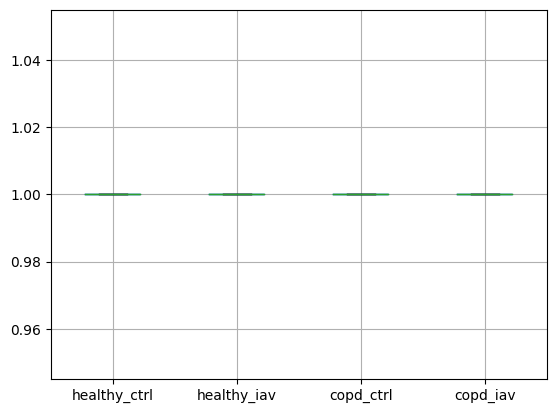

logfcpval: nan


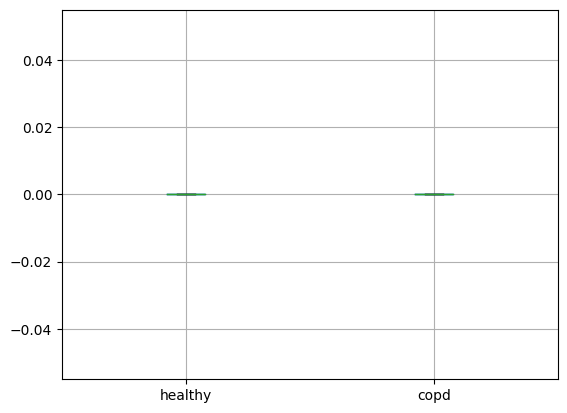

In [34]:
context_dict_rev = {group: sorted(list(set(adata.obs[adata.obs['group'] == group]['batch']))) for group in set(adata.obs['group'])}
#df_filtered = df[((df['source'].isin(['SupraB', 'Basal'])) | (df['target'].isin(['SupraB', 'Basal']))) & ((df['ligand_complex'].isin(egfr_genes)) | df['receptor_complex'].isin(goi))]
#df_filtered = df[df['target'].isin(['Goblet', 'Epi', 'Deuterosomal', 'Club', 'Ciliated', 'Secretory', 'Mixed'])]
df_filtered = df[df[]]
cell_types = list(set(adata.obs['cell_compartment']))
cell_type = cell_types[8]
df_filtered = df[(df['target'].isin([cell_types[4]])) | df['source'].isin([cell_types[9]])]
df_filtered = df
values_dict = {condition:[] for condition in context_dict_rev.keys()}
for condition, batches in context_dict_rev.items():
    for batch in batches:
        batch_sum = df_filtered[df_filtered['batch'] == batch]['magnitude_rank_inverted'].sum()
        batch_sum_norm = batch_sum / df[df['batch'] == batch]['magnitude_rank_inverted'].sum()
        values_dict[condition].append(batch_sum_norm)
values_df = pd.DataFrame(values_dict)
values_df = values_df[['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav']]
values_logfc_df = pd.DataFrame()
values_logfc_df['healthy'] = np.log2(values_df['healthy_iav']/values_df['healthy_ctrl'])
values_logfc_df['copd'] = np.log2(values_df['copd_iav']/values_df['copd_ctrl'])
healthy_pval = stats.ttest_rel(values_df['healthy_ctrl'], values_df['healthy_iav'])[1]
copd_pval = stats.ttest_rel(values_df['copd_ctrl'], values_df['copd_iav'])[1]
logfc_pval = stats.ttest_ind(values_logfc_df['healthy'], values_logfc_df['copd'])[1]
print(f'healthy_pval: {healthy_pval}; copd_pval: {copd_pval}')
plt.figure()
values_df.boxplot()
plt.show()
print(f'logfcpval: {logfc_pval}')
plt.figure()
values_logfc_df.boxplot()
plt.show()

In [13]:
values_dict = {}
for condition in set(context_dict.values()):
    values_dict[condition] = []
for batch, condition in context_dict.items():
    batch_sum = filtered_df[filtered_df['batch'] == batch]['magnitude_rank_inverted'].sum()
    values_dict[condition].append(batch_sum)
values_df = pd.DataFrame.from_dict(values_dict)
values_df

    

,copd_ctrl,copd_iav,healthy_ctrl,healthy_iav
0,4038.142752,5162.375474,4869.978299,4484.171896
1,4631.515967,5794.320117,4889.693290,4761.224048
2,4790.453847,5409.249227,4543.352502,5619.746574
3,4973.702879,5453.556085,4736.010022,4673.207548
4,4739.661787,4583.097623,4609.147487,4965.933666
5,4792.798955,5109.178604,4029.117442,5541.154282


p-value for healthy_ctrl vs healthy_iav: 0.25337265481329924
p-value for copd_ctrl vs copd_iav: 0.03439173825531491


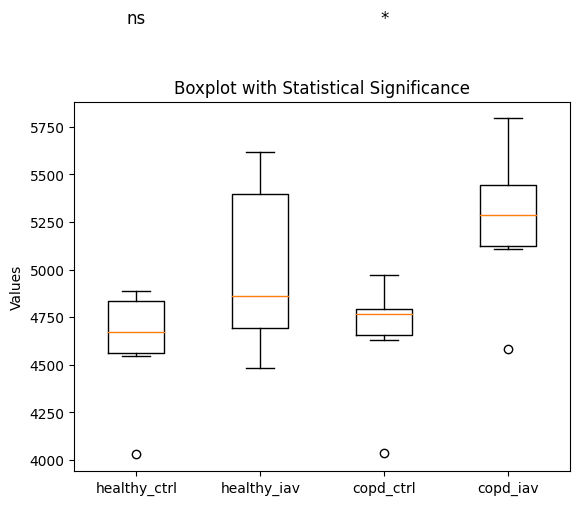

In [14]:
# Paired t-tests
t_stat1, p_val1 = stats.ttest_rel(values_df['healthy_ctrl'], values_df['healthy_iav'])
t_stat2, p_val2 = stats.ttest_rel(values_df['copd_ctrl'], values_df['copd_iav'])

# Print p-values for understanding
print(f"p-value for healthy_ctrl vs healthy_iav: {p_val1}")
print(f"p-value for copd_ctrl vs copd_iav: {p_val2}")
# Plotting
plt.boxplot([values_df['healthy_ctrl'], values_df['healthy_iav'], values_df['copd_ctrl'], values_df['copd_iav']], 
            labels=['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav'])

# Adding significance stars
def add_stat_annotation(p_val, position, y_max):
    if p_val < 0.0001:
        stars = '****'
    elif p_val < 0.001:
        stars = '***'
    elif p_val < 0.01:
        stars = '**'
    elif p_val < 0.05:
        stars = '*'
    else:
        stars = 'ns'  # not significant
    plt.text(position, y_max + 500, stars, 
             horizontalalignment='center', fontsize=12, color='black')

y_max = values_df.max().max()
# Add stars above the relevant pairs
add_stat_annotation(p_val1, 1, y_max)  # Between healthy_ctrl and healthy_iav
add_stat_annotation(p_val2, 3, y_max)  # Between copd_ctrl and copd_iav

# Titles and labels
plt.title('Boxplot with Statistical Significance')
plt.ylabel('Values')
plt.show()

In [15]:
values_logfc_df = pd.DataFrame()
values_logfc_df['healthy'] = np.log2(values_df['healthy_iav'] / values_df['healthy_ctrl'])
values_logfc_df['copd'] = np.log2(values_df['copd_iav'] / values_df['copd_ctrl'])
values_logfc_df

,healthy,copd
0,-0.119074,0.354343
1,-0.038411,0.323155
2,0.306748,0.175266
3,-0.019259,0.132877
4,0.107565,-0.048461
5,0.459723,0.092223


In [16]:
stats.ttest_ind(values_logfc_df['healthy'], values_logfc_df['copd'])

Ttest_indResult(statistic=-0.5020919915224136, pvalue=0.6264731255263103)

In [17]:
cell_compartments = set(adata.obs['cell_compartment'])
cell_compartments

{'Basal',
 'Ciliated',
 'Club',
 'Deuterosomal',
 'Epi',
 'Goblet',
 'Ionocyte',
 'Mixed',
 'Secretory',
 'SupraB'}

In [18]:
values_dict = {}
for condition in set(context_dict.values()):
    values_dict[condition] = []
for batch, condition in context_dict.items():
    batch_sum = filtered_df[filtered_df['batch'] == batch]['magnitude_rank_inverted'].sum()
    values_dict[condition].append(batch_sum)
values_df = pd.DataFrame.from_dict(values_dict)
values_df

    

,copd_ctrl,copd_iav,healthy_ctrl,healthy_iav
0,4038.142752,5162.375474,4869.978299,4484.171896
1,4631.515967,5794.320117,4889.693290,4761.224048
2,4790.453847,5409.249227,4543.352502,5619.746574
3,4973.702879,5453.556085,4736.010022,4673.207548
4,4739.661787,4583.097623,4609.147487,4965.933666
5,4792.798955,5109.178604,4029.117442,5541.154282


  0%|          | 0/10 [00:00<?, ?it/s]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in g

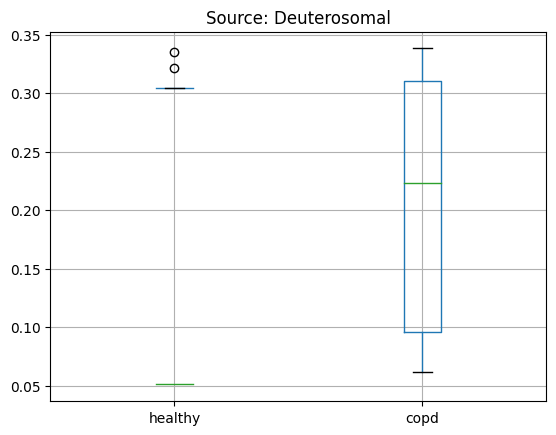

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
 10%|█         | 1/10 [00:00<00:07,  1.17it/s]

nan nan


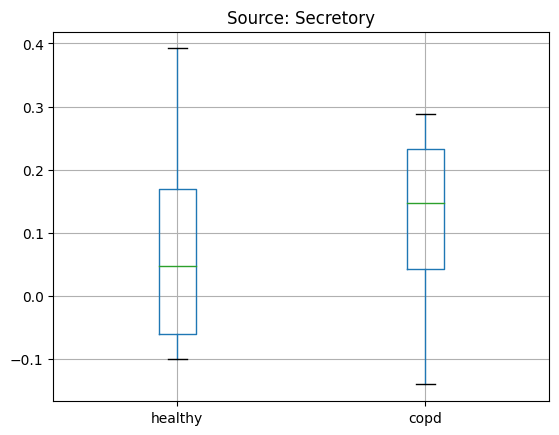

 20%|██        | 2/10 [00:01<00:07,  1.12it/s]

0.7882765520723852 7.8827655207238525


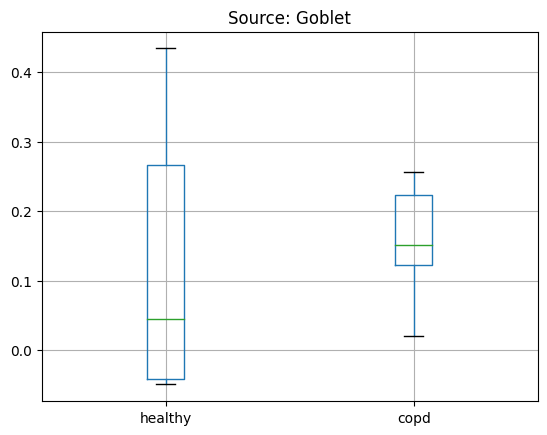

 30%|███       | 3/10 [00:02<00:06,  1.11it/s]

0.7722155435725105 7.722155435725106


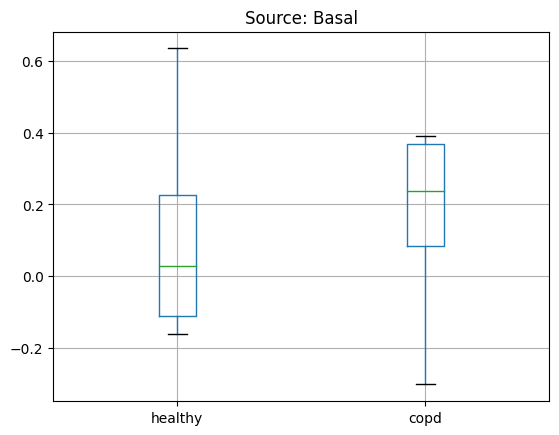

 40%|████      | 4/10 [00:03<00:05,  1.10it/s]

0.7589610307540571 7.589610307540571


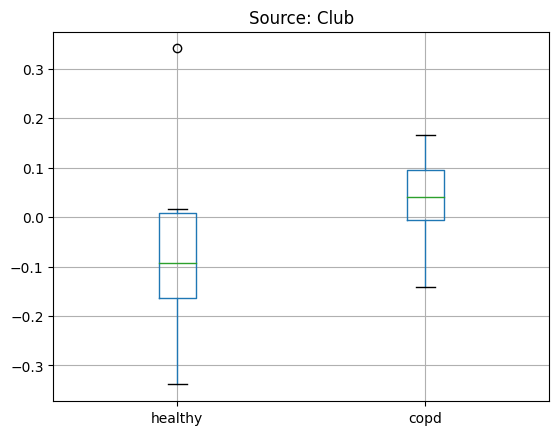

 50%|█████     | 5/10 [00:04<00:04,  1.10it/s]

0.504352978296105 5.04352978296105


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


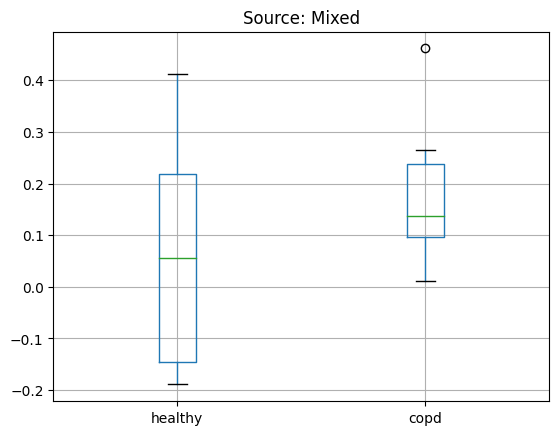

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
 60%|██████    | 6/10 [00:05<00:03,  1.11it/s]

nan nan


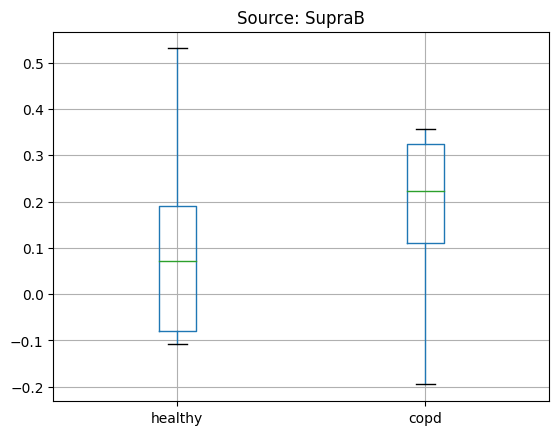

 70%|███████   | 7/10 [00:06<00:02,  1.10it/s]

0.6841492483290896 6.841492483290896


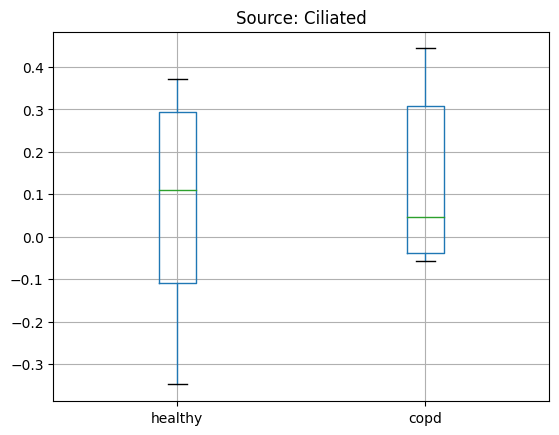

 80%|████████  | 8/10 [00:07<00:01,  1.09it/s]

0.7607979854505919 7.607979854505919


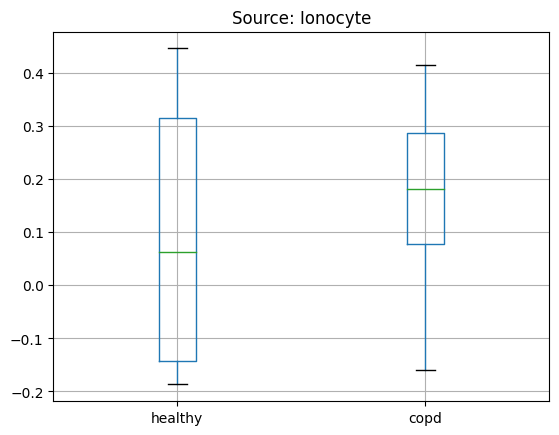

 90%|█████████ | 9/10 [00:08<00:00,  1.09it/s]

0.7302606987464783 7.302606987464783


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


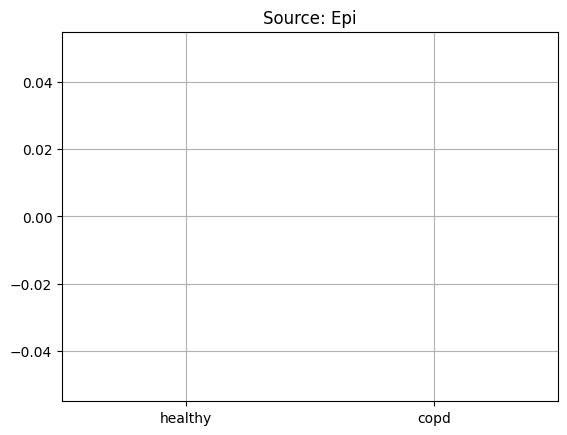

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:7143: RuntimeWarning: invalid value encountered in subtract
  d = (a - b).astype(np.float64)
100%|██████████| 10/10 [00:08<00:00,  1.14it/s]

nan nan


In [19]:
for cell_compartment_source in tqdm(cell_compartments):
    temp_df = df[(df['source'] == cell_compartment_source)]
    values_dict = {}
    for condition in set(context_dict.values()):
        values_dict[condition] = []
    for batch, condition in context_dict.items():
        batch_sum = temp_df[temp_df['batch'] == batch]['magnitude_rank_inverted'].sum()
        values_dict[condition].append(batch_sum)
    values_df = pd.DataFrame.from_dict(values_dict)
    order = ['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav']
    values_df = values_df[order]
    values_logfc_df = pd.DataFrame()
    values_logfc_df['healthy'] = np.log2(values_df['healthy_iav']/values_df['healthy_ctrl'])
    values_logfc_df['copd'] = np.log2(values_df['copd_iav']/values_df['copd_ctrl'])
    plt.figure()
    values_logfc_df.boxplot()
    plt.title(f'Source: {cell_compartment_source}')
    plt.show()
    pval = stats.ttest_rel(values_logfc_df['healthy'], values_logfc_df['copd'])[1]
    pval_corr = pval * len(cell_compartments)
    print(pval, pval_corr)

  0%|          | 0/10 [00:00<?, ?it/s]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in g

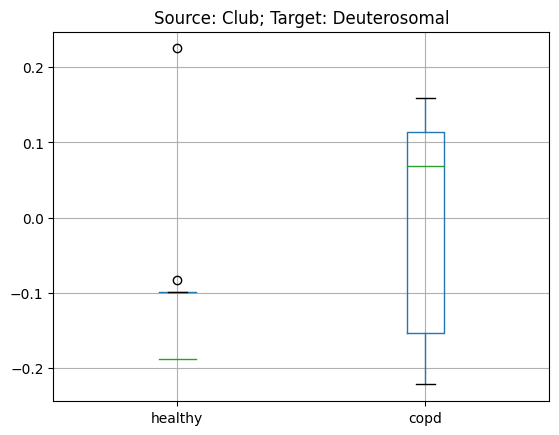

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
 10%|█         | 1/10 [00:00<00:05,  1.77it/s]

nan nan


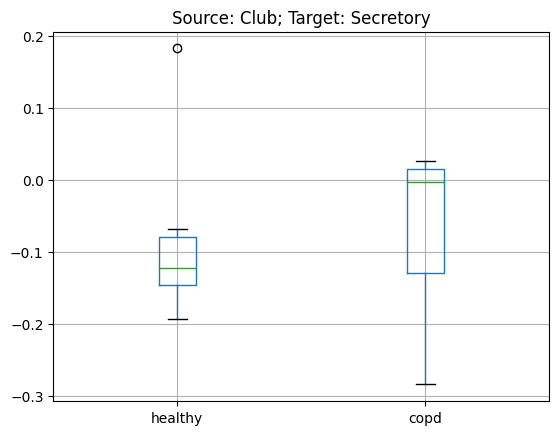

 20%|██        | 2/10 [00:01<00:04,  1.73it/s]

0.9160758356143403 9.160758356143402


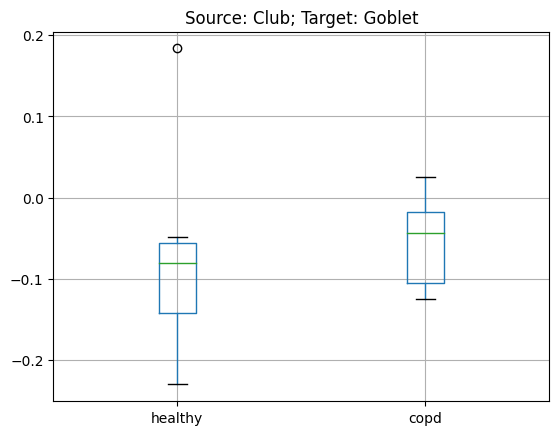

 30%|███       | 3/10 [00:01<00:04,  1.73it/s]

0.8419582682727571 8.41958268272757


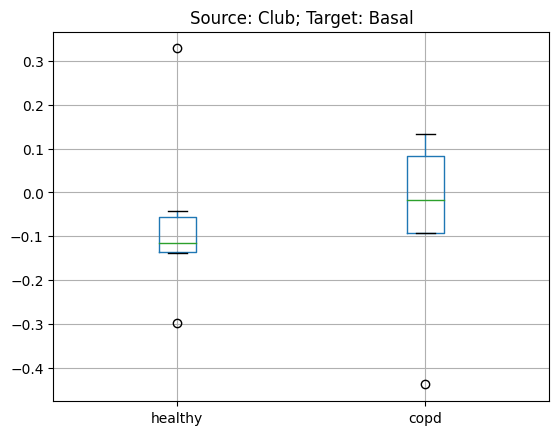

 40%|████      | 4/10 [00:02<00:03,  1.72it/s]

0.9606125641717995 9.606125641717995


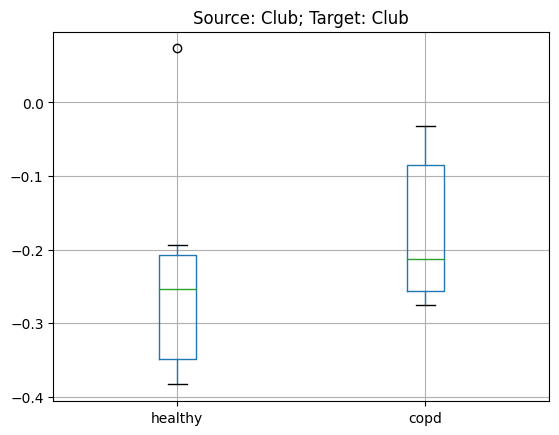

 50%|█████     | 5/10 [00:02<00:02,  1.73it/s]

0.587407694259776 5.87407694259776


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


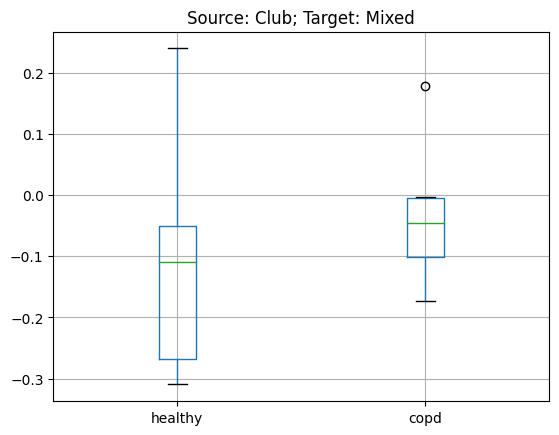

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
 60%|██████    | 6/10 [00:03<00:02,  1.73it/s]

nan nan


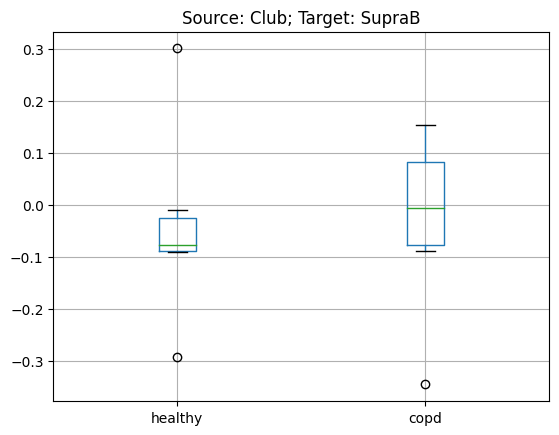

 70%|███████   | 7/10 [00:04<00:01,  1.73it/s]

0.9432757103013978 9.432757103013978


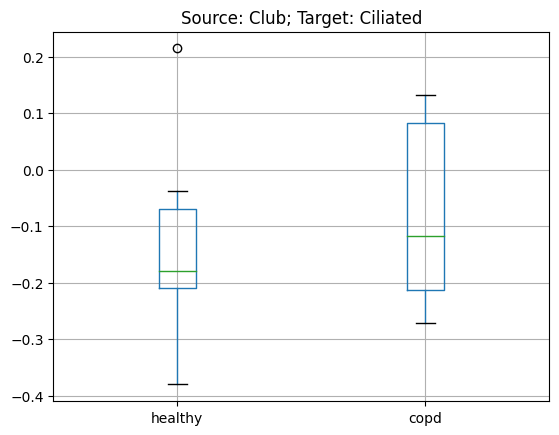

 80%|████████  | 8/10 [00:04<00:01,  1.71it/s]

0.7410213502864852 7.410213502864852


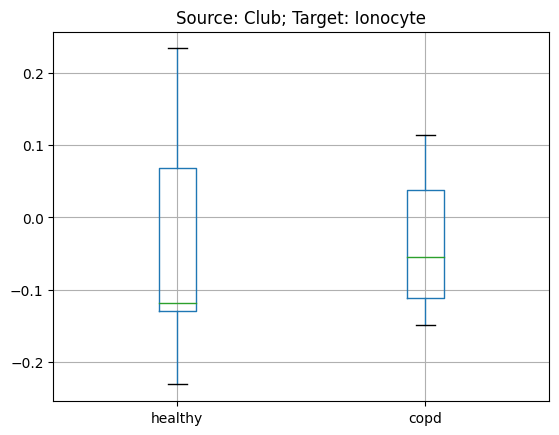

 90%|█████████ | 9/10 [00:05<00:00,  1.71it/s]

0.9635024667475377 9.635024667475378


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


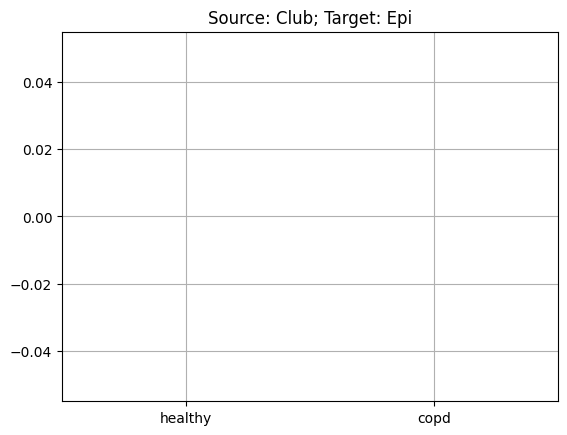

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:7143: RuntimeWarning: invalid value encountered in subtract
  d = (a - b).astype(np.float64)
100%|██████████| 10/10 [00:05<00:00,  1.74it/s]

nan nan


In [20]:
cell_compartment_source = 'Club'
for cell_compartment_target in tqdm(cell_compartments):
    temp_df = df[(df['source'] == cell_compartment_source) & (df['target'] == cell_compartment_target)]
    values_dict = {}
    for condition in set(context_dict.values()):
        values_dict[condition] = []
    for batch, condition in context_dict.items():
        batch_sum = temp_df[temp_df['batch'] == batch]['magnitude_rank_inverted'].sum()
        values_dict[condition].append(batch_sum)
    values_df = pd.DataFrame.from_dict(values_dict)
    order = ['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav']
    values_df = values_df[order]
    values_logfc_df = pd.DataFrame()
    values_logfc_df['healthy'] = np.log2(values_df['healthy_iav']/values_df['healthy_ctrl'])
    values_logfc_df['copd'] = np.log2(values_df['copd_iav']/values_df['copd_ctrl'])
    plt.figure()
    values_logfc_df.boxplot()
    plt.title(f'Source: {cell_compartment_source}; Target: {cell_compartment_target}')
    plt.show()
    pval = stats.ttest_rel(values_logfc_df['healthy'], values_logfc_df['copd'])[1]
    pval_corr = pval * len(cell_compartments)
    print(pval, pval_corr)

  0%|          | 0/10 [00:00<?, ?it/s]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in g

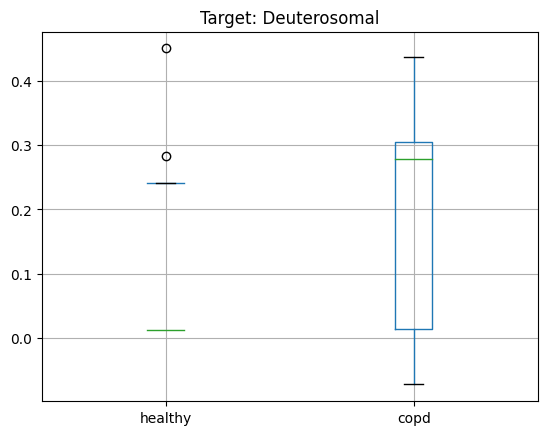

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
 10%|█         | 1/10 [00:00<00:07,  1.22it/s]

nan nan


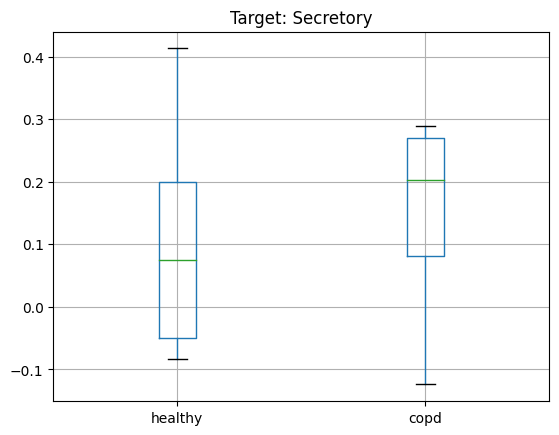

 20%|██        | 2/10 [00:01<00:07,  1.14it/s]

0.7223762907666598 7.223762907666598


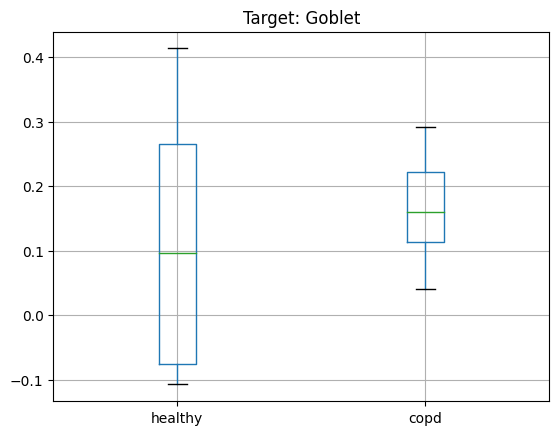

 30%|███       | 3/10 [00:02<00:06,  1.11it/s]

0.683070970931854 6.83070970931854


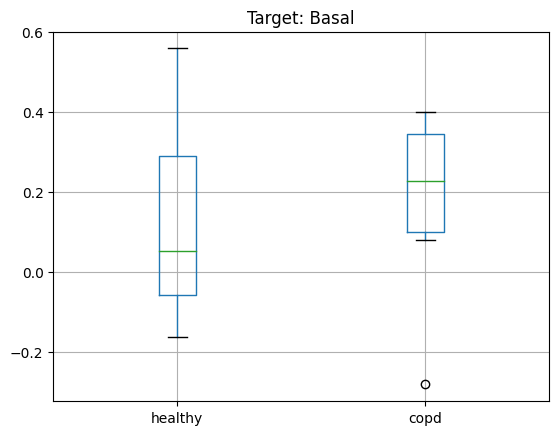

 40%|████      | 4/10 [00:03<00:05,  1.11it/s]

0.8240725524753145 8.240725524753145


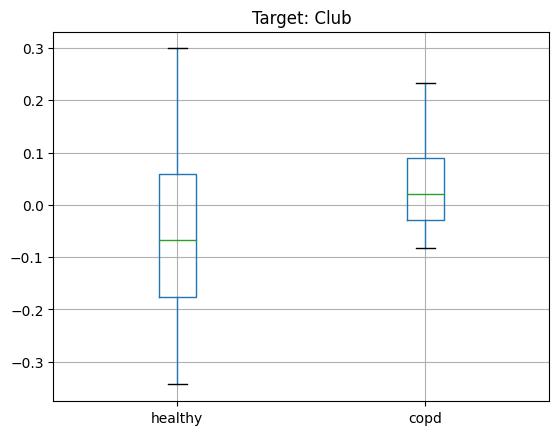

 50%|█████     | 5/10 [00:04<00:04,  1.11it/s]

0.5068707126385428 5.068707126385428


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


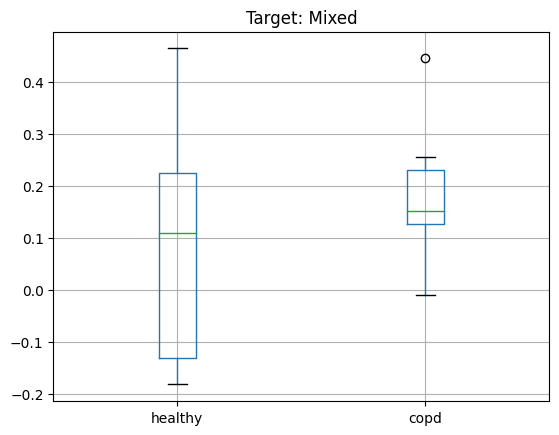

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
 60%|██████    | 6/10 [00:05<00:03,  1.11it/s]

nan nan


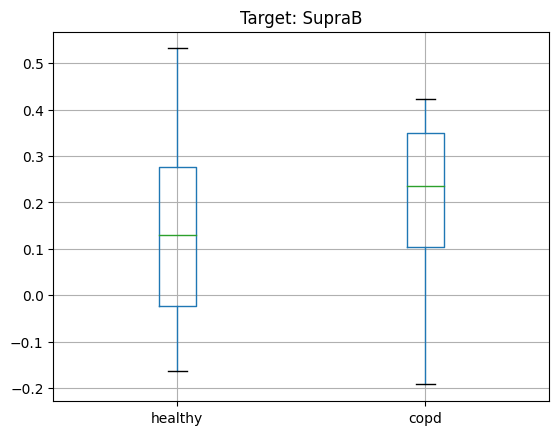

 70%|███████   | 7/10 [00:06<00:02,  1.10it/s]

0.7827790186012787 7.827790186012788


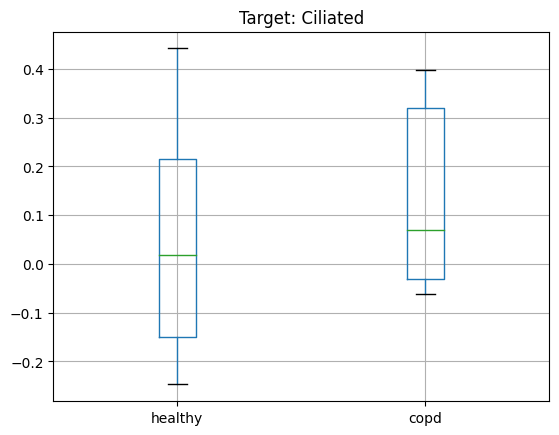

 80%|████████  | 8/10 [00:07<00:01,  1.09it/s]

0.6749166877672104 6.749166877672104


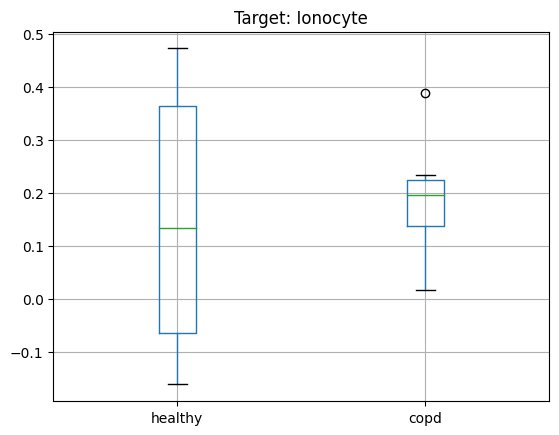

 90%|█████████ | 9/10 [00:08<00:00,  1.10it/s]

0.7889883021527773 7.889883021527773


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


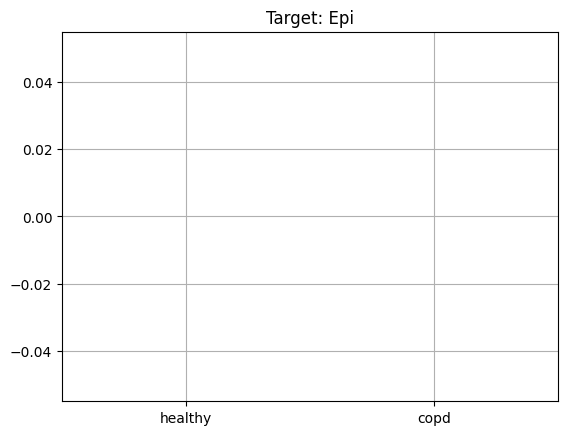

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:7143: RuntimeWarning: invalid value encountered in subtract
  d = (a - b).astype(np.float64)
100%|██████████| 10/10 [00:08<00:00,  1.15it/s]

nan nan


In [21]:
for cell_compartment_target in tqdm(cell_compartments):
    temp_df = df[(df['target'] == cell_compartment_target)]
    values_dict = {}
    for condition in set(context_dict.values()):
        values_dict[condition] = []
    for batch, condition in context_dict.items():
        batch_sum = temp_df[temp_df['batch'] == batch]['magnitude_rank_inverted'].sum()
        values_dict[condition].append(batch_sum)
    values_df = pd.DataFrame.from_dict(values_dict)
    order = ['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav']
    values_df = values_df[order]
    values_logfc_df = pd.DataFrame()
    values_logfc_df['healthy'] = np.log2(values_df['healthy_iav']/values_df['healthy_ctrl'])
    values_logfc_df['copd'] = np.log2(values_df['copd_iav']/values_df['copd_ctrl'])
    plt.figure()
    values_logfc_df.boxplot()
    plt.title(f'Target: {cell_compartment_target}')
    plt.show()
    pval = stats.ttest_rel(values_logfc_df['healthy'], values_logfc_df['copd'])[1]
    pval_corr = pval * len(cell_compartments)
    print(pval, pval_corr)

  0%|          | 0/10 [00:00<?, ?it/s]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in g

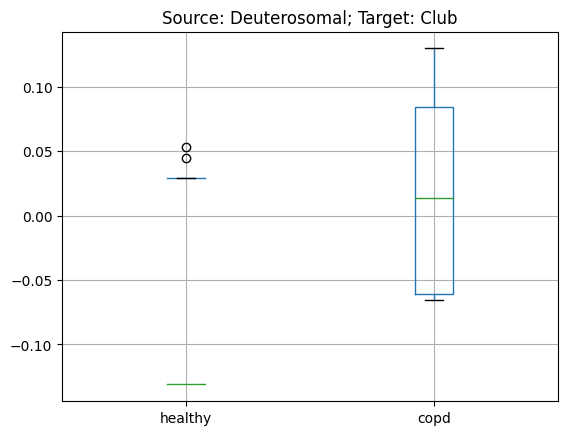

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
 10%|█         | 1/10 [00:00<00:05,  1.78it/s]

nan nan


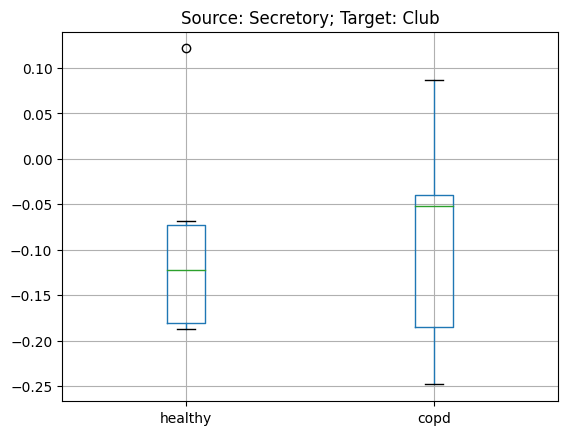

 20%|██        | 2/10 [00:01<00:04,  1.75it/s]

0.9503246136433368 9.503246136433368


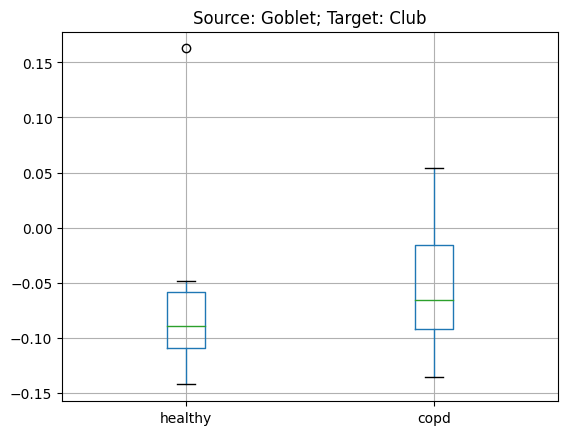

 30%|███       | 3/10 [00:01<00:04,  1.72it/s]

0.9824856714177368 9.824856714177368


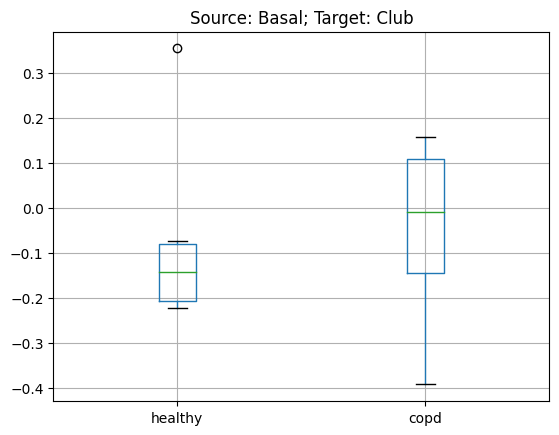

 40%|████      | 4/10 [00:02<00:03,  1.73it/s]

0.8739636342384978 8.739636342384978


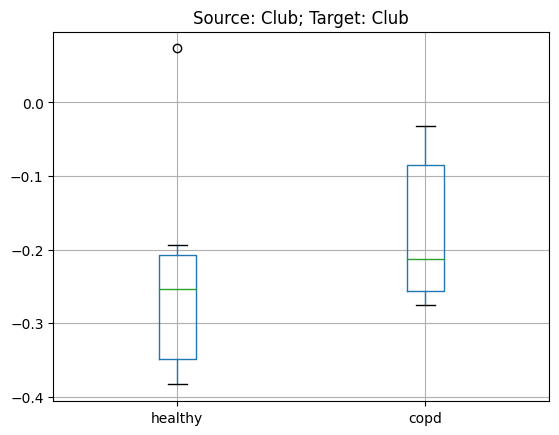

 50%|█████     | 5/10 [00:02<00:02,  1.75it/s]

0.587407694259776 5.87407694259776


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


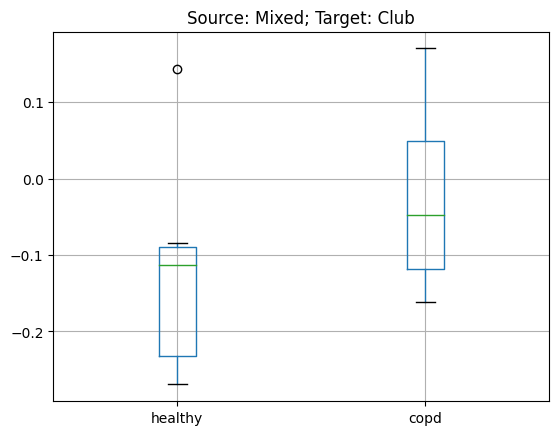

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean
 60%|██████    | 6/10 [00:03<00:02,  1.77it/s]

nan nan


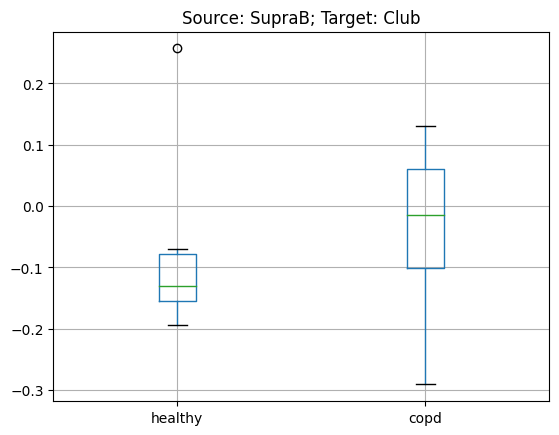

 70%|███████   | 7/10 [00:03<00:01,  1.77it/s]

0.7850868170541355 7.850868170541355


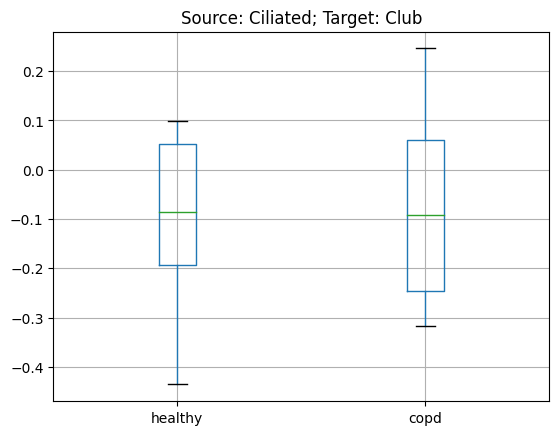

 80%|████████  | 8/10 [00:04<00:01,  1.76it/s]

0.8423731593618147 8.423731593618147


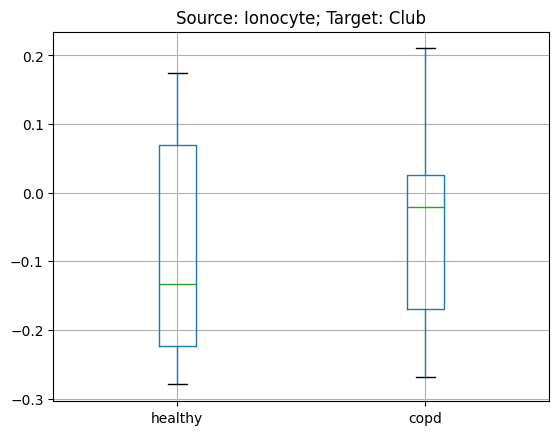

 90%|█████████ | 9/10 [00:05<00:00,  1.74it/s]

0.8220280085846388 8.220280085846387


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


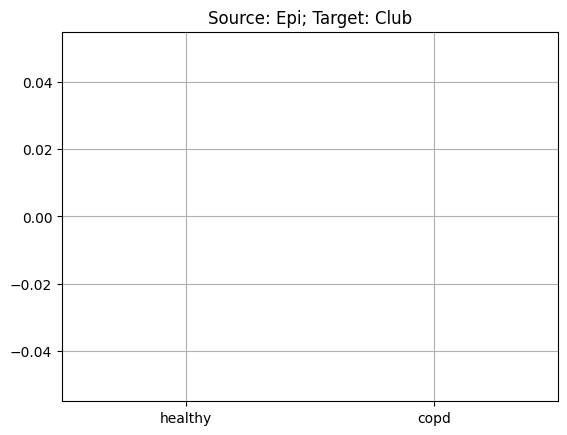

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:7143: RuntimeWarning: invalid value encountered in subtract
  d = (a - b).astype(np.float64)
100%|██████████| 10/10 [00:05<00:00,  1.76it/s]

nan nan


In [22]:
cell_compartment_target = 'Club'
for cell_compartment_source in tqdm(cell_compartments):
    temp_df = df[(df['source'] == cell_compartment_source) & (df['target'] == cell_compartment_target)]
    values_dict = {}
    for condition in set(context_dict.values()):
        values_dict[condition] = []
    for batch, condition in context_dict.items():
        batch_sum = temp_df[temp_df['batch'] == batch]['magnitude_rank_inverted'].sum()
        values_dict[condition].append(batch_sum)
    values_df = pd.DataFrame.from_dict(values_dict)
    order = ['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav']
    values_df = values_df[order]
    values_logfc_df = pd.DataFrame()
    values_logfc_df['healthy'] = np.log2(values_df['healthy_iav']/values_df['healthy_ctrl'])
    values_logfc_df['copd'] = np.log2(values_df['copd_iav']/values_df['copd_ctrl'])
    plt.figure()
    values_logfc_df.boxplot()
    plt.title(f'Source: {cell_compartment_source}; Target: {cell_compartment_target}')
    plt.show()
    pval = stats.ttest_rel(values_logfc_df['healthy'], values_logfc_df['copd'])[1]
    pval_corr = pval * len(cell_compartments)
    print(pval, pval_corr)

In [23]:
set(progeny[progeny['source'] == 'Androgen']['target'])
set(progeny['source'])

{'Androgen',
 'EGFR',
 'Estrogen',
 'Hypoxia',
 'JAK-STAT',
 'MAPK',
 'NFkB',
 'PI3K',
 'TGFb',
 'TNFa',
 'Trail',
 'VEGF',
 'WNT',
 'p53'}

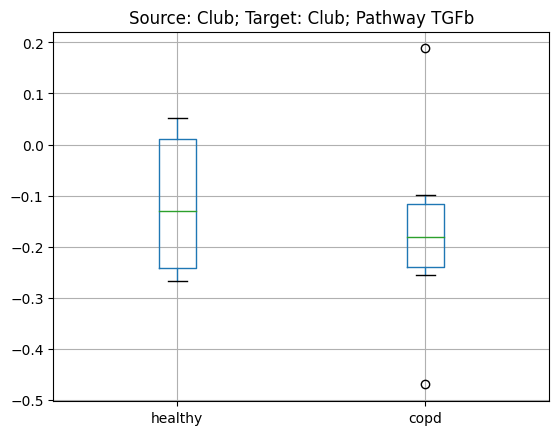

0.6418734341261406 6.418734341261406


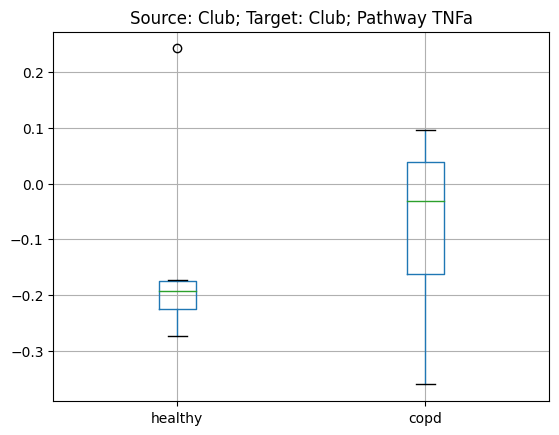

0.6528418723977758 6.528418723977758


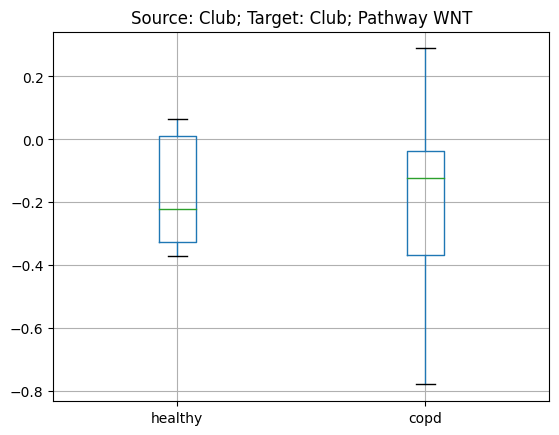

0.896753629423453 8.967536294234531


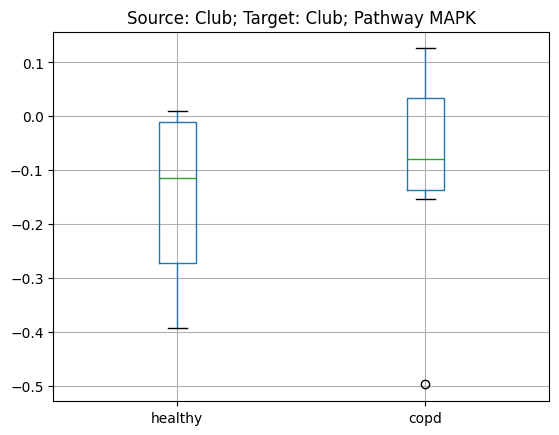

0.7425427433849885 7.425427433849885


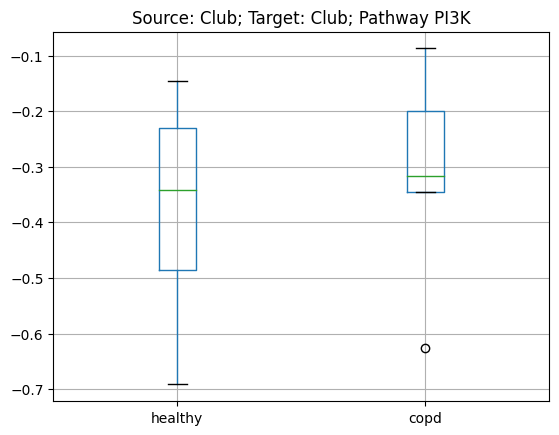

0.6830830440346545 6.830830440346545


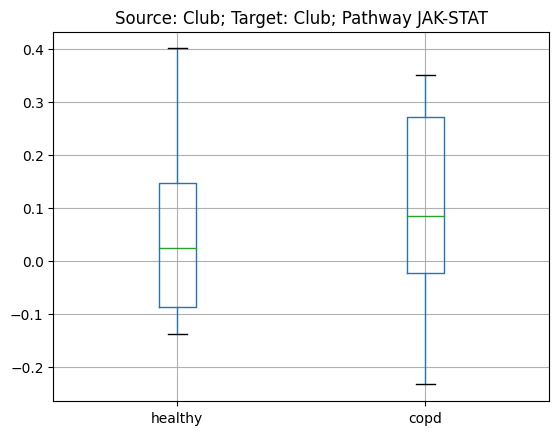

0.8501199183978358 8.501199183978358


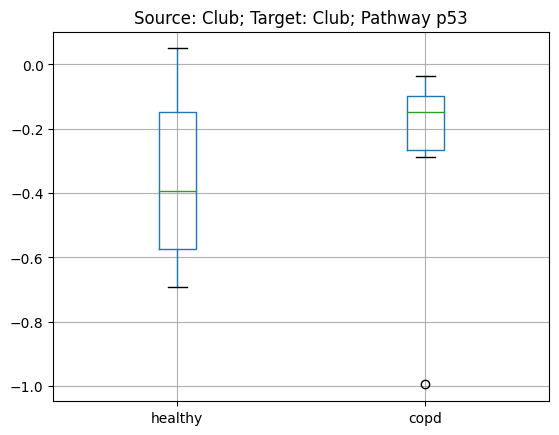

0.7931964588188468 7.931964588188468


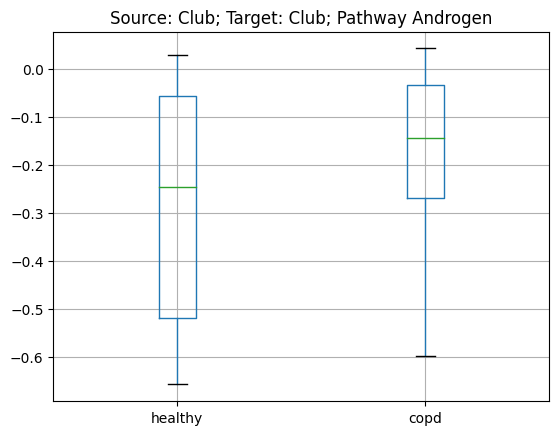

0.6572115388598847 6.5721153885988475


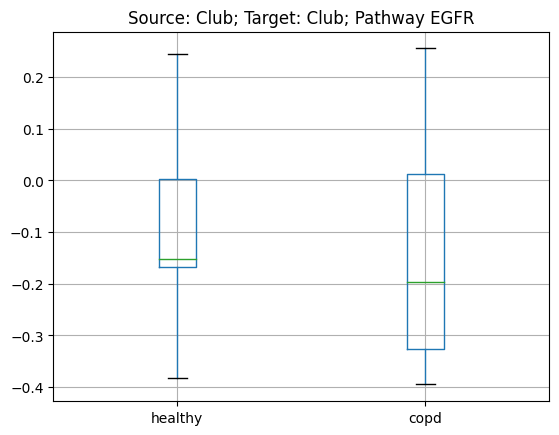

0.8060661529917145 8.060661529917144


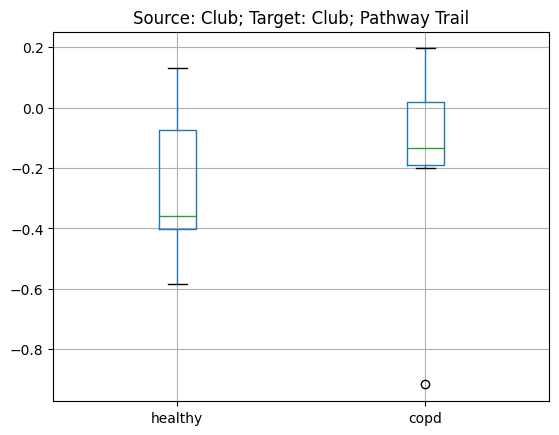

0.7550483555518307 7.550483555518307


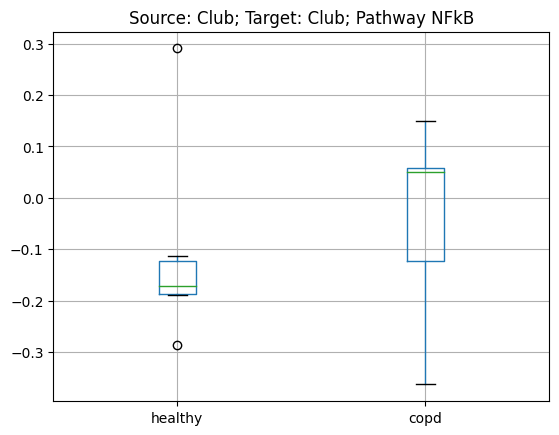

0.6475637743869175 6.475637743869175


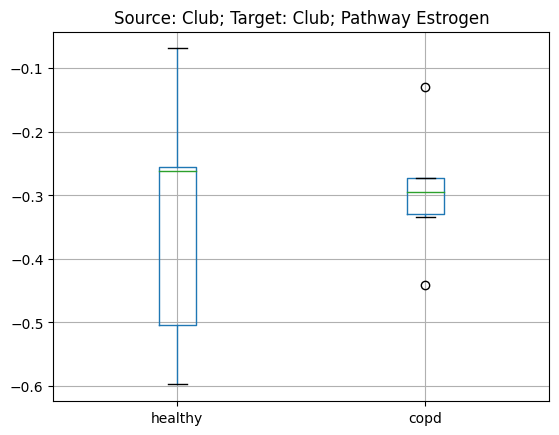

0.7135157236830809 7.135157236830809


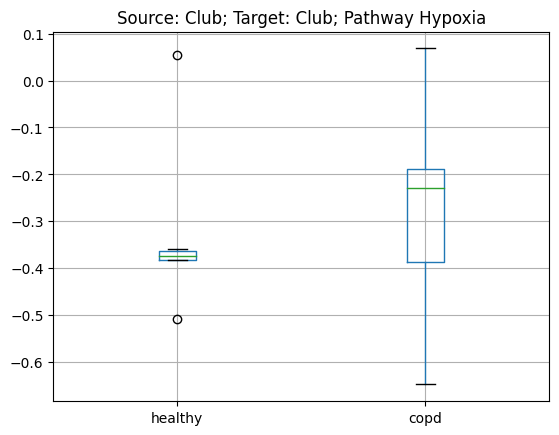

0.766341428333933 7.66341428333933


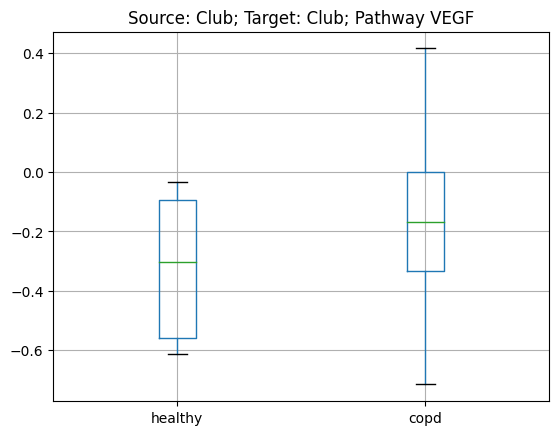

0.5412049370185517 5.412049370185517


In [24]:
cell_compartment_target = 'Club'
cell_compartment_source = 'Club'
pathway_dict = {source: set(progeny[progeny['source'] == source]['target']) for source in set(progeny['source'])}
for source, target in pathway_dict.items():
    temp_df = df[(df['source'] == cell_compartment_source) & (df['target'] == cell_compartment_target) & ((df['ligand_complex'].isin(target)) | (df['receptor_complex'].isin(target)))]
    values_dict = {}
    for condition in set(context_dict.values()):
        values_dict[condition] = []
    for batch, condition in context_dict.items():
        batch_sum = temp_df[temp_df['batch'] == batch]['magnitude_rank_inverted'].sum()
        values_dict[condition].append(batch_sum)
    values_df = pd.DataFrame.from_dict(values_dict)
    order = ['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav']
    values_df = values_df[order]
    values_logfc_df = pd.DataFrame()
    values_logfc_df['healthy'] = np.log2(values_df['healthy_iav']/values_df['healthy_ctrl'])
    values_logfc_df['copd'] = np.log2(values_df['copd_iav']/values_df['copd_ctrl'])
    plt.figure()
    values_logfc_df.boxplot()
    plt.title(f'Source: {cell_compartment_source}; Target: {cell_compartment_target}; Pathway {source}')
    plt.show()
    pval = stats.ttest_rel(values_logfc_df['healthy'], values_logfc_df['copd'])[1]
    pval_corr = pval * len(cell_compartments)
    print(pval, pval_corr)

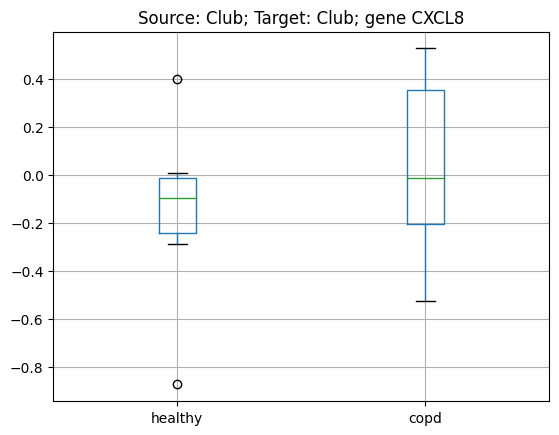

0.5657257614621832 5.657257614621832


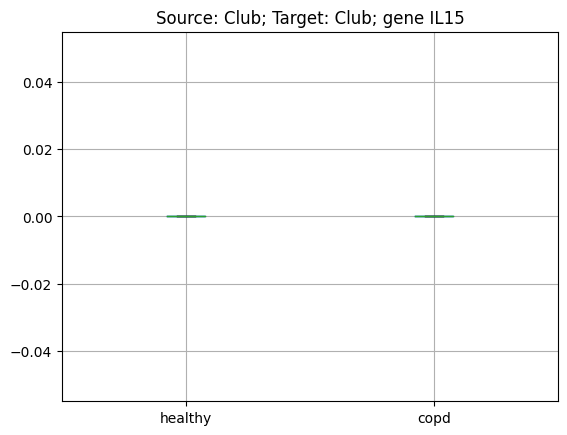

nan nan


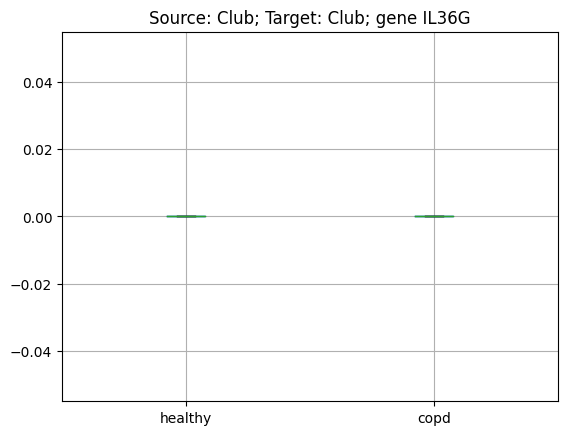

nan nan


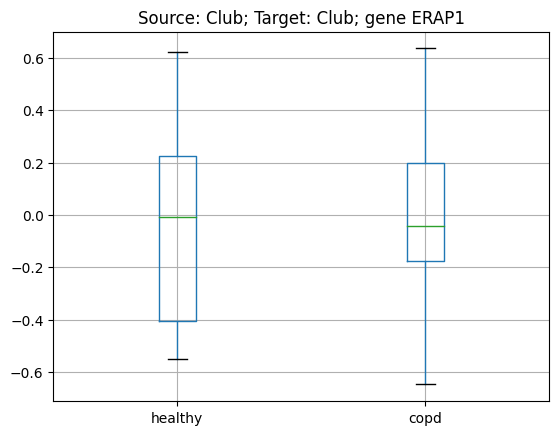

0.9469924663556002 9.469924663556002


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


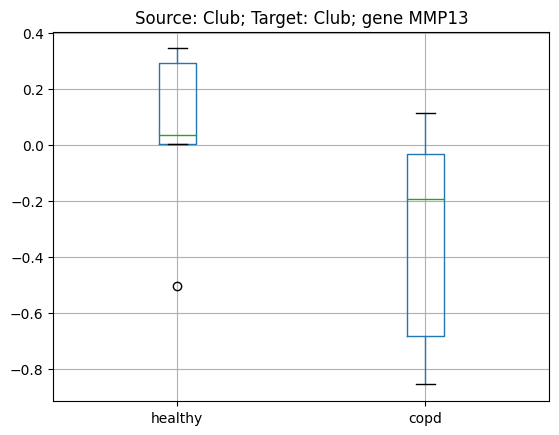

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


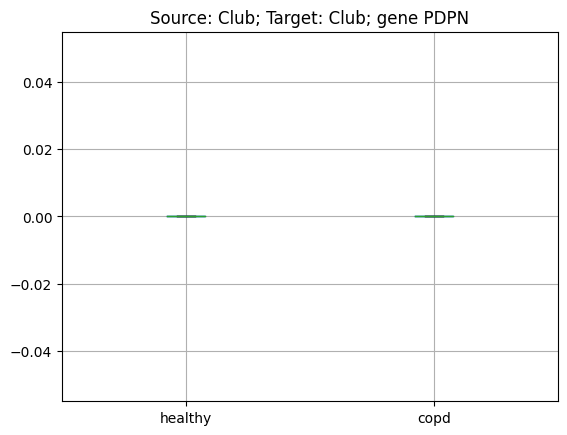

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/scipy/stats/_stats_py.py:1182: RuntimeWarning: invalid value encountered in subtract
  a_zero_mean = a - mean


nan nan


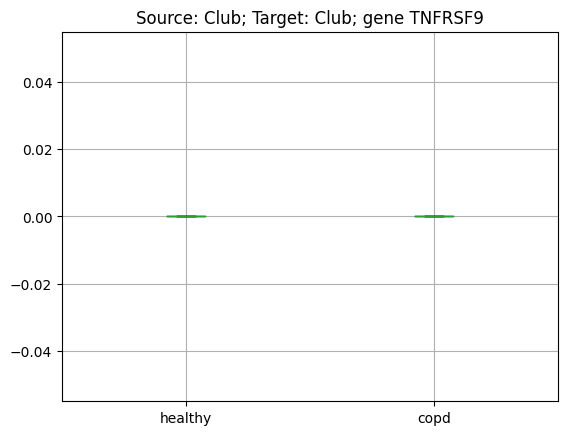

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


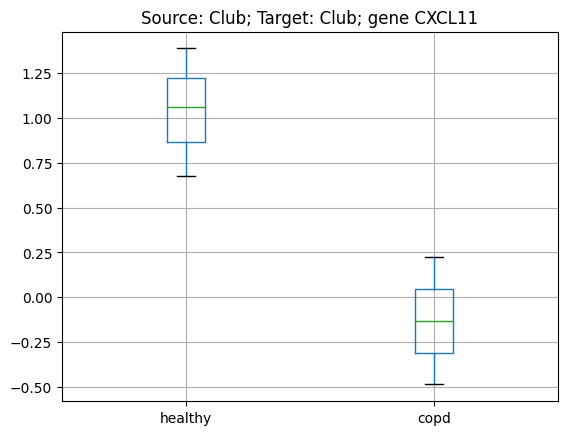

nan nan


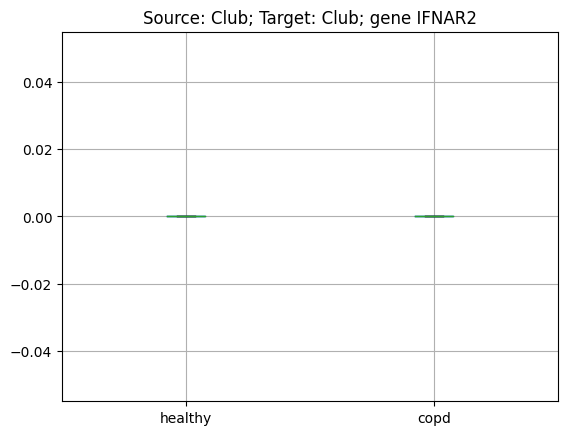

nan nan


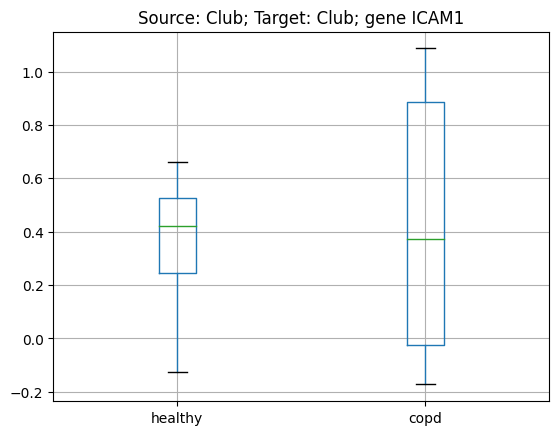

0.8283217801613934 8.283217801613933


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


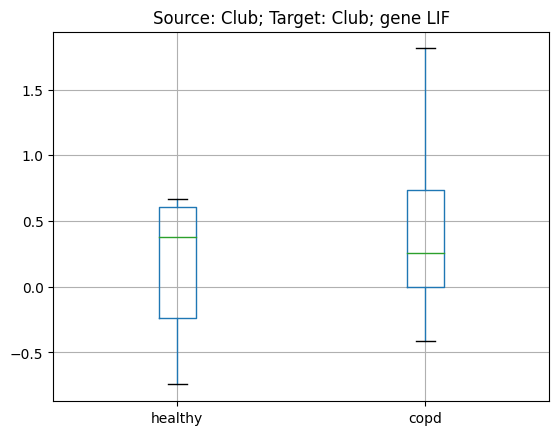

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


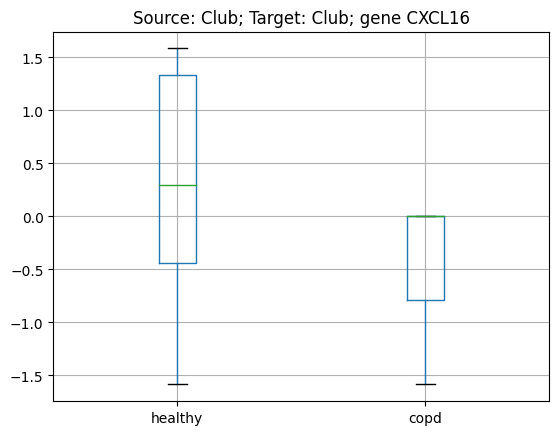

nan nan


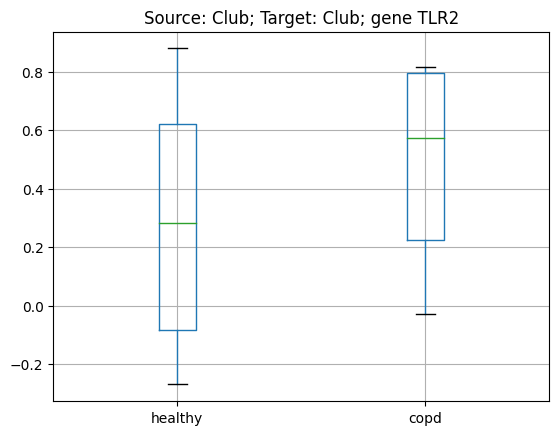

0.5716740956612709 5.716740956612709


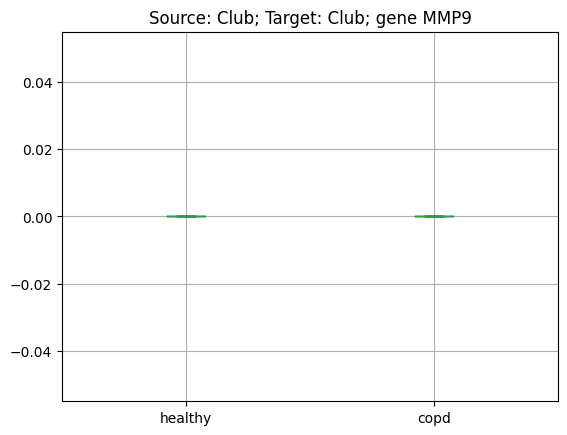

nan nan


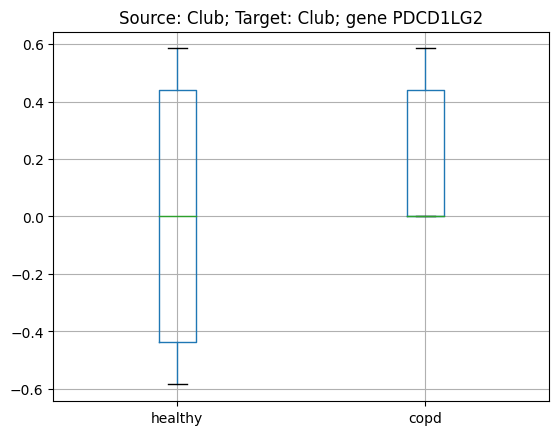

0.4650226382607571 4.650226382607571


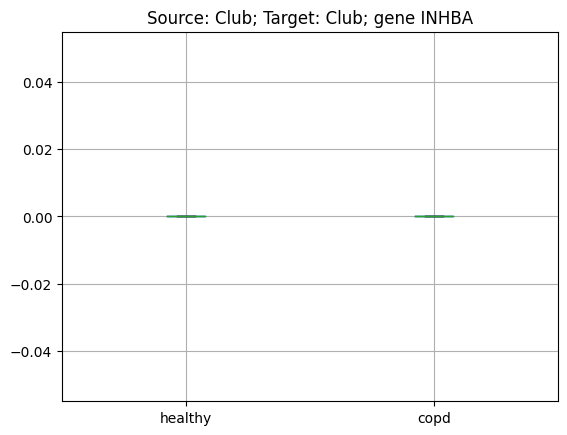

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


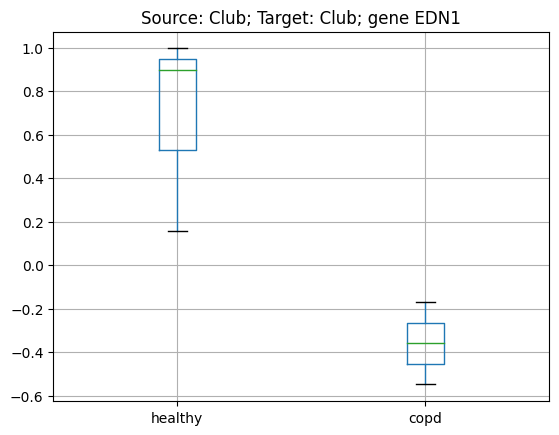

nan nan


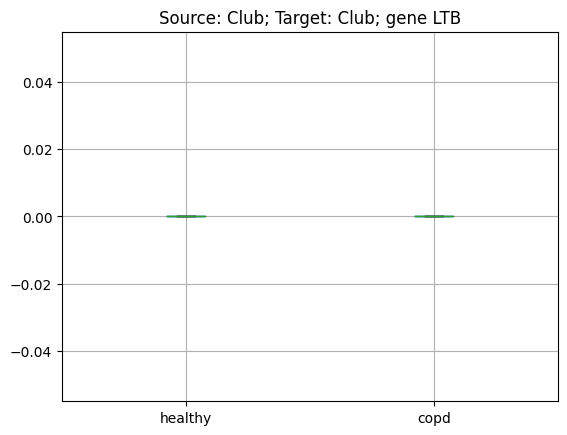

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


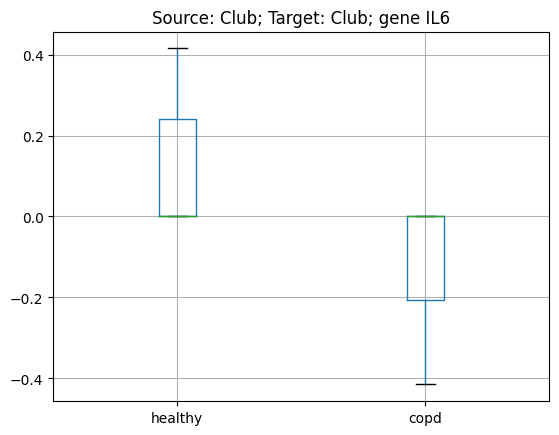

nan nan


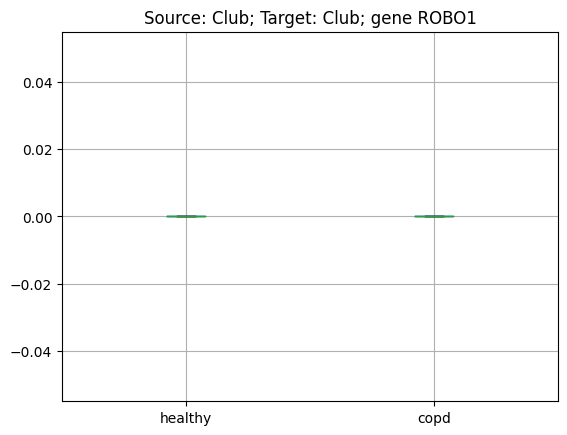

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


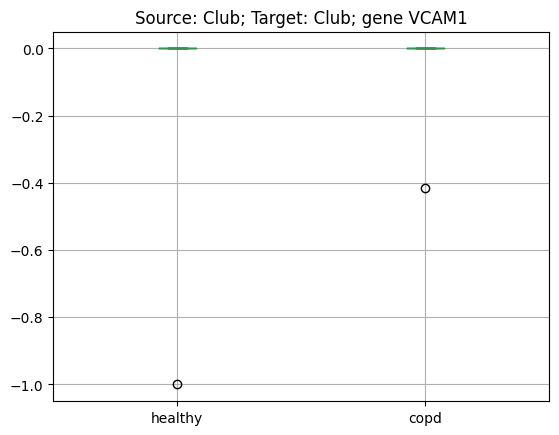

nan nan


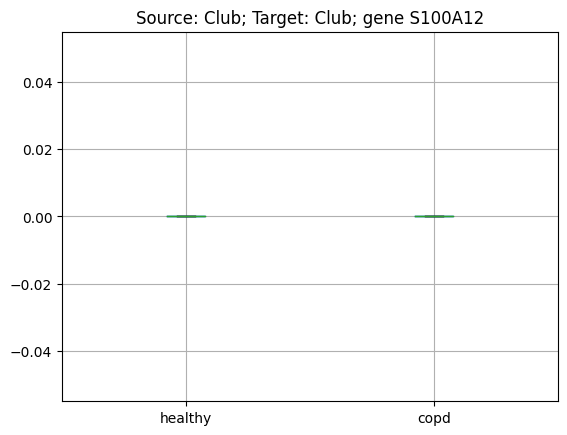

nan nan


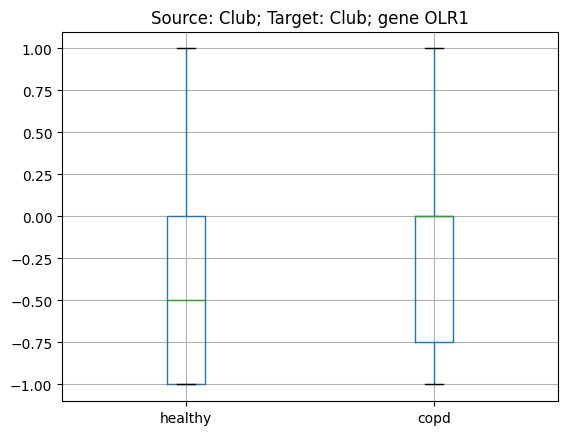

0.7411538220687438 7.411538220687438


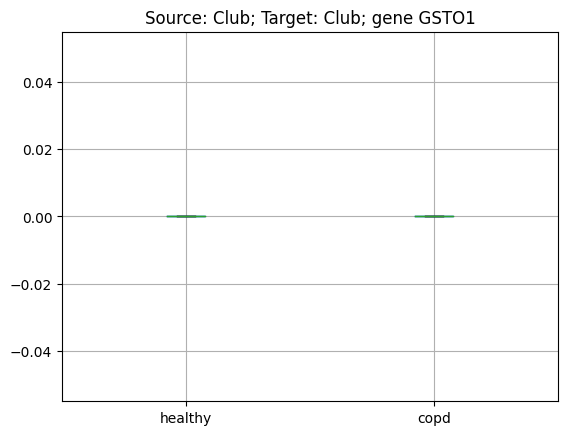

nan nan


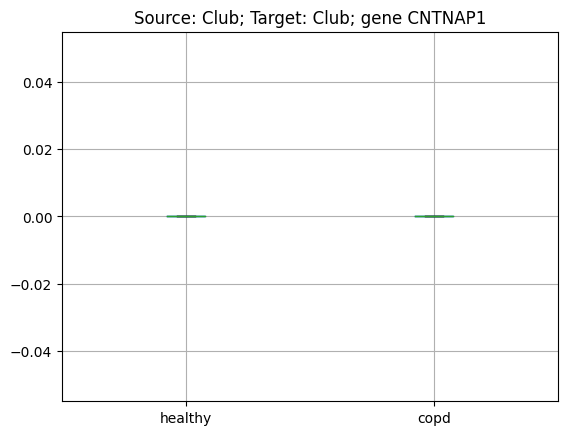

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


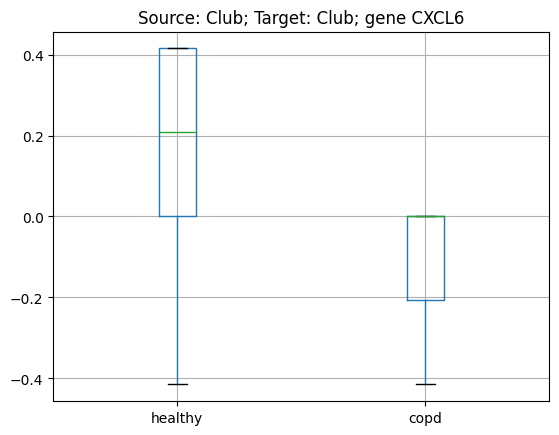

nan nan


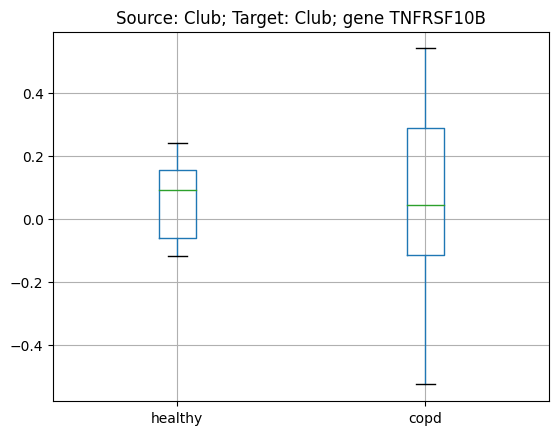

0.9591718769452392 9.591718769452392


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


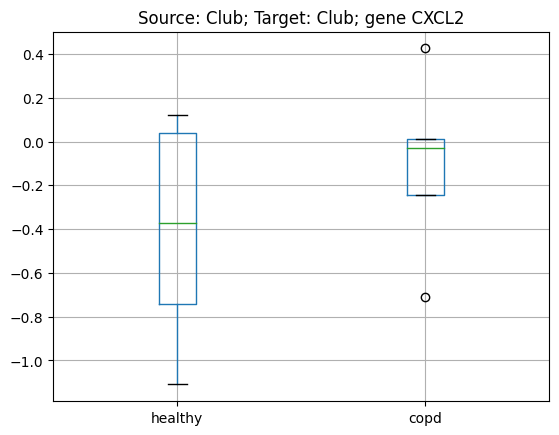

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


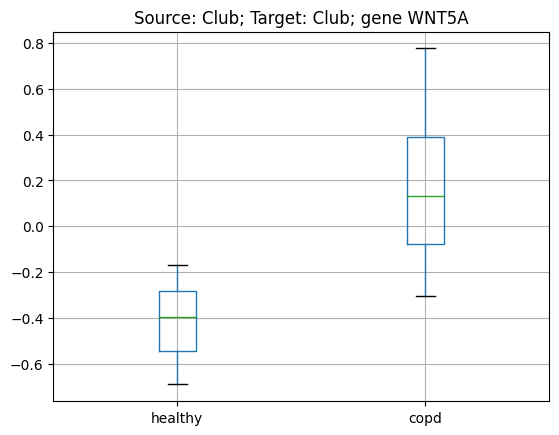

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/

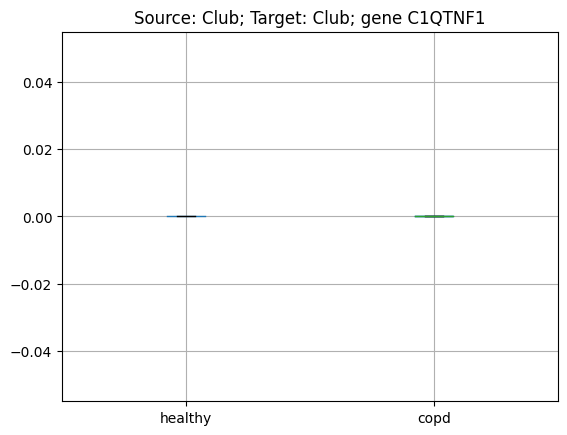

nan nan


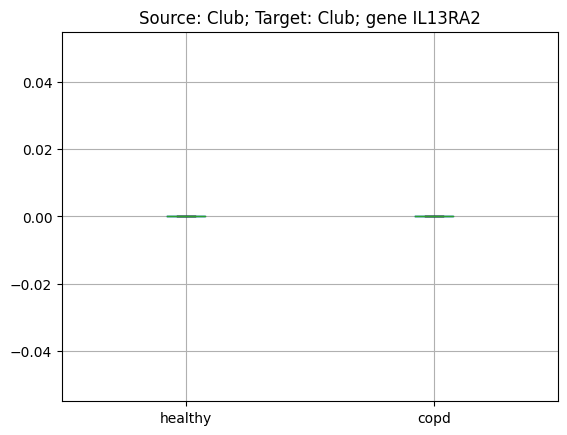

nan nan


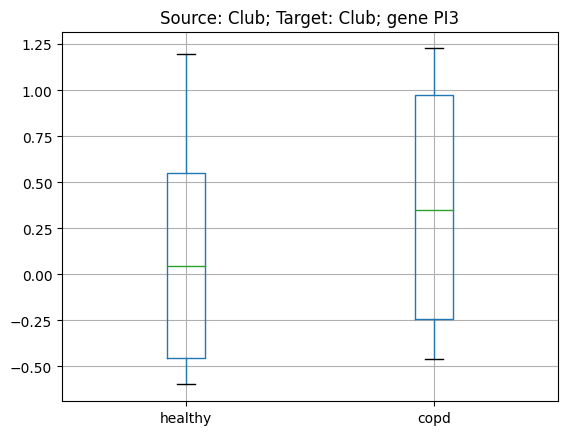

0.6440429961048574 6.440429961048574


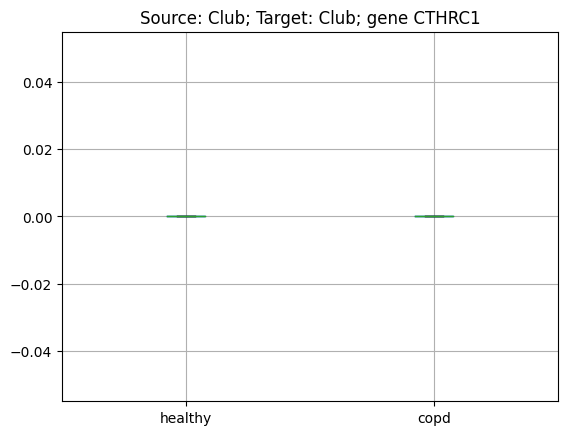

nan nan


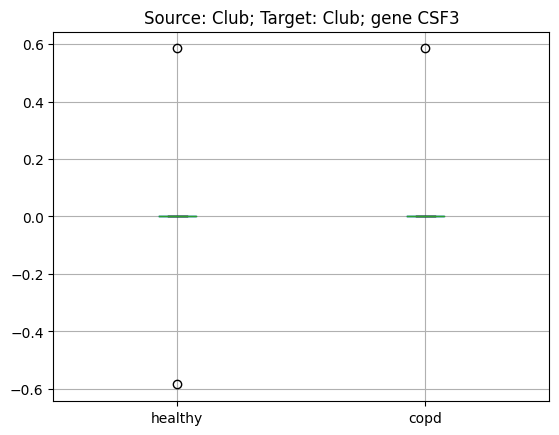

0.695192295931711 6.951922959317109


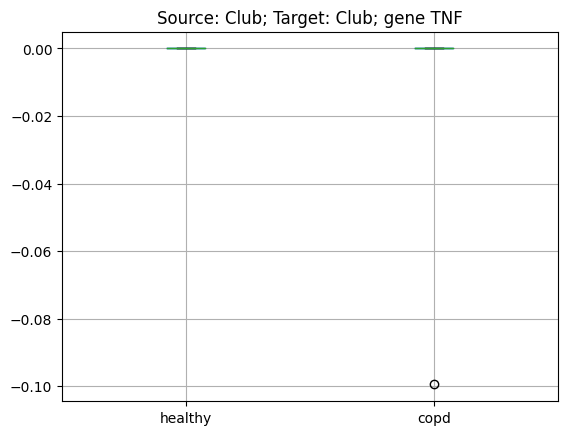

0.36321746764912255 3.6321746764912257


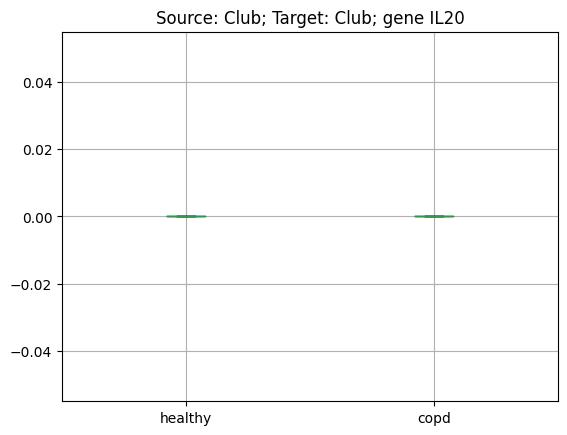

nan nan


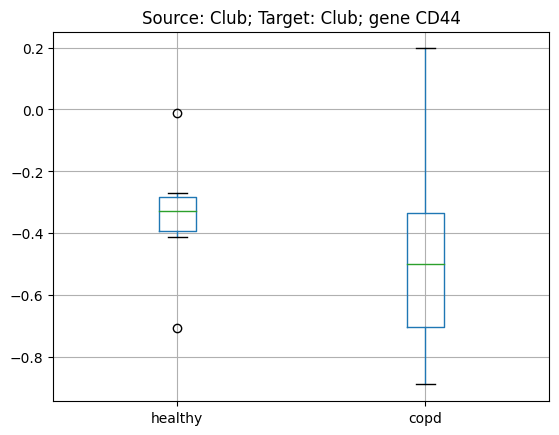

0.5487331829109208 5.487331829109207


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


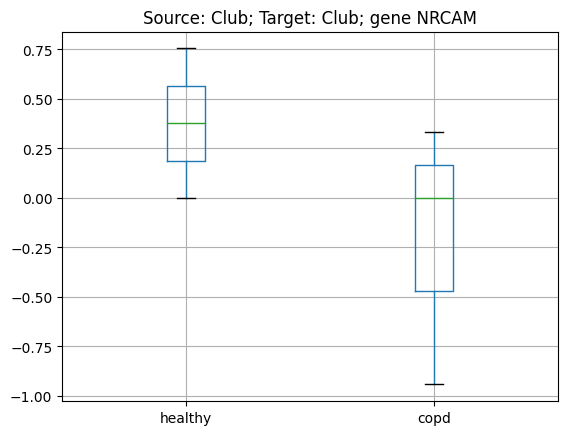

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


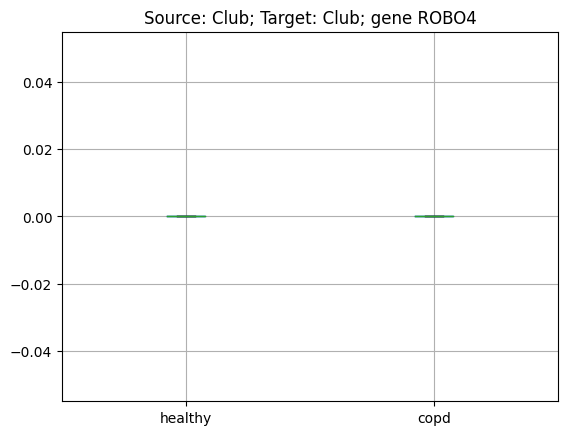

nan nan


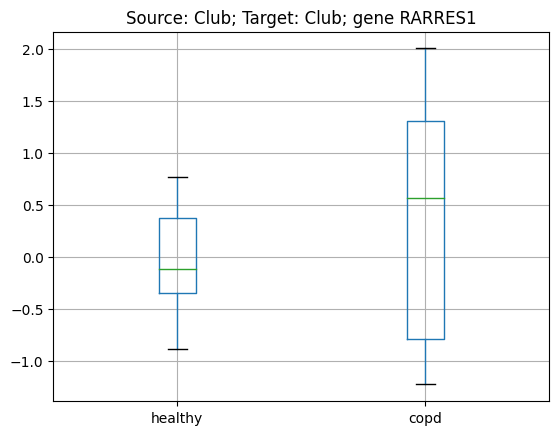

0.6091267334196286 6.091267334196287


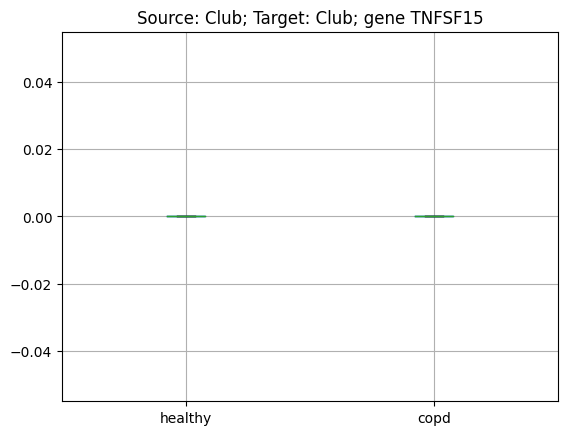

nan nan


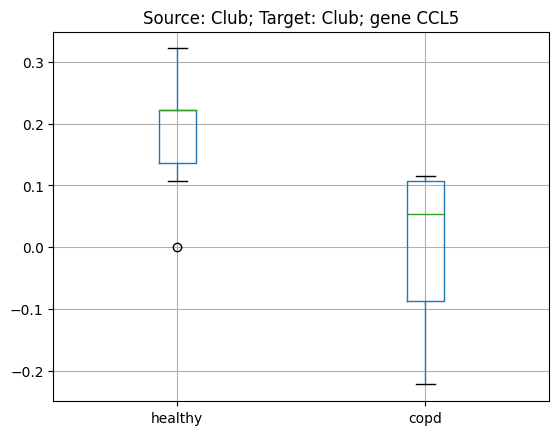

0.05736454519221208 0.5736454519221208


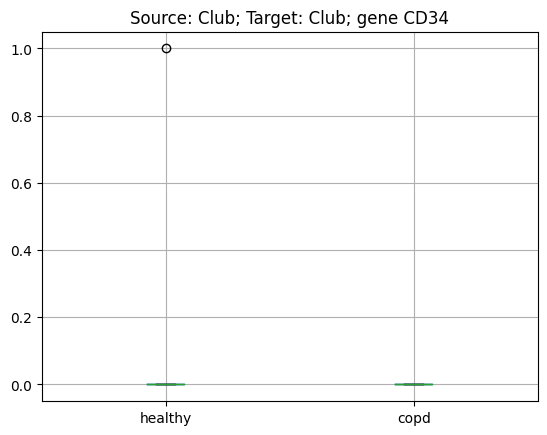

0.36321746764912255 3.6321746764912257


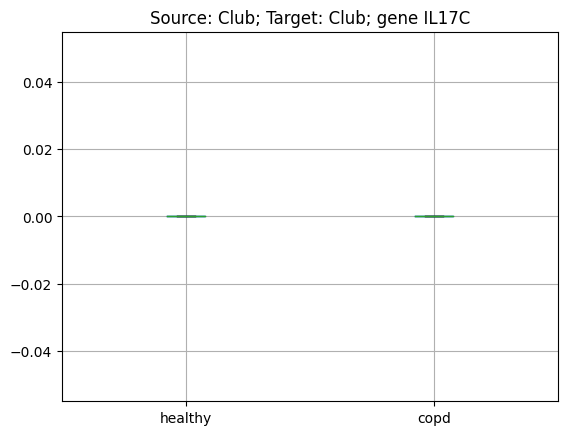

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


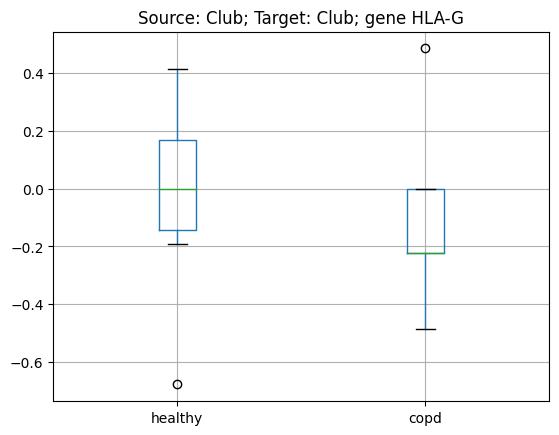

nan nan


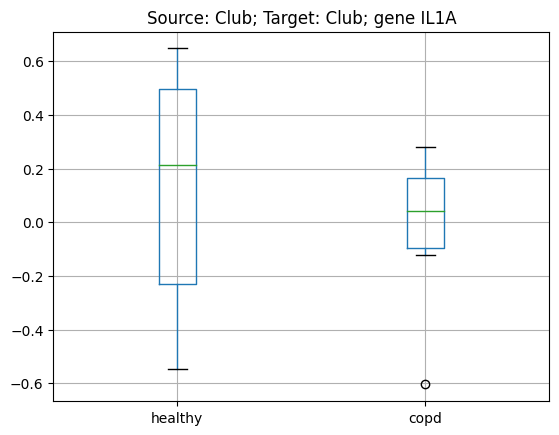

0.5744516704823915 5.744516704823916


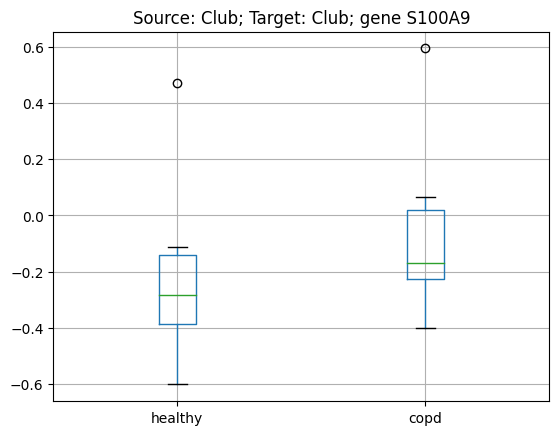

0.5818427771126735 5.818427771126736


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


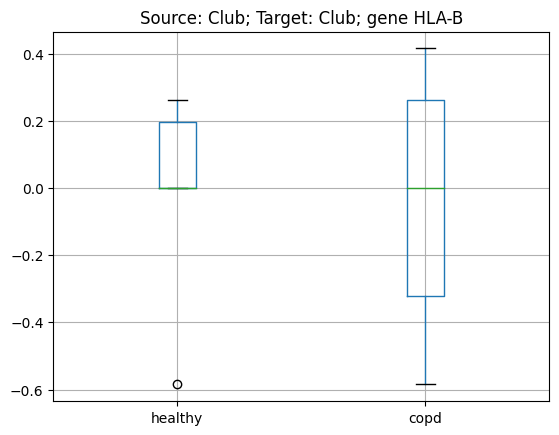

nan nan


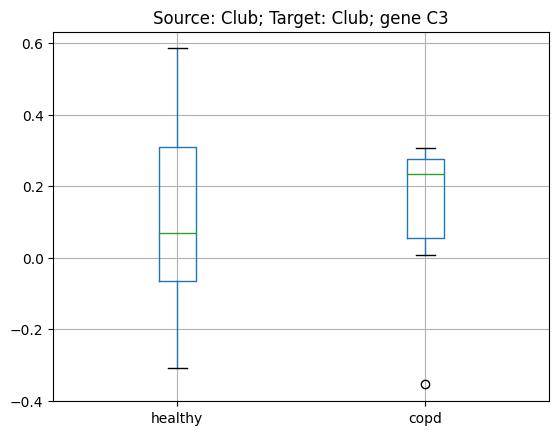

0.9885760488547751 9.885760488547751


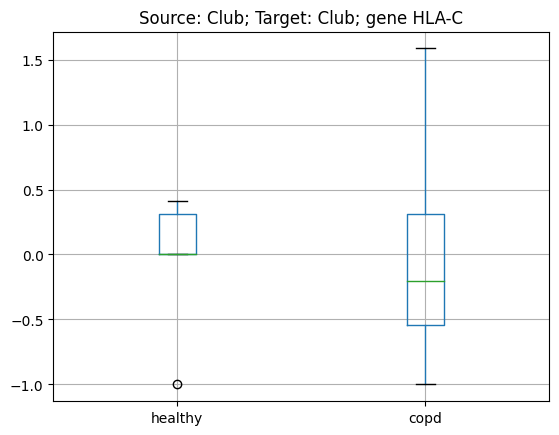

0.9618871478661015 9.618871478661015


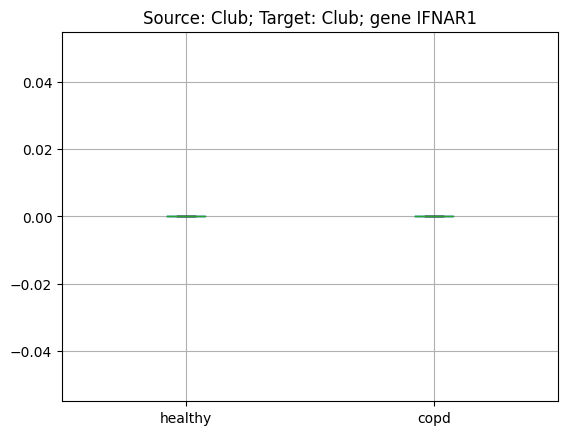

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


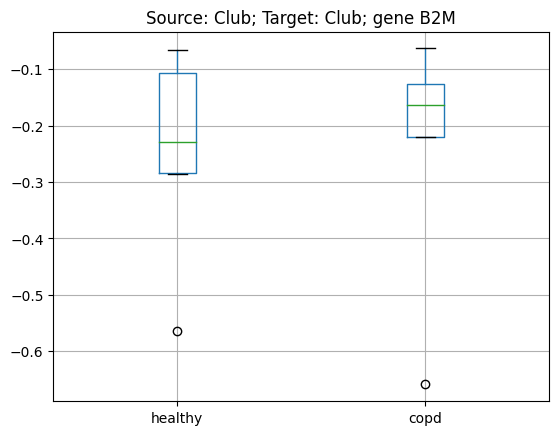

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


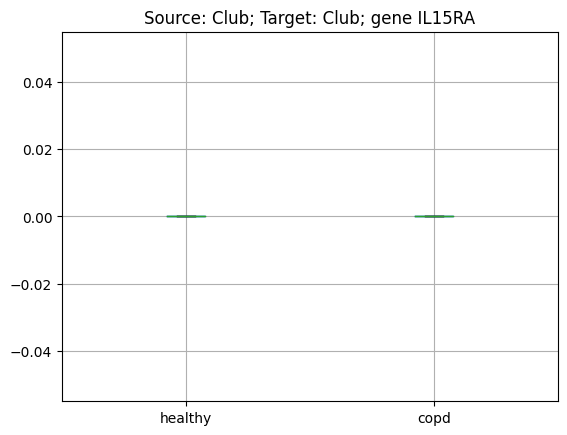

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


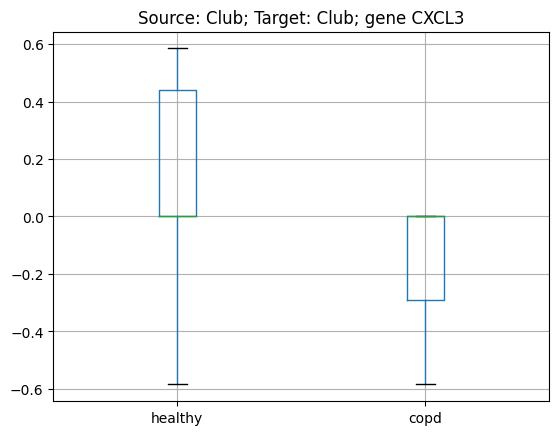

nan nan


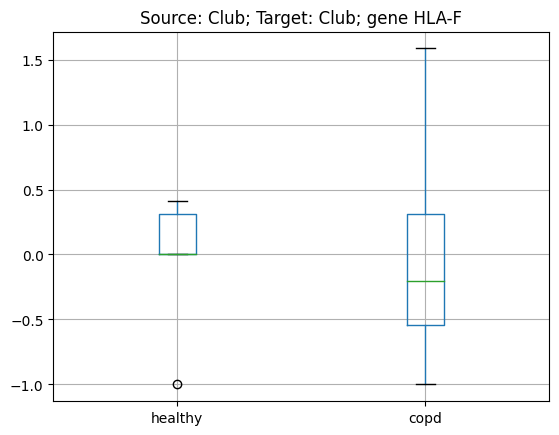

0.9618871478661015 9.618871478661015


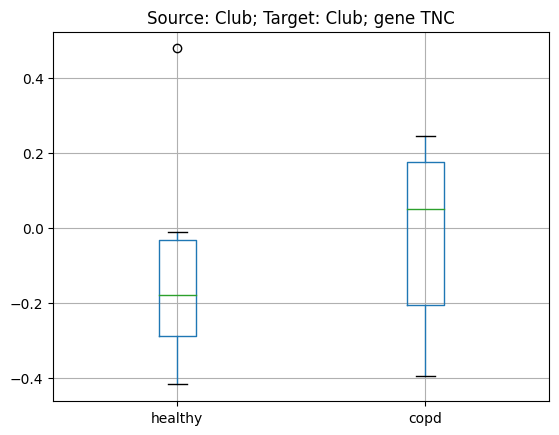

0.7263768635315511 7.263768635315511


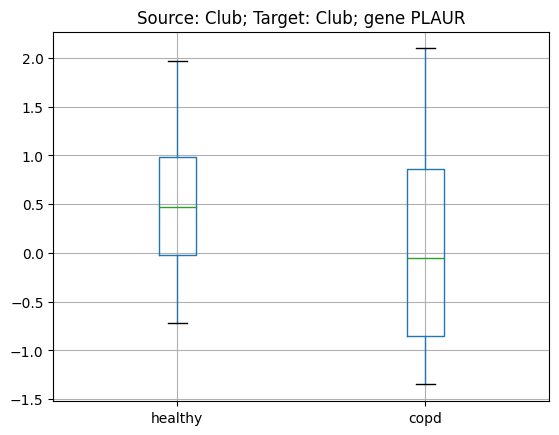

0.6581914809512447 6.581914809512447


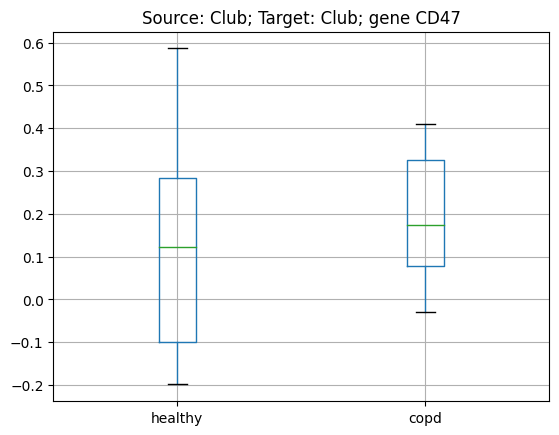

0.7425629560167378 7.425629560167378


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


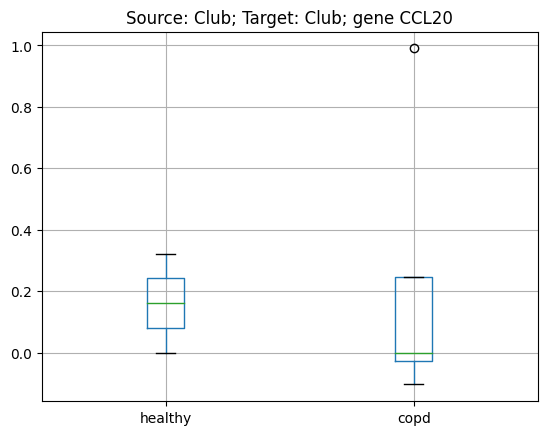

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


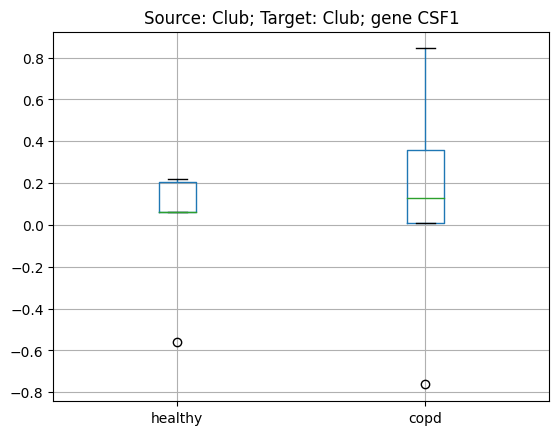

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


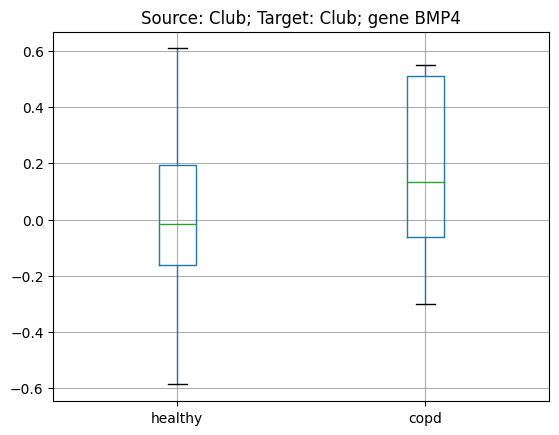

nan nan


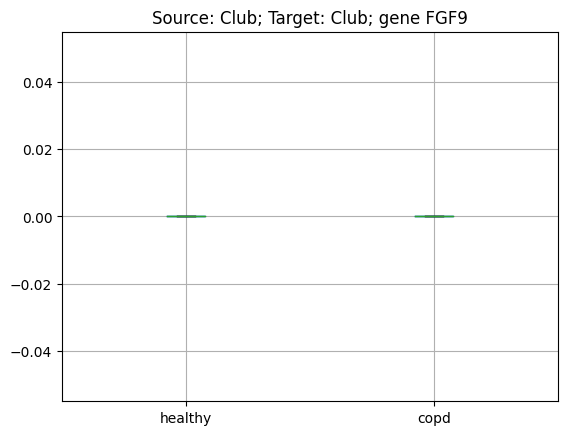

nan nan


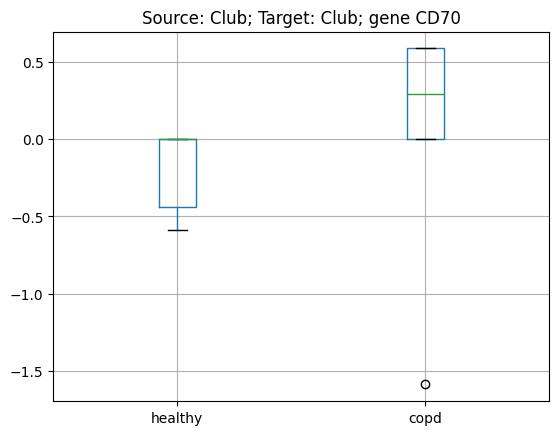

0.4942064050745374 4.942064050745374


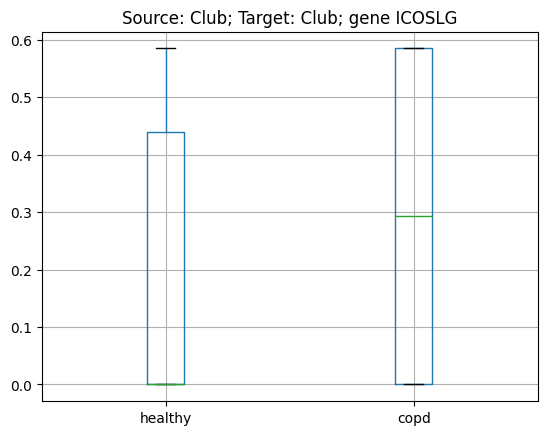

0.6108811833962556 6.108811833962556


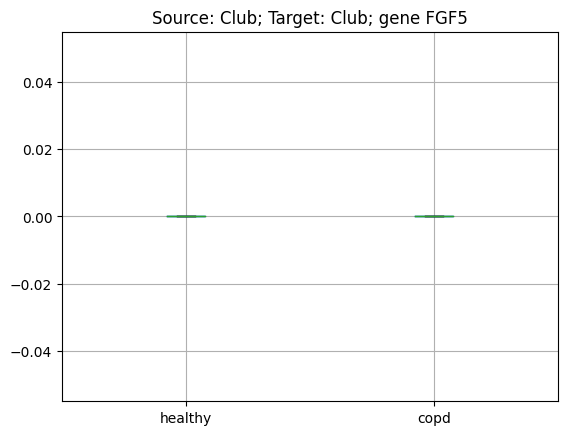

nan nan


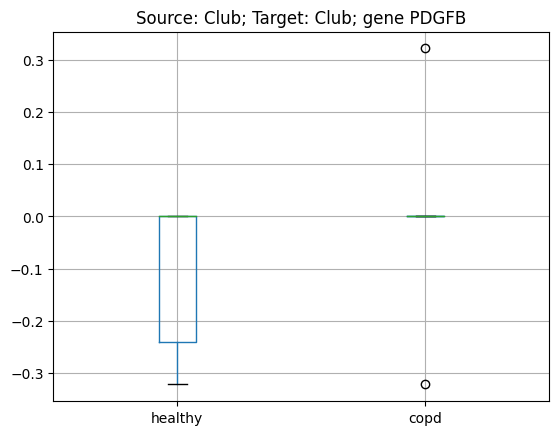

0.36321746764912255 3.6321746764912257


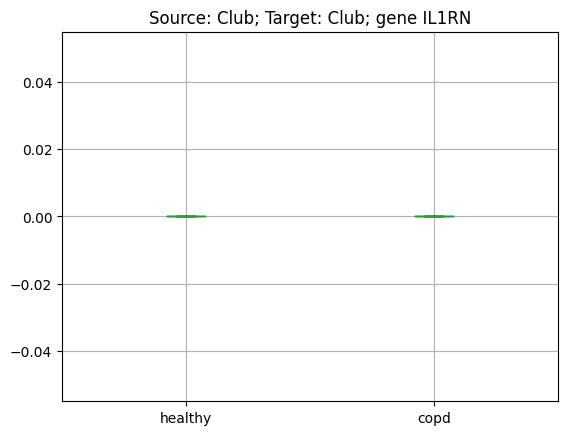

nan nan


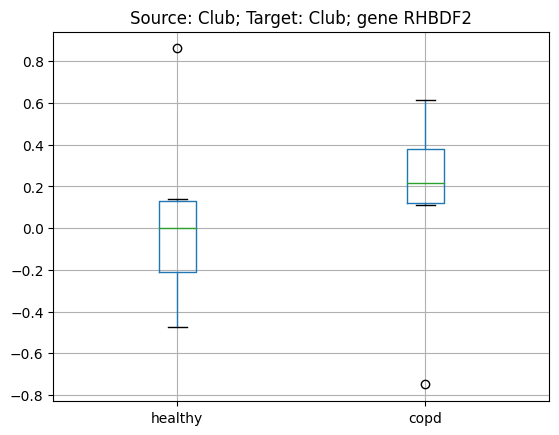

0.8209183015449008 8.209183015449007


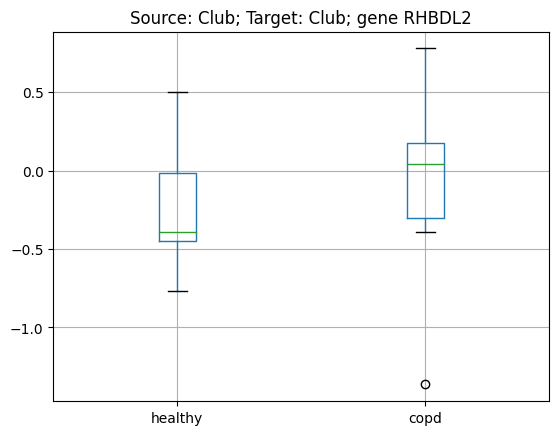

0.8030795276368913 8.030795276368913


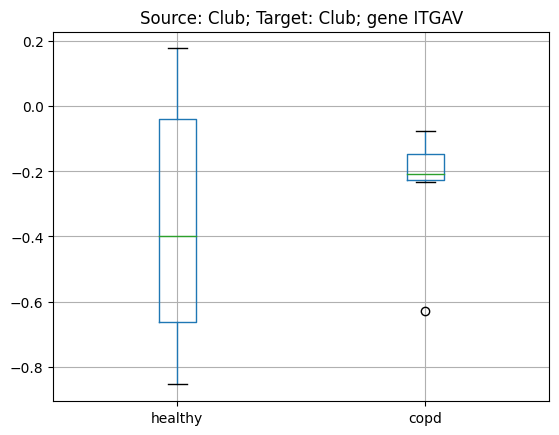

0.6422677562080457 6.422677562080457


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


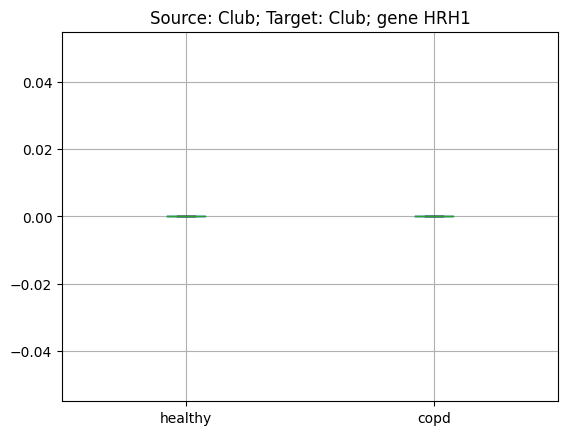

nan nan


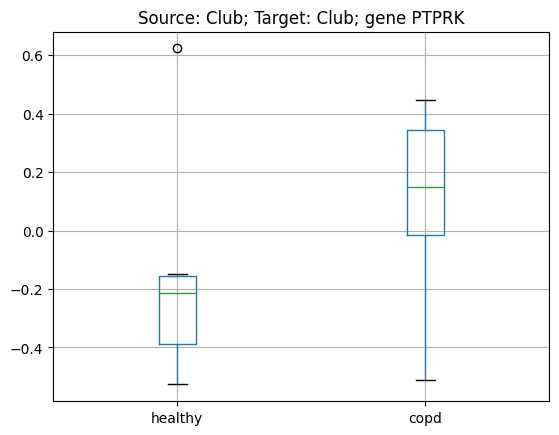

0.36022794767066607 3.6022794767066606


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))


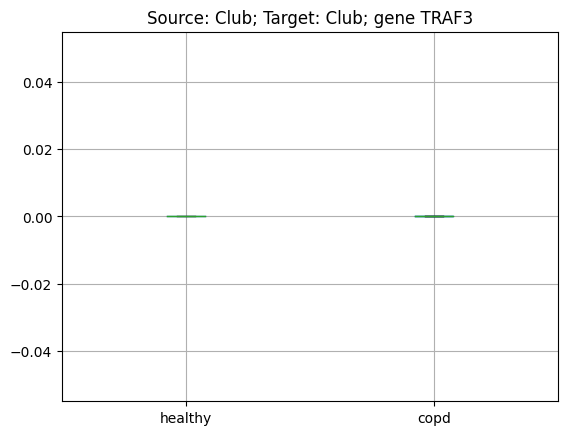

nan nan


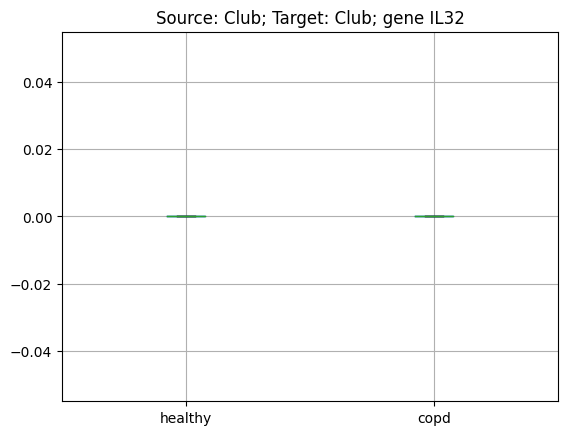

nan nan


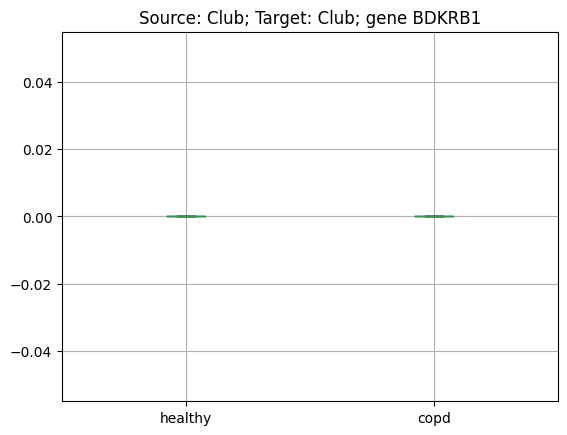

nan nan


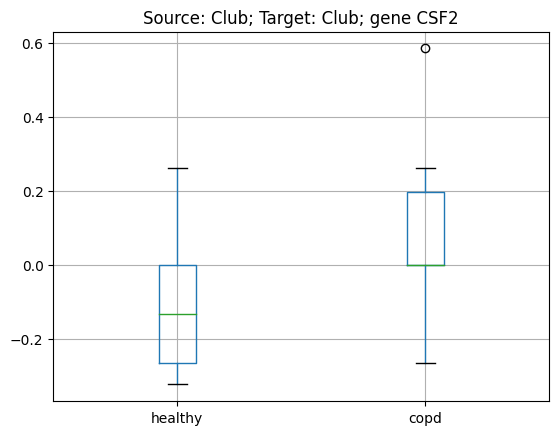

0.3208993319422017 3.2089933194220173


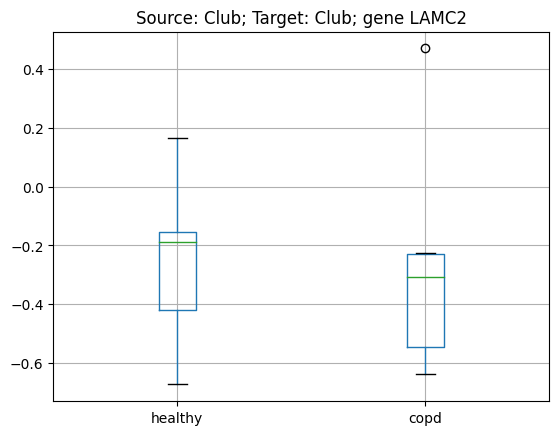

0.9516932889391241 9.51693288939124


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


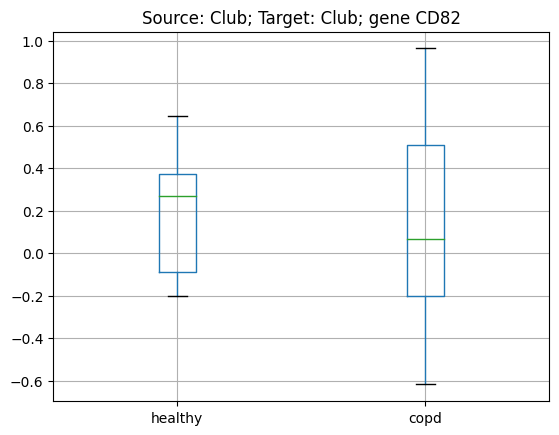

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


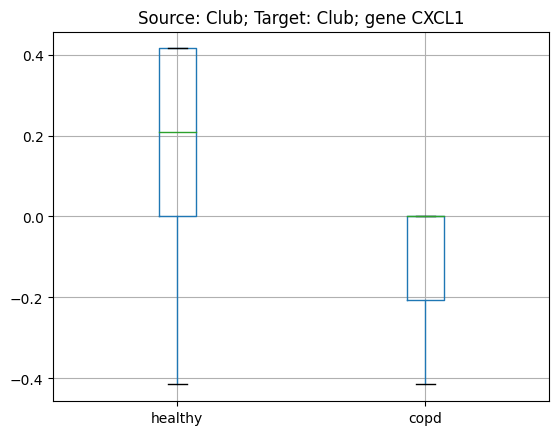

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


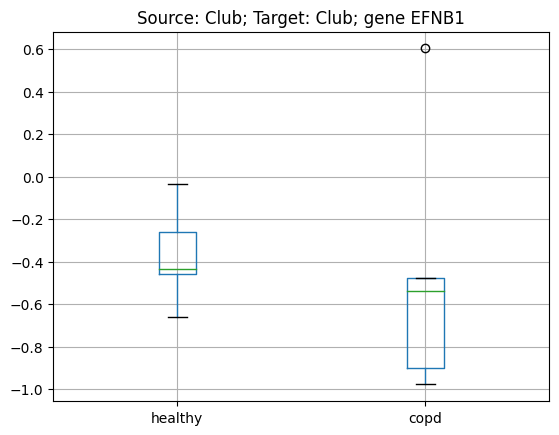

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


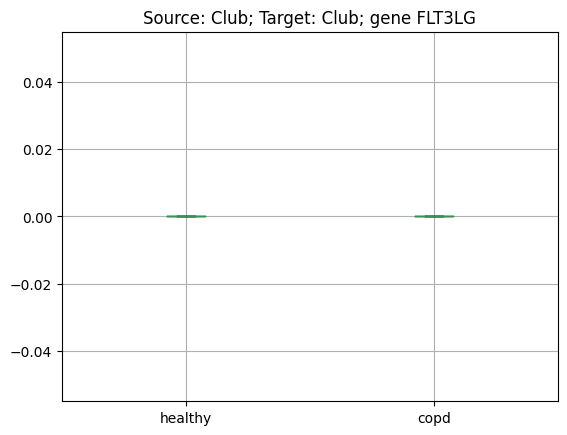

nan nan


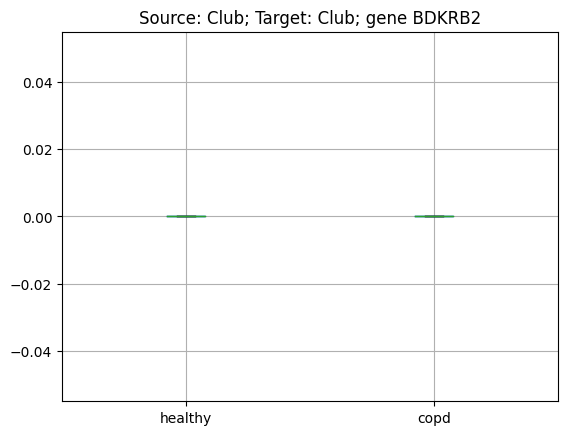

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


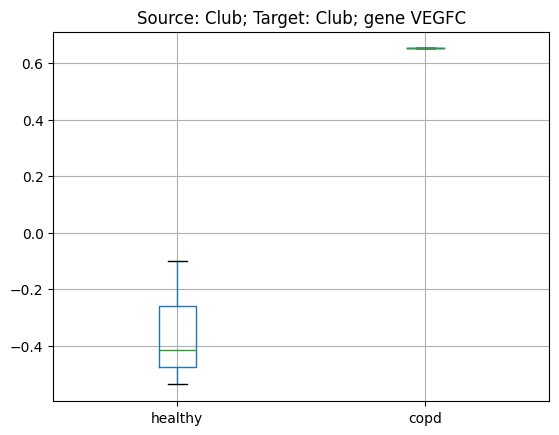

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


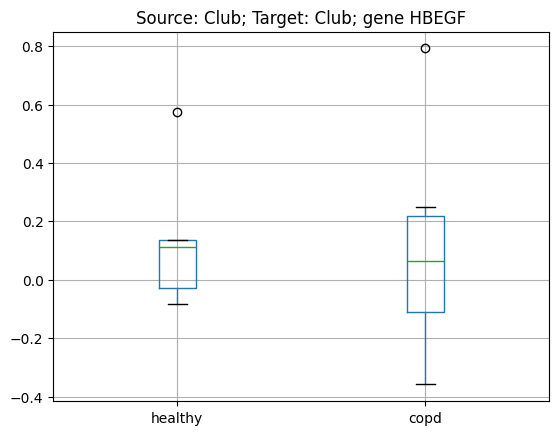

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


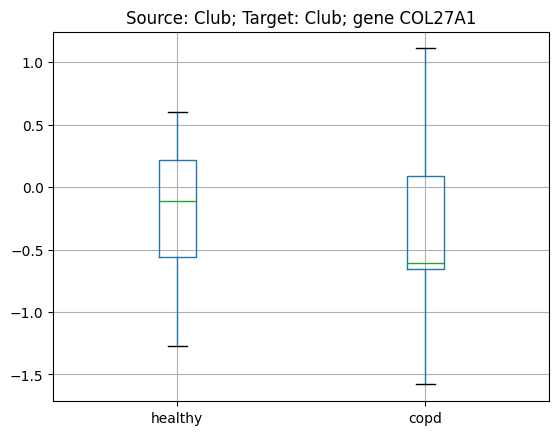

nan nan


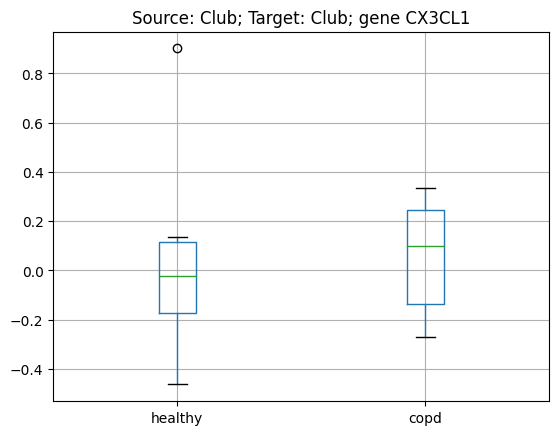

0.9951534906765205 9.951534906765204


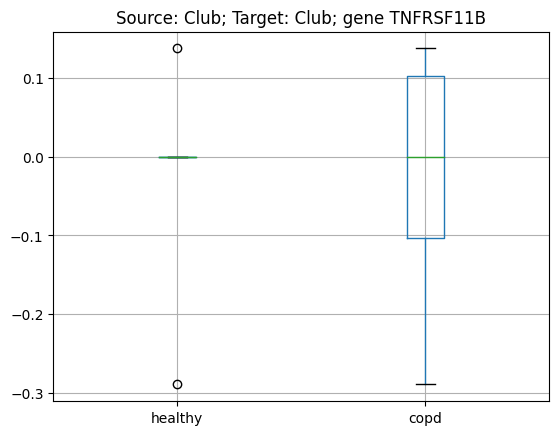

1.0 10.0


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))


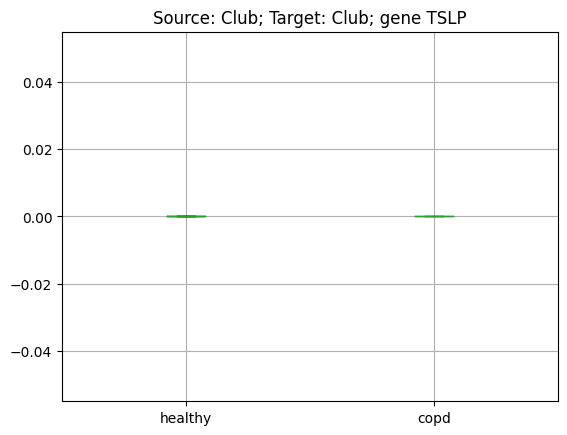

nan nan


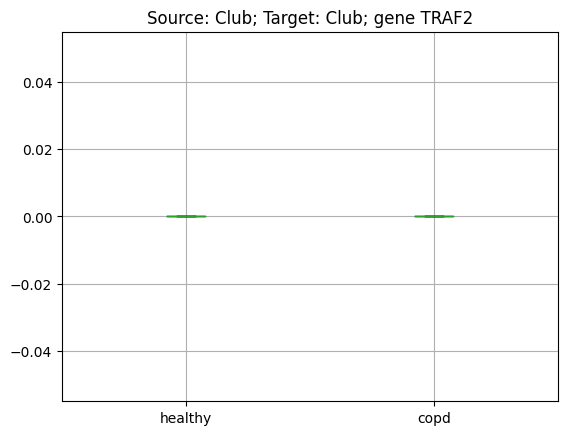

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


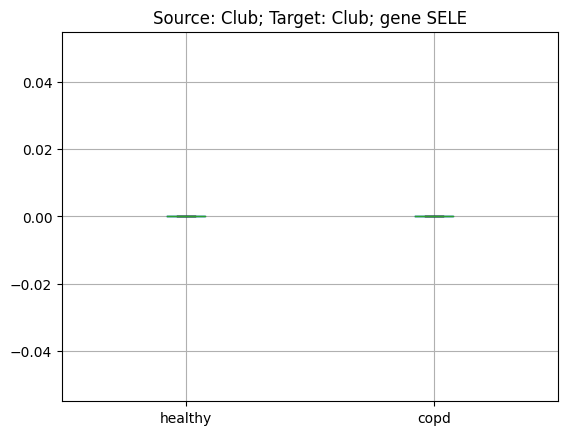

nan nan


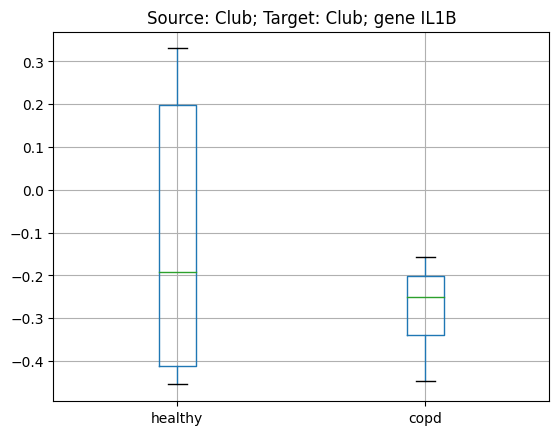

0.3380730652181185 3.380730652181185


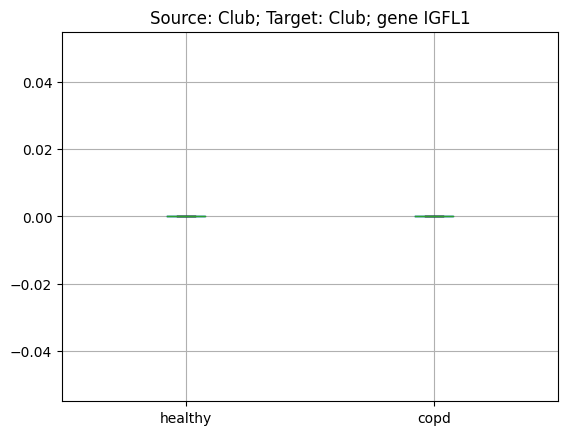

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/minifor

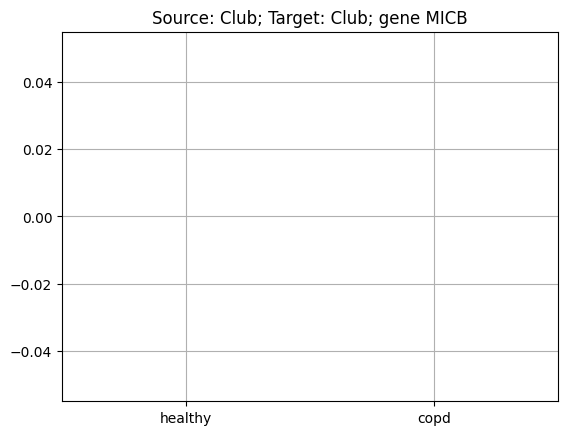

nan nan


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


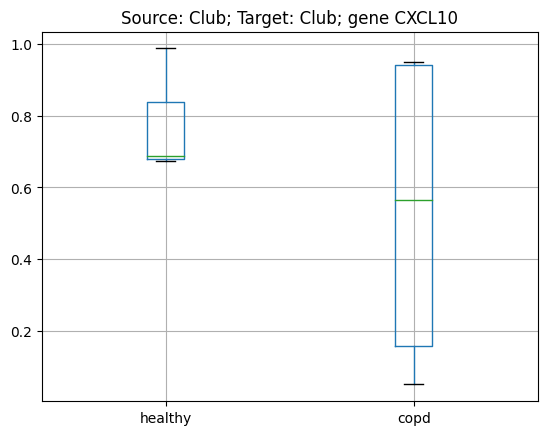

nan nan


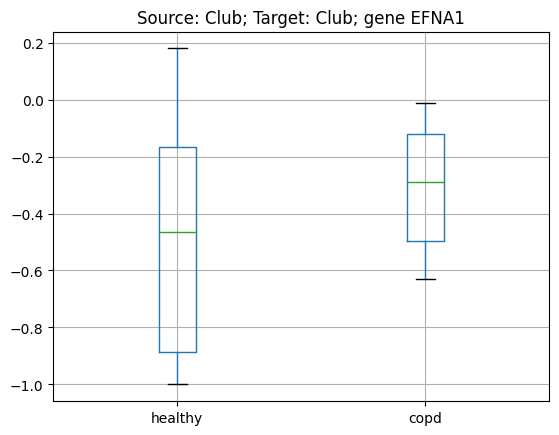

0.37067418566657007 3.7067418566657007


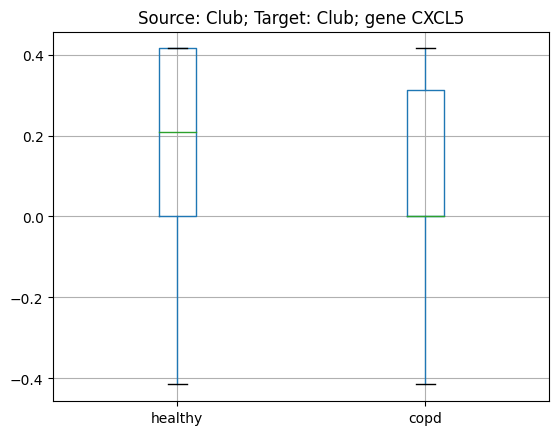

0.7711118563588939 7.711118563588939


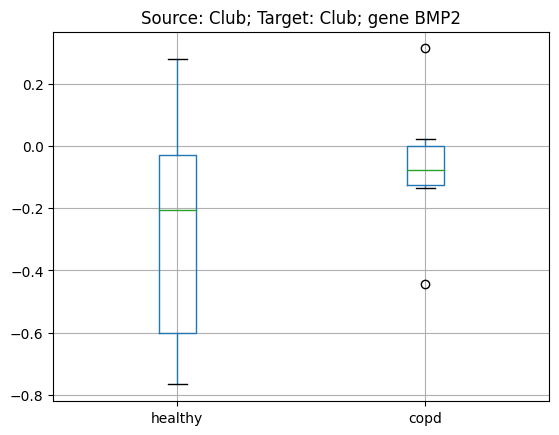

0.4784433672114178 4.784433672114178


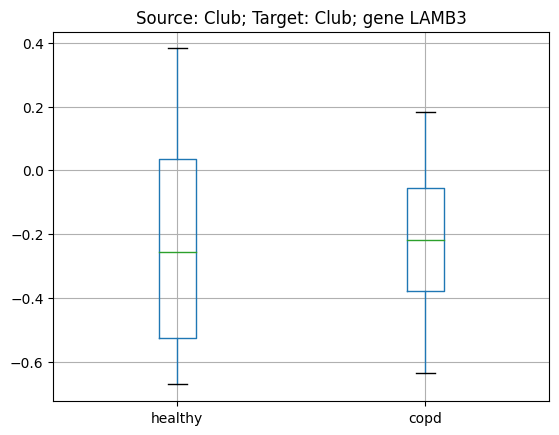

0.9824677955473669 9.824677955473668


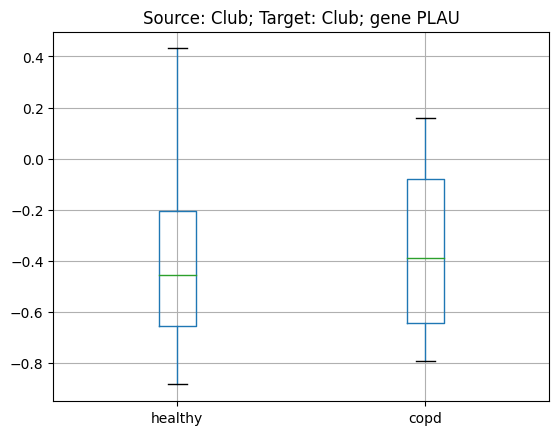

0.9576550535727991 9.576550535727991


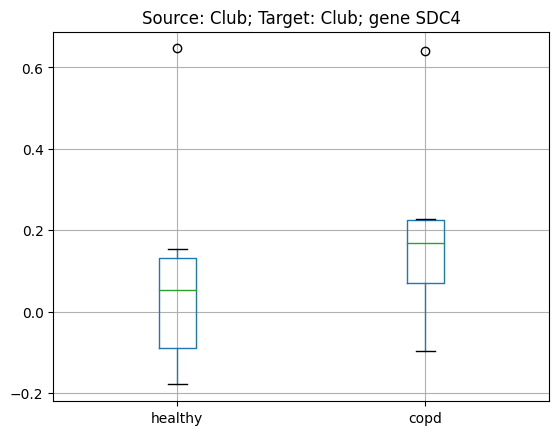

0.6647425719194763 6.6474257191947626


/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


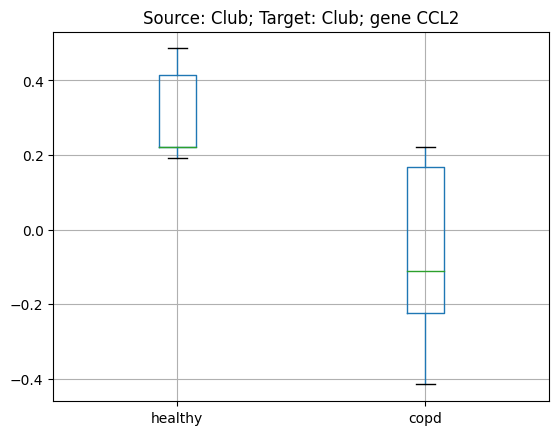

nan nan


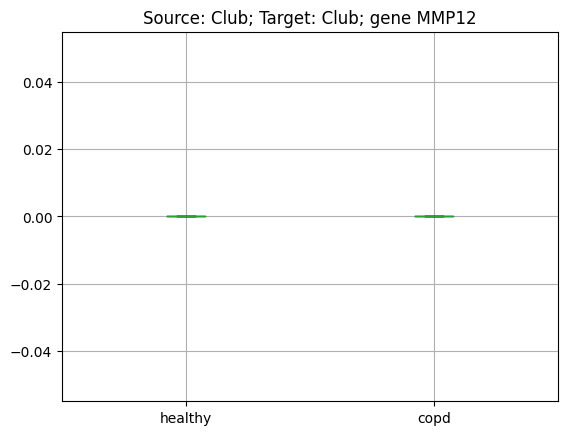

nan nan


In [25]:
cell_compartment_target = 'Club'
cell_compartment_source = 'Club'
pathway_dict = {source: set(progeny[progeny['source'] == source]['target']) for source in set(progeny['source'])}
genes = list(set(pathway_dict['TNFa']) & set(list(df['ligand_complex']) + list(df['receptor_complex'])))
for gene in genes:
    temp_df = df[(df['source'] == cell_compartment_source) & (df['target'] == cell_compartment_target) & ((df['ligand_complex'] == gene) | (df['receptor_complex'] == gene))]
    values_dict = {}
    for condition in set(context_dict.values()):
        values_dict[condition] = []
    for batch, condition in context_dict.items():
        batch_sum = temp_df[temp_df['batch'] == batch]['magnitude_rank_inverted'].sum()
        values_dict[condition].append(batch_sum)
    values_df = pd.DataFrame.from_dict(values_dict)
    order = ['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav']
    values_df = values_df[order]
    values_logfc_df = pd.DataFrame()
    values_logfc_df['healthy'] = np.log2(values_df['healthy_iav']/values_df['healthy_ctrl'])
    values_logfc_df['copd'] = np.log2(values_df['copd_iav']/values_df['copd_ctrl'])
    plt.figure()
    values_logfc_df.boxplot()
    plt.title(f'Source: {cell_compartment_source}; Target: {cell_compartment_target}; gene {gene}')
    plt.show()
    pval = stats.ttest_rel(values_logfc_df['healthy'], values_logfc_df['copd'])[1]
    pval_corr = pval * len(cell_compartments)
    print(pval, pval_corr)

In [26]:
{source: set(progeny[progeny['source'] == source]['target']) for source in set(progeny['source'])}

{'TGFb': {'ABCA6',
  'ABCA8',
  'ABCA9',
  'ABLIM2',
  'ACKR4',
  'ACOX1',
  'ACOX3',
  'ACTC1',
  'ADAM12',
  'ADAM19',
  'ADAMTS2',
  'ADAMTS4',
  'ADAMTS6',
  'ADAMTSL3',
  'ADCY7',
  'ADGRA2',
  'ADGRF5',
  'ADH1B',
  'ADH1C',
  'ADRA2A',
  'AEBP1',
  'AGFG2',
  'AGPS',
  'AK5',
  'ALDH3A2',
  'AMIGO2',
  'AMTN',
  'AMZ1',
  'ANAPC13',
  'ANKLE2',
  'ANKRD1',
  'ANKRD44',
  'ANXA10',
  'ANXA13',
  'AOX1',
  'APBB2',
  'APOH',
  'AQP1',
  'AR',
  'AREL1',
  'ARF4',
  'ARFGAP1',
  'ARHGAP29',
  'ARHGAP6',
  'ARHGEF40',
  'ARL4A',
  'ASS1',
  'ATOSB',
  'ATP10A',
  'ATP13A2',
  'ATP8B1',
  'AUTS2',
  'BCOR',
  'BDKRB2',
  'BEND7',
  'BGN',
  'BLOC1S2',
  'BMP4',
  'BMP6',
  'BMPER',
  'BMPR2',
  'C18orf25',
  'C1orf140',
  'C3orf80',
  'C5',
  'C5orf46',
  'CA12',
  'CACHD1',
  'CALD1',
  'CAMKK1',
  'CAVIN2',
  'CAVIN4',
  'CBFB',
  'CCDC198',
  'CCDC80',
  'CCL11',
  'CCN2',
  'CDC25B',
  'CDC42SE1',
  'CDH2',
  'CDKN2B',
  'CEBPD',
  'CEBPG',
  'CFH',
  'CHFR',
  'CHRNA9',
  'CHST1

In [27]:
temp_df

,batch,source,target,ligand_complex,receptor_complex,lr_means,cellphone_pvals,expr_prod,scaled_weight,lr_logfc,spec_weight,lrscore,specificity_rank,magnitude_rank,magnitude_rank_inverted
120108,CHE01_CTRL,Club,Club,MMP12,PLAUR,0.383863,1.0,0.147276,-2.182959,-4.826386,0.000526,0.302438,1.0,1.0,-9.643275e-17
419312,CHE01_IAV,Club,Club,MMP12,PLAUR,0.346394,1.0,0.119989,-1.835387,-4.337486,0.000575,0.292129,1.0,1.0,-9.643275e-17
728253,CHE02_CTRL,Club,Club,MMP12,PLAUR,0.373586,1.0,0.139082,-2.028952,-4.333928,0.001117,0.281729,1.0,1.0,-9.643275e-17
1059645,CHE02_IAV,Club,Club,MMP12,PLAUR,0.307816,1.0,0.094691,-1.771852,-4.780398,0.000475,0.250426,1.0,1.0,-9.643275e-17
1424434,CHE03_CTRL,Club,Club,MMP12,PLAUR,0.399640,1.0,0.159617,-1.762526,-4.506764,0.000613,0.314004,1.0,1.0,-9.643275e-17
1749992,CHE03_IAV,Club,Club,MMP12,PLAUR,0.391888,1.0,0.152825,-1.209517,-4.276298,0.000733,0.320628,1.0,1.0,-9.643275e-17
2115134,CSE03_CTRL,Club,Club,MMP12,PLAUR,0.374078,1.0,0.139874,-1.622891,-3.471195,0.000878,0.299358,1.0,1.0,-9.643275e-17
2442414,CSE03_IAV,Club,Club,MMP12,PLAUR,0.355093,1.0,0.126058,-1.606942,-4.554117,0.000791,0.293399,1.0,1.0,-9.643275e-17
2799952,CSE_06_CRTL,Club,Club,MMP12,PLAUR,0.385130,1.0,0.148183,-1.707329,-4.261298,0.000839,0.316055,1.0,1.0,-9.643275e-17
3113859,CSE_06_IAV,Club,Club,MMP12,PLAUR,0.350904,1.0,0.123063,-1.520386,-4.280074,0.000452,0.299882,1.0,1.0,-9.643275e-17


  0%|          | 0/10 [00:00<?, ?it/s]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in g

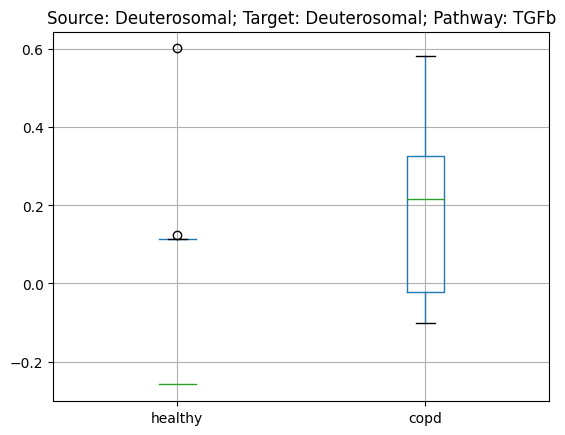

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


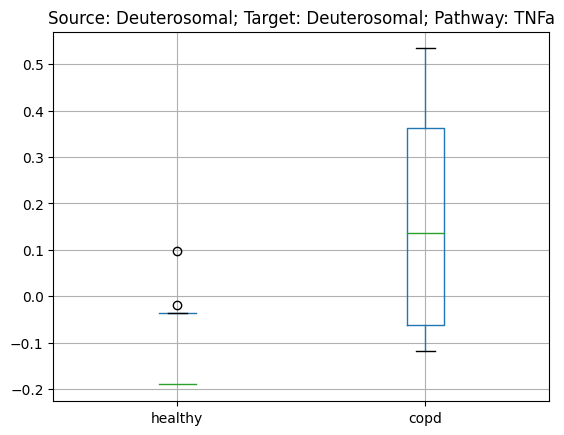

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


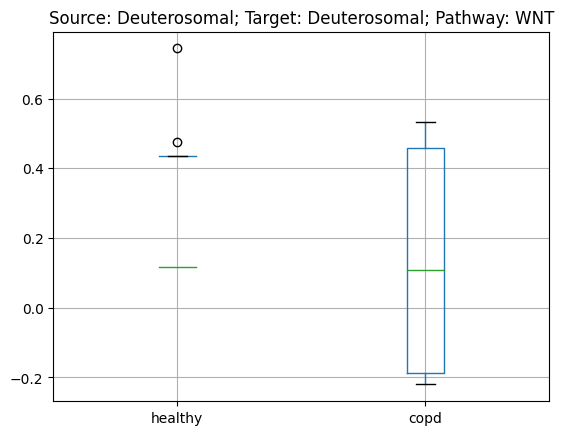

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


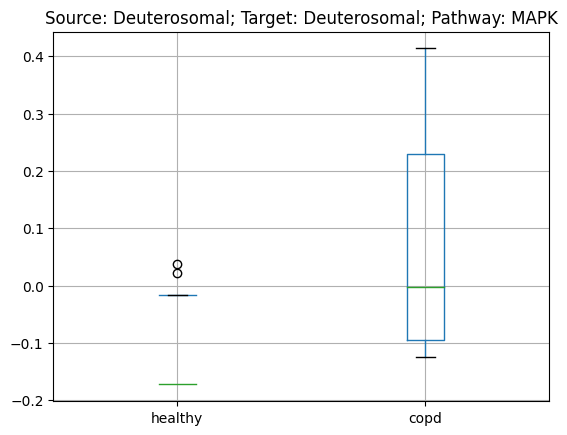

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


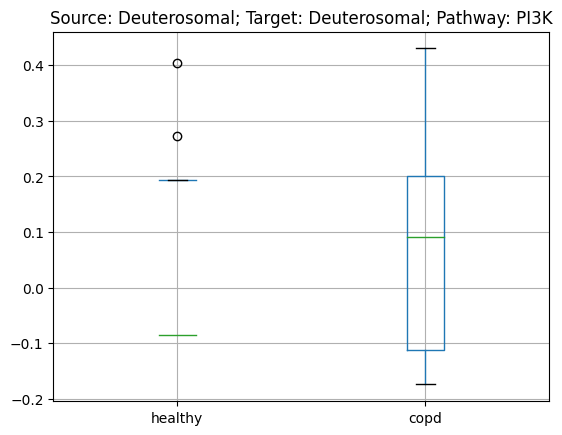

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


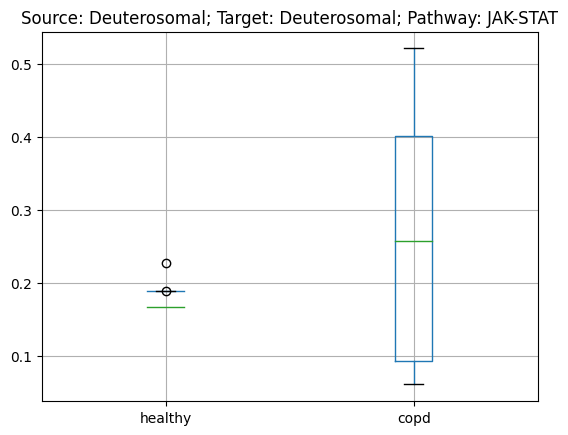

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


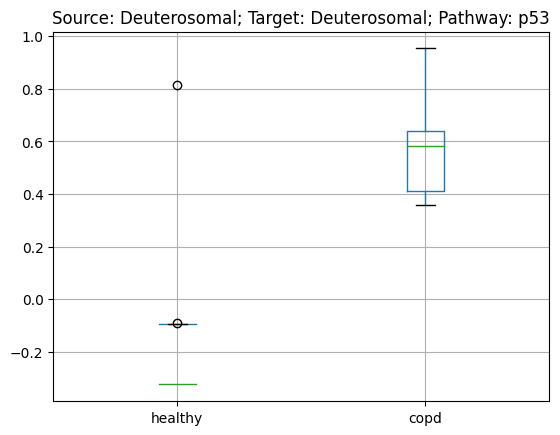

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


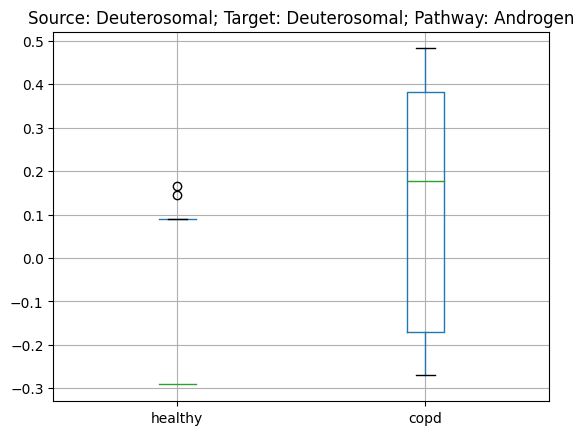

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


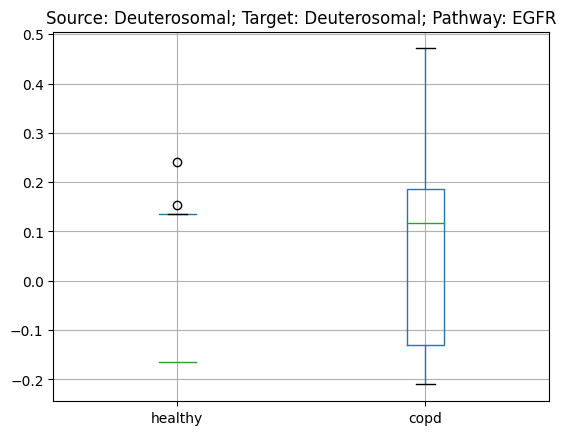

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


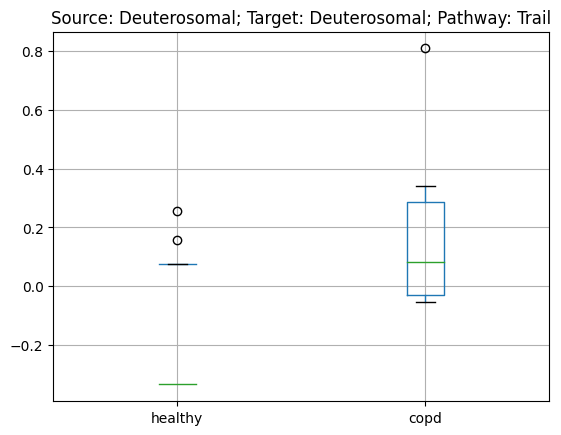

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


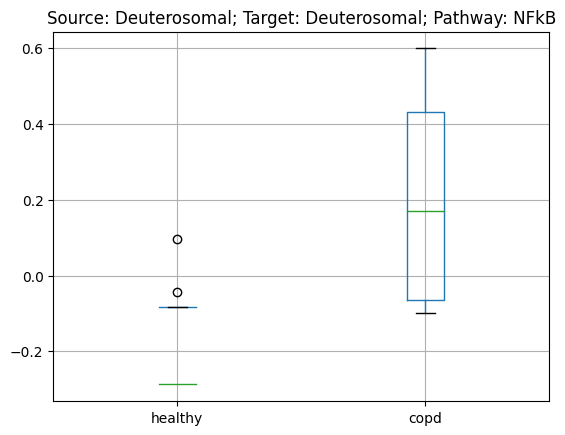

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


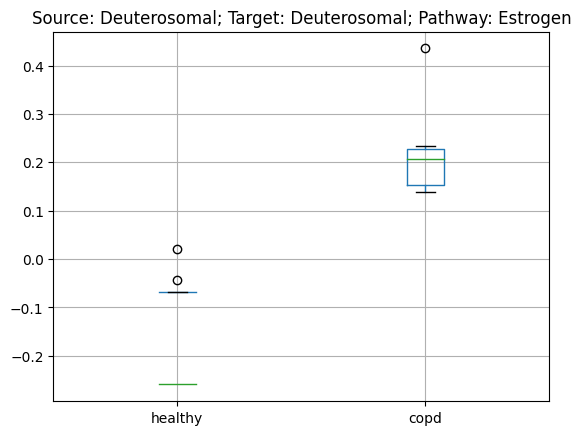

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


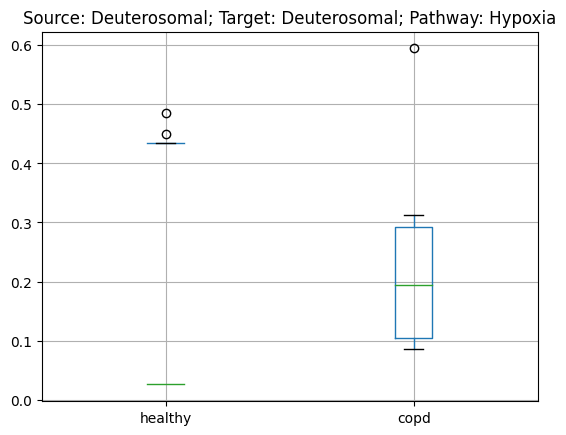

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


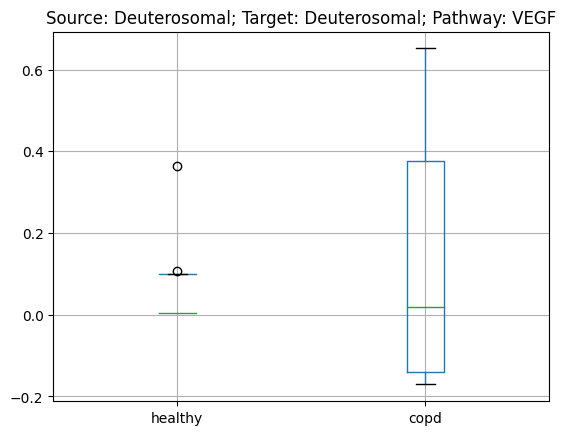

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


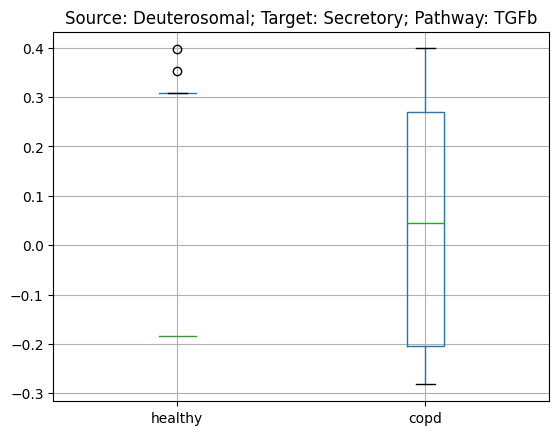

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


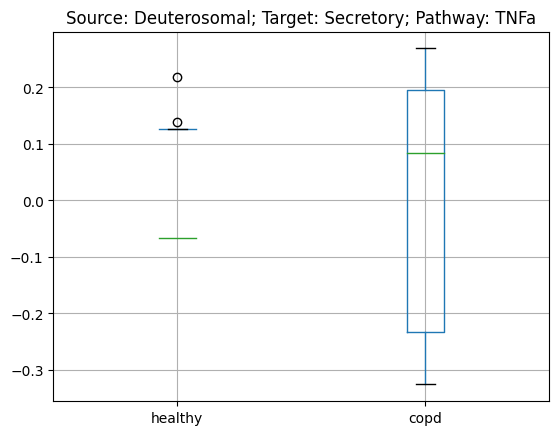

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


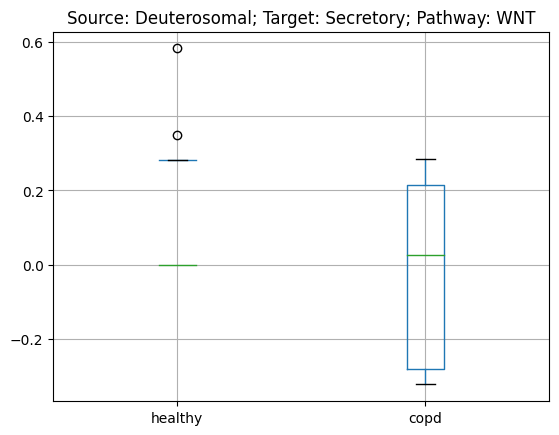

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


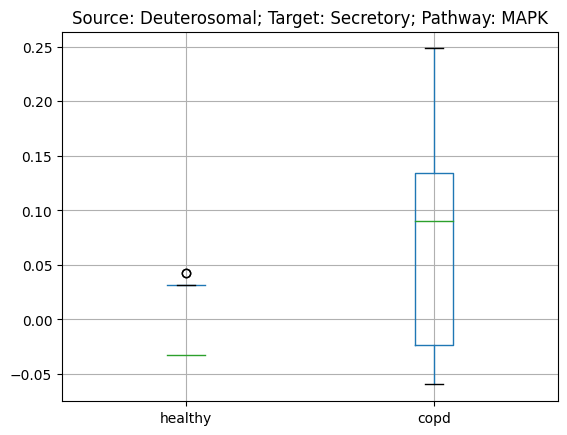

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


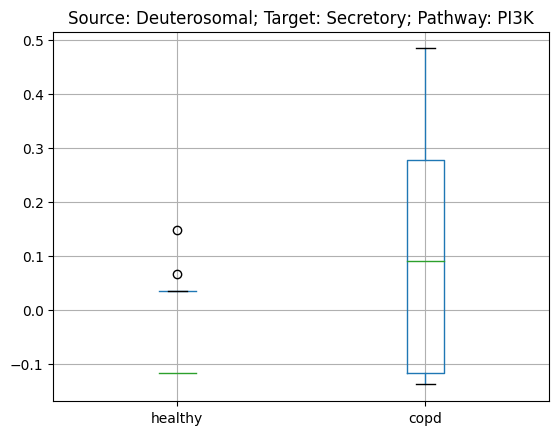

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


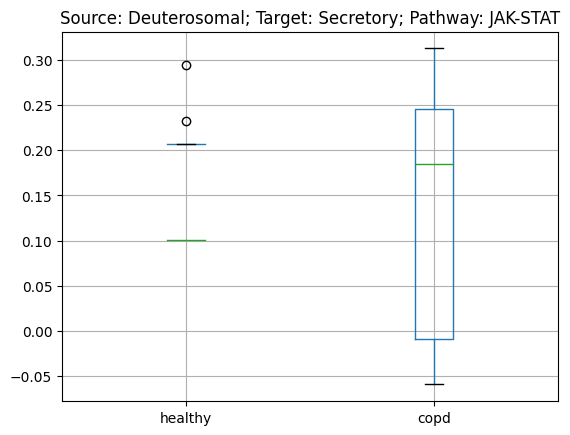

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


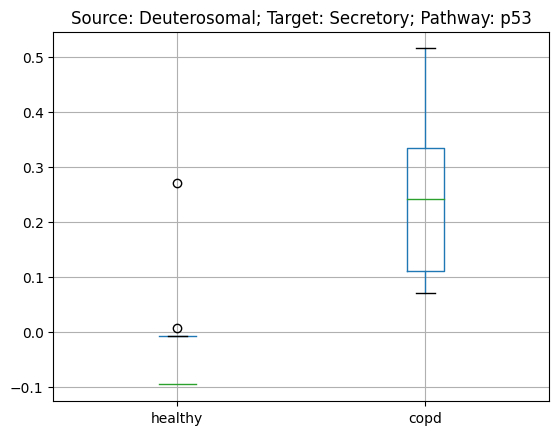

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


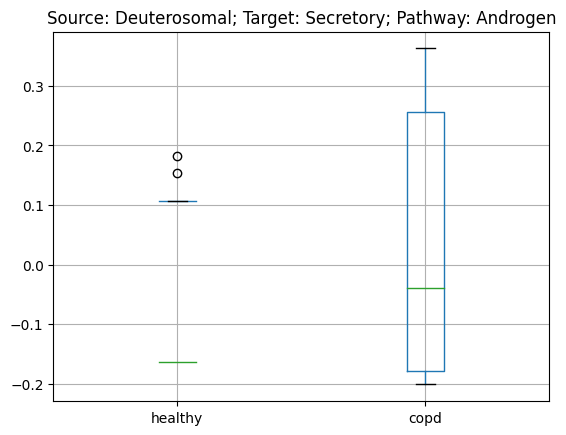

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


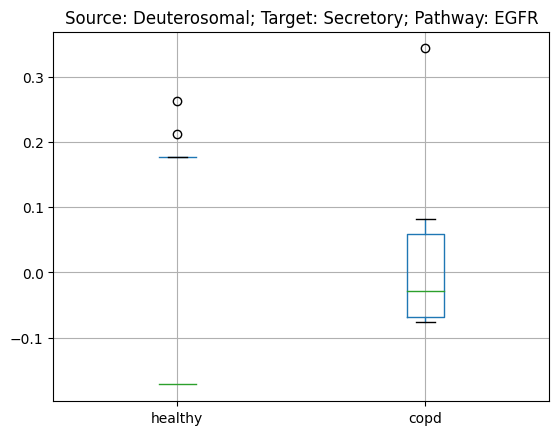

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


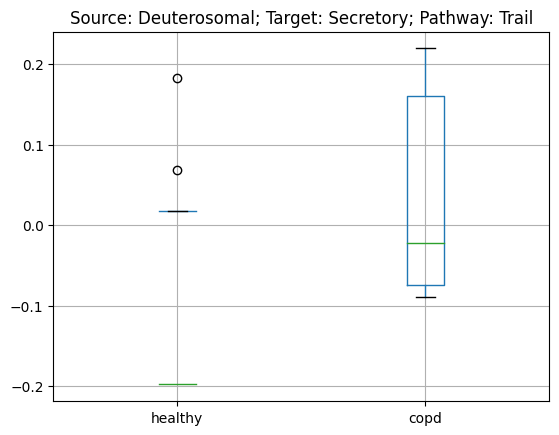

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


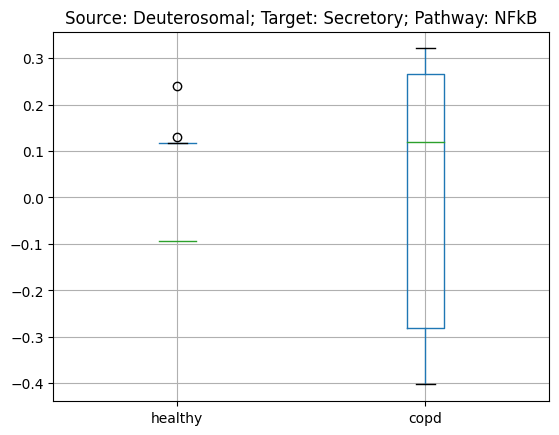

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


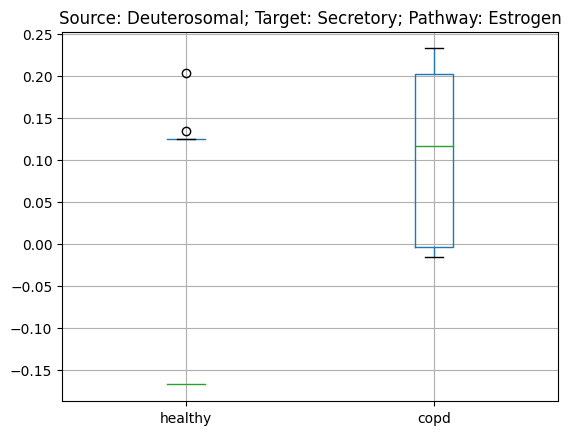

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


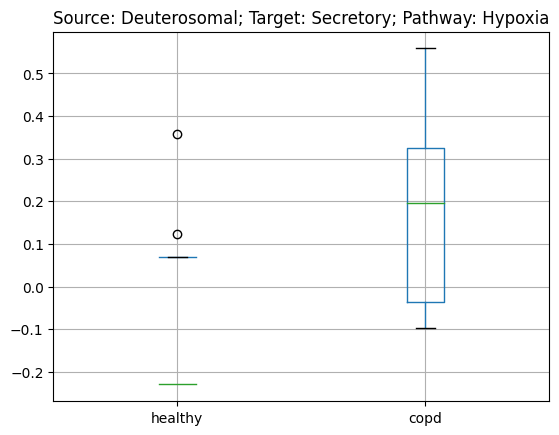

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


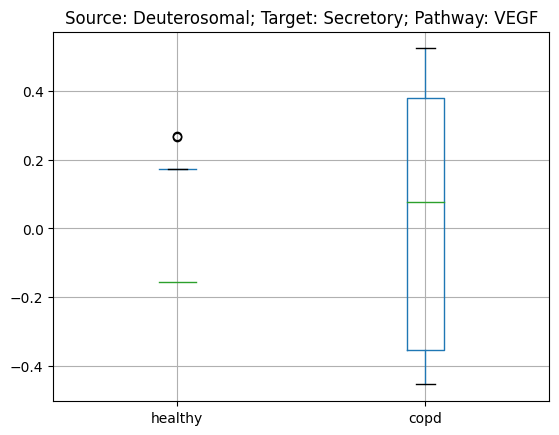

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


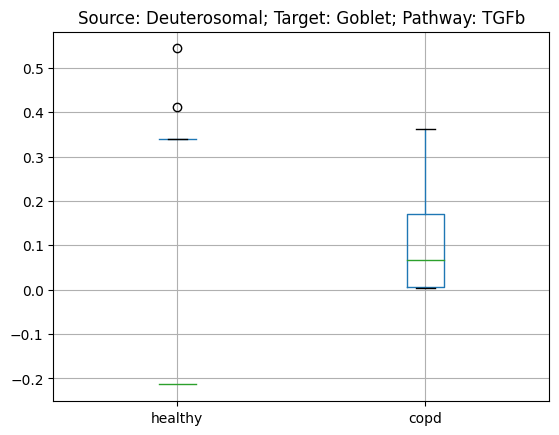

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


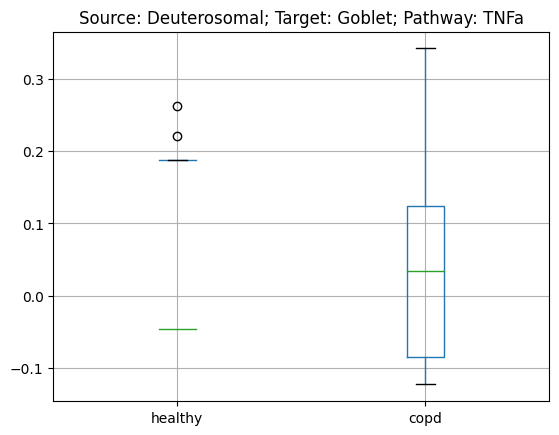

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


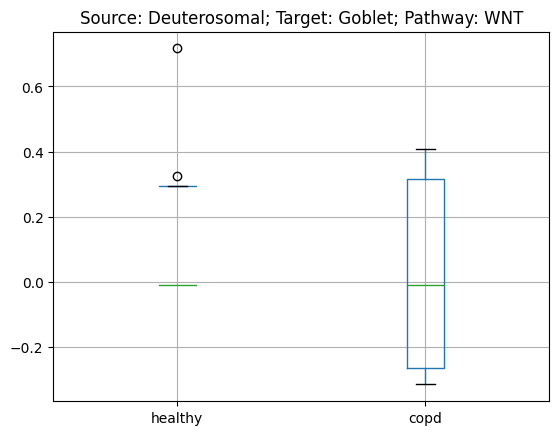

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


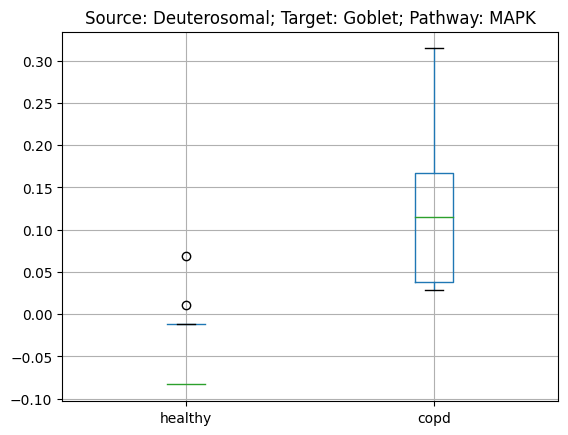

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


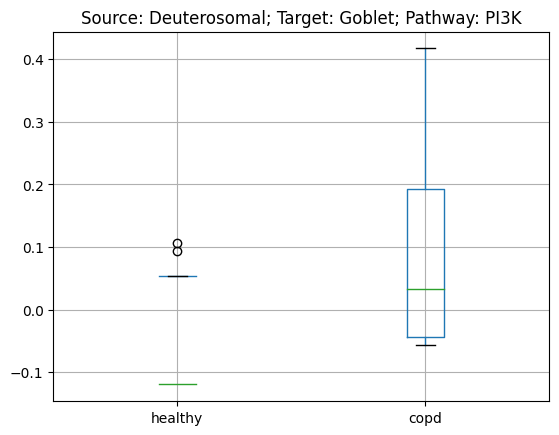

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


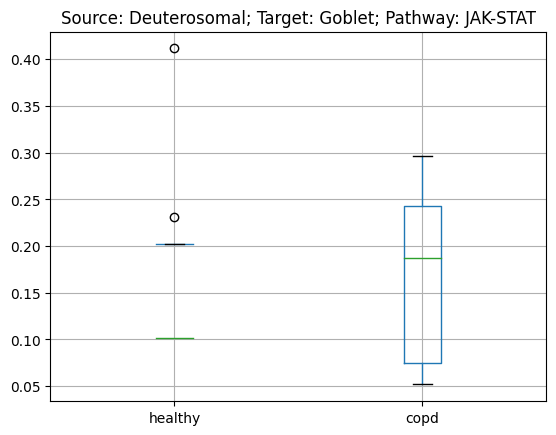

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


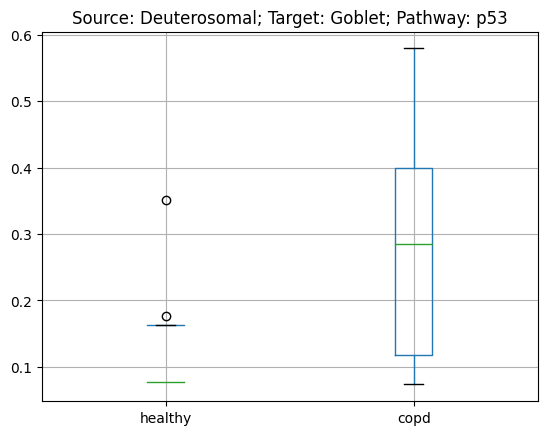

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


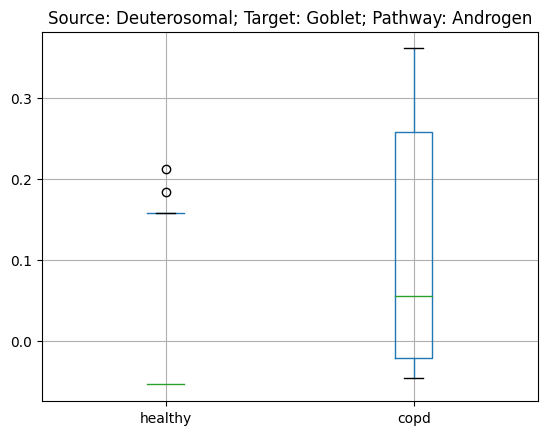

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


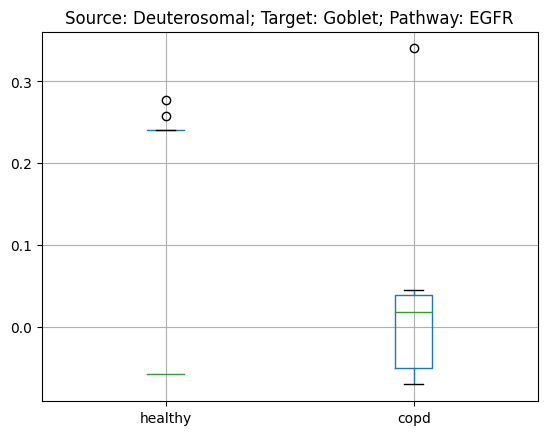

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


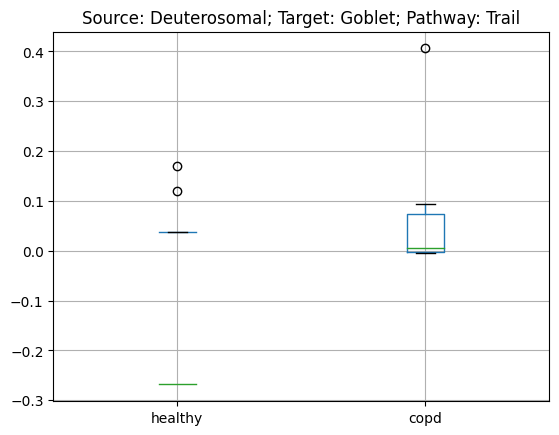

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


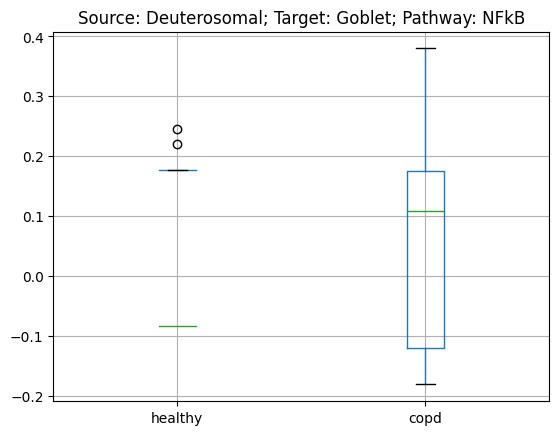

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


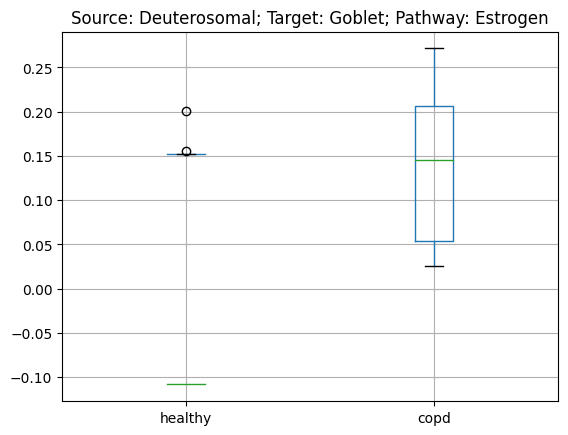

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


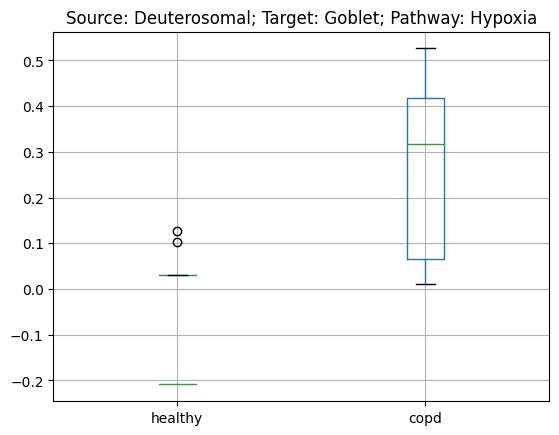

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


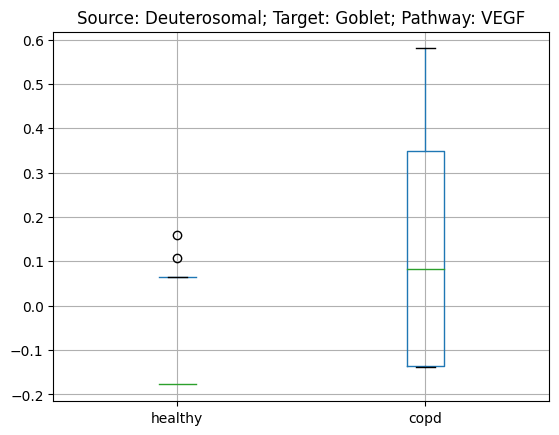

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


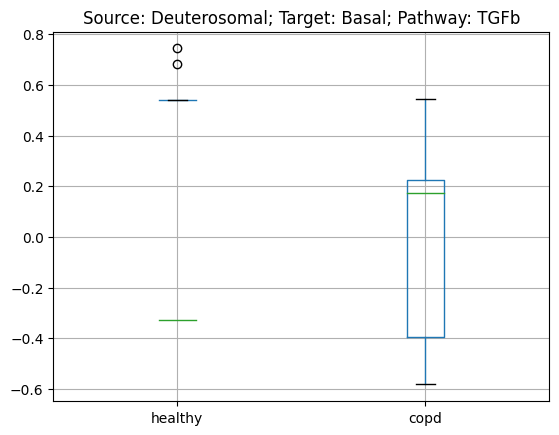

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


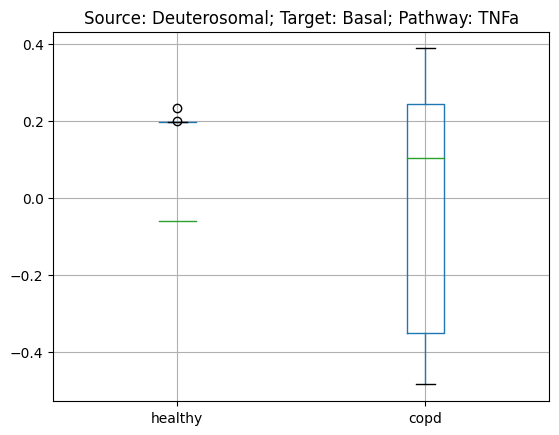

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


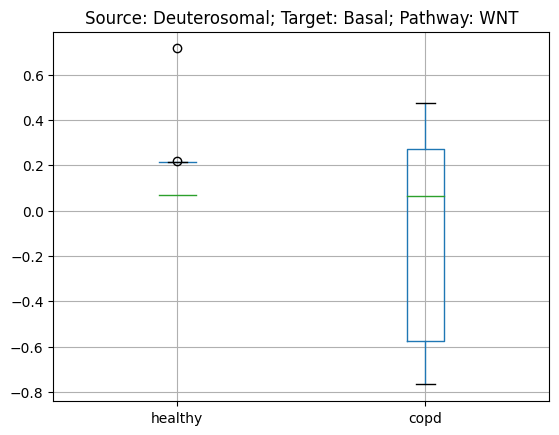

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


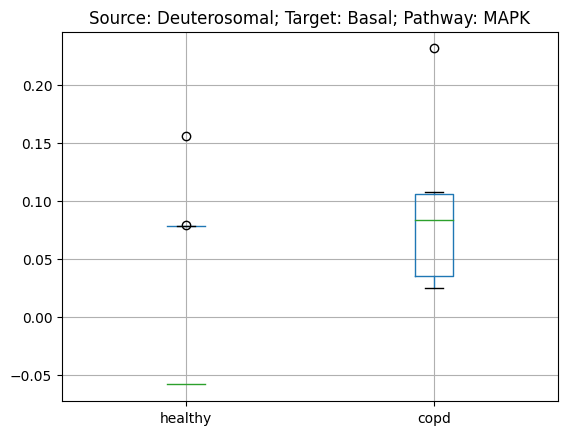

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


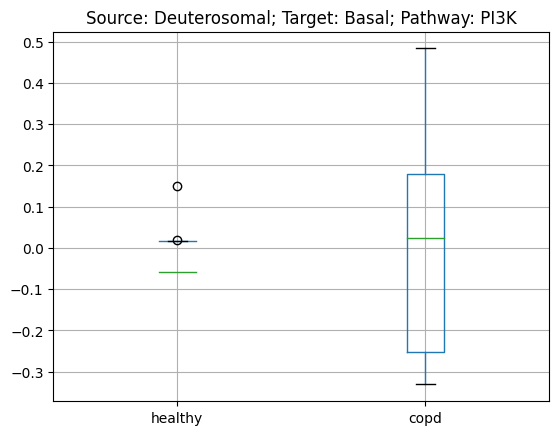

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


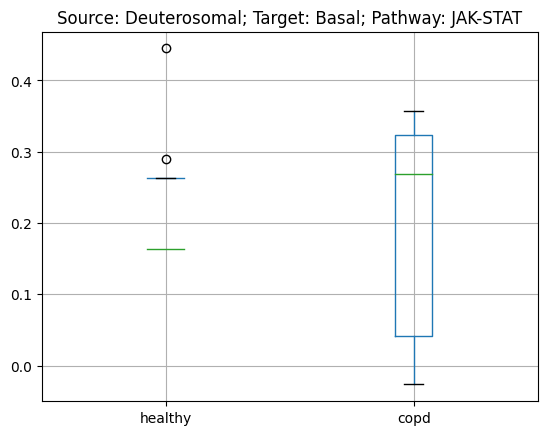

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


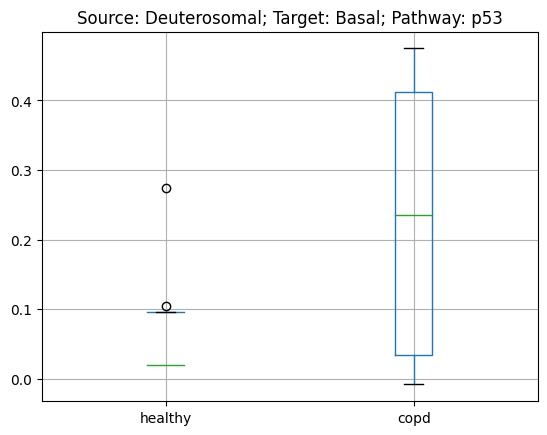

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


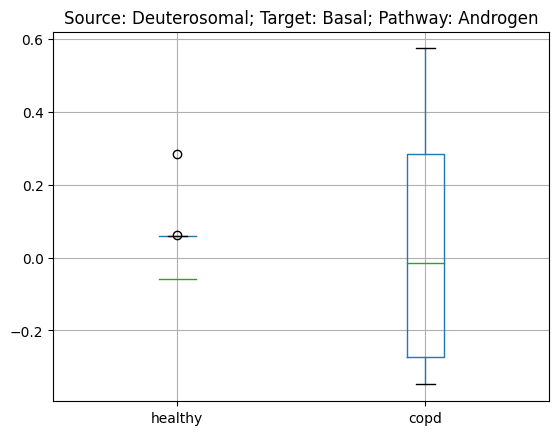

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


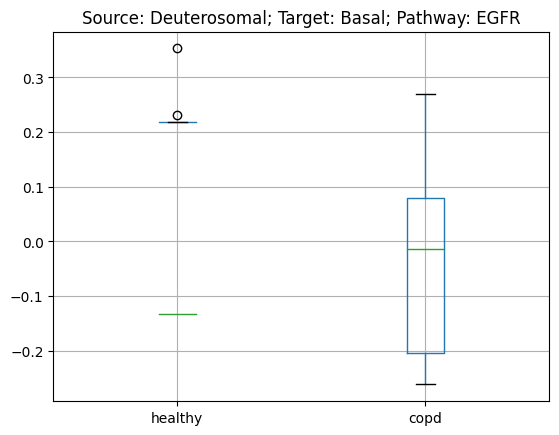

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


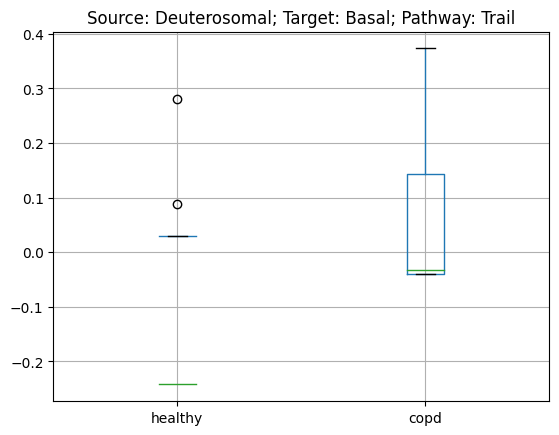

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


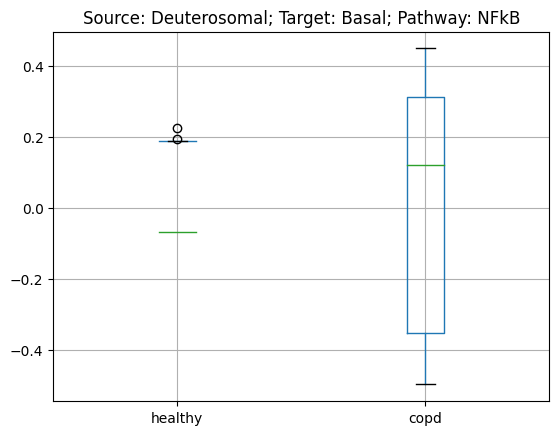

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


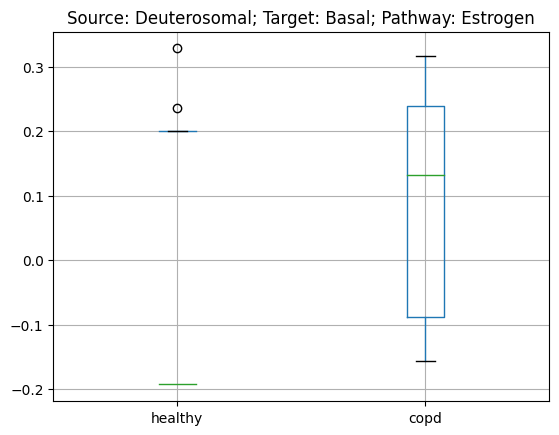

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


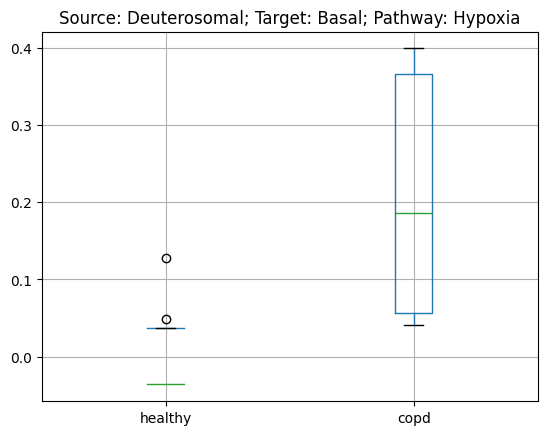

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


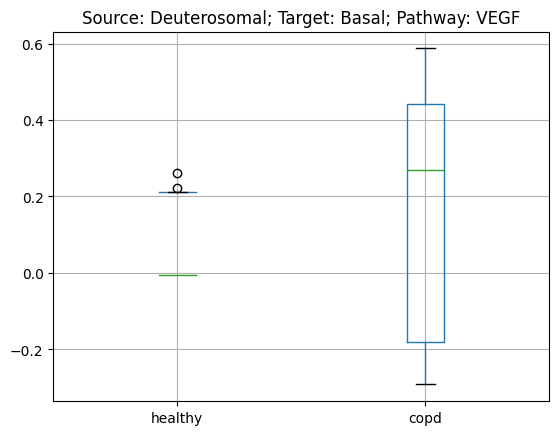

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


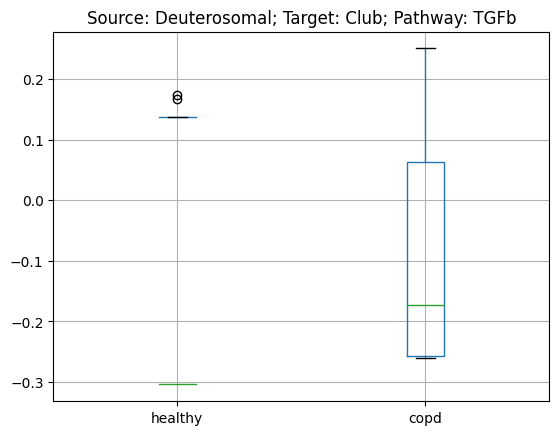

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


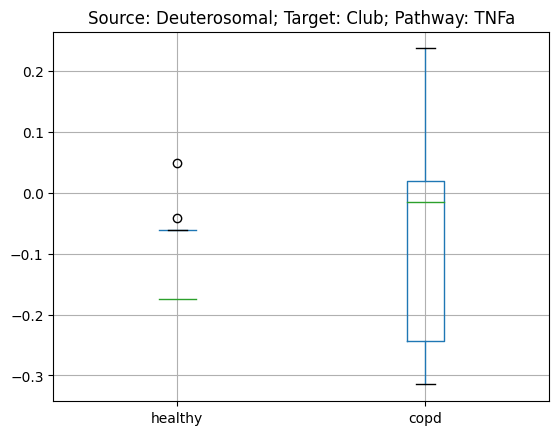

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


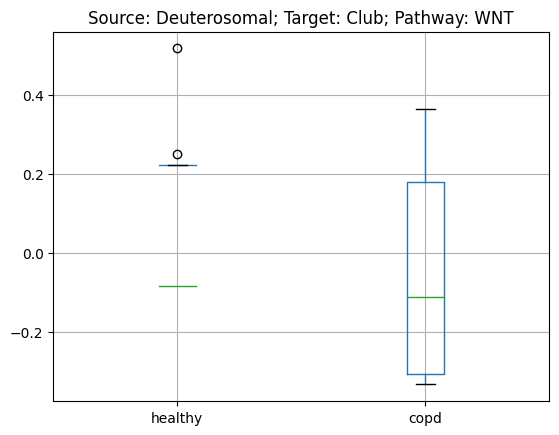

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


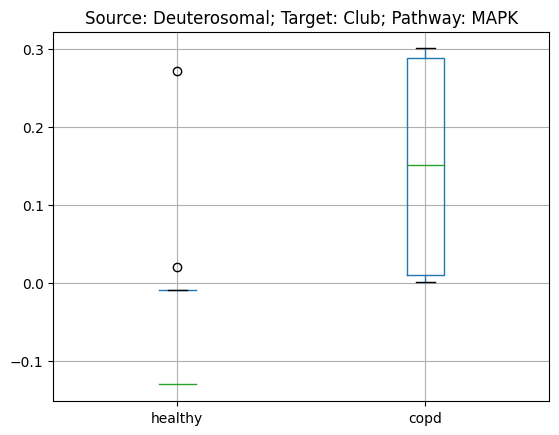

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


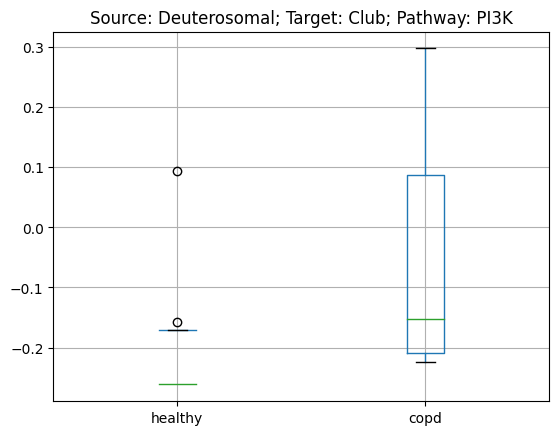

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


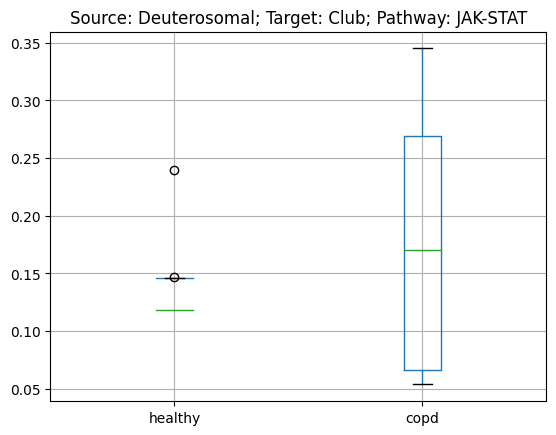

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


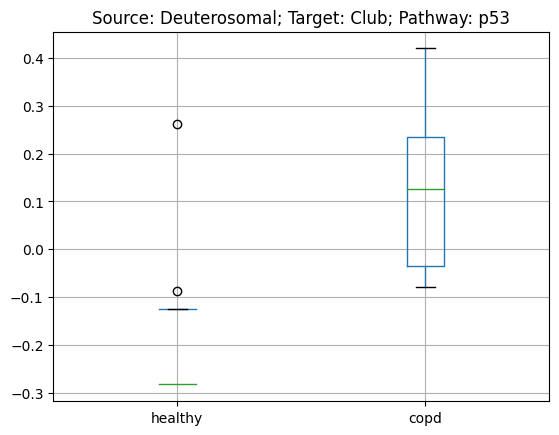

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


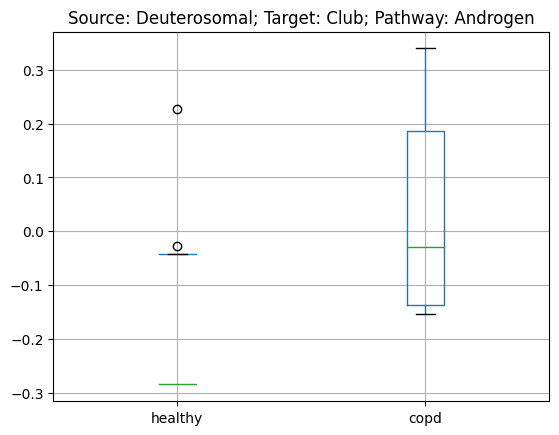

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


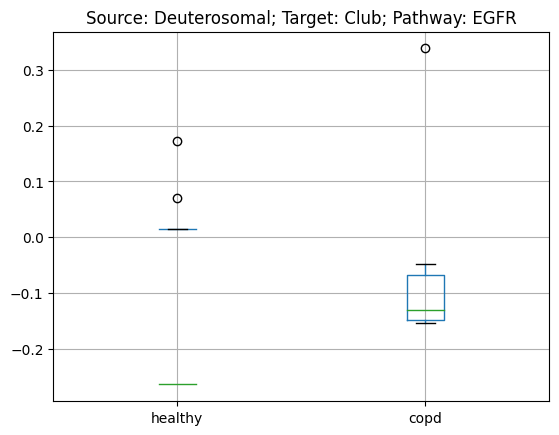

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


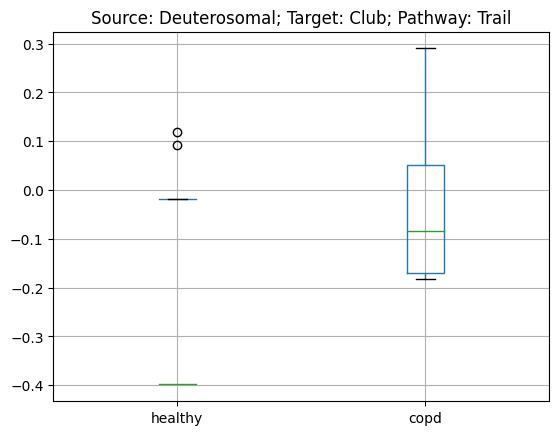

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


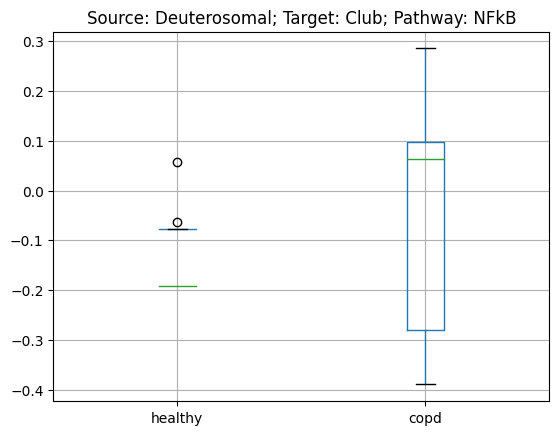

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


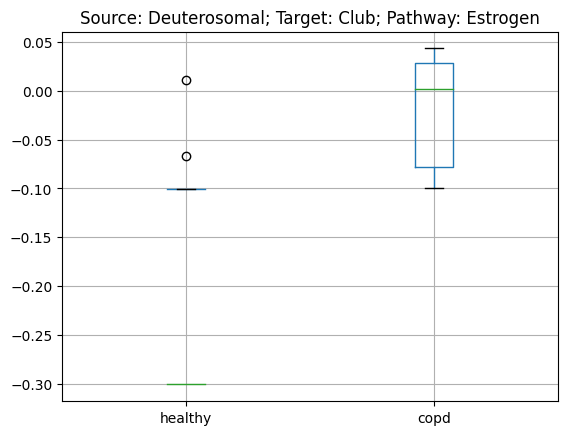

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


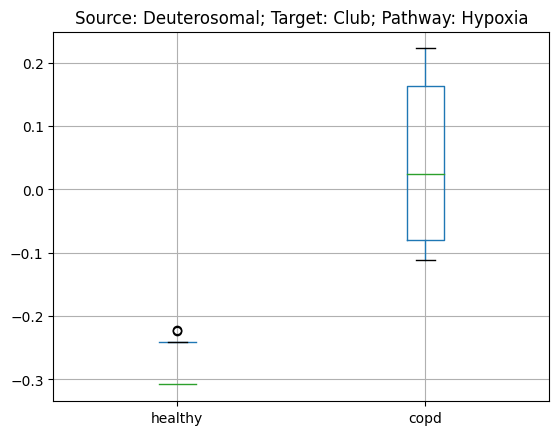

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


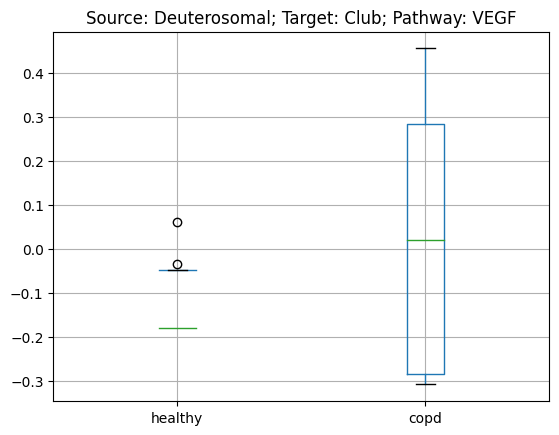

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


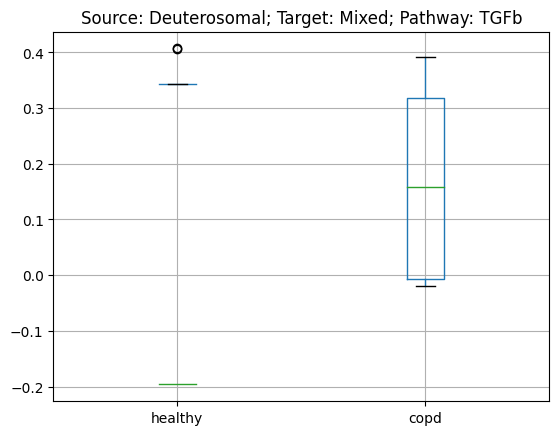

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


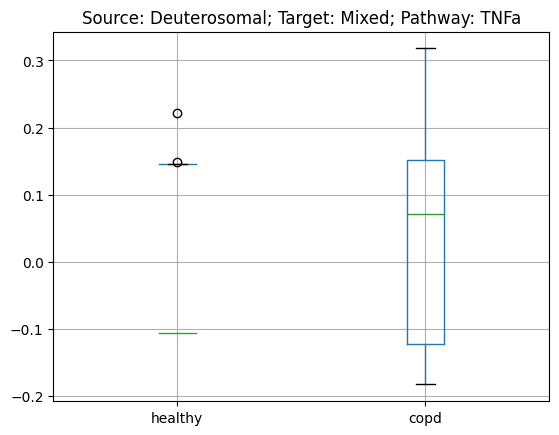

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


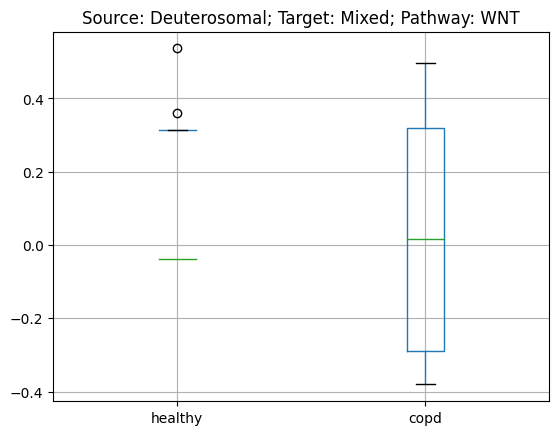

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


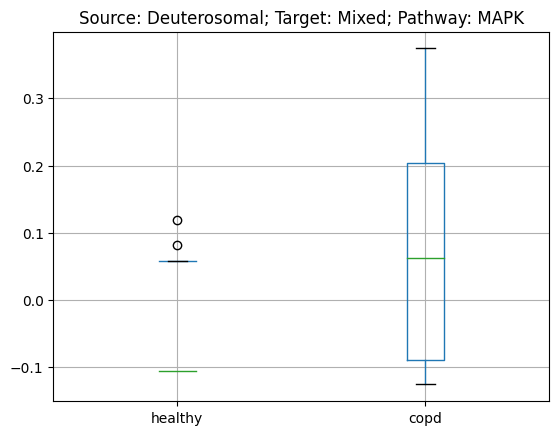

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


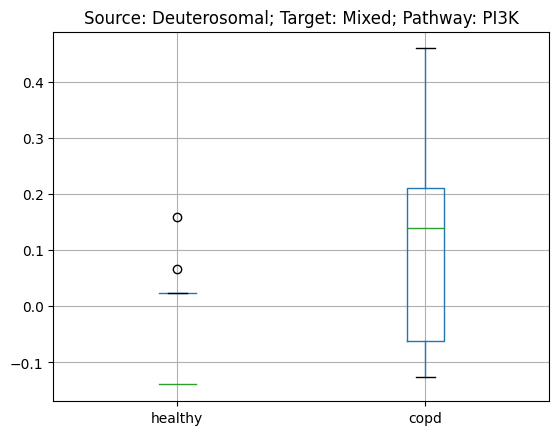

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


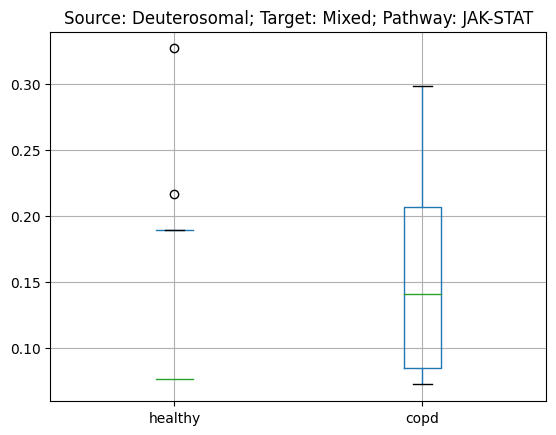

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


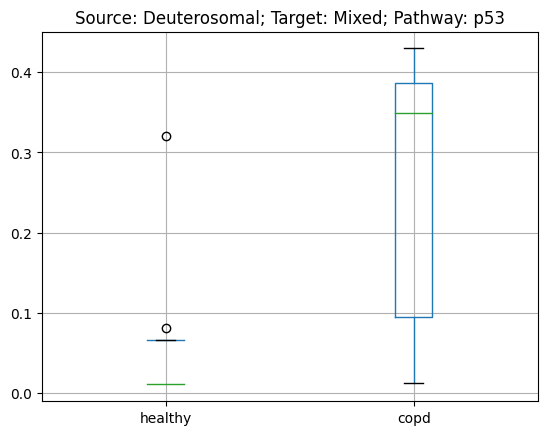

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


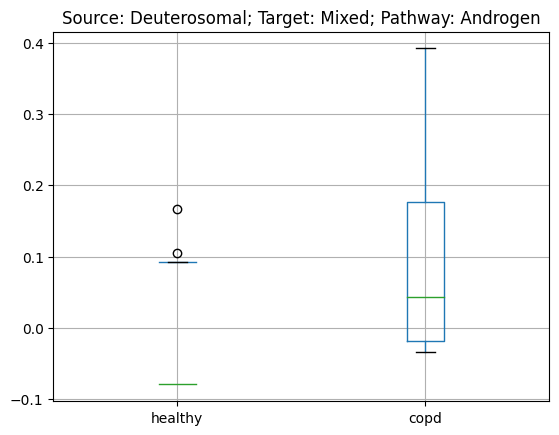

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


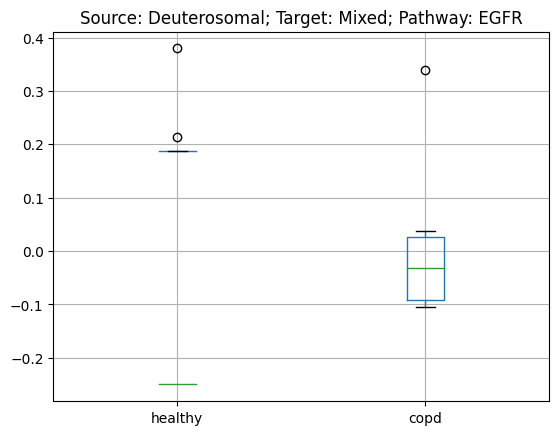

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


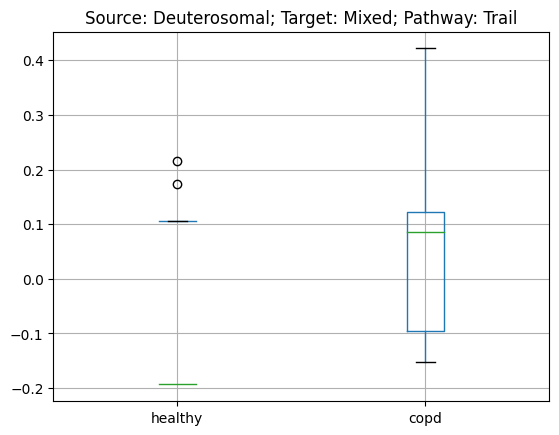

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


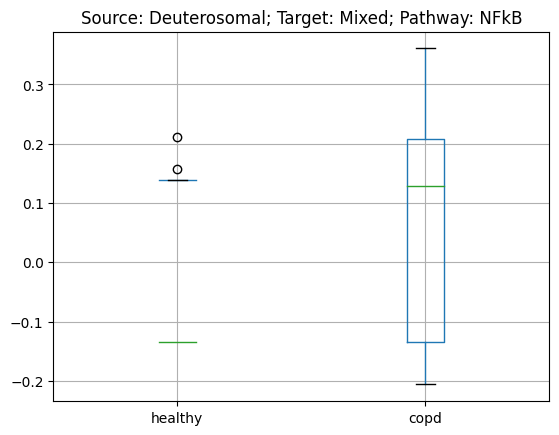

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


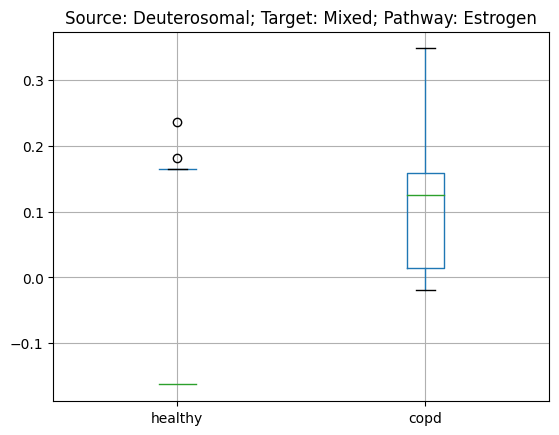

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


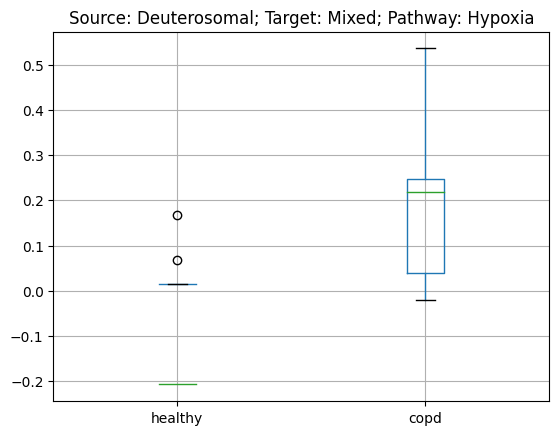

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


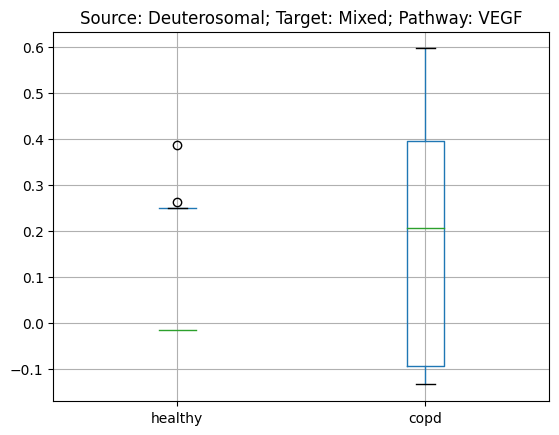

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


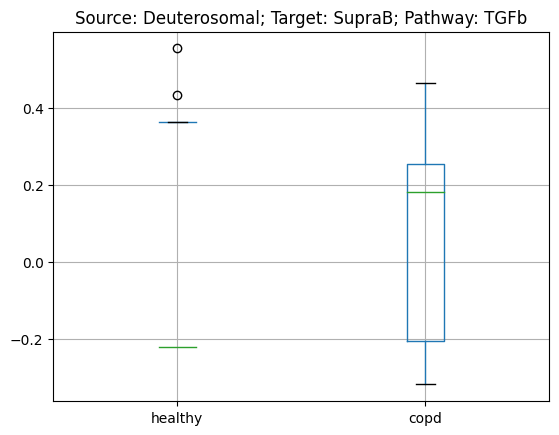

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


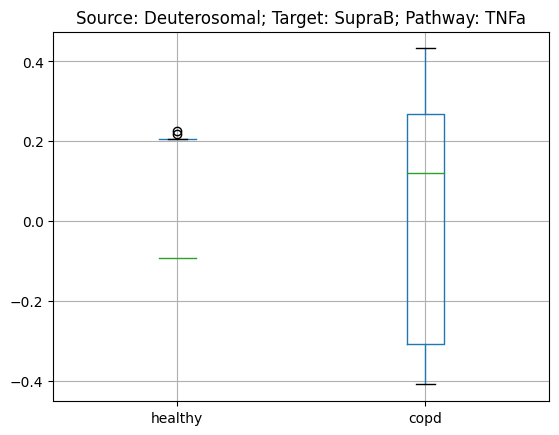

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


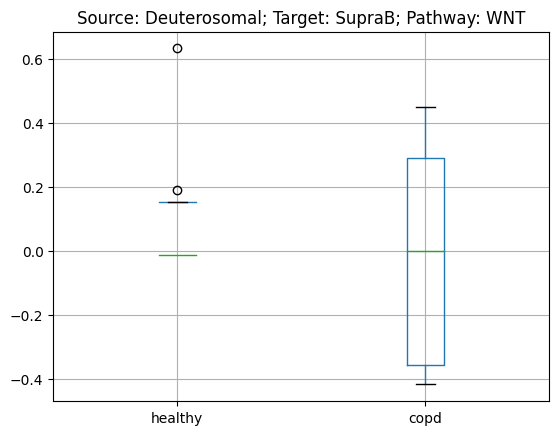

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


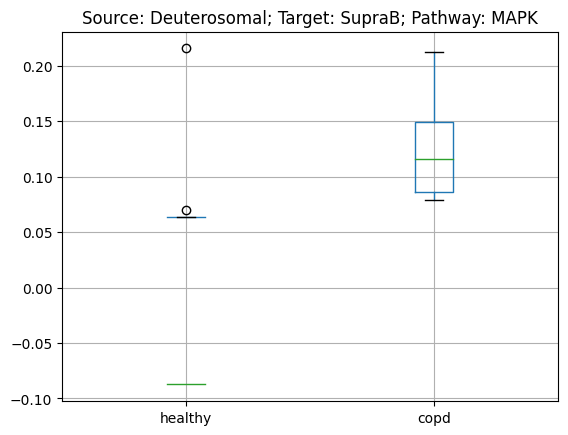

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


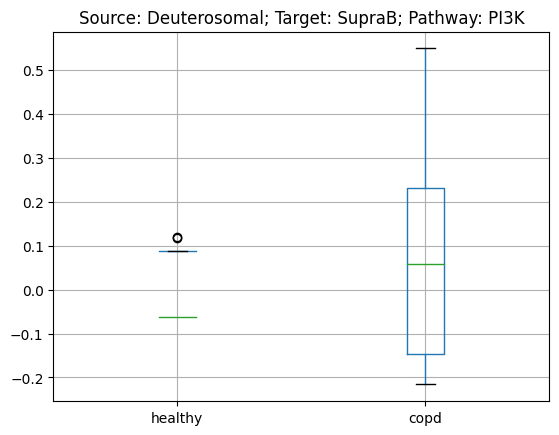

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


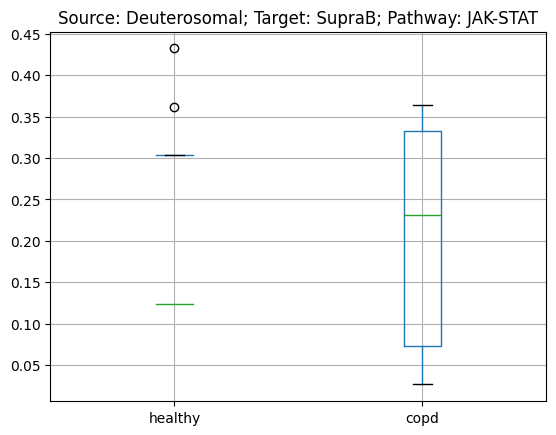

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


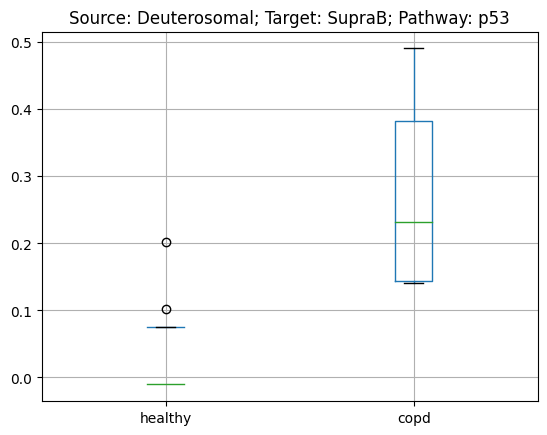

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


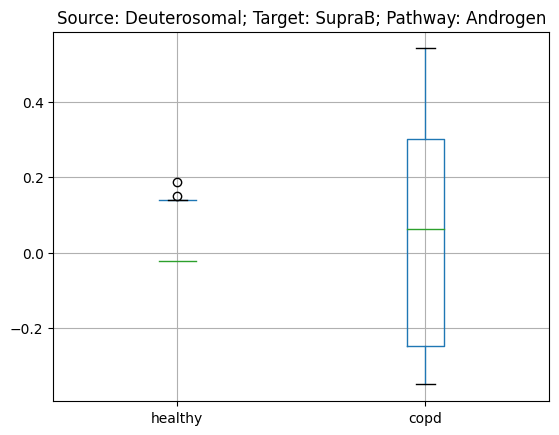

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


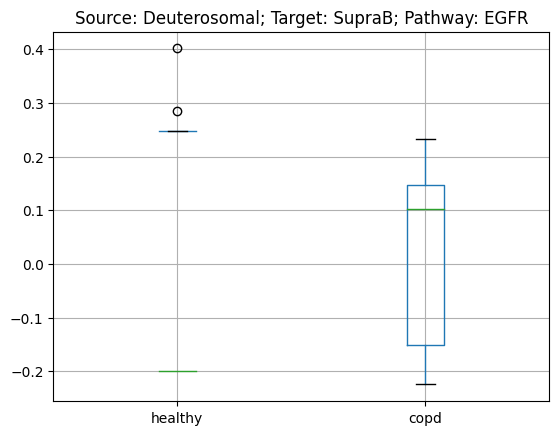

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


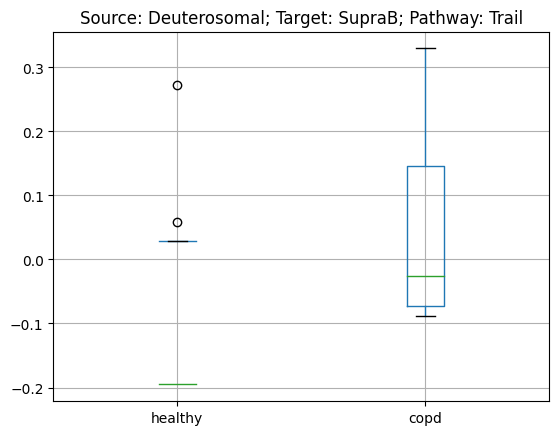

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


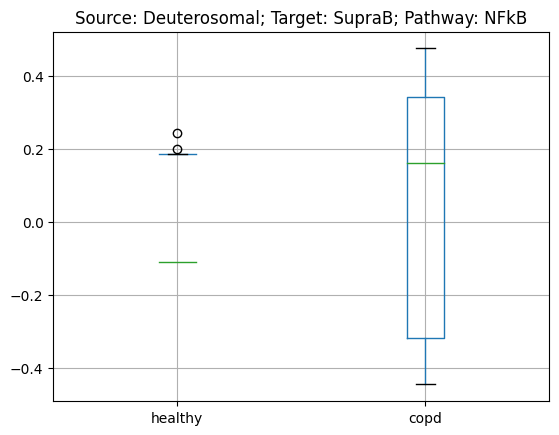

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


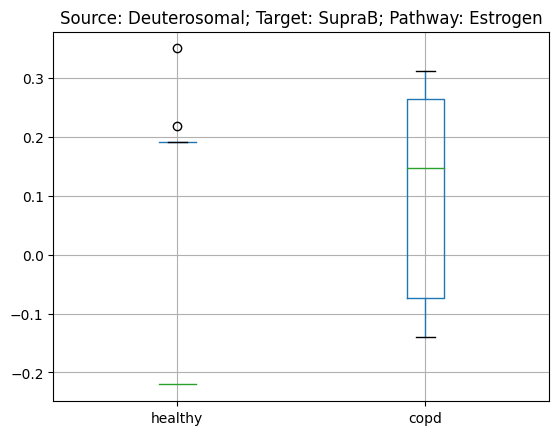

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


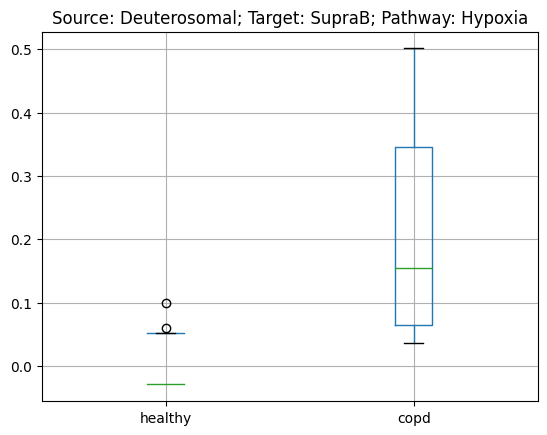

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


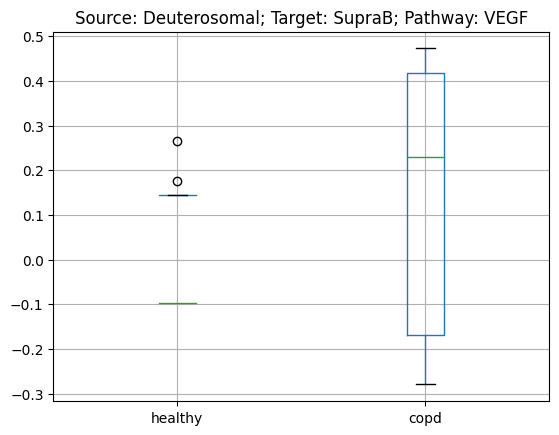

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


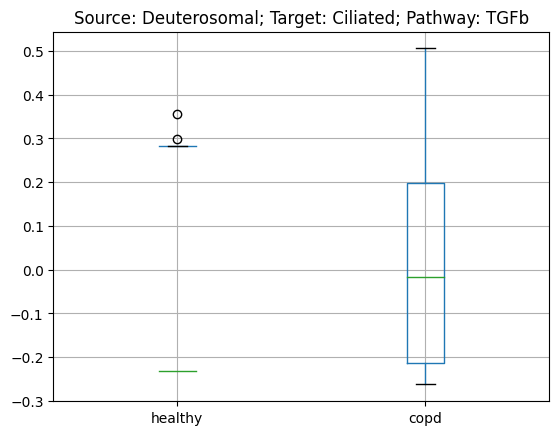

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


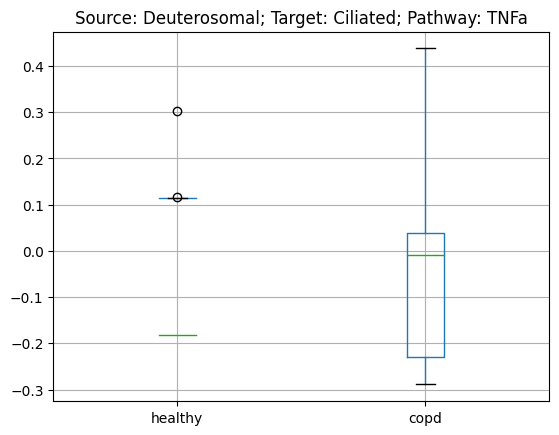

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


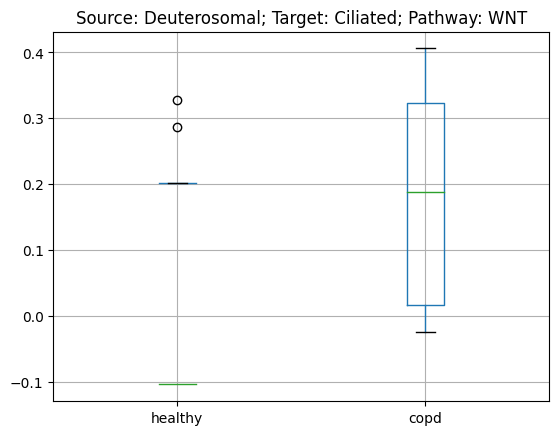

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


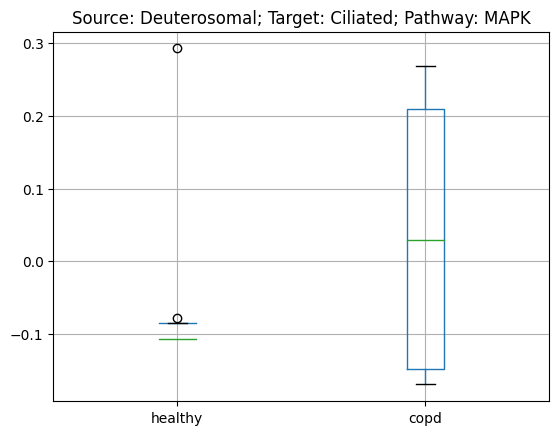

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


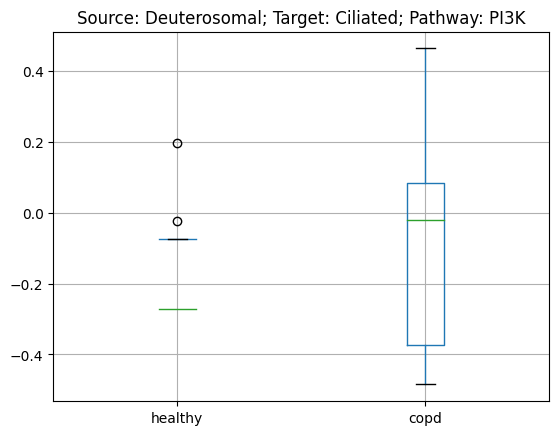

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


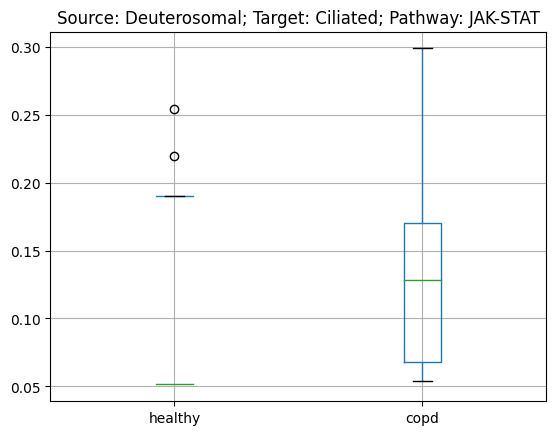

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


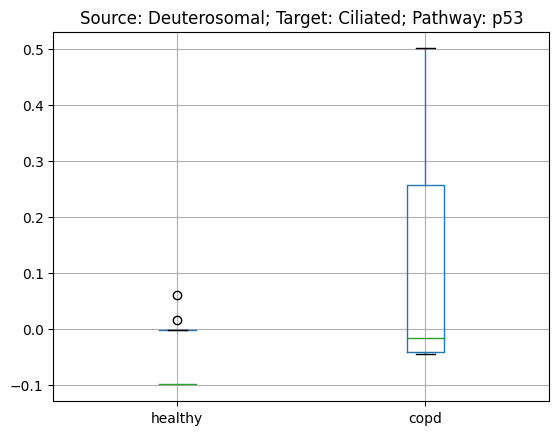

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


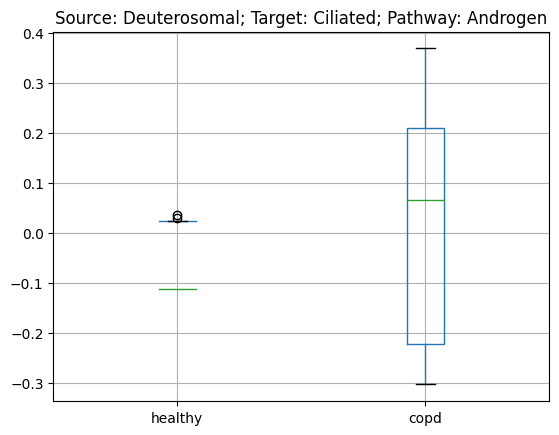

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


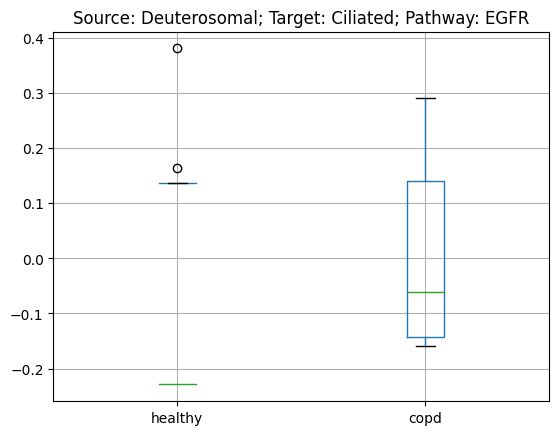

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


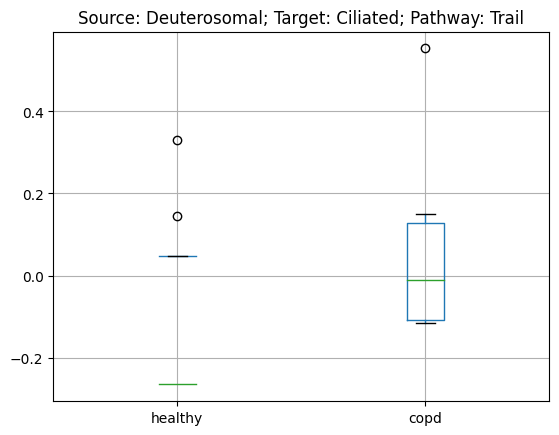

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


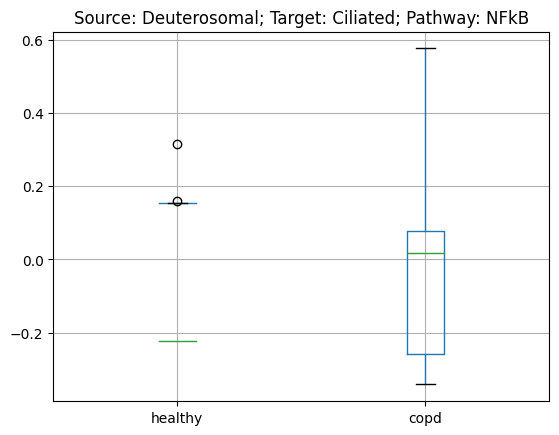

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


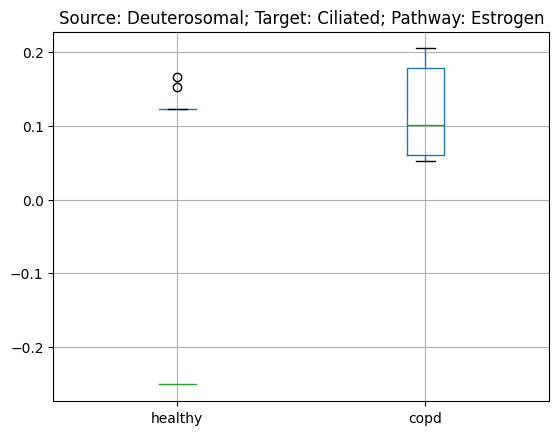

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


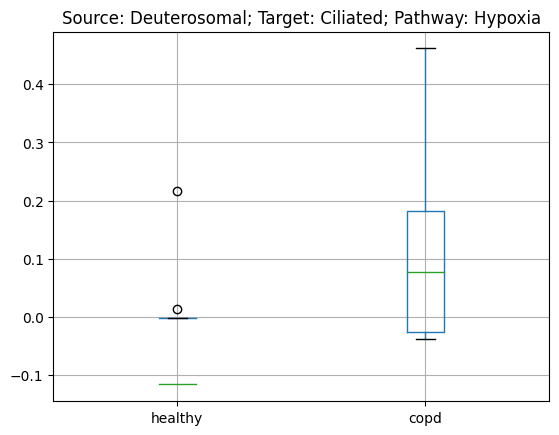

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


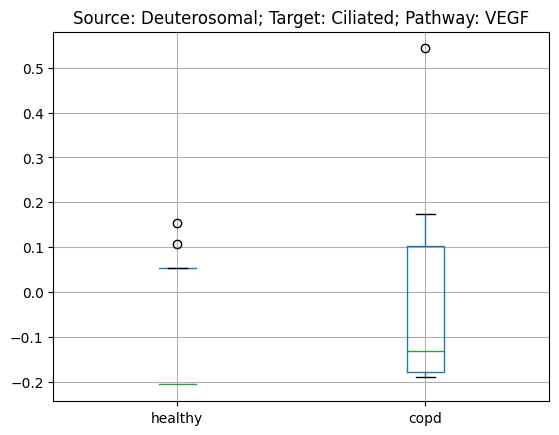

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


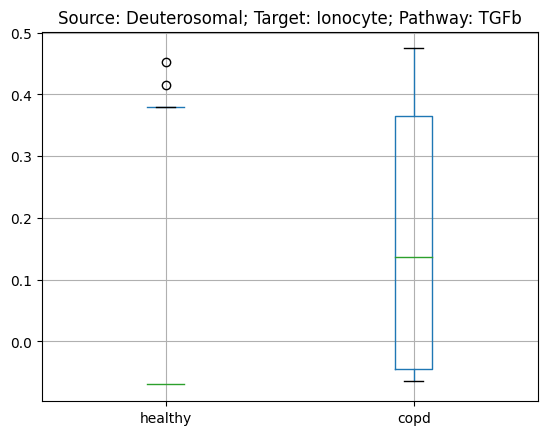

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


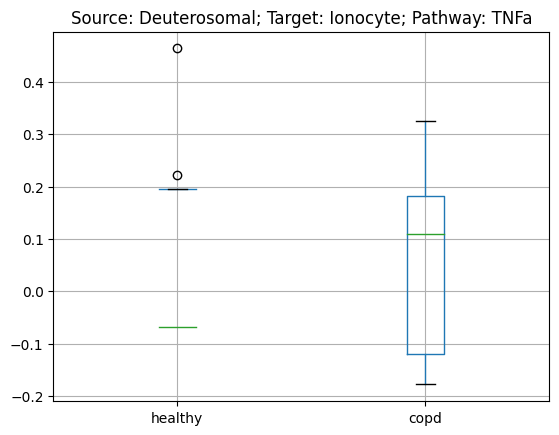

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


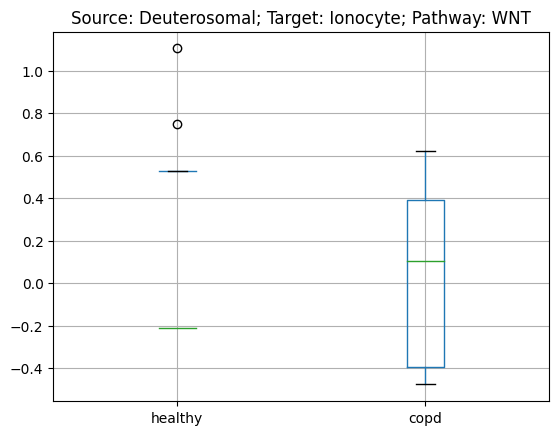

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


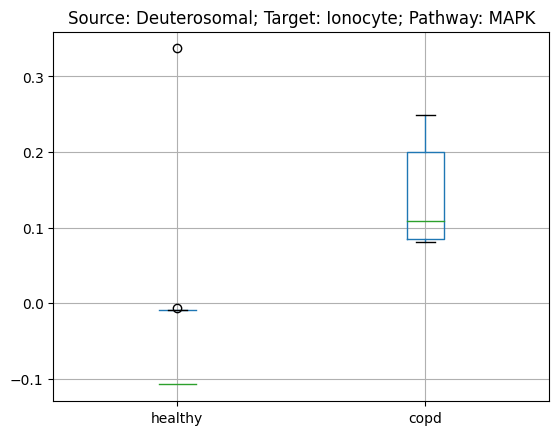

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


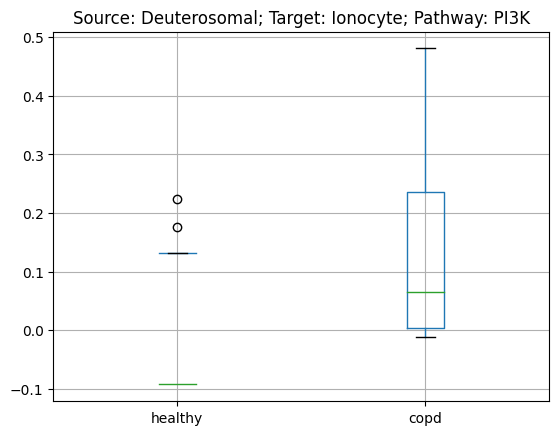

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


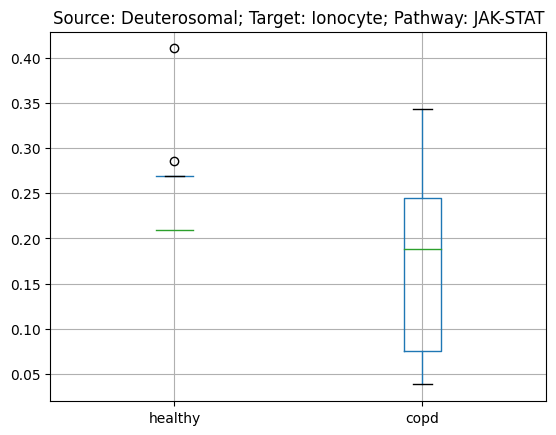

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


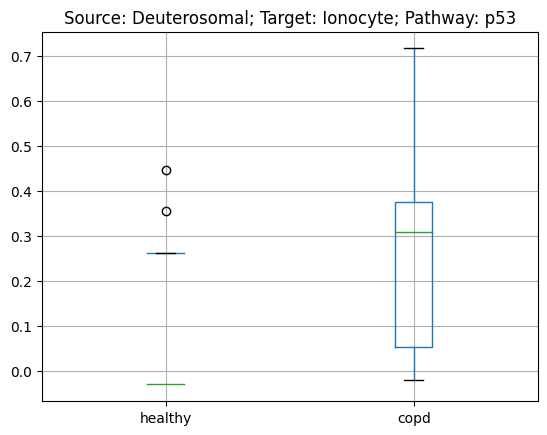

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


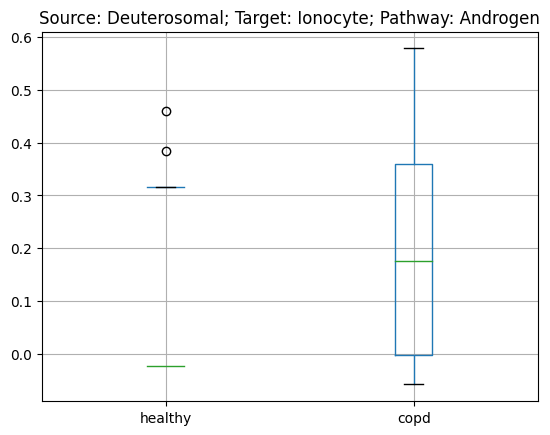

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


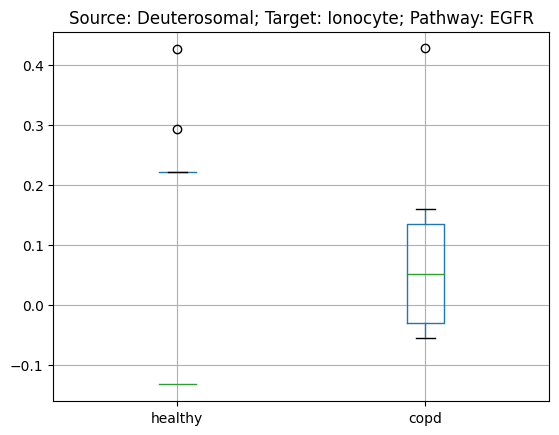

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


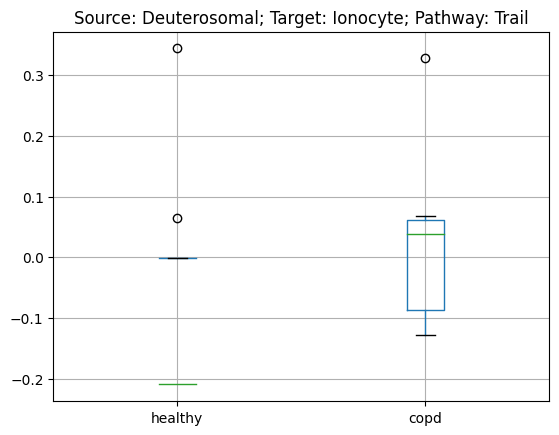

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


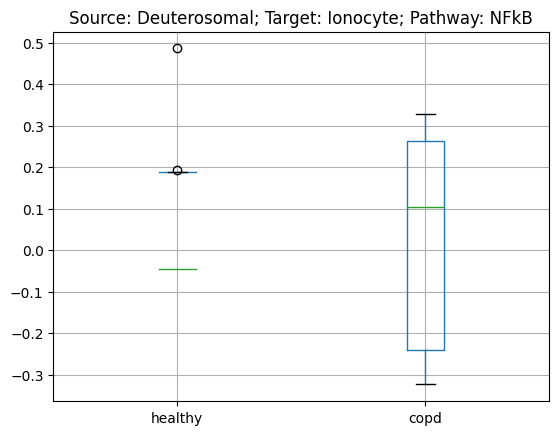

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


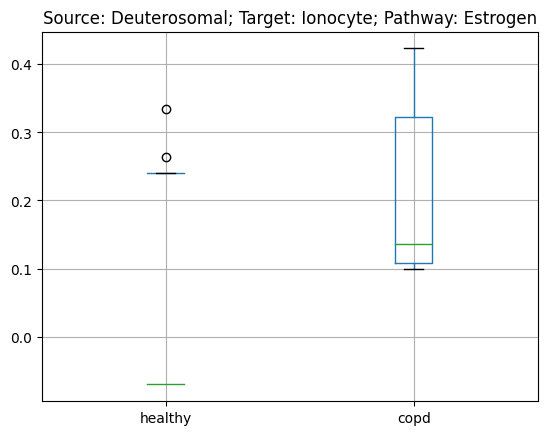

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


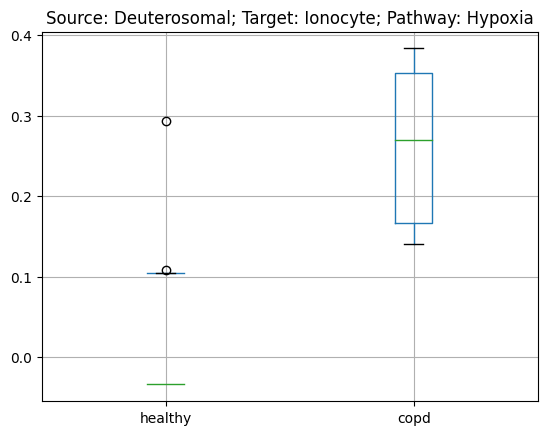

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


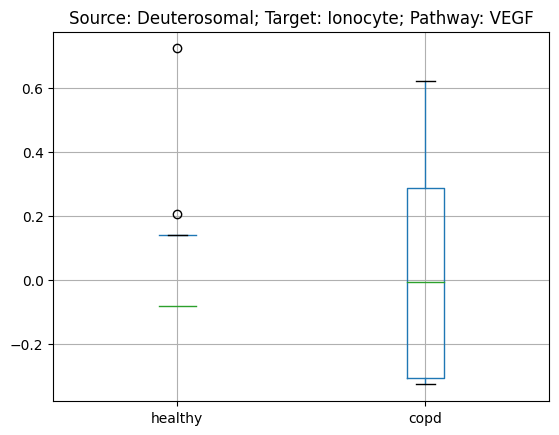

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


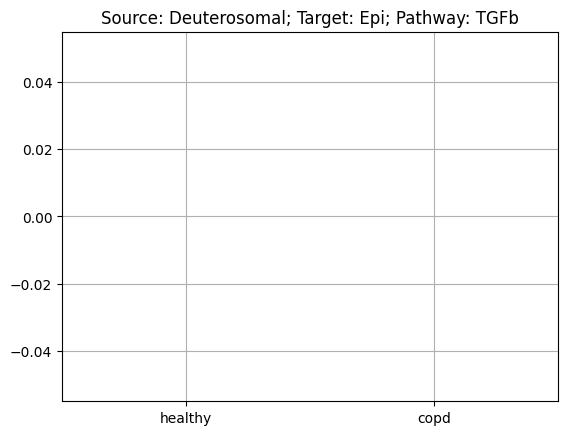

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


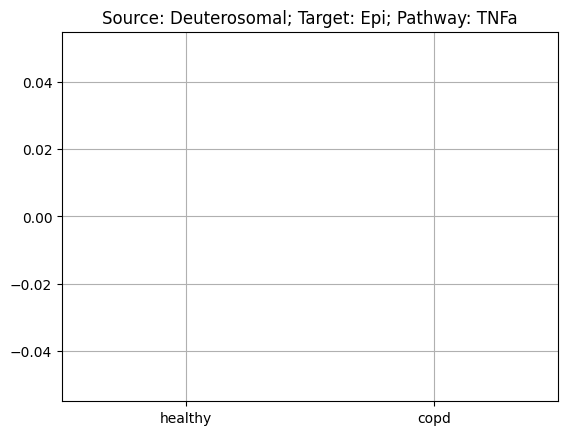

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


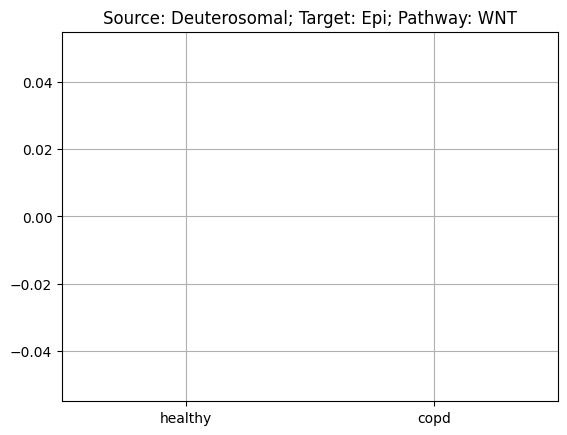

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


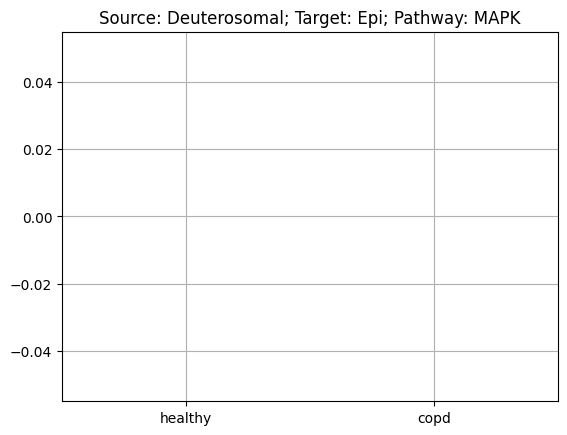

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


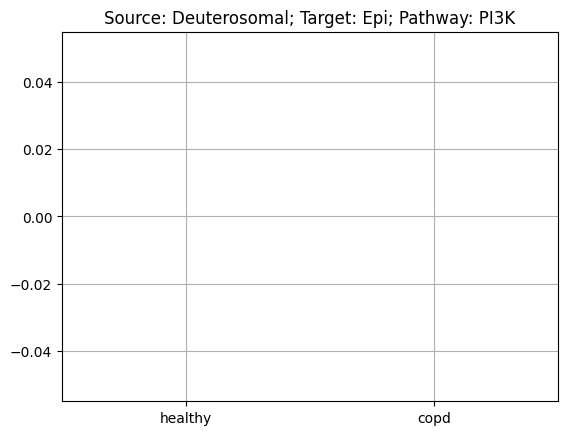

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


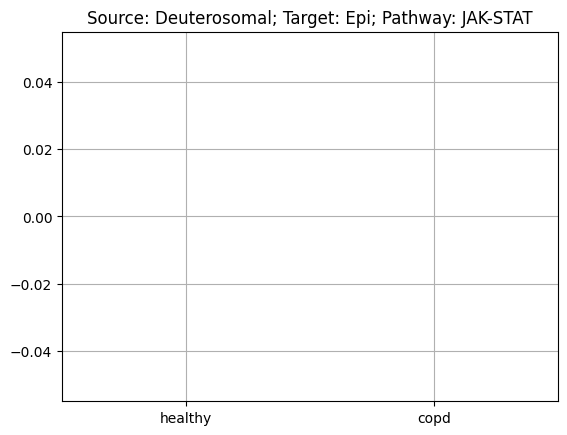

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


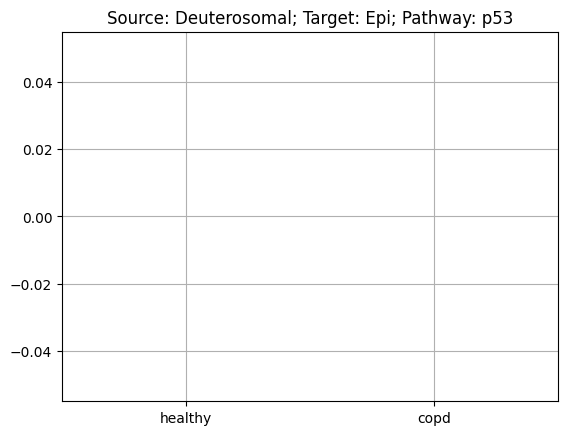

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


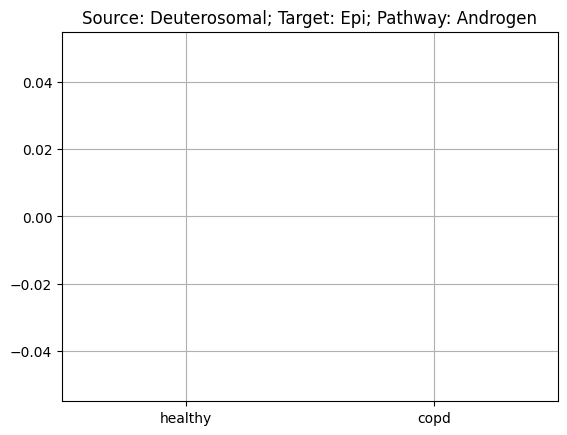

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


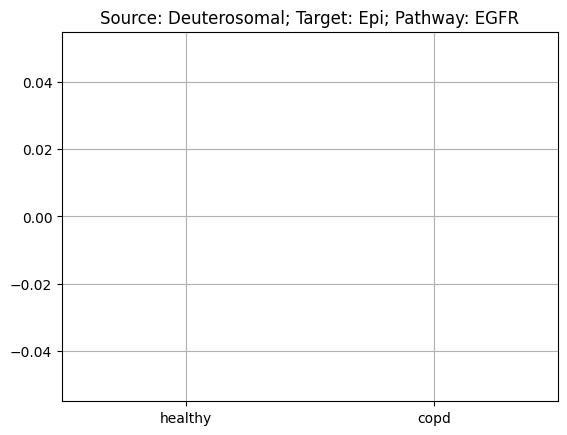

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


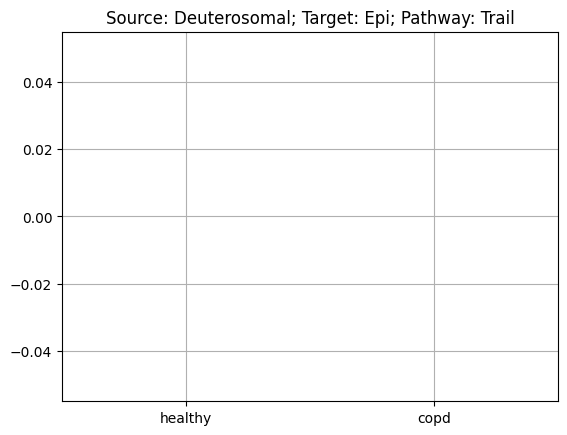

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


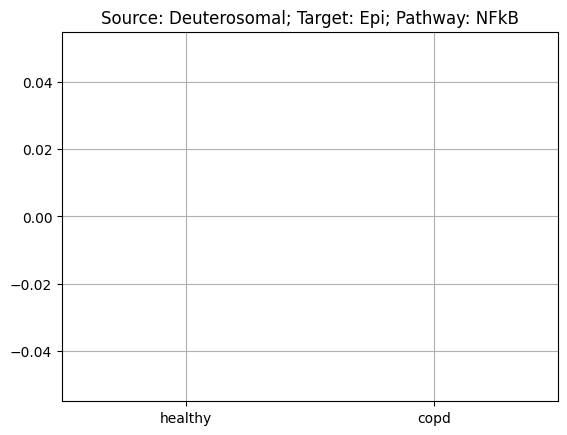

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


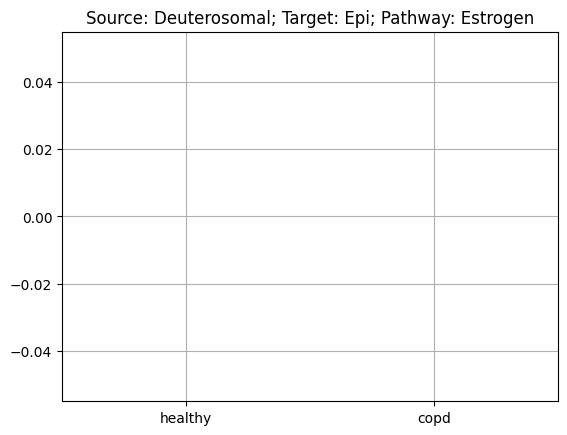

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


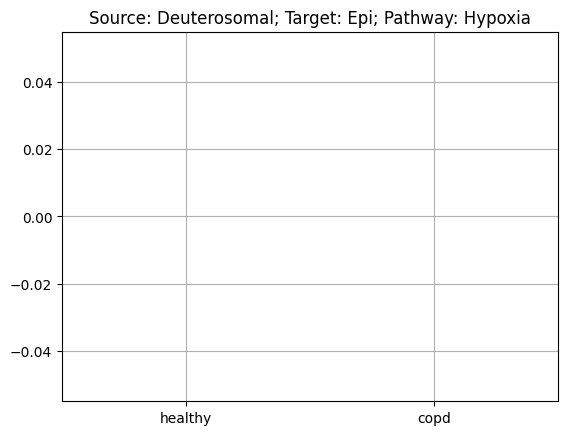

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


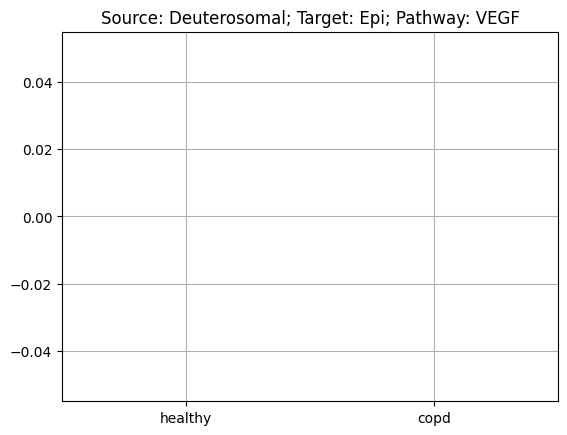

 10%|█         | 1/10 [01:53<17:03, 113.71s/it]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encount

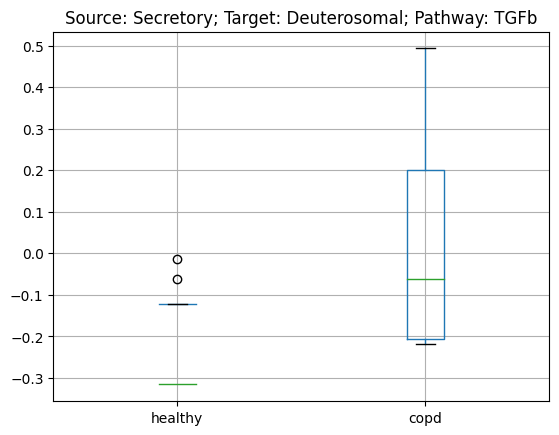

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


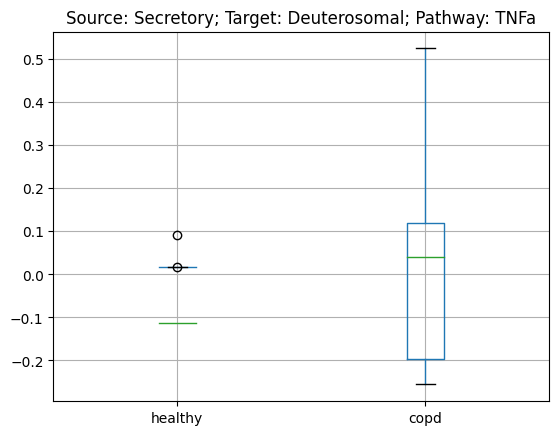

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


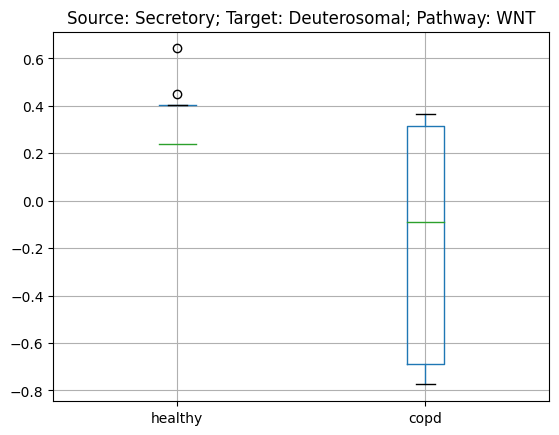

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


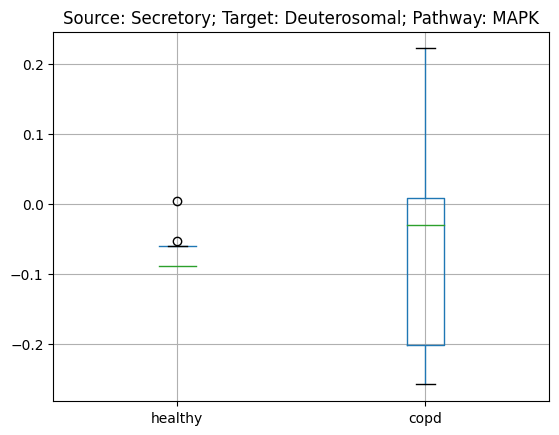

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


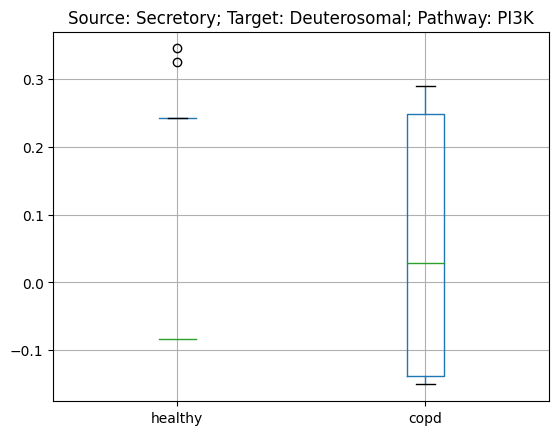

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


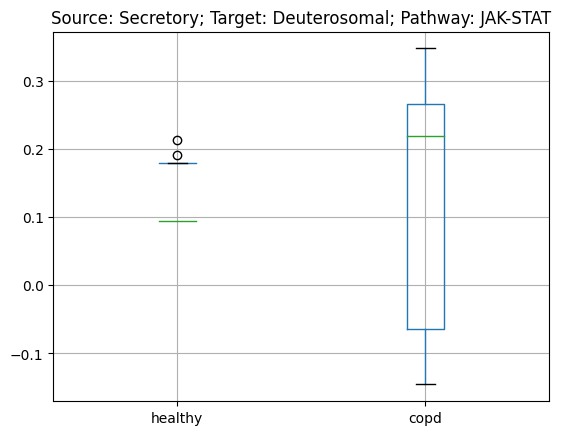

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


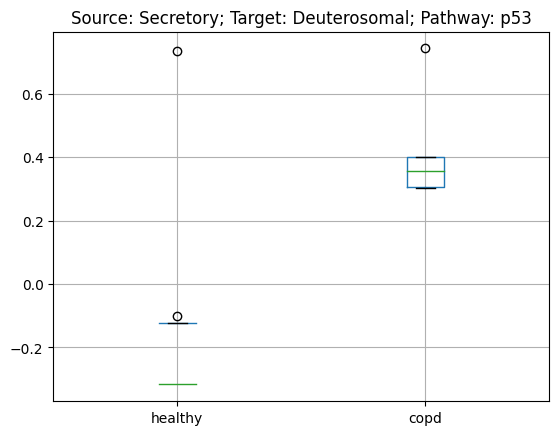

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


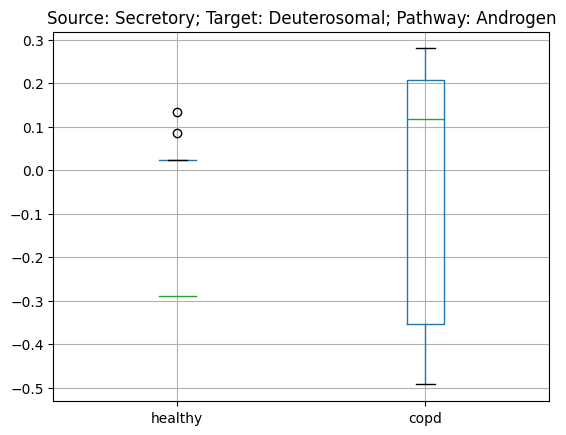

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


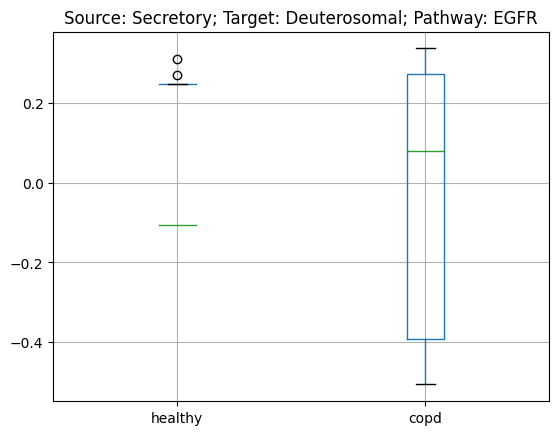

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


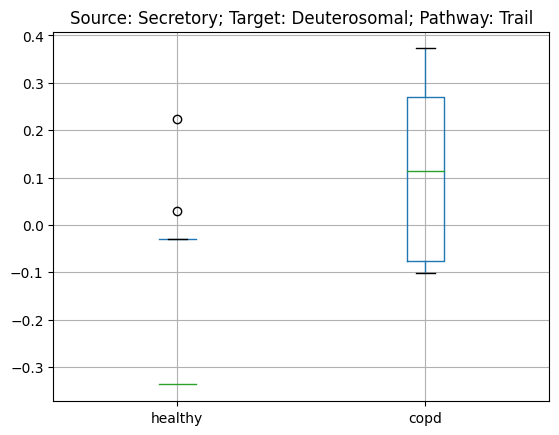

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


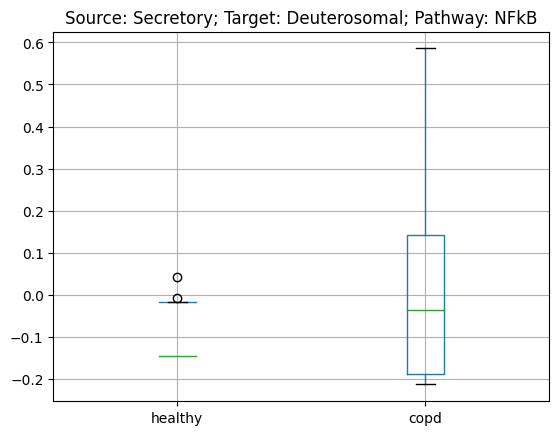

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


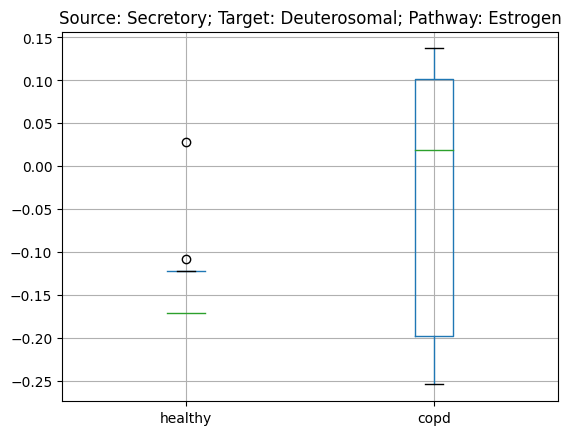

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


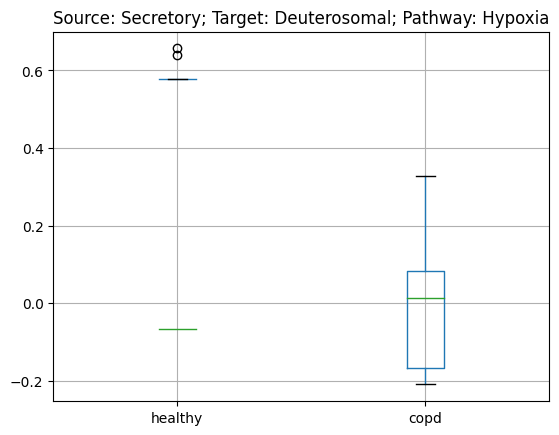

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


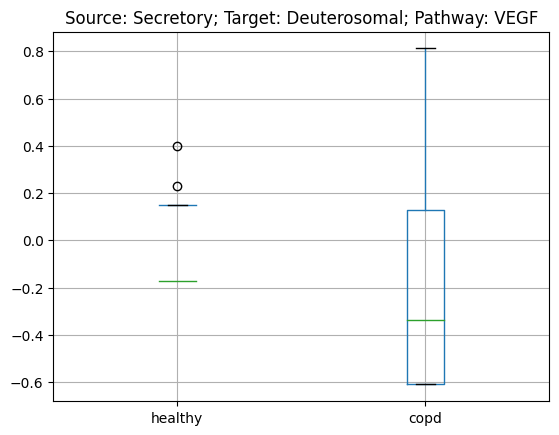

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


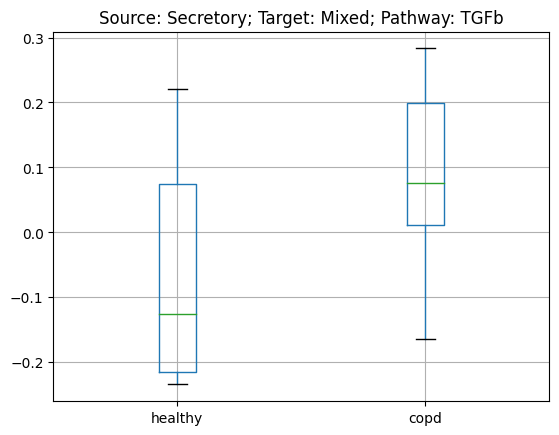

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


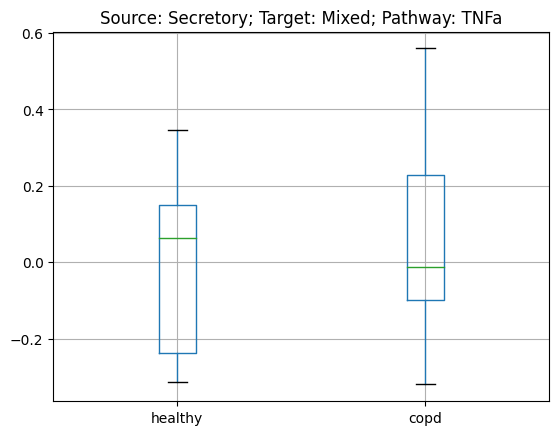

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


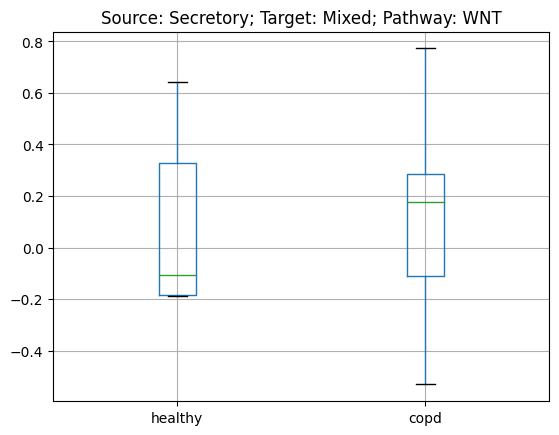

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


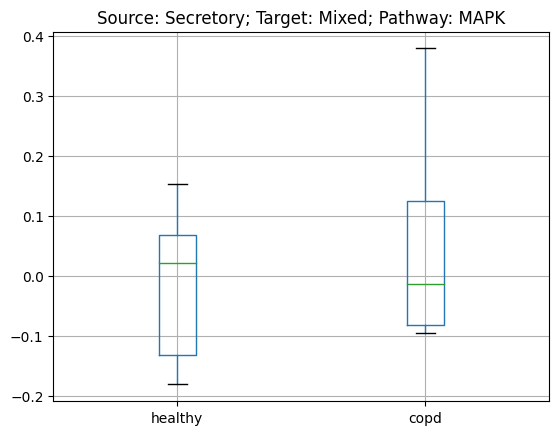

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


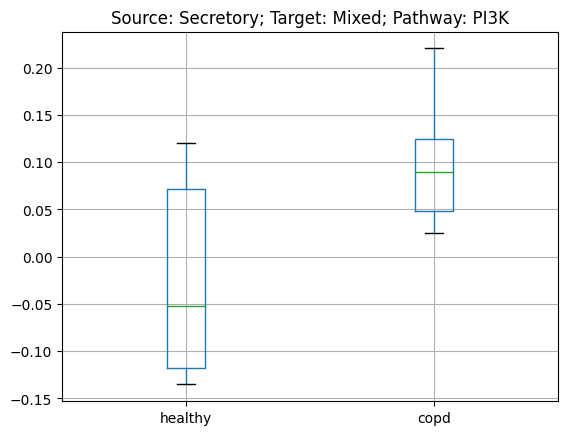

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


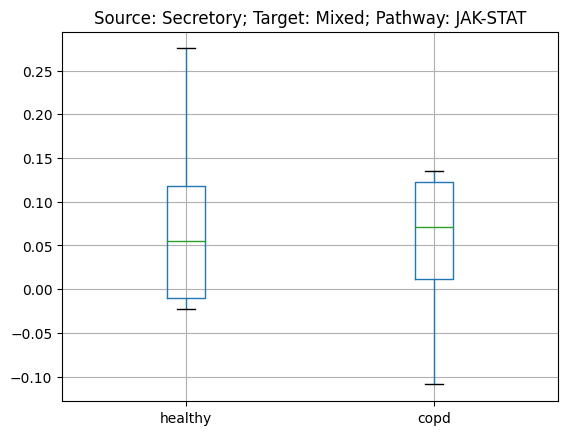

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


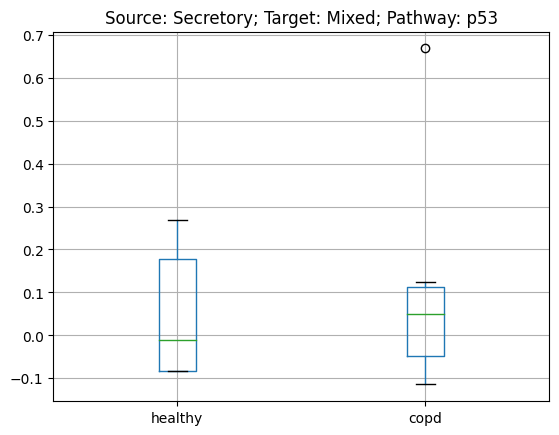

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


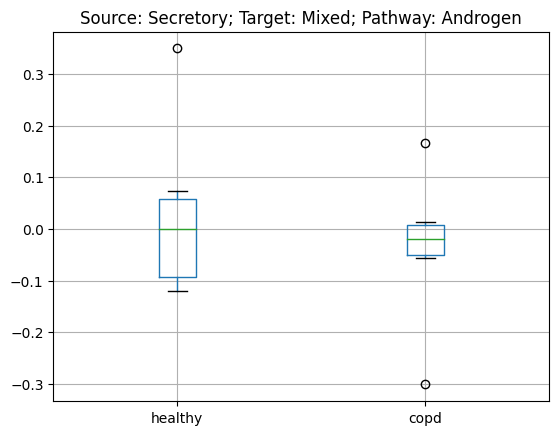

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


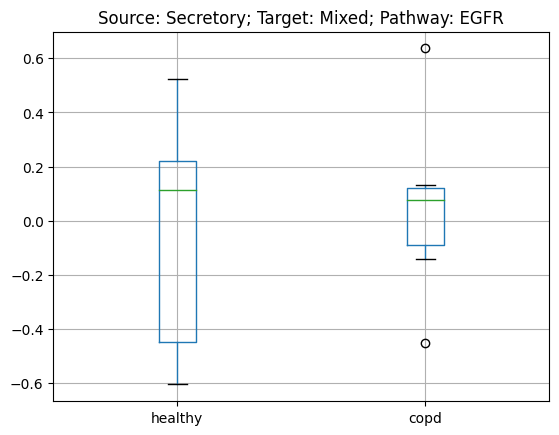

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


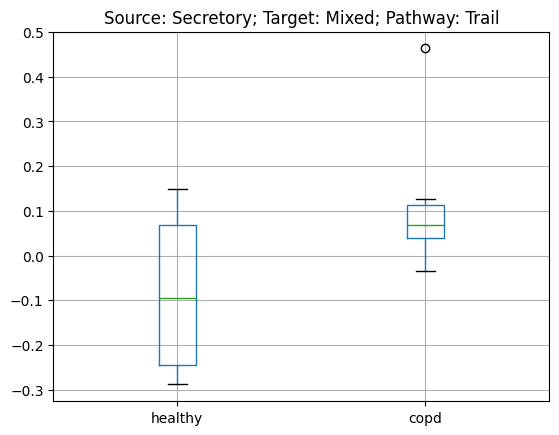

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


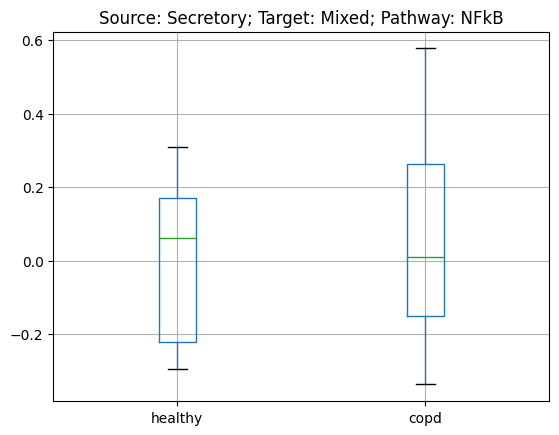

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


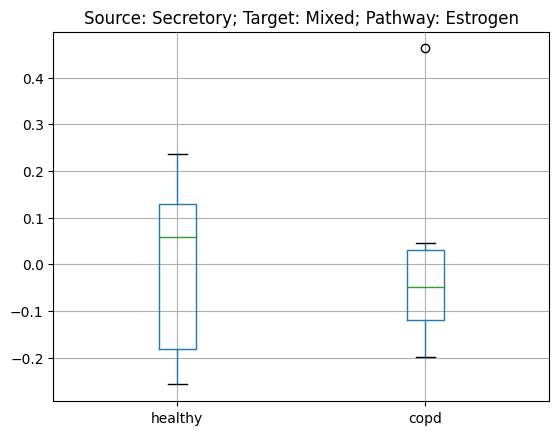

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


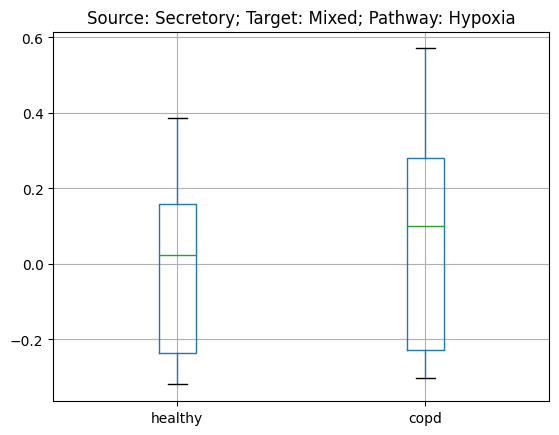

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


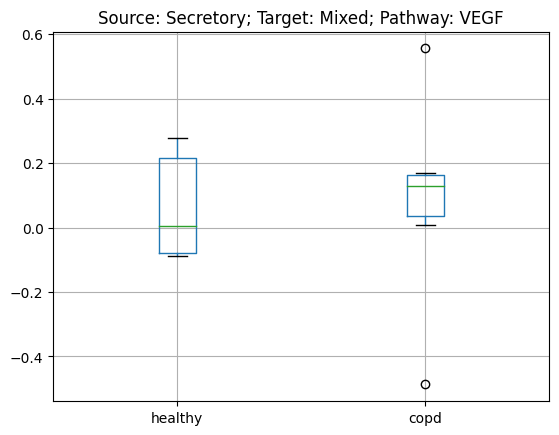

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


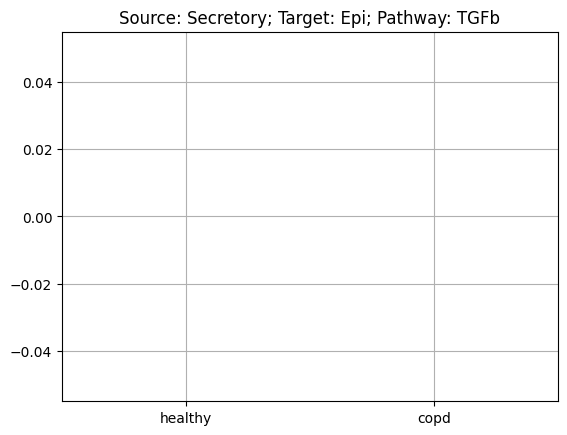

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


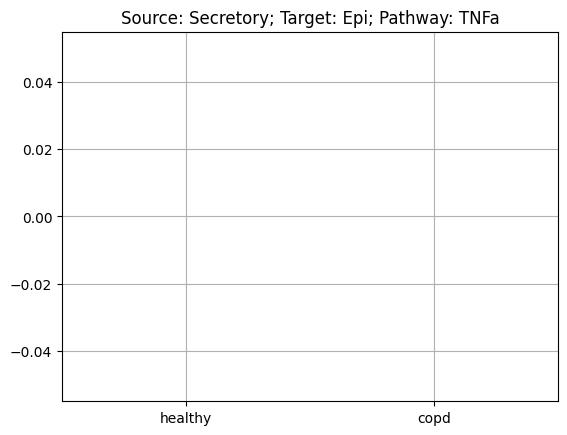

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


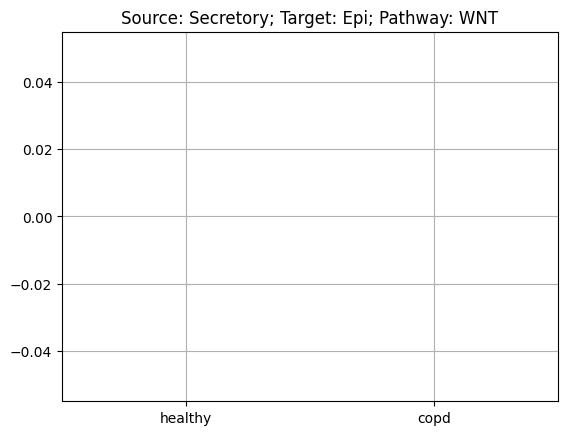

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


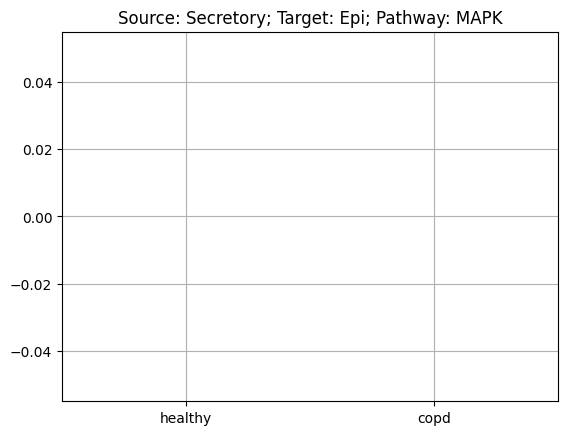

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


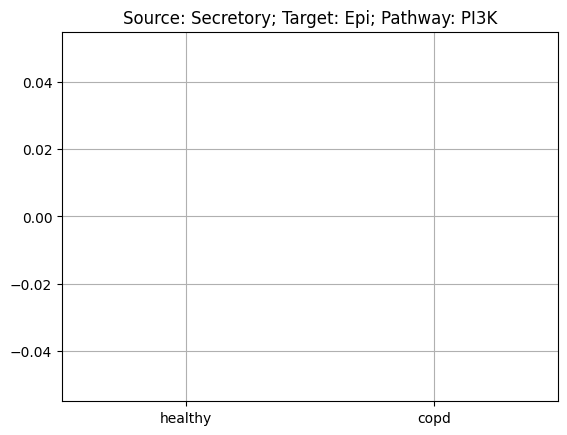

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


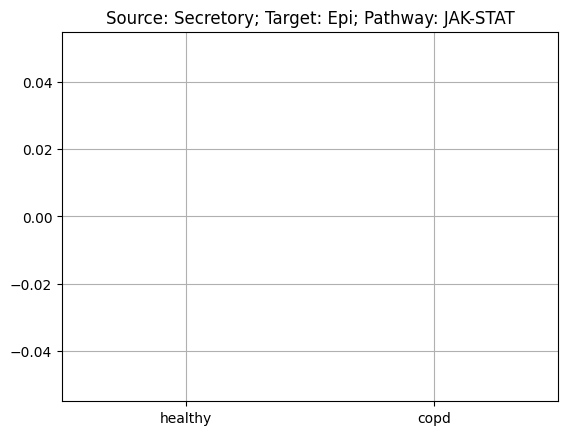

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


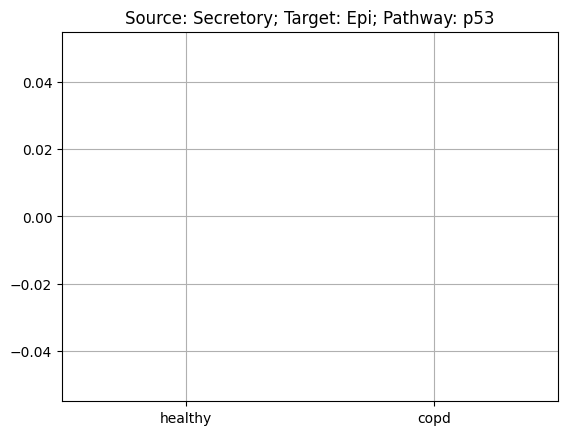

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


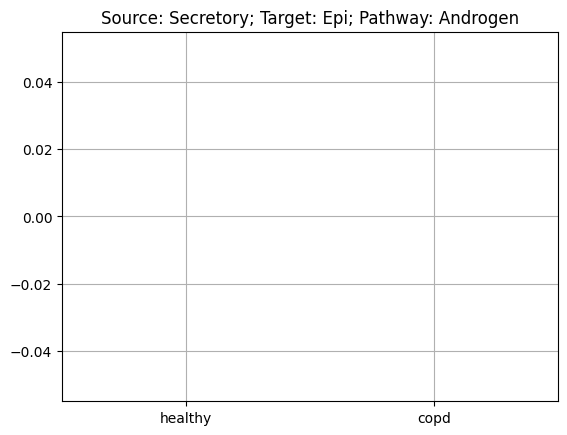

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


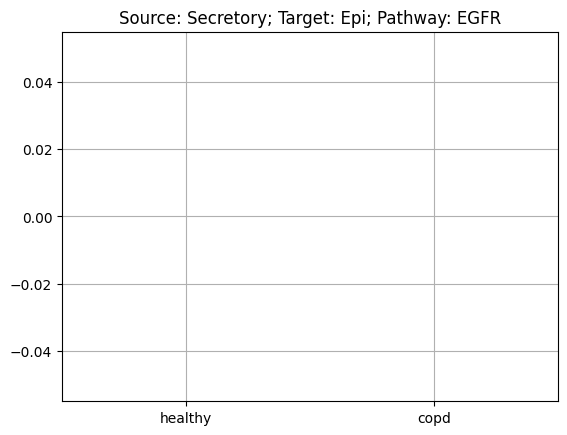

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


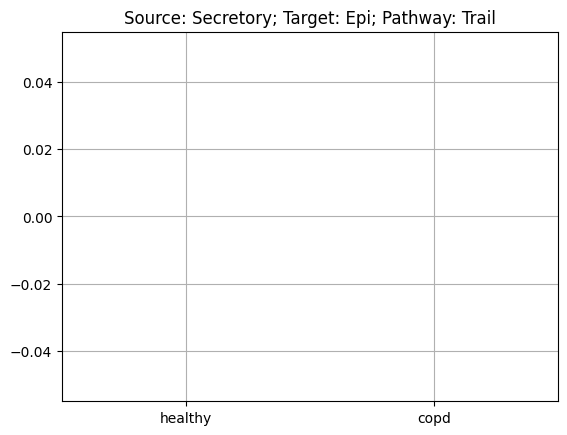

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


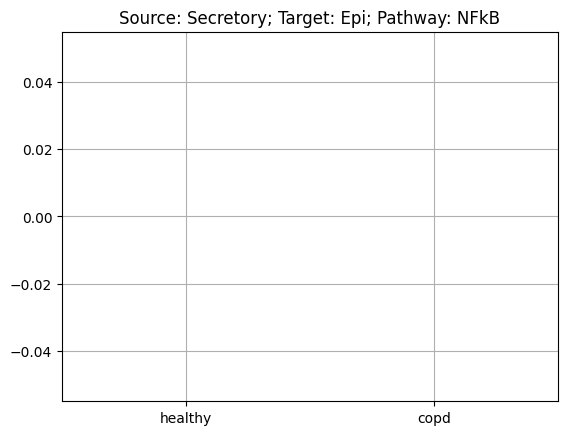

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


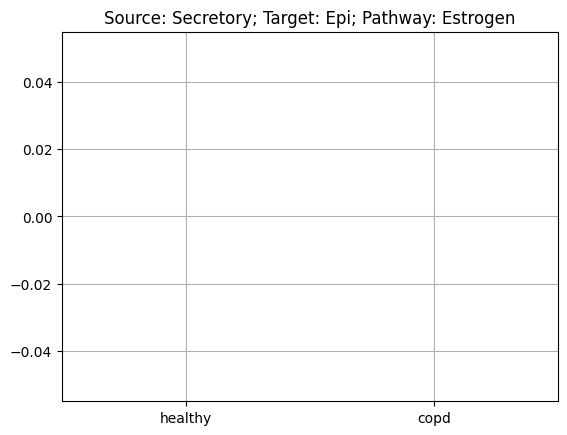

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


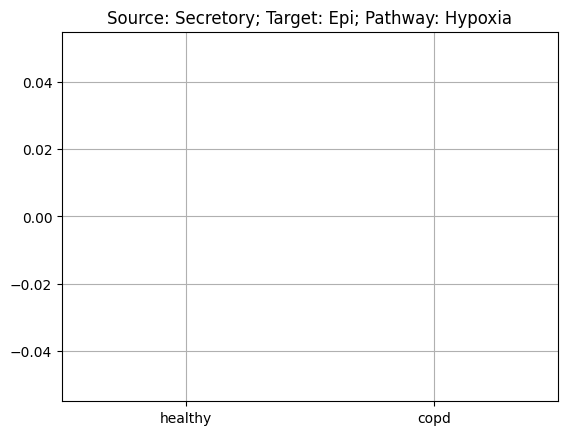

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


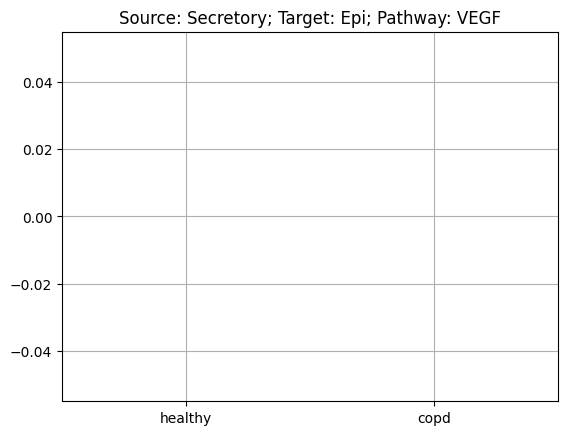

 20%|██        | 2/10 [03:40<14:39, 109.91s/it]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encount

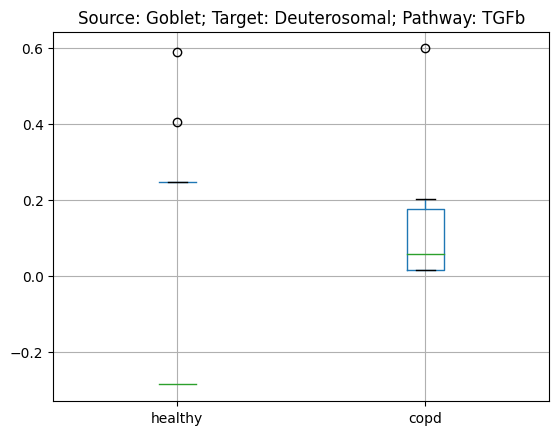

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


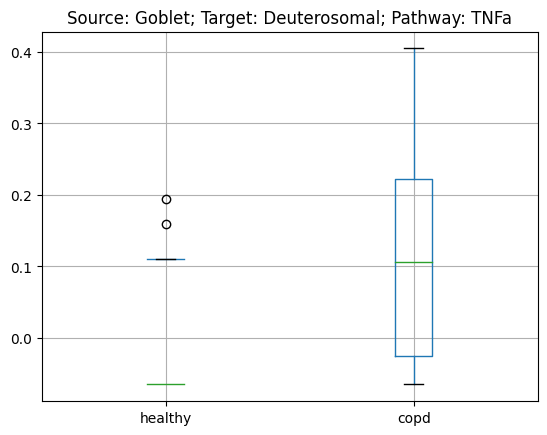

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


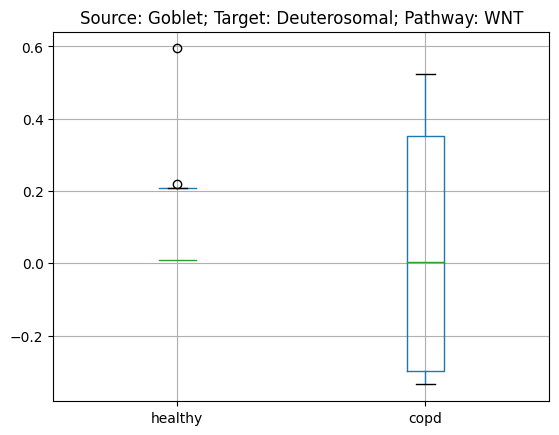

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


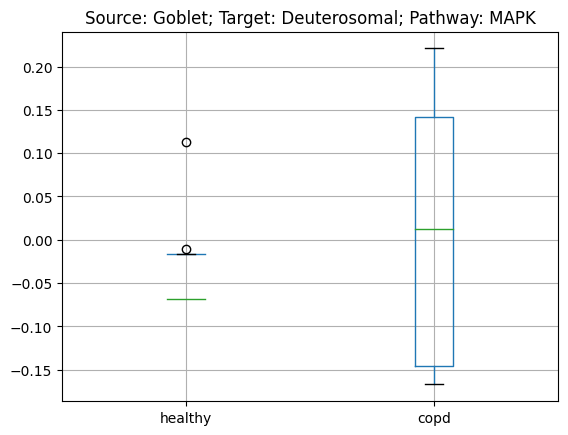

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


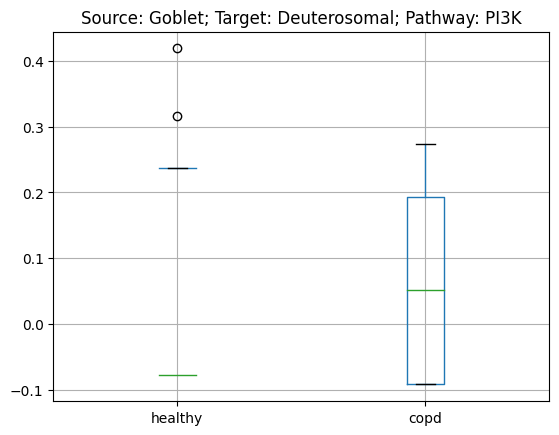

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


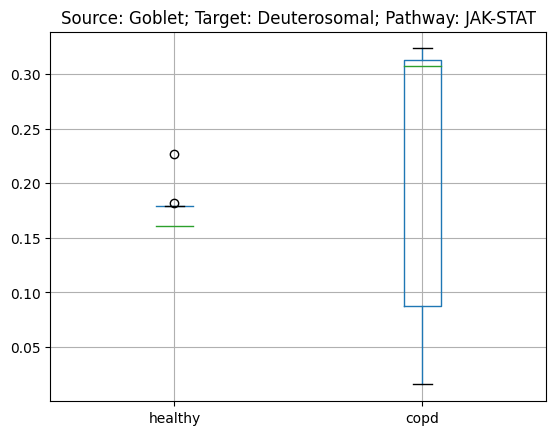

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


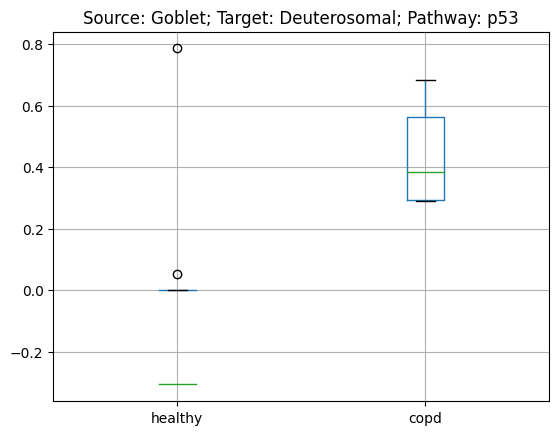

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


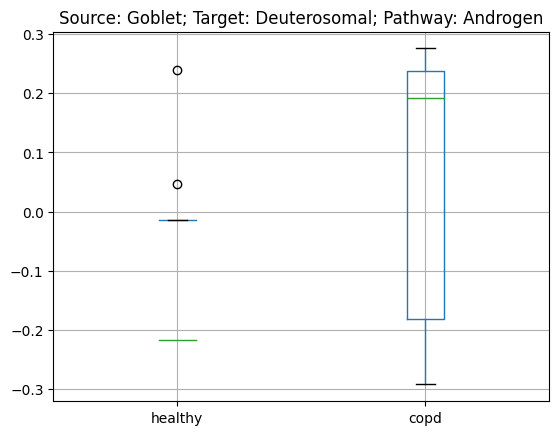

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


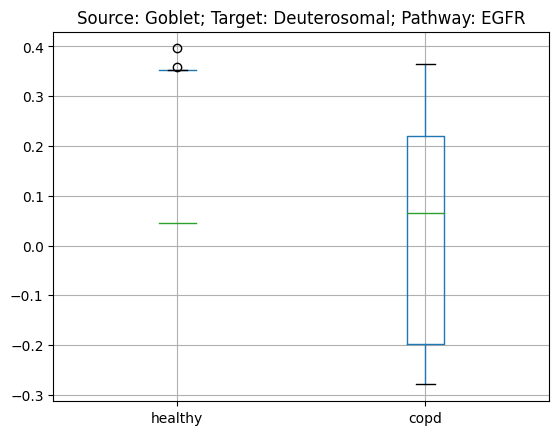

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


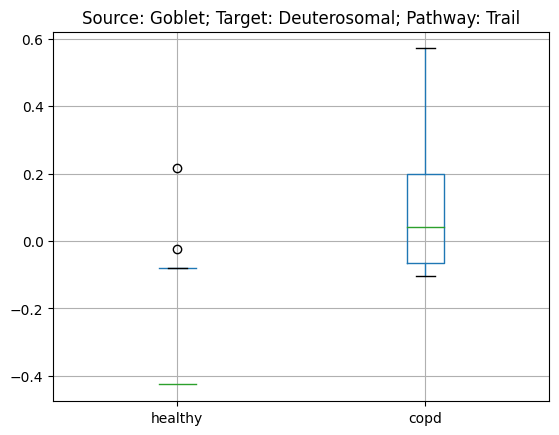

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


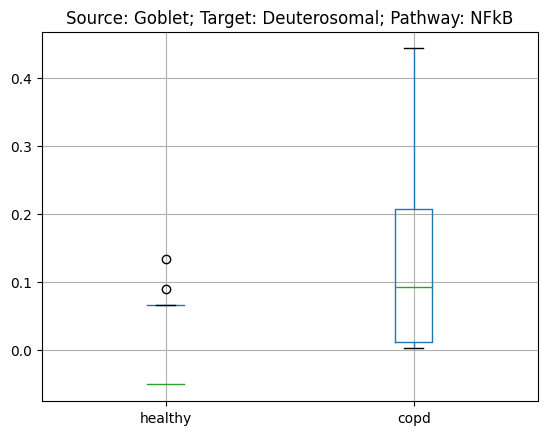

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


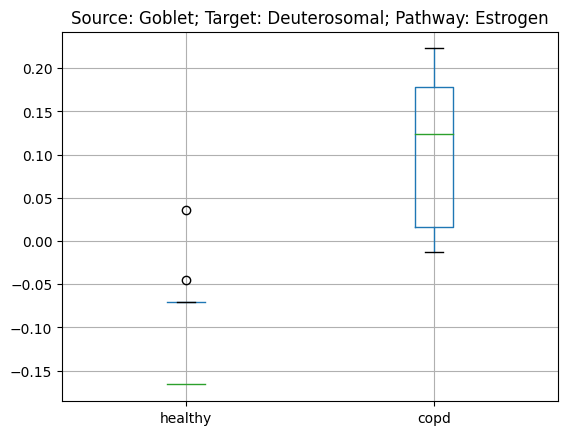

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


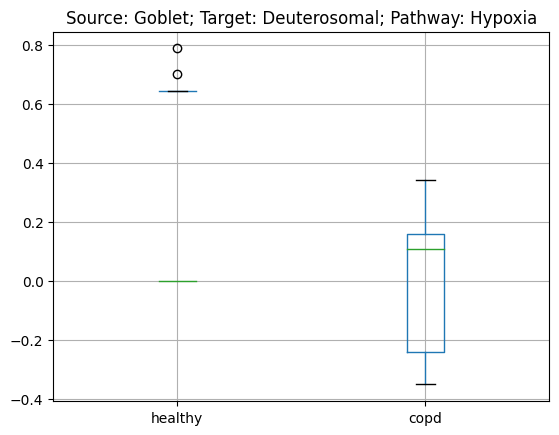

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


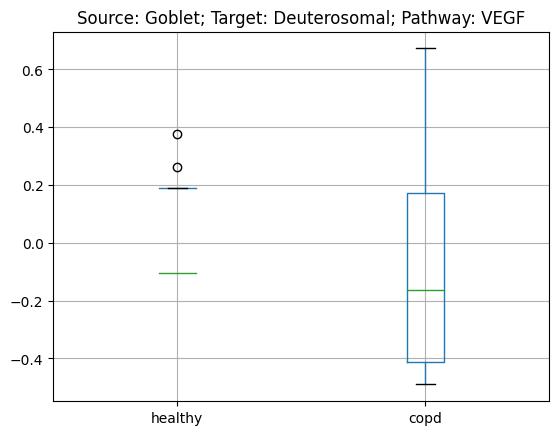

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


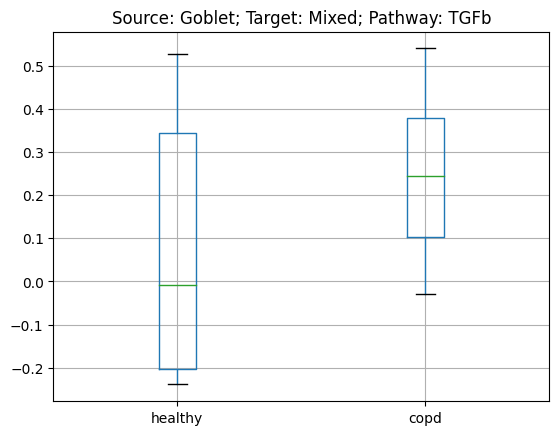

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


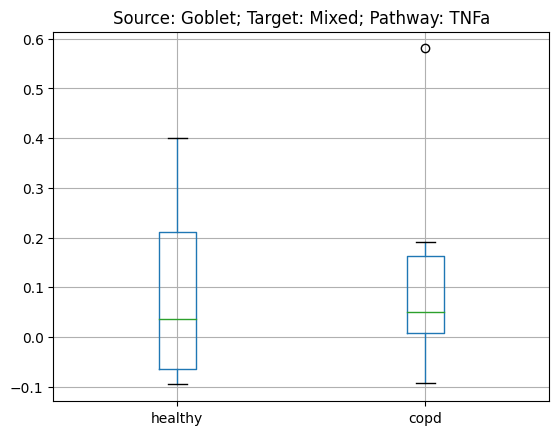

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


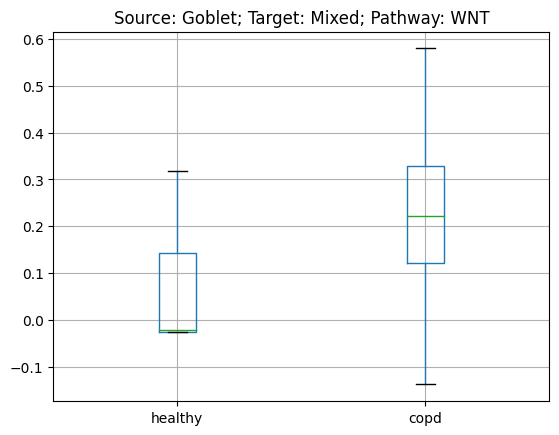

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


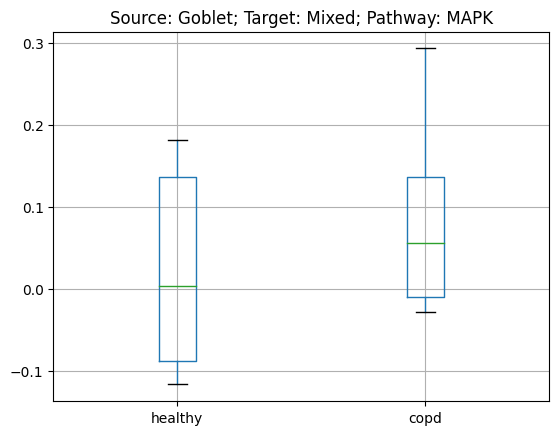

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


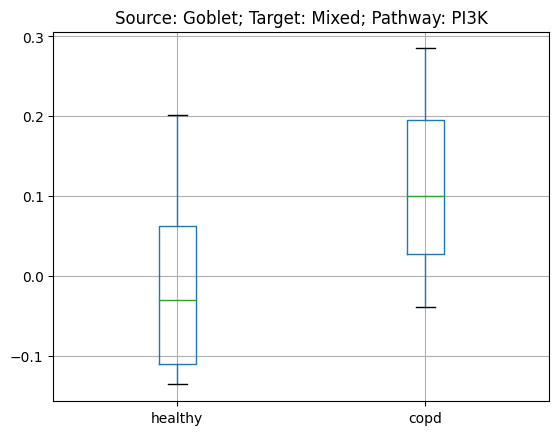

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


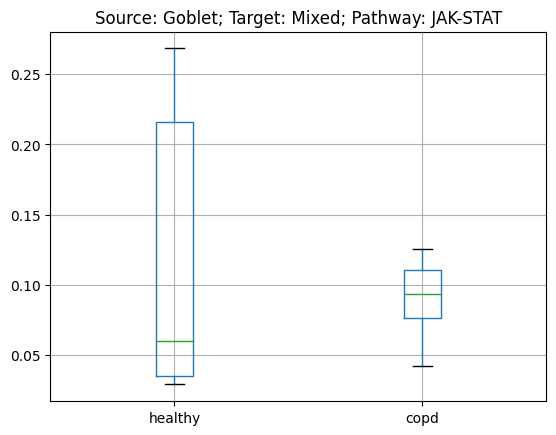

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


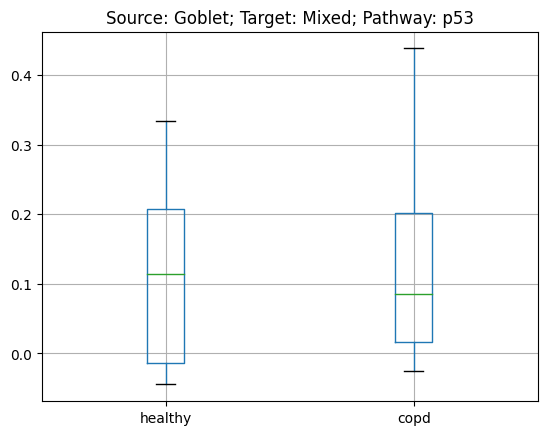

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


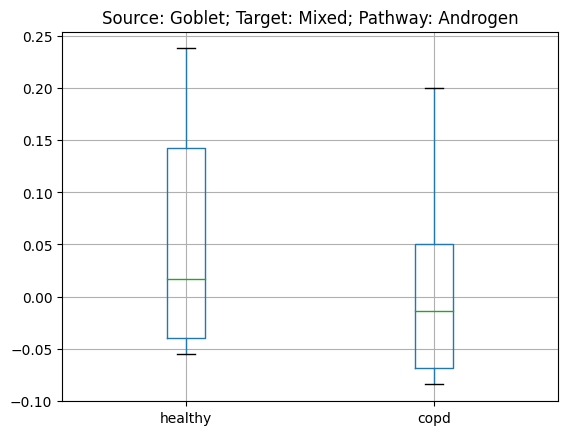

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


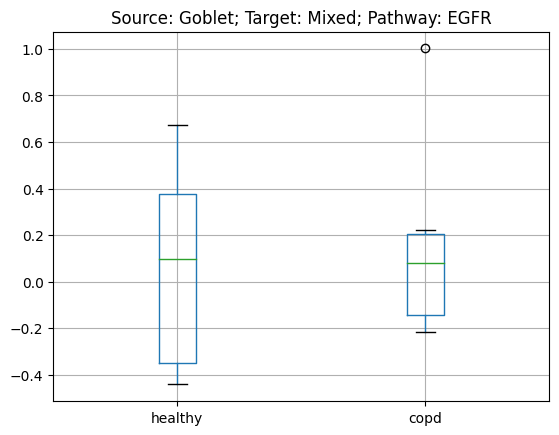

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


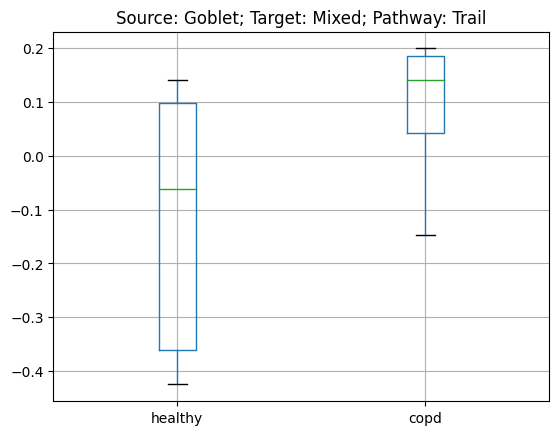

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


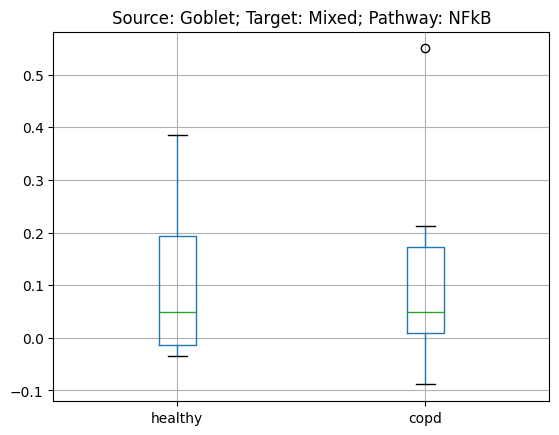

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


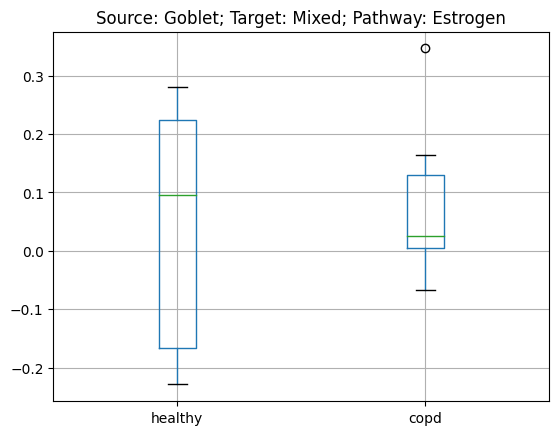

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


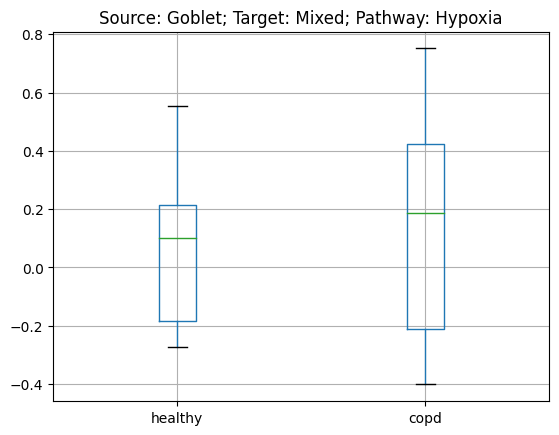

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


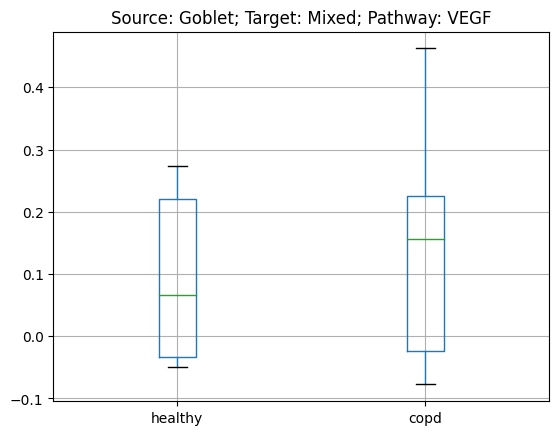

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


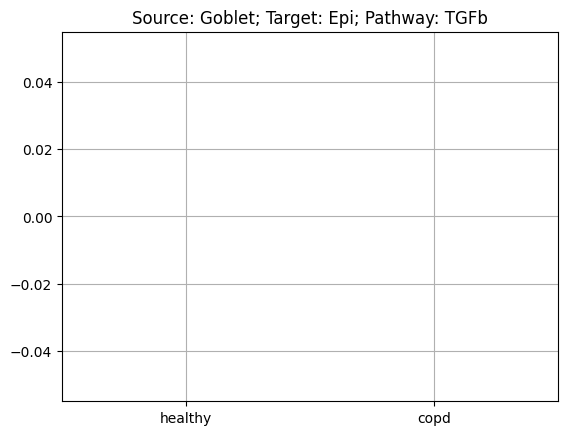

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


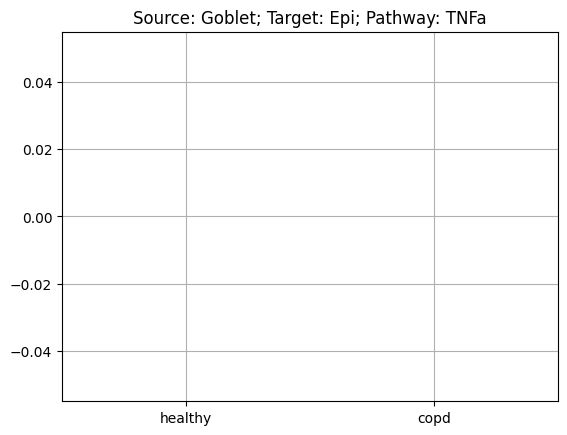

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


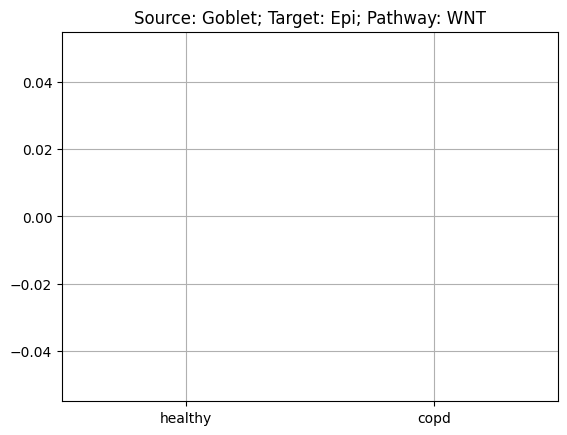

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


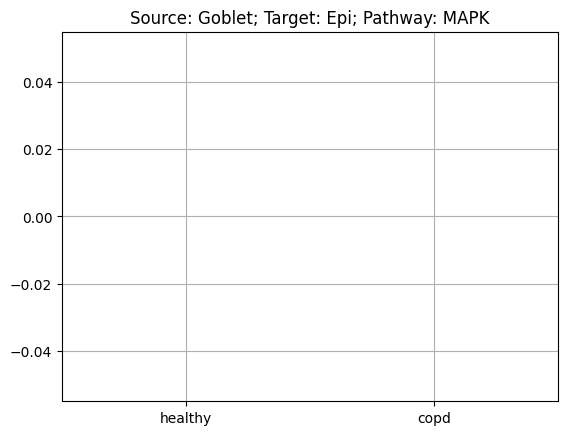

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


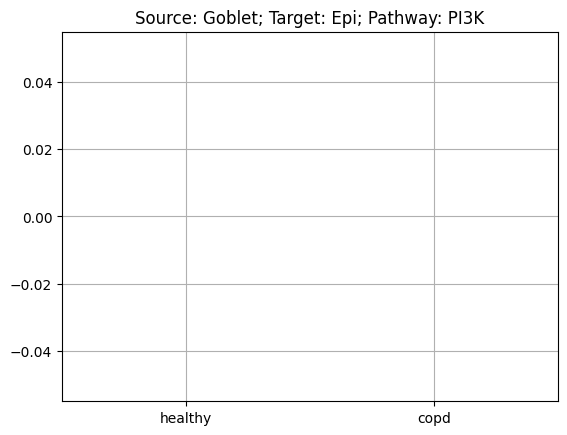

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


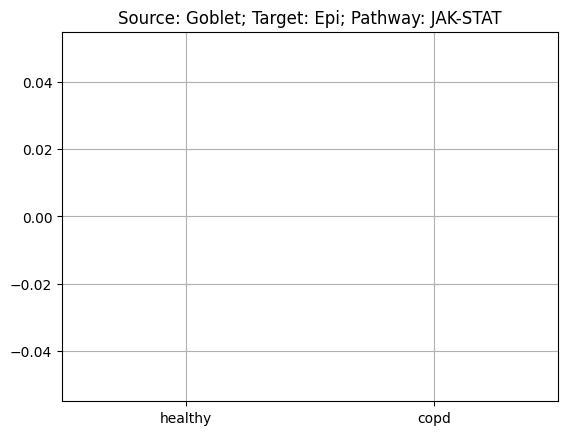

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


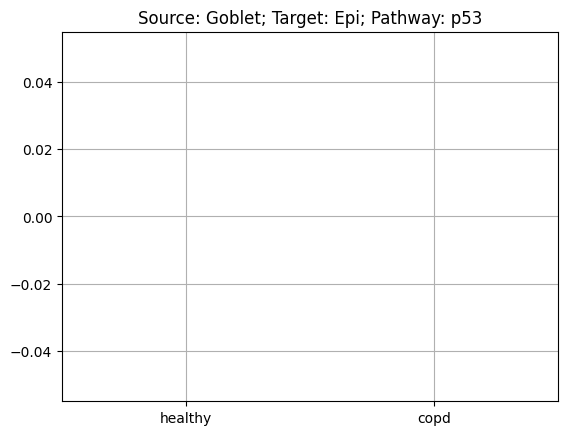

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


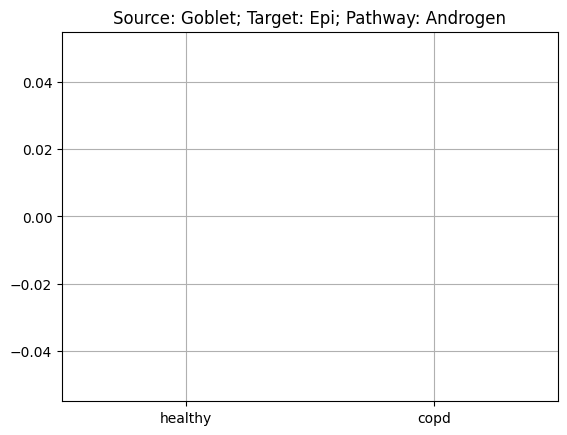

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


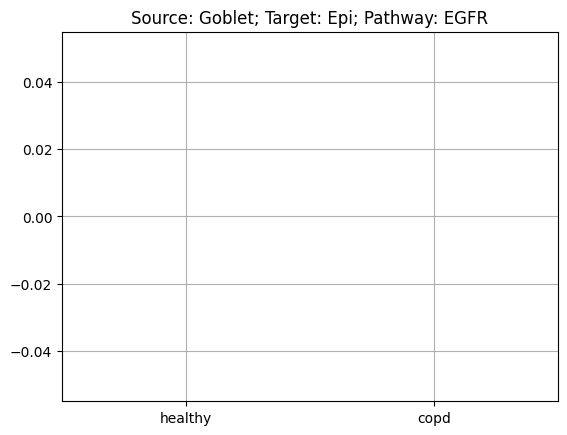

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


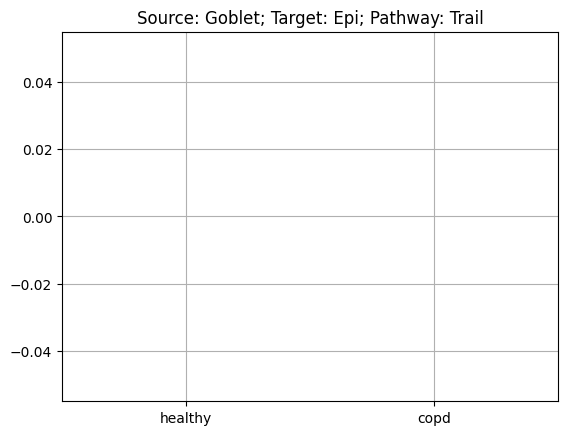

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


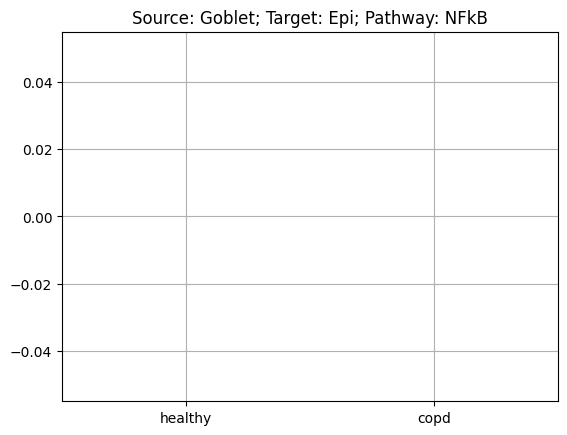

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


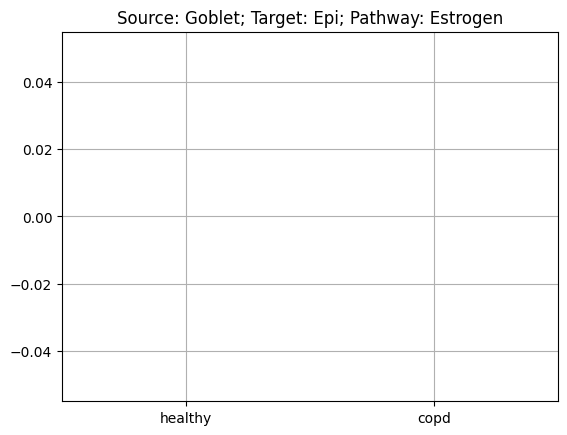

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


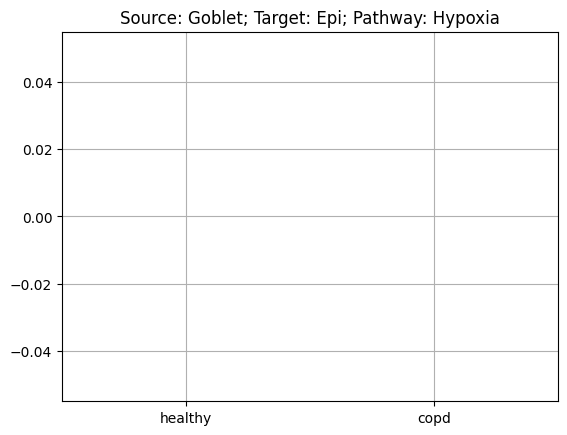

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


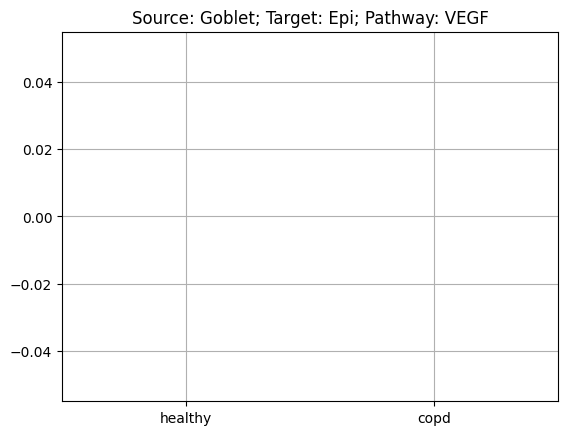

 30%|███       | 3/10 [05:29<12:43, 109.10s/it]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encount

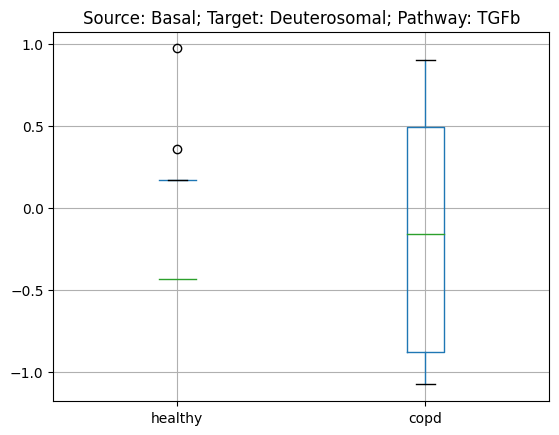

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


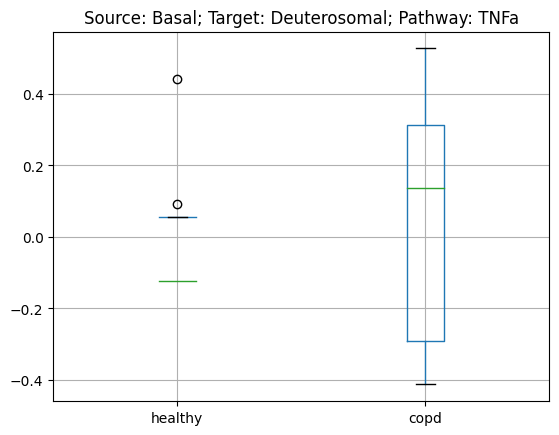

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


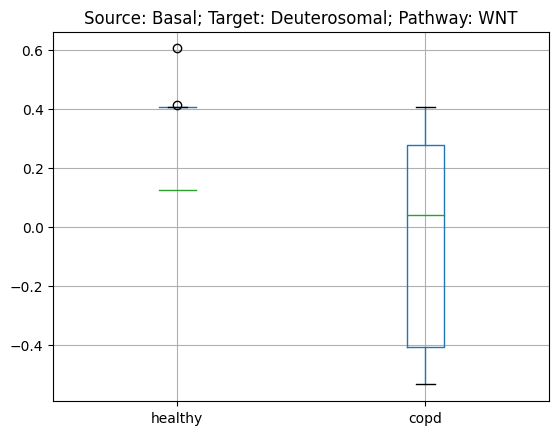

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


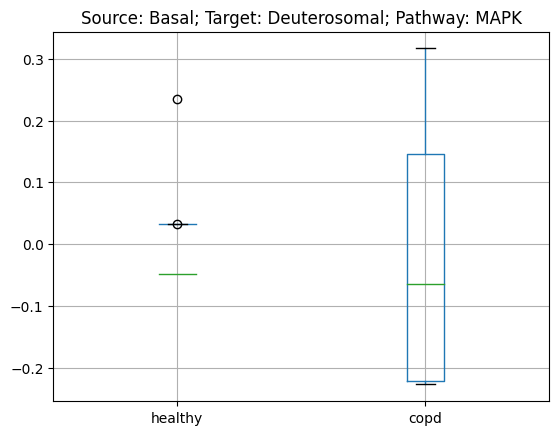

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


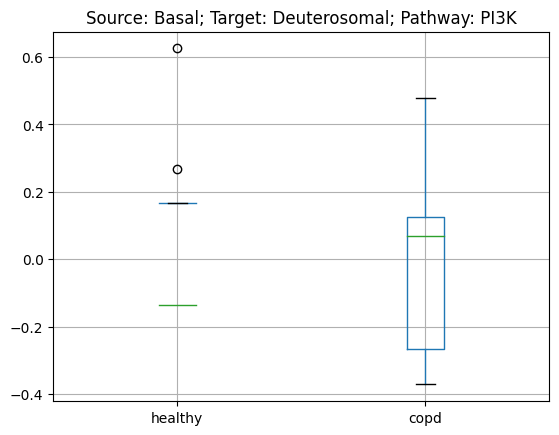

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


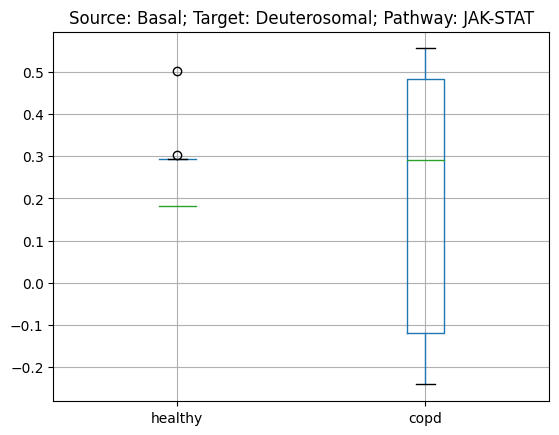

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


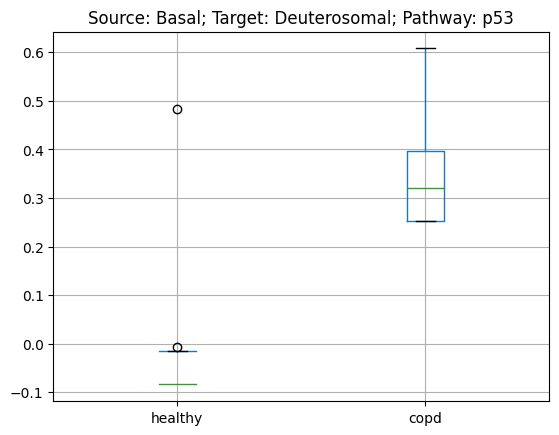

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


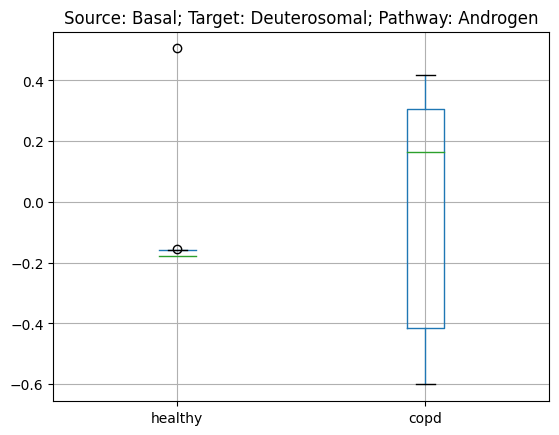

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


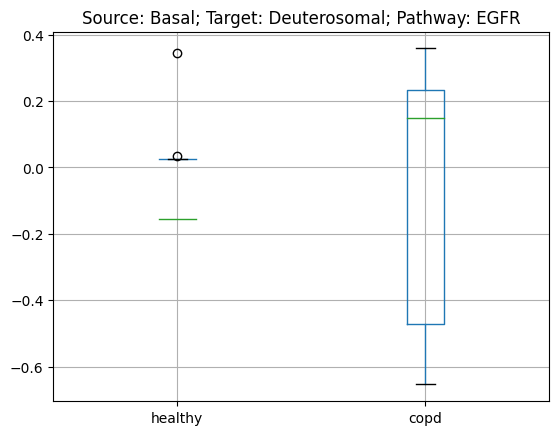

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


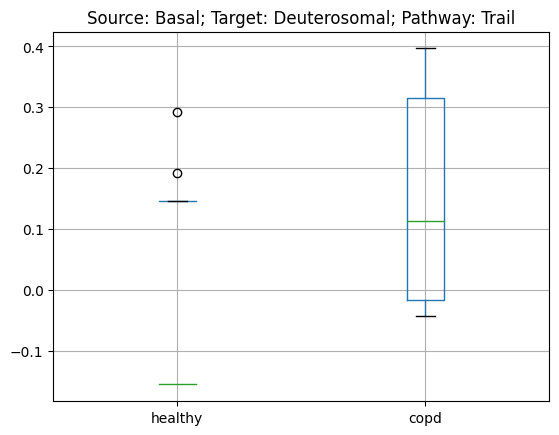

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


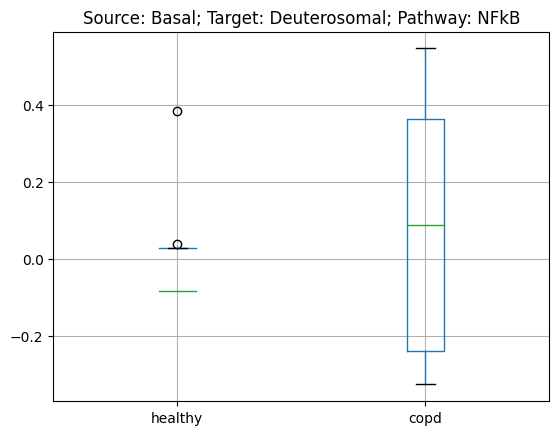

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


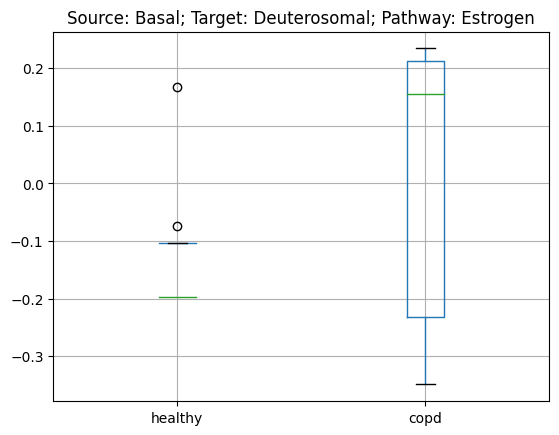

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


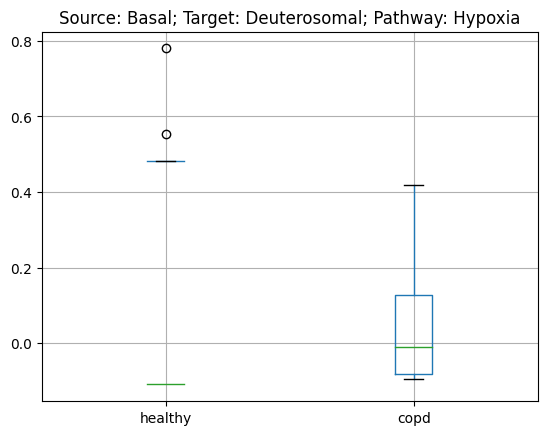

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


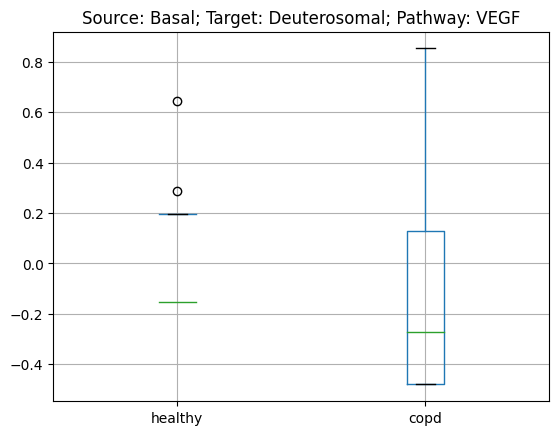

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


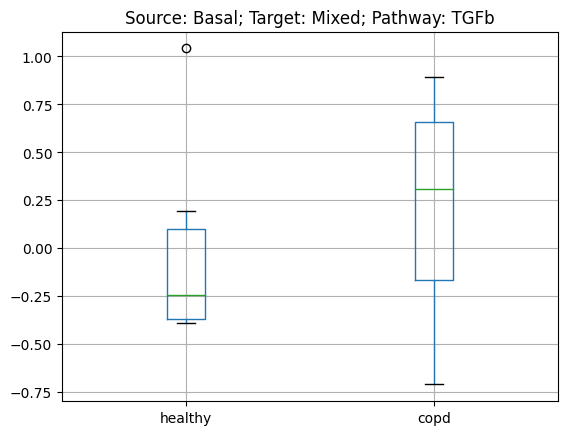

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


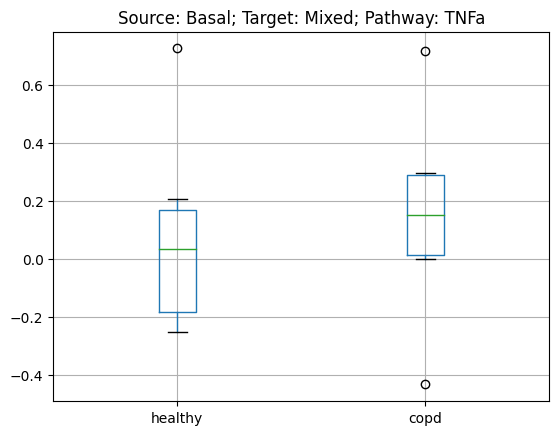

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


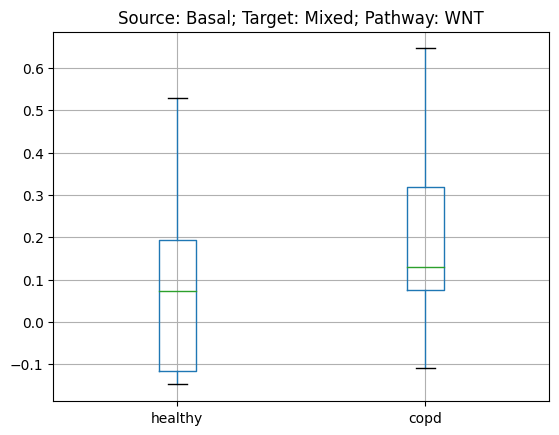

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


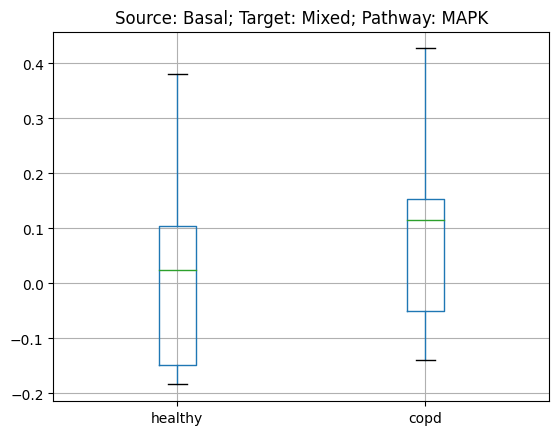

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


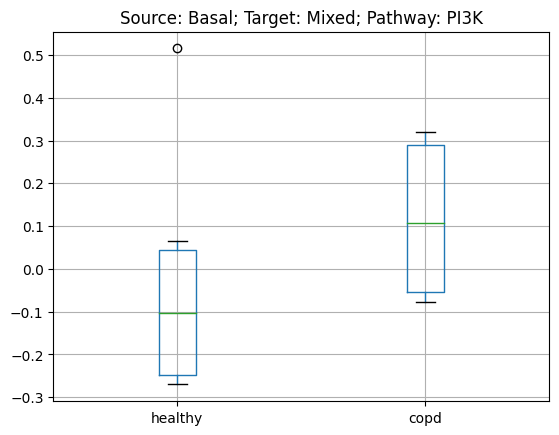

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


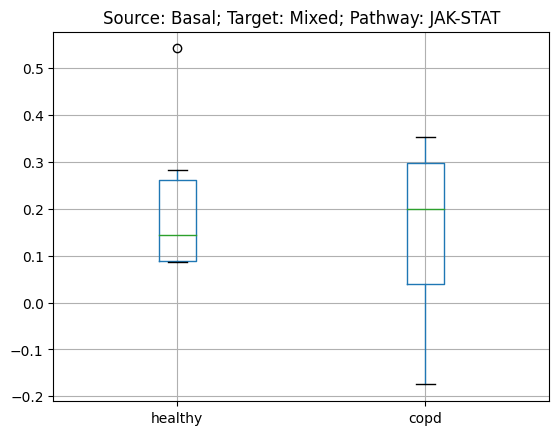

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


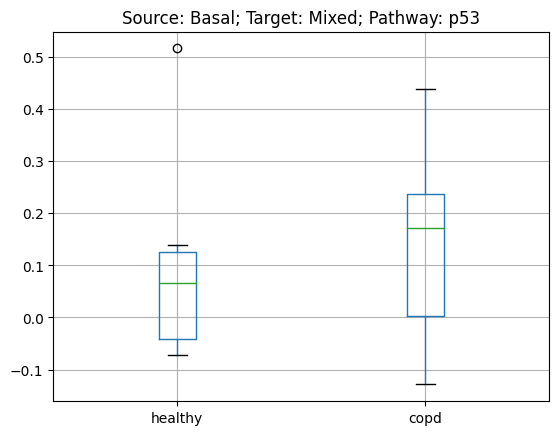

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


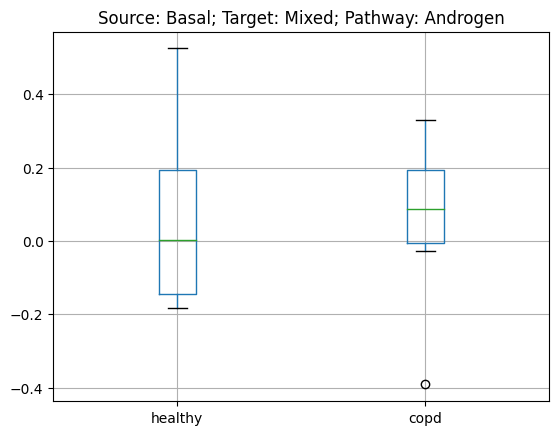

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


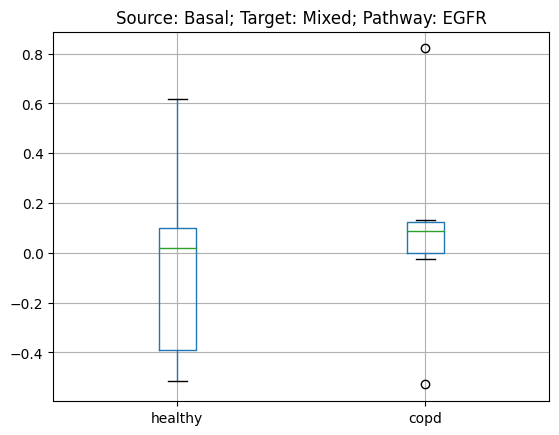

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


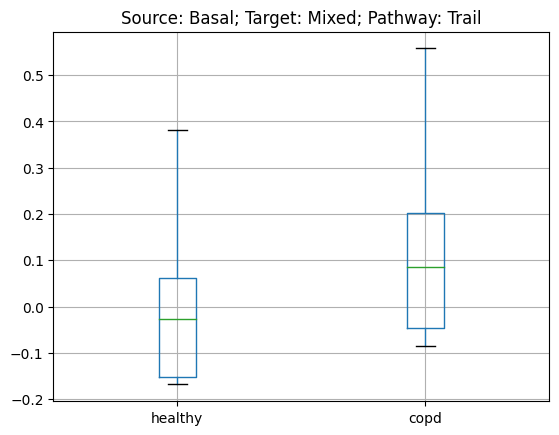

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


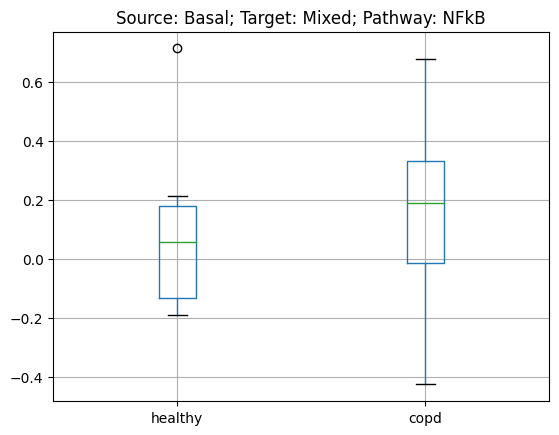

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


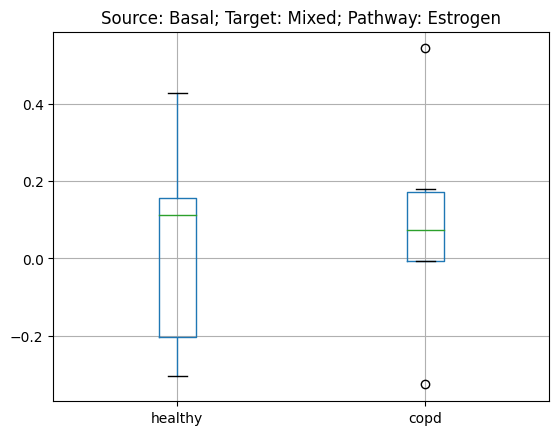

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


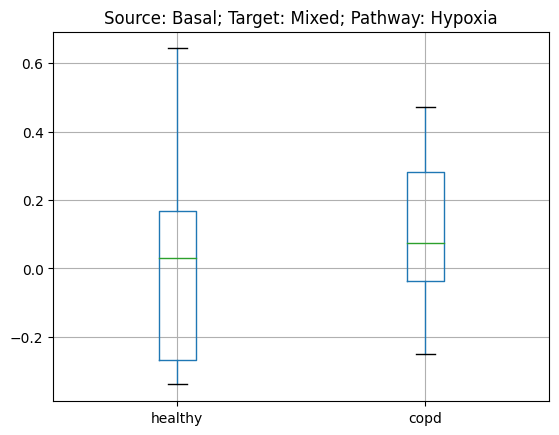

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


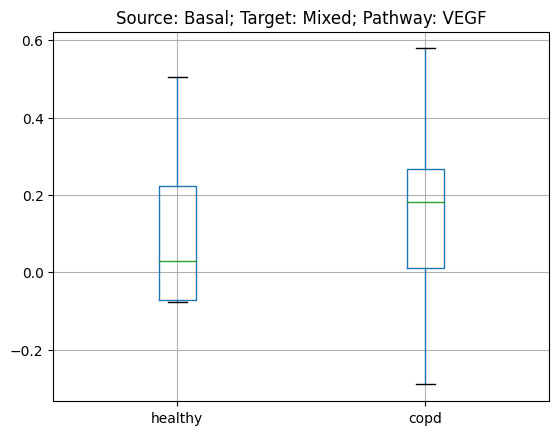

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


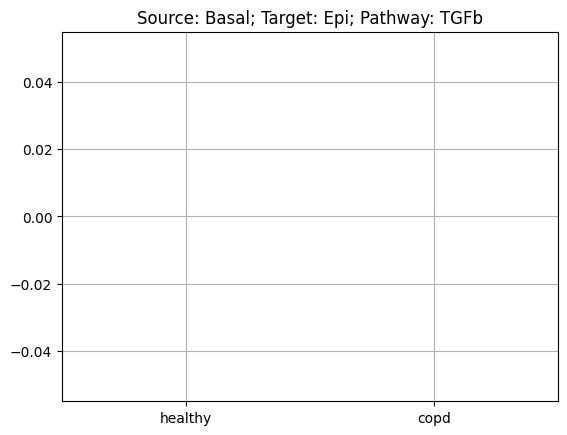

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


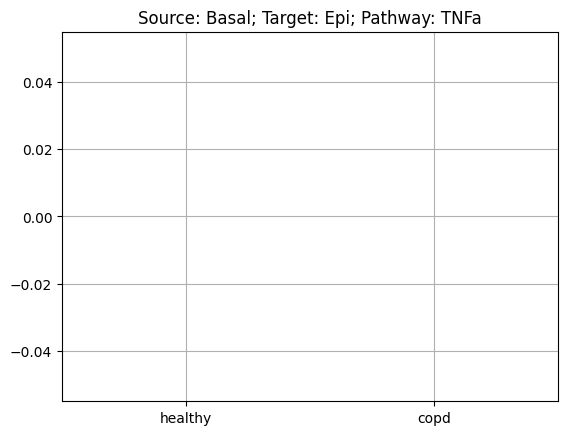

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


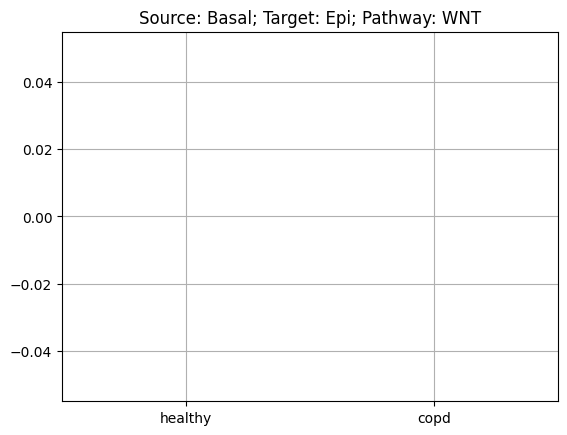

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


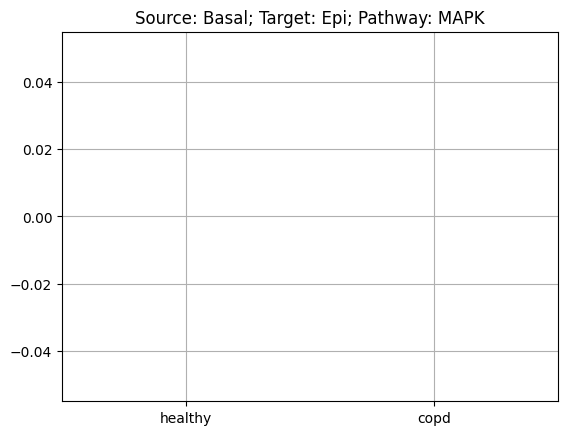

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


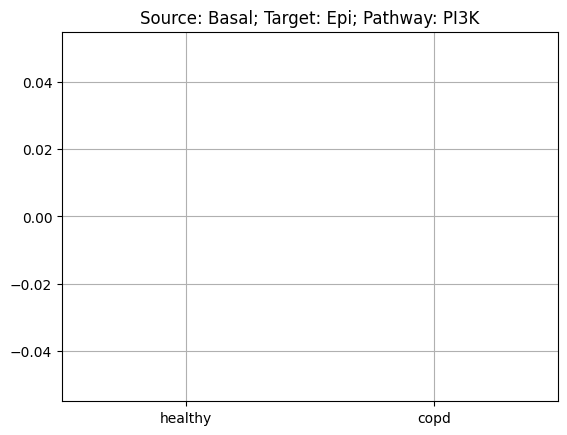

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


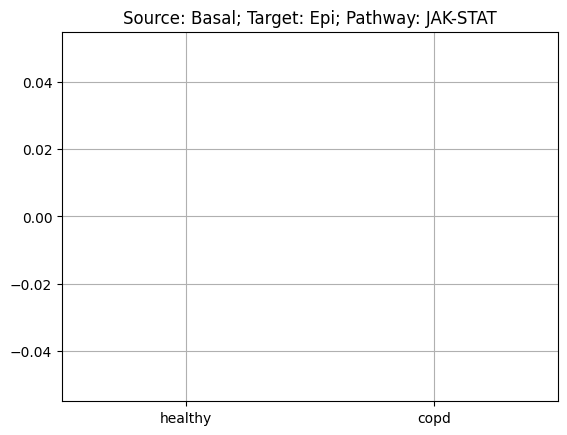

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


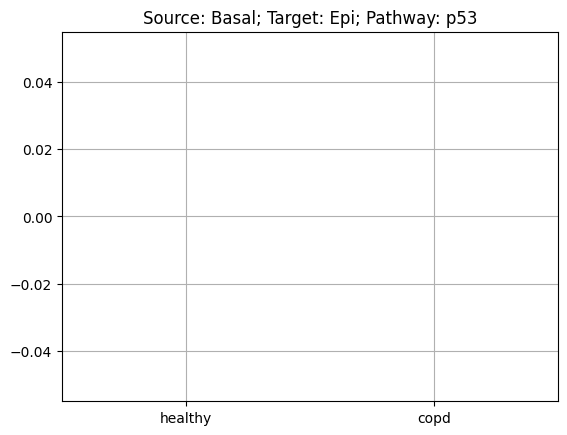

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


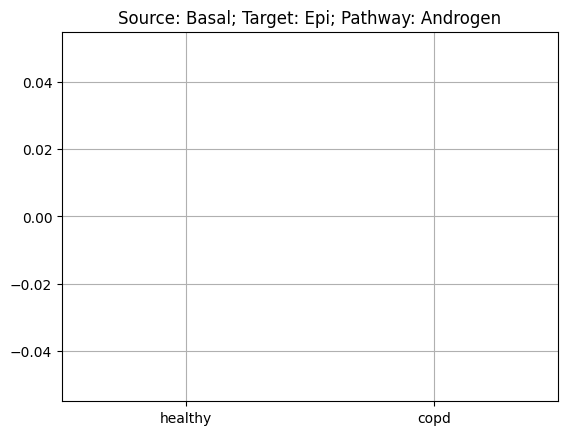

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


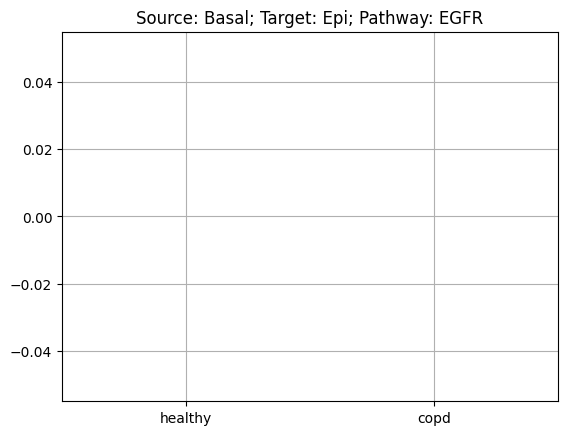

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


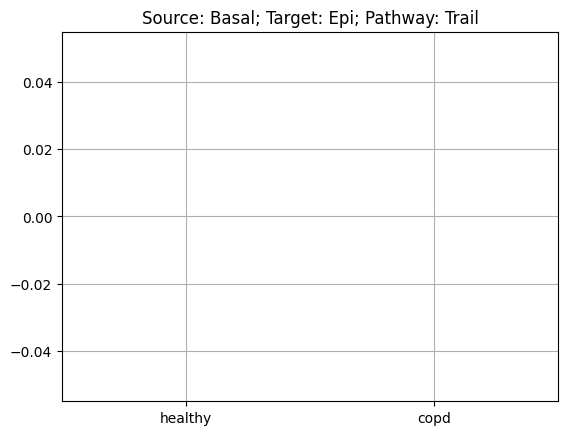

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


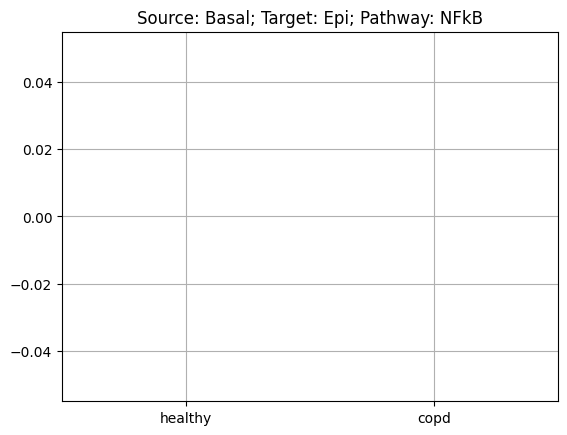

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


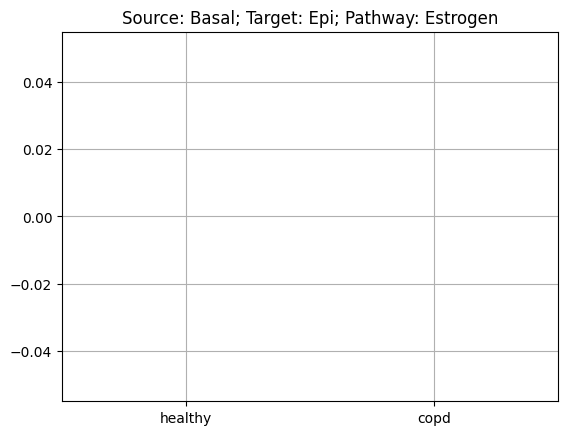

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


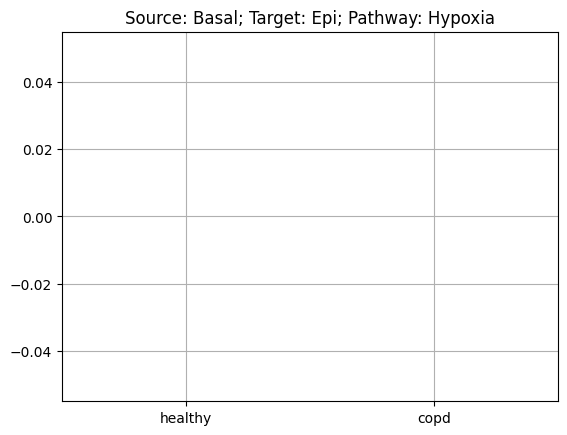

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


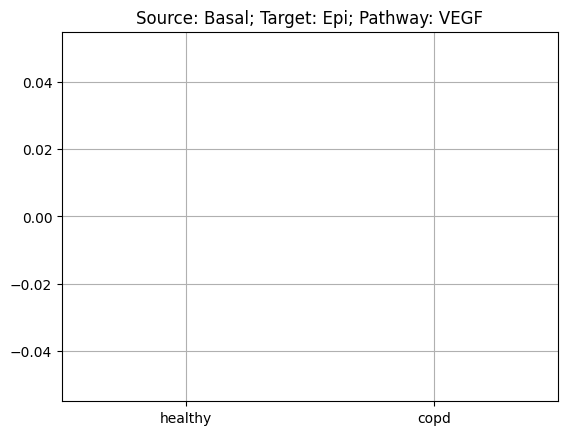

 40%|████      | 4/10 [07:17<10:52, 108.76s/it]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encount

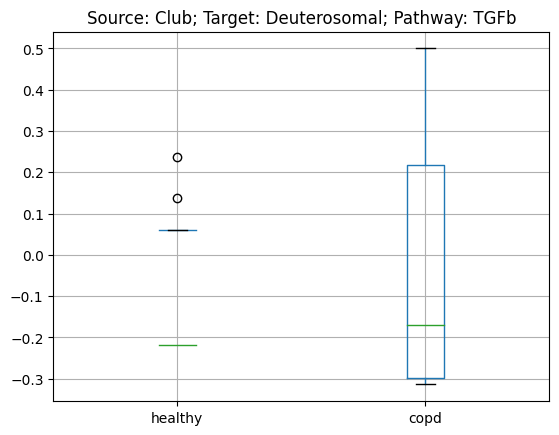

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


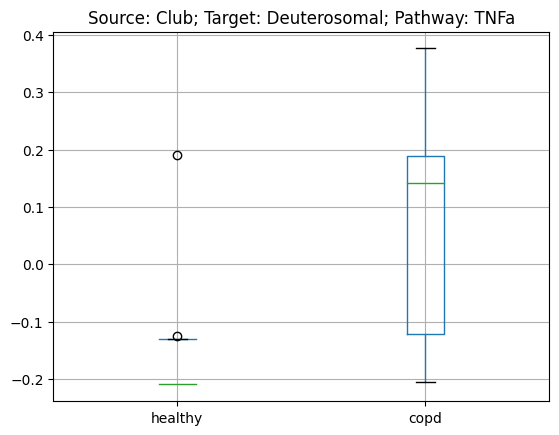

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


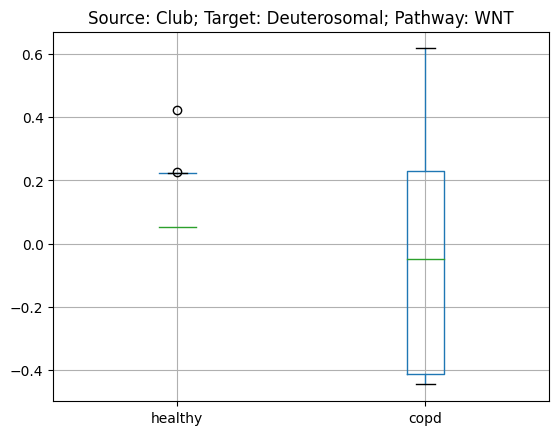

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


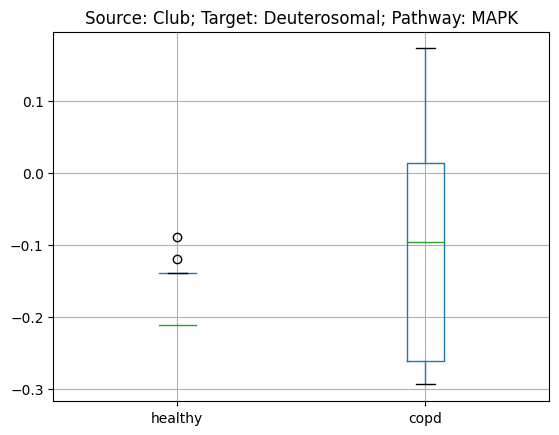

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


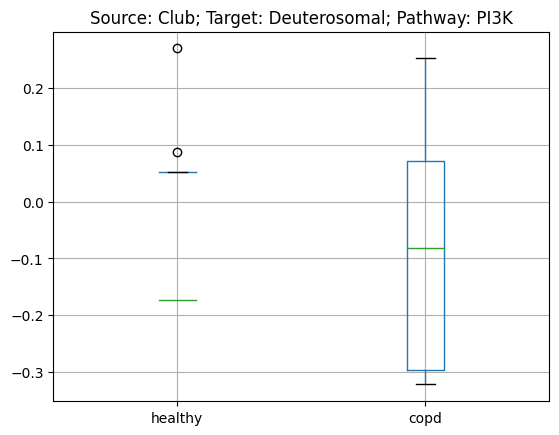

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


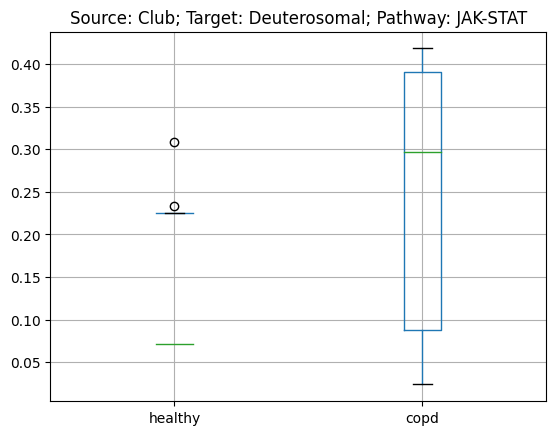

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


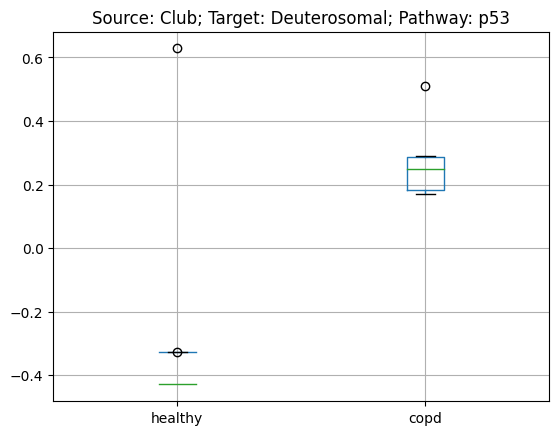

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


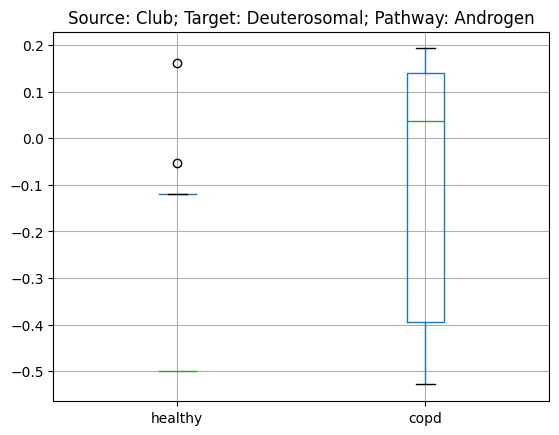

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


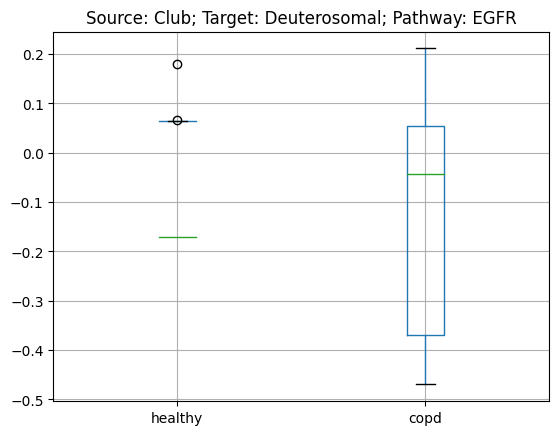

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


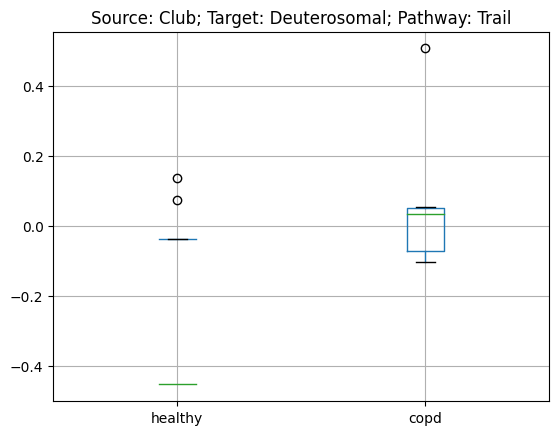

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


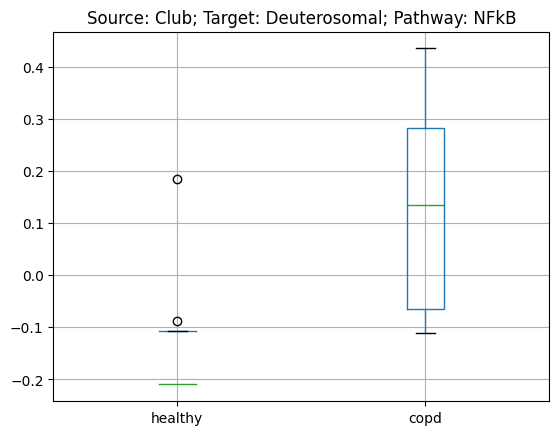

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


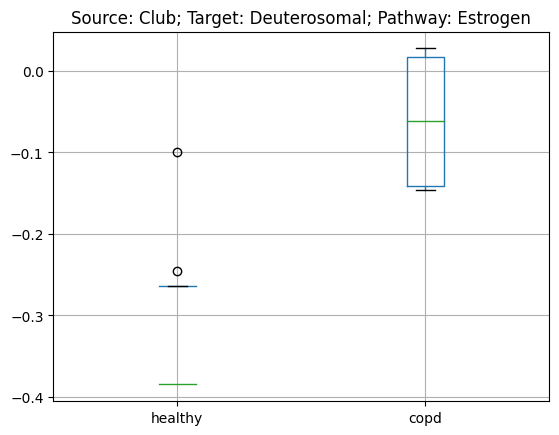

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


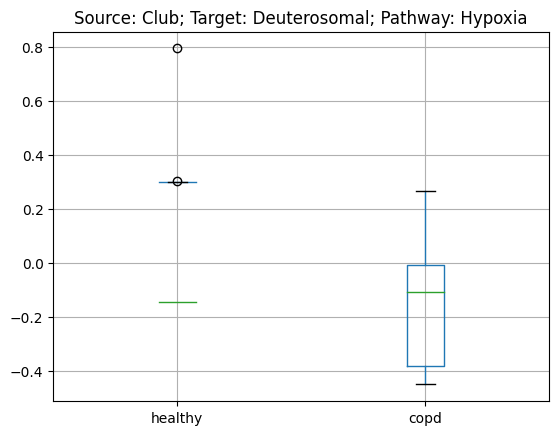

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


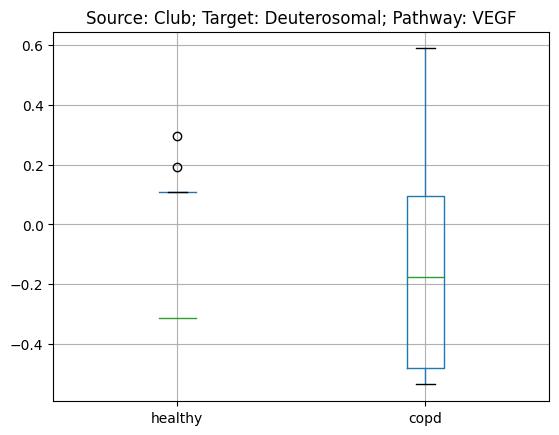

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


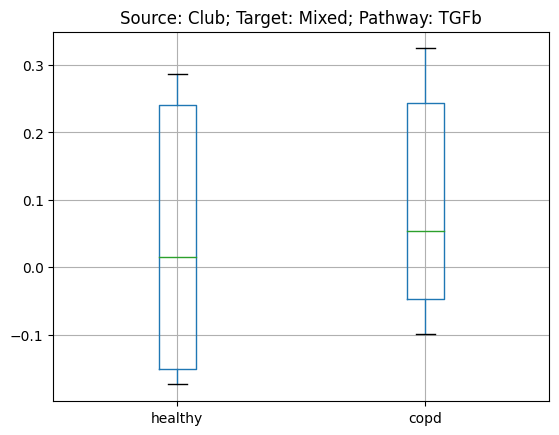

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


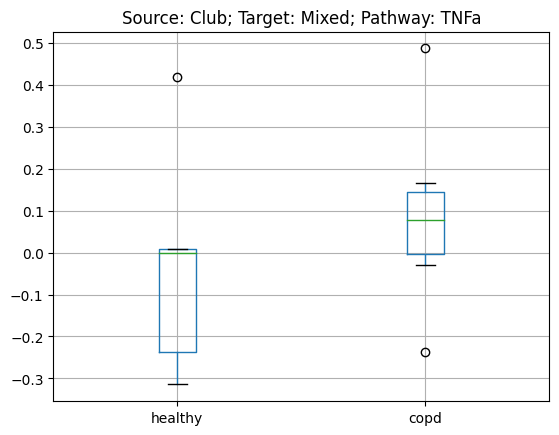

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


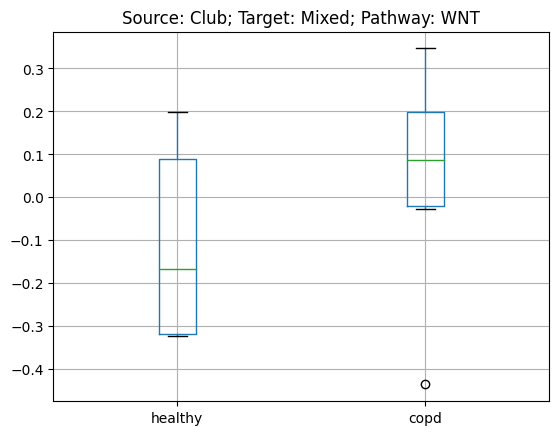

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


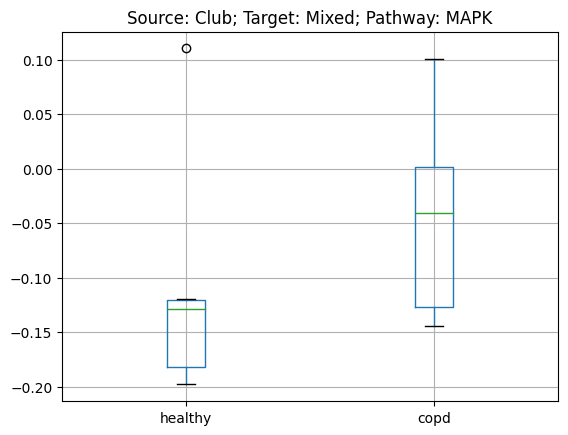

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


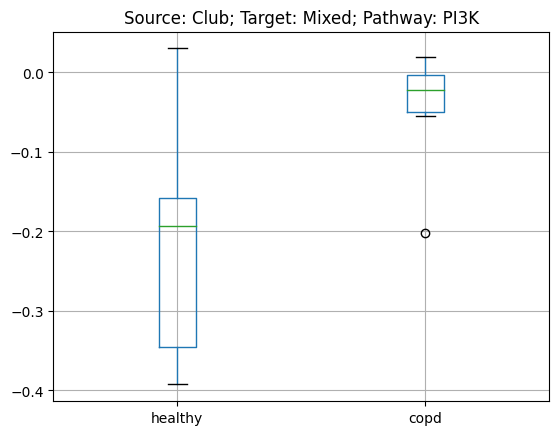

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


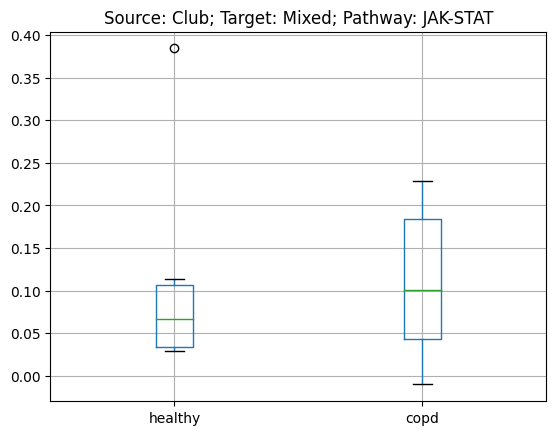

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


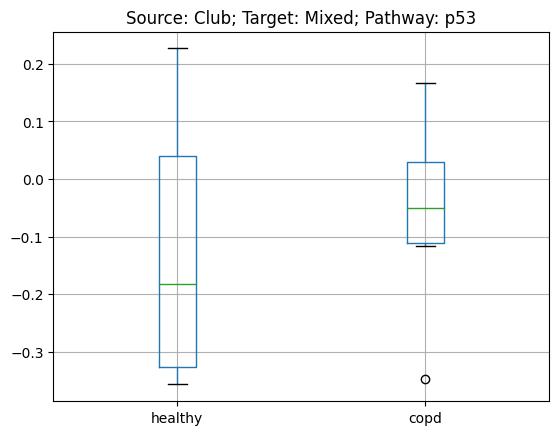

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


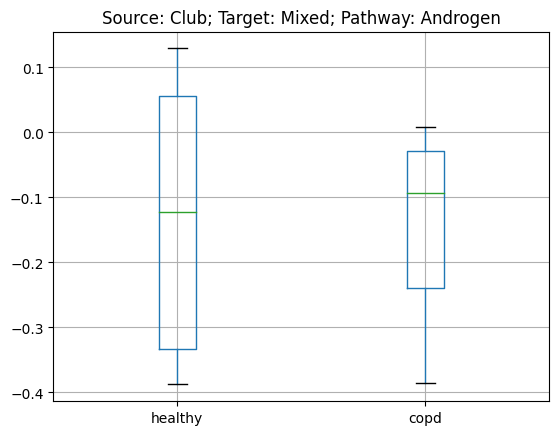

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


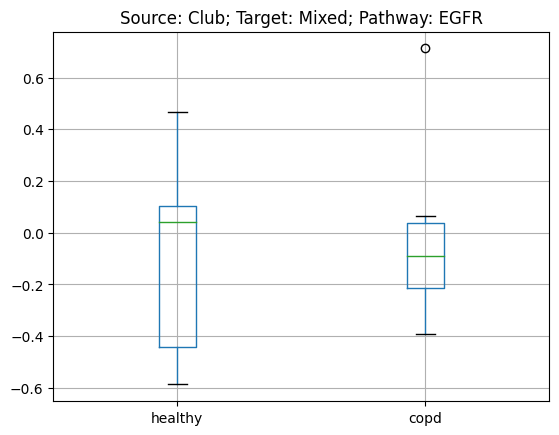

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


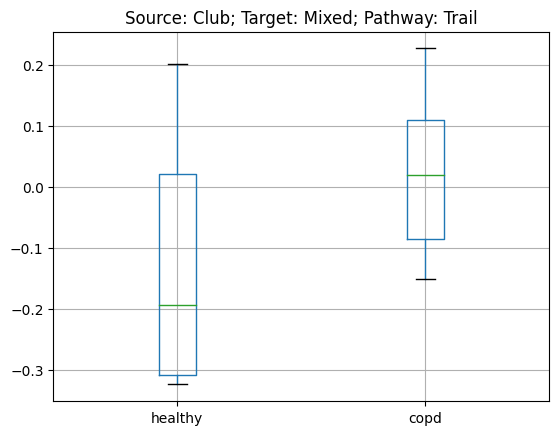

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


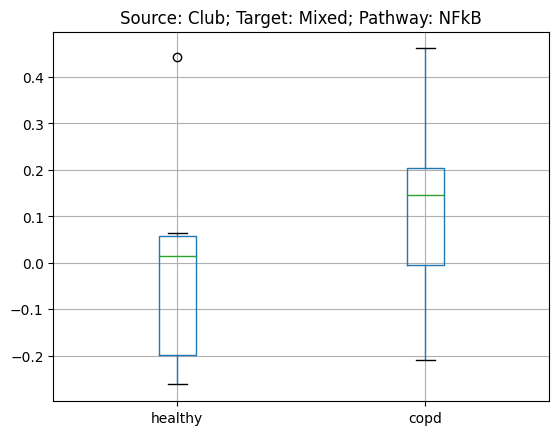

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


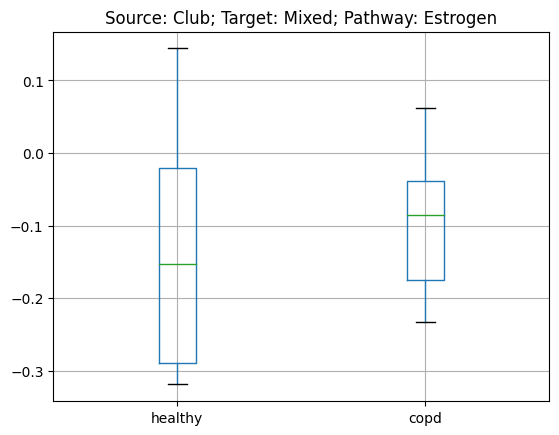

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


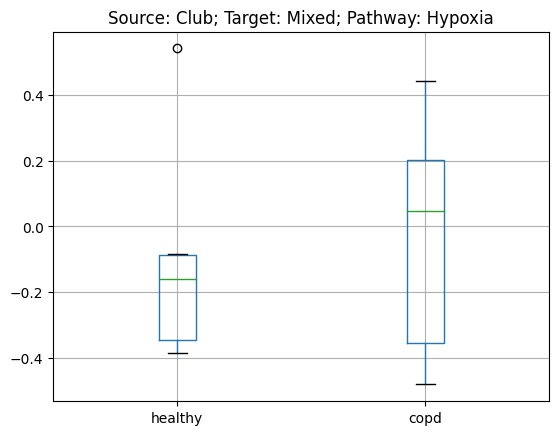

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


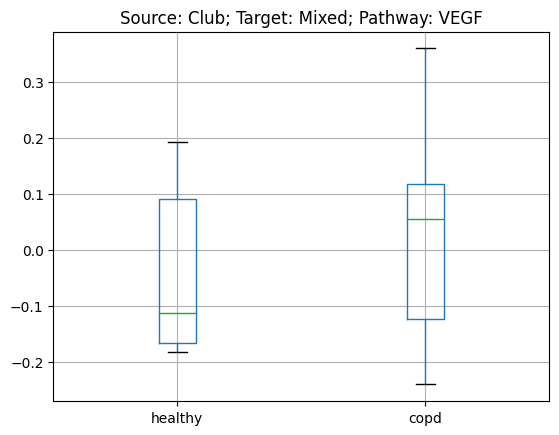

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


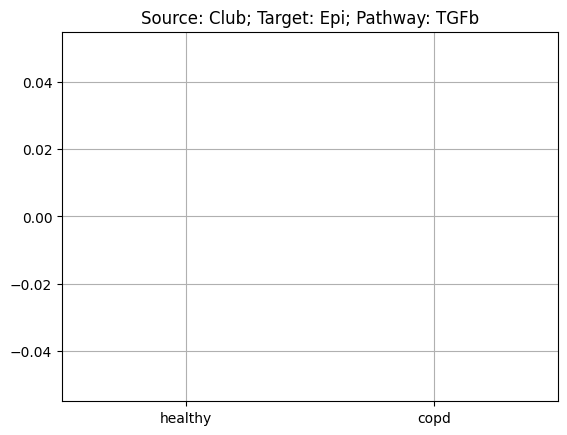

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


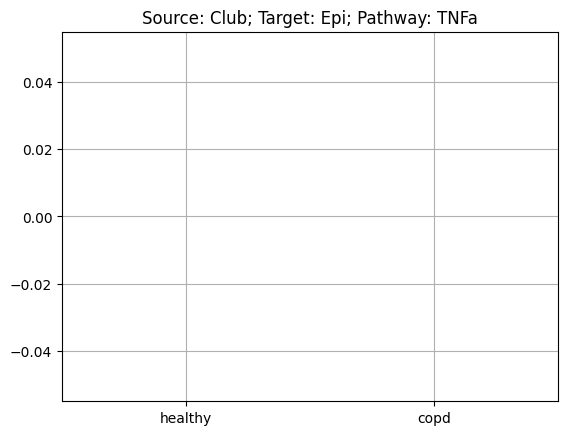

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


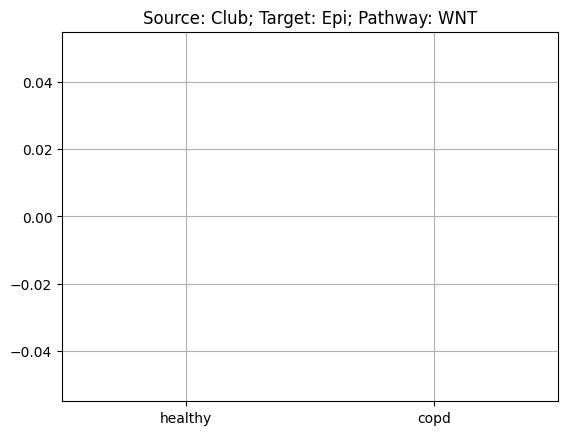

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


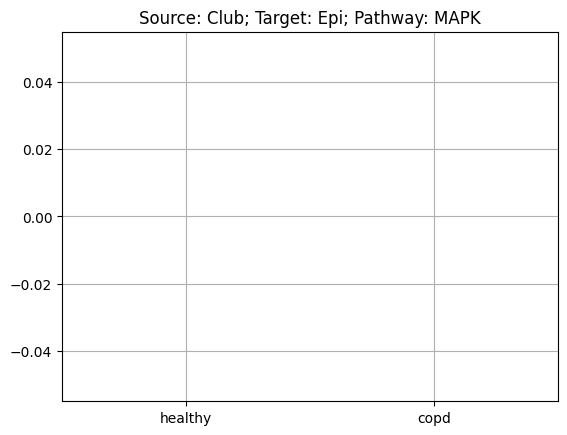

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


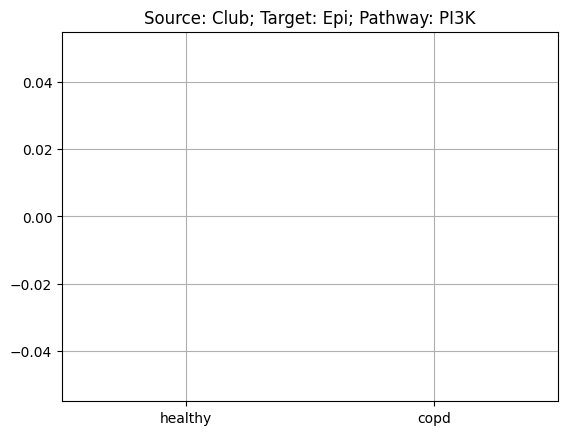

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


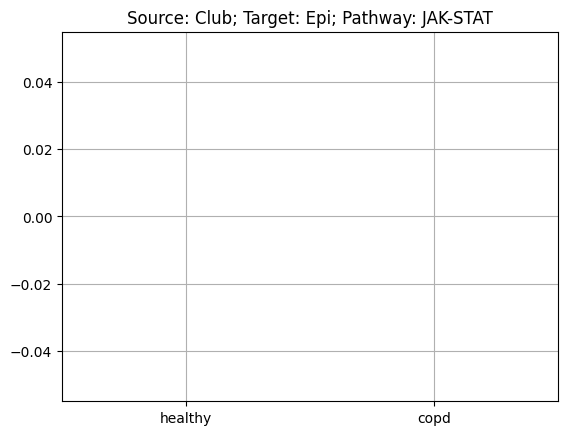

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


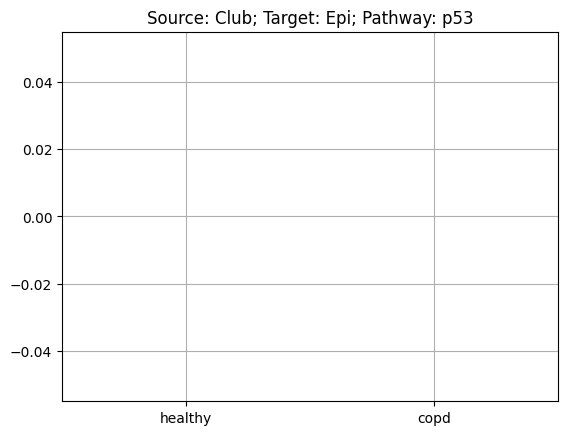

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


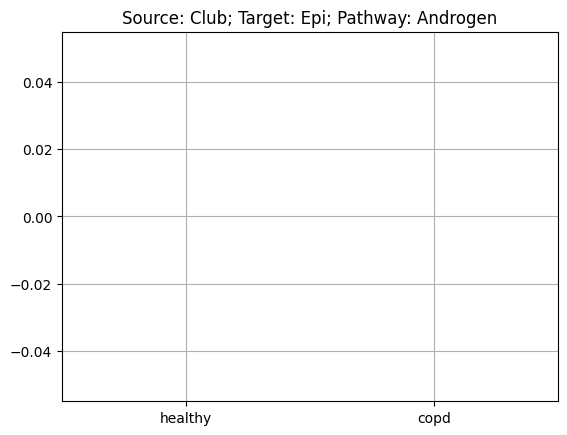

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


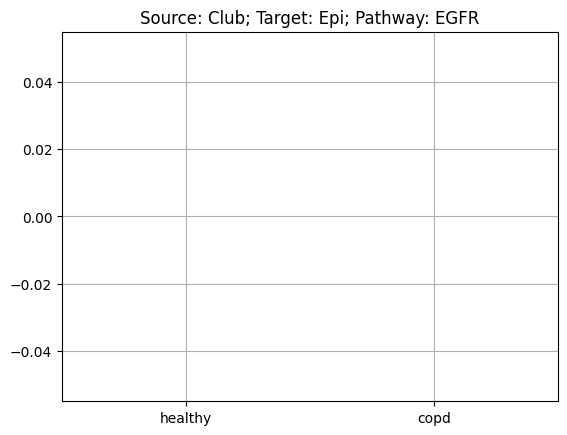

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


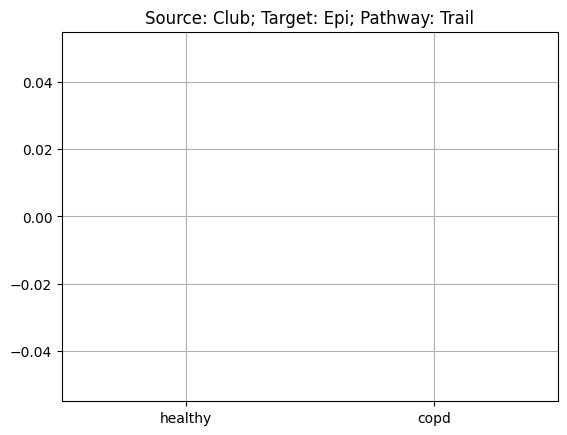

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


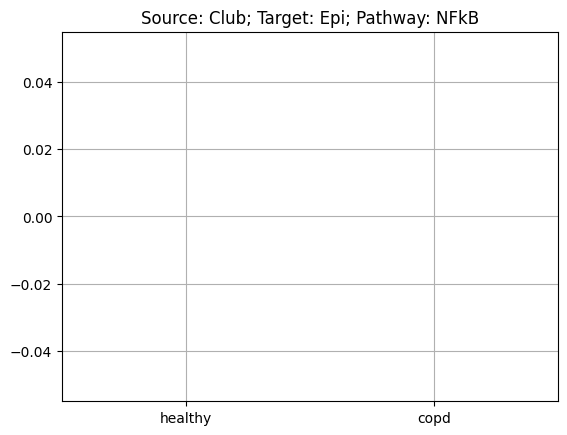

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


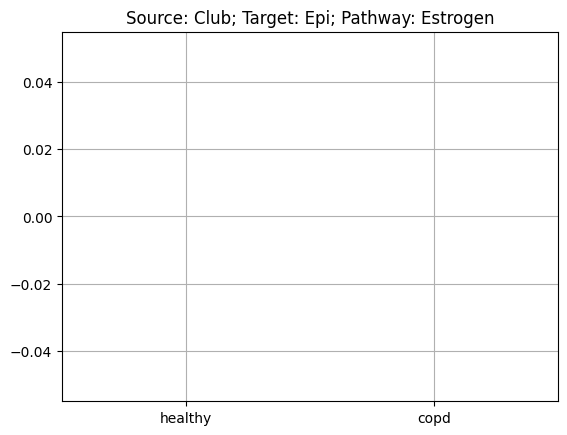

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


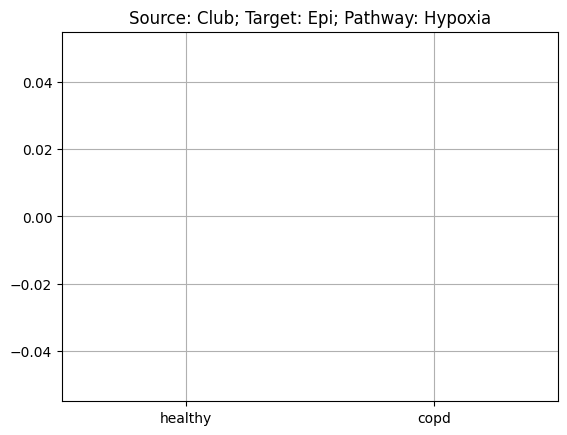

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4573: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1282: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1283: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whishi']],


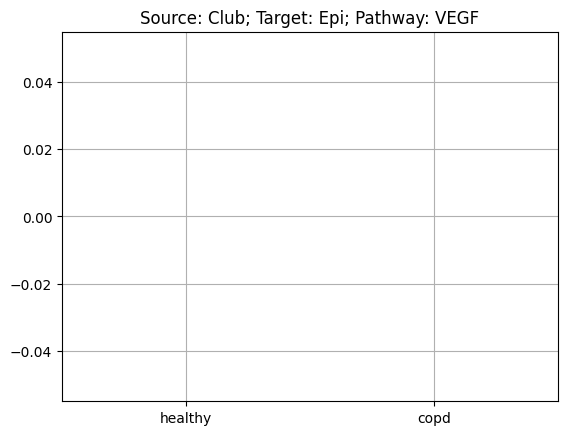

 50%|█████     | 5/10 [09:05<09:02, 108.45s/it]/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encount

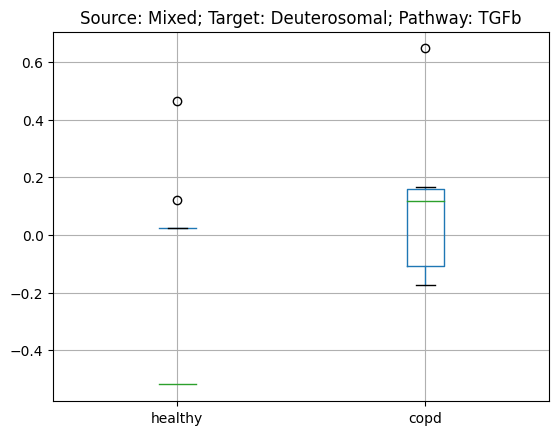

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


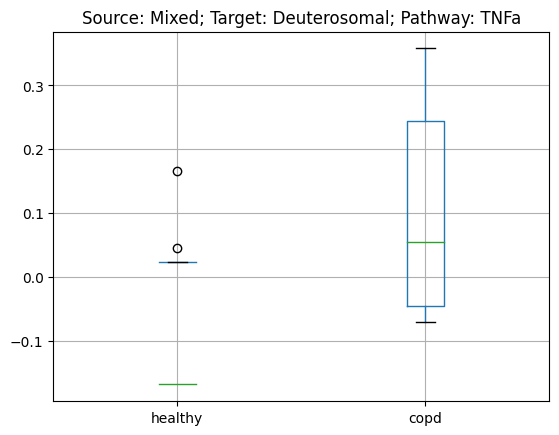

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


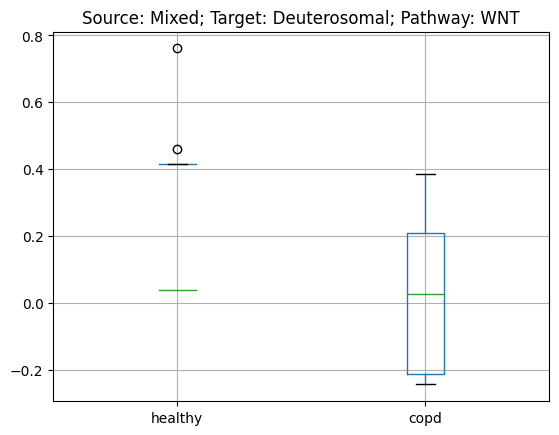

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


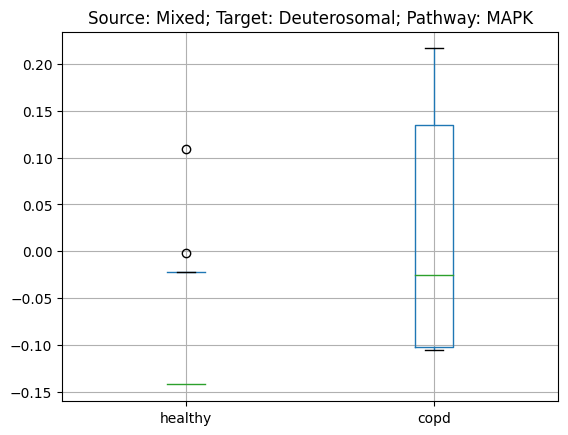

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


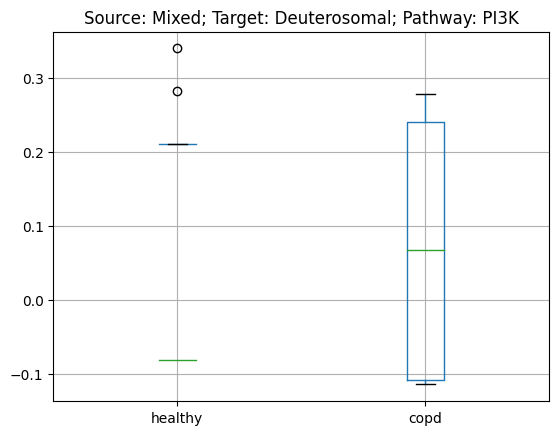

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


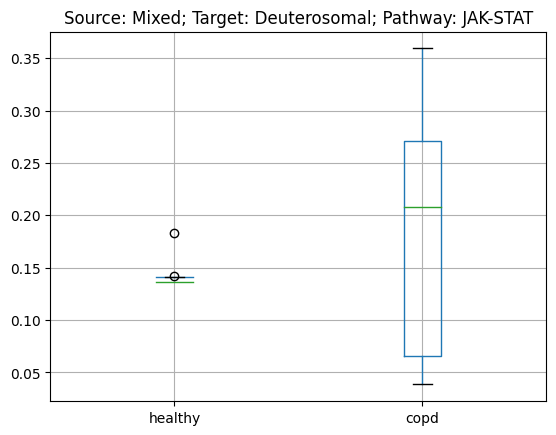

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


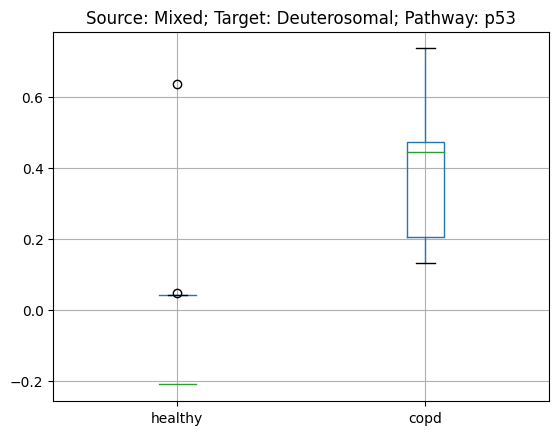

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


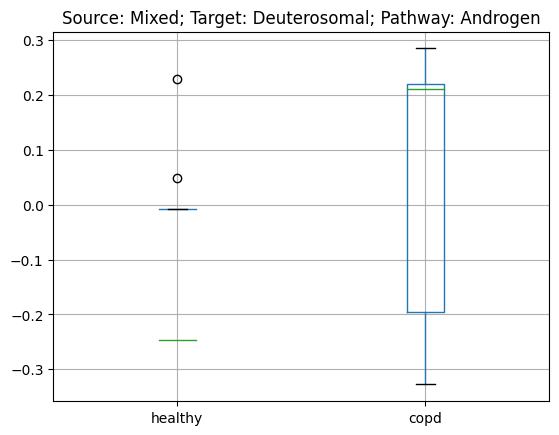

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


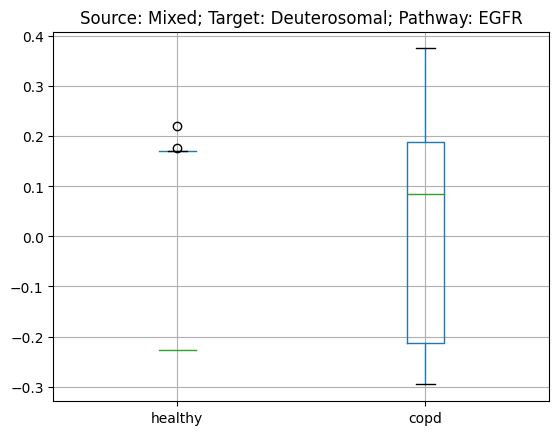

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


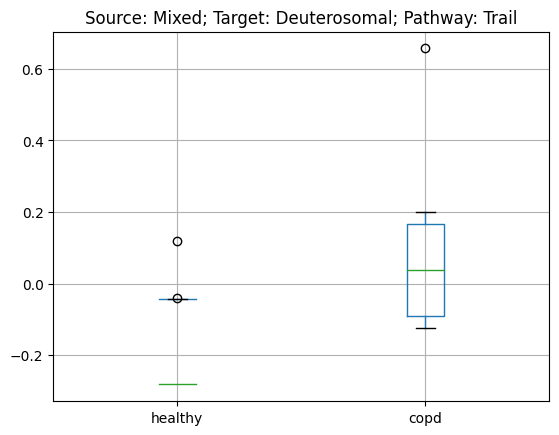

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


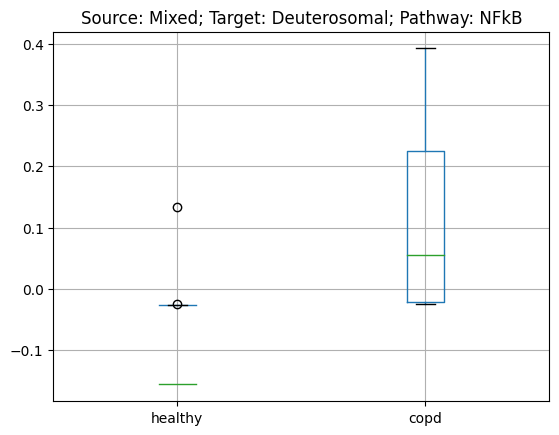

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


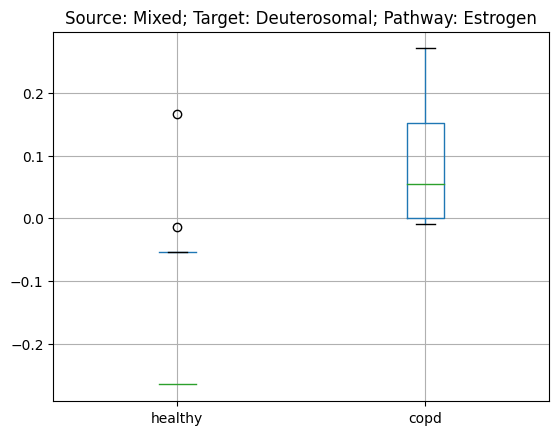

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


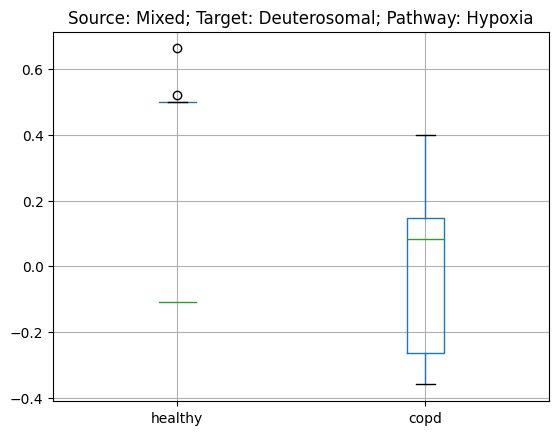

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/numpy/lib/function_base.py:4575: RuntimeWarning: invalid value encountered in add
  lerp_interpolation = asanyarray(add(a, diff_b_a * t, out=out))
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1267: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1274: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]


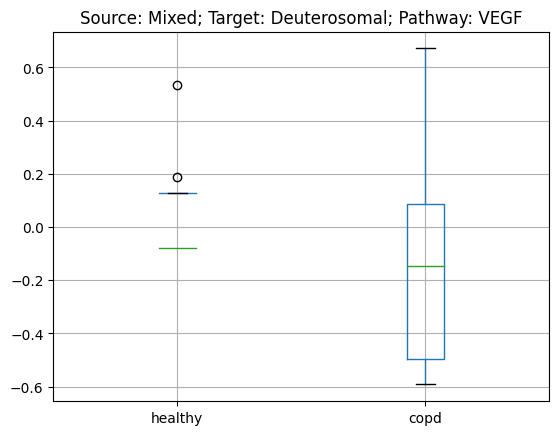

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


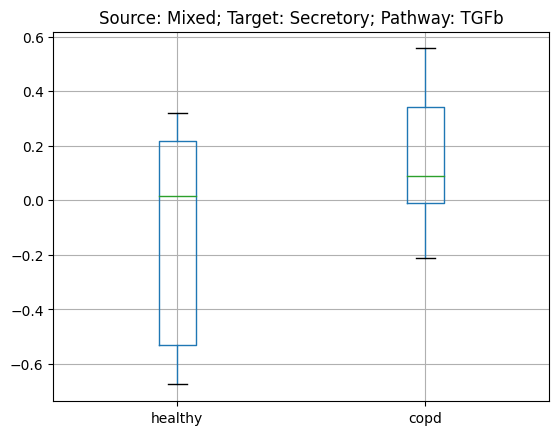

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


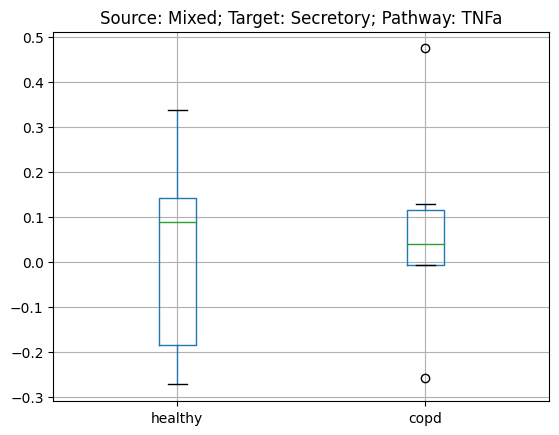

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


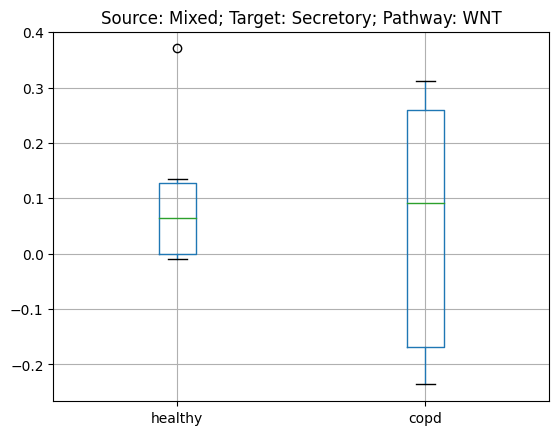

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


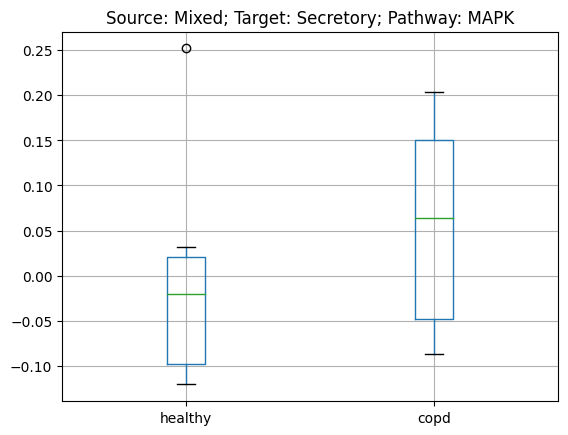

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


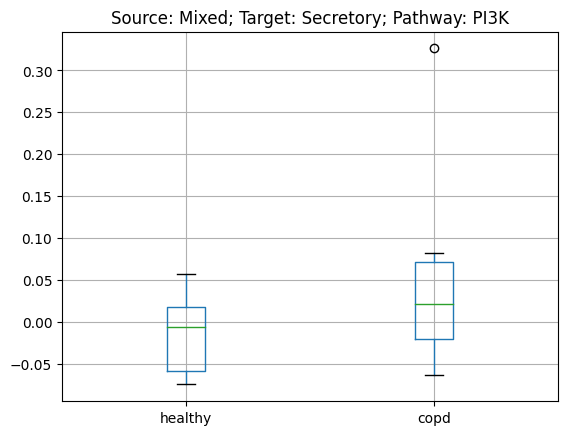

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


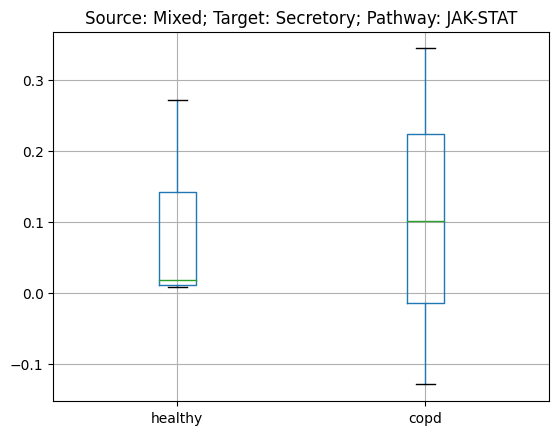

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


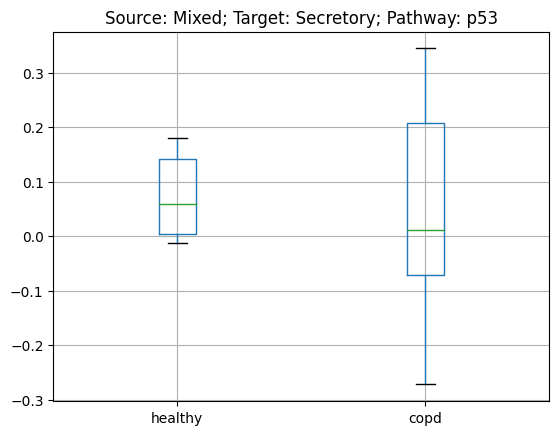

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


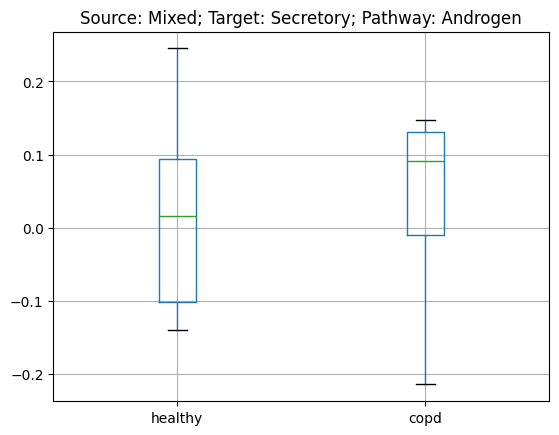

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


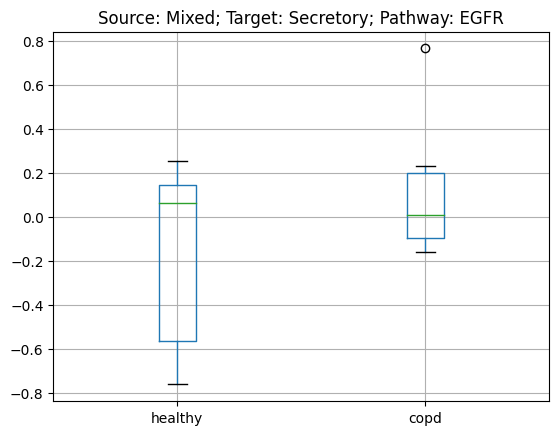

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


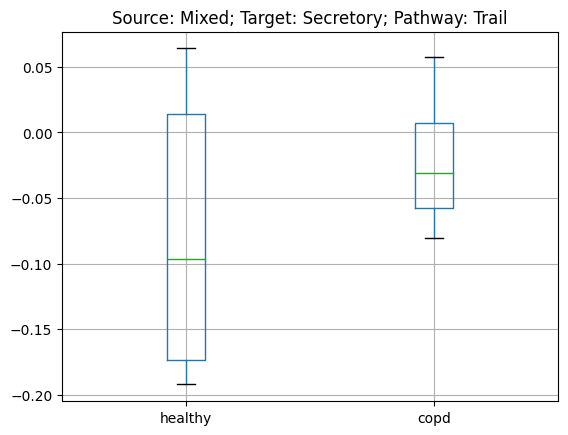

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


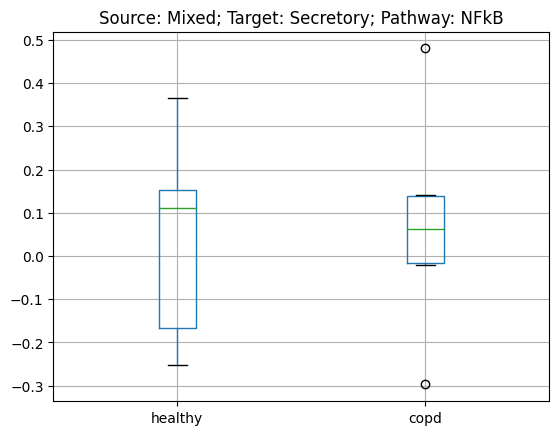

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


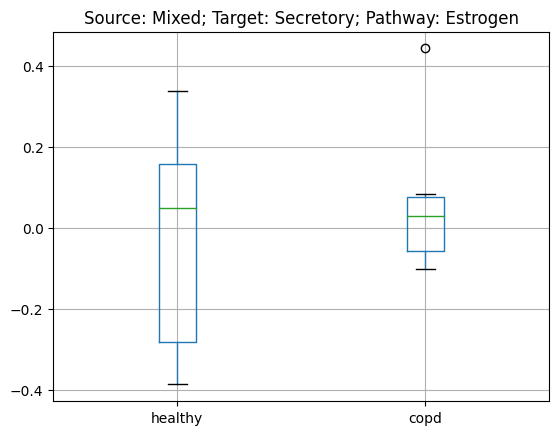

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


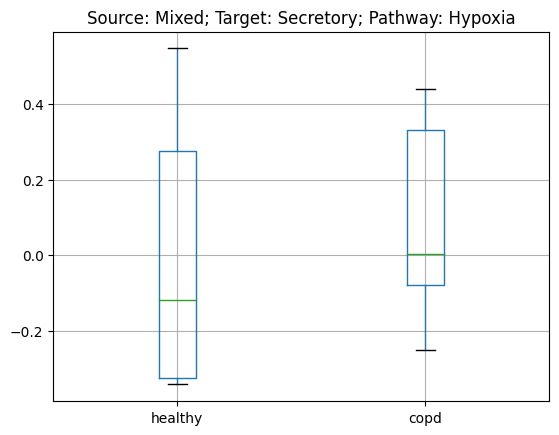

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


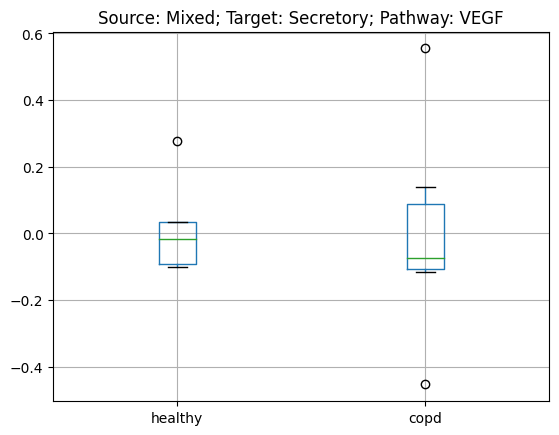

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


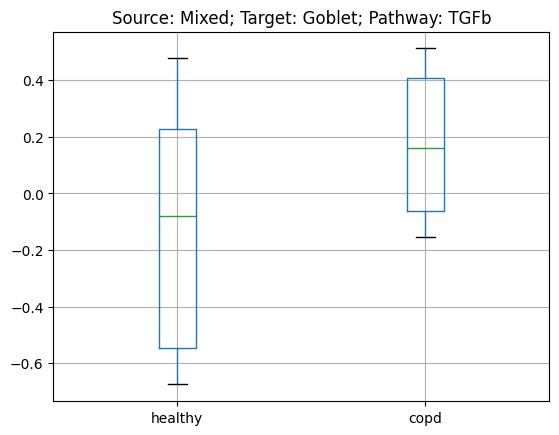

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


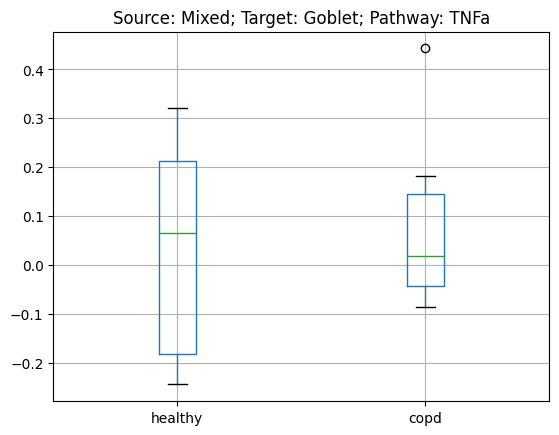

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


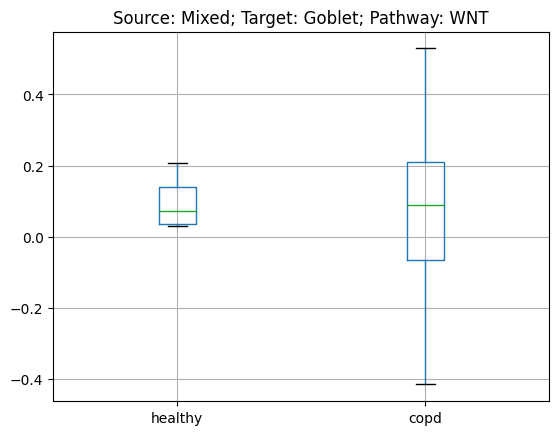

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


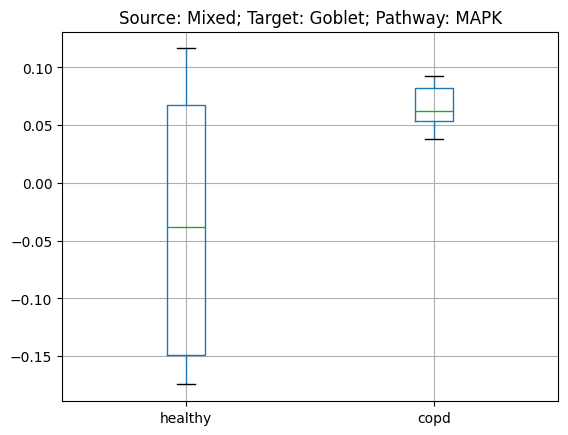

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


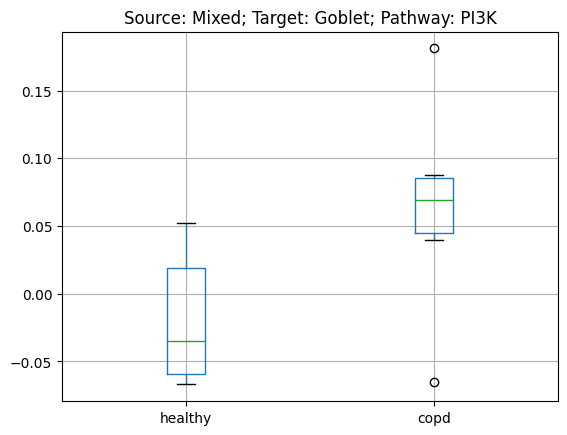

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


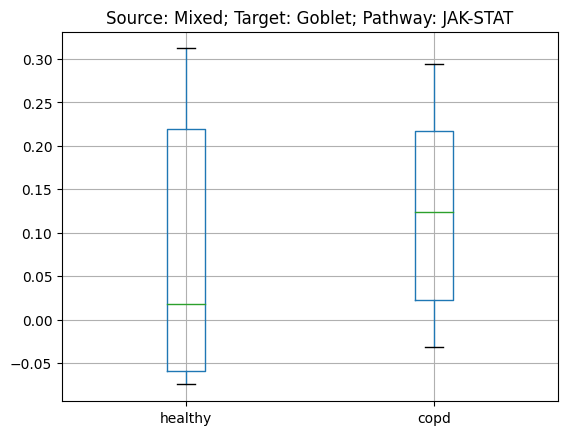

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


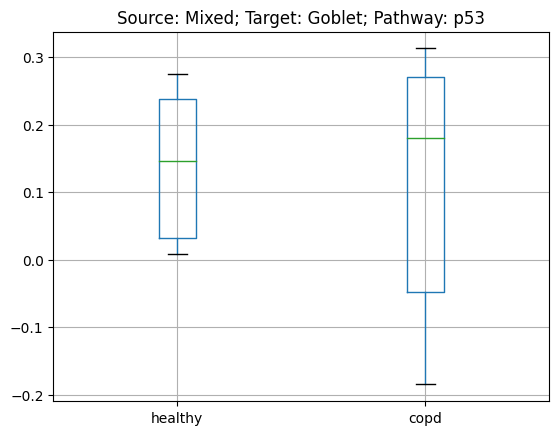

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


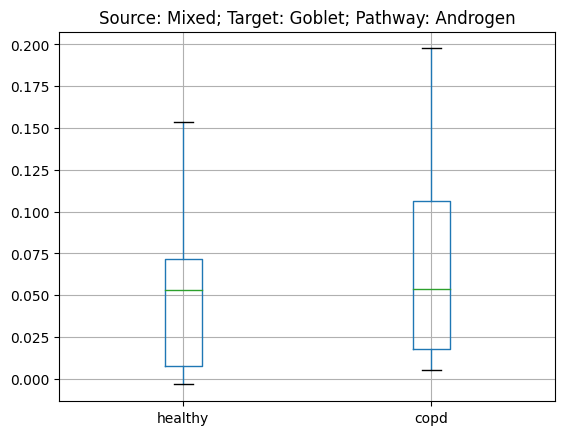

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


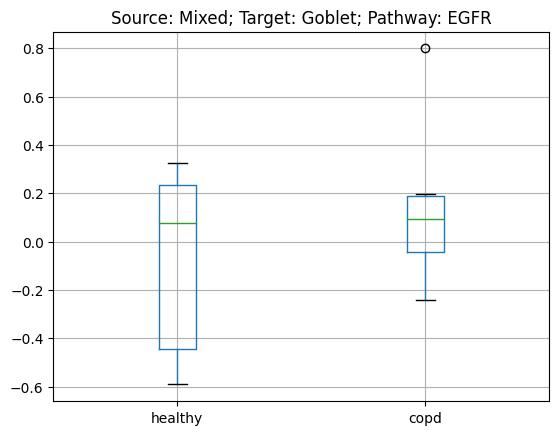

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


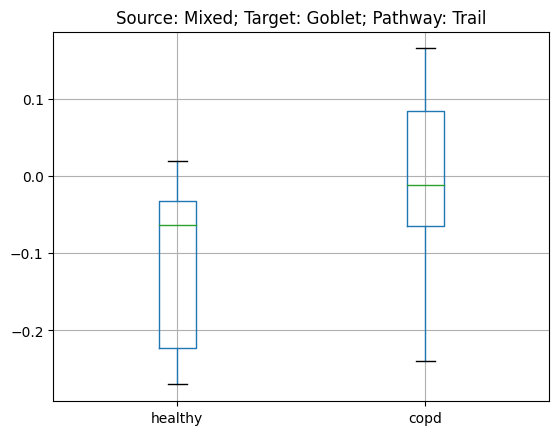

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


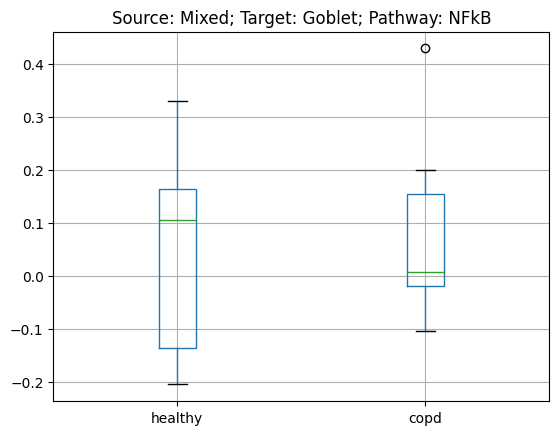

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


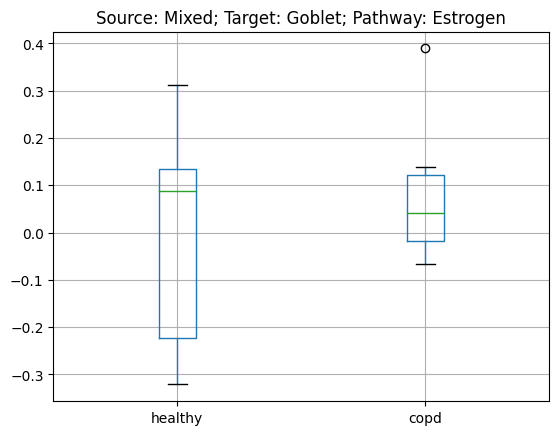

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


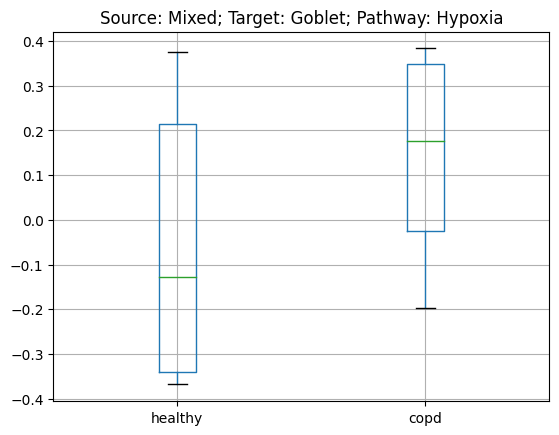

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


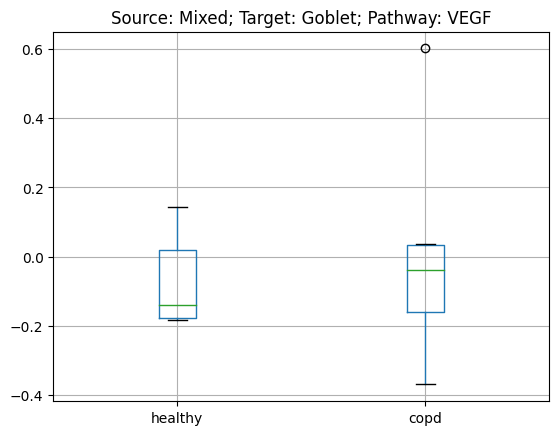

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


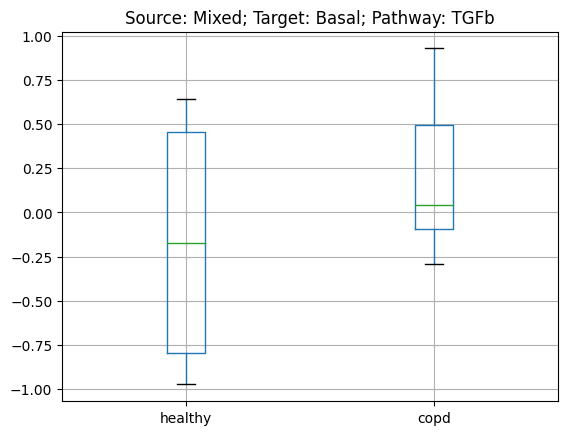

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


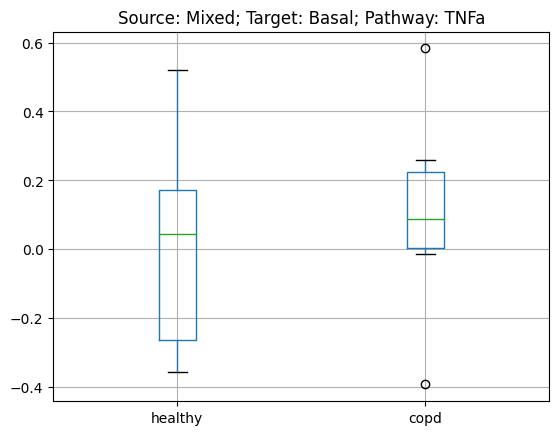

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


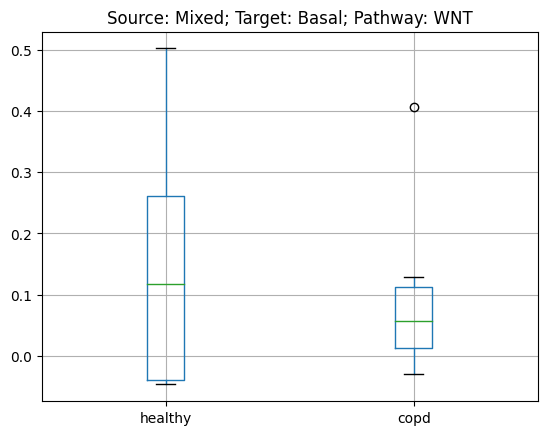

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


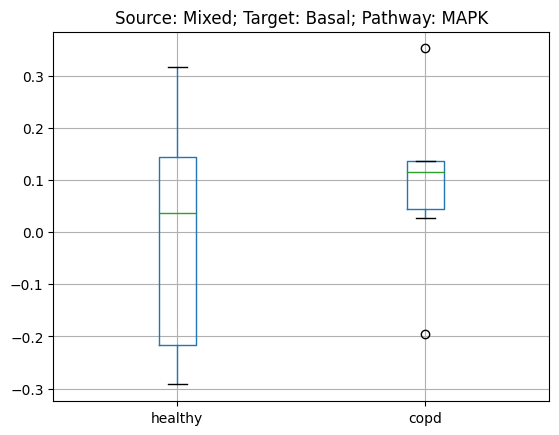

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


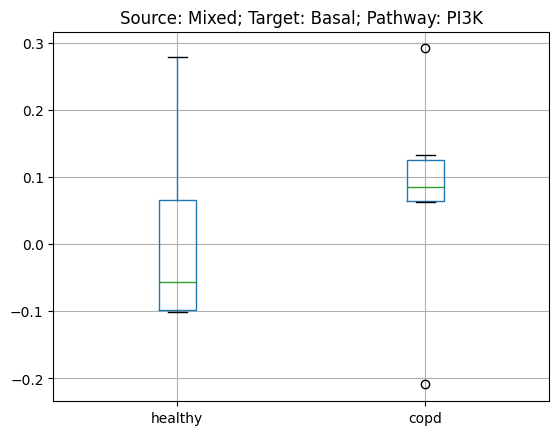

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


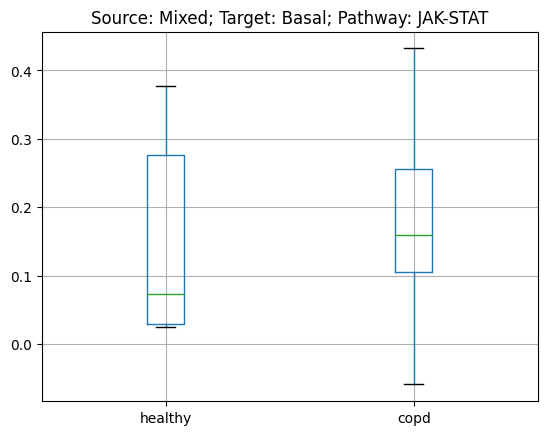

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


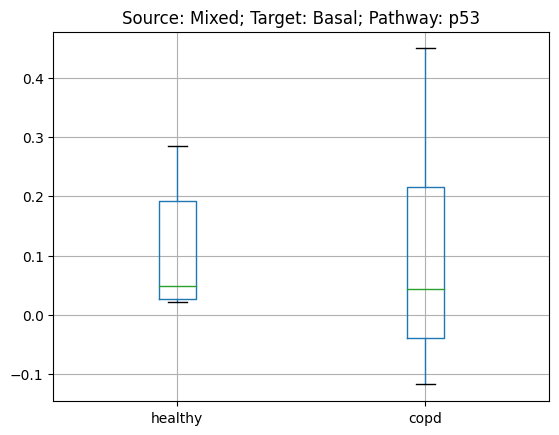

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


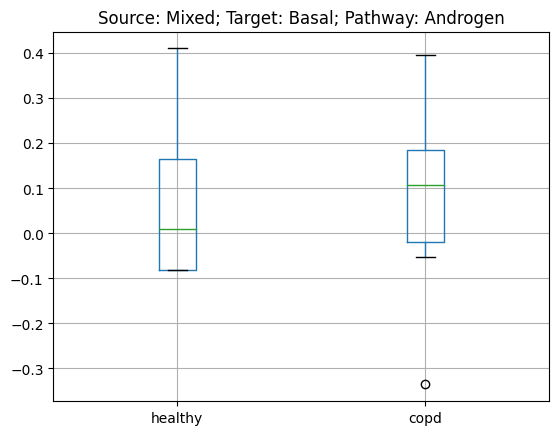

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


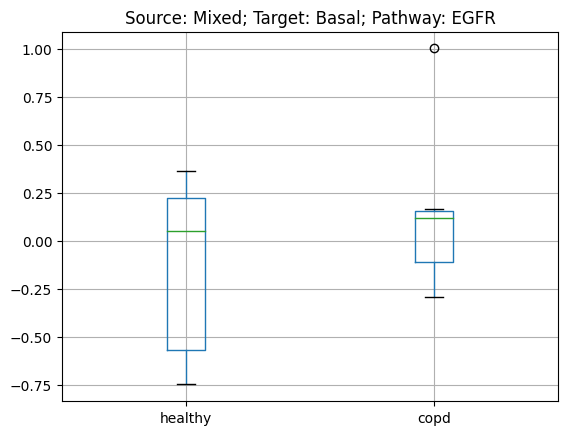

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


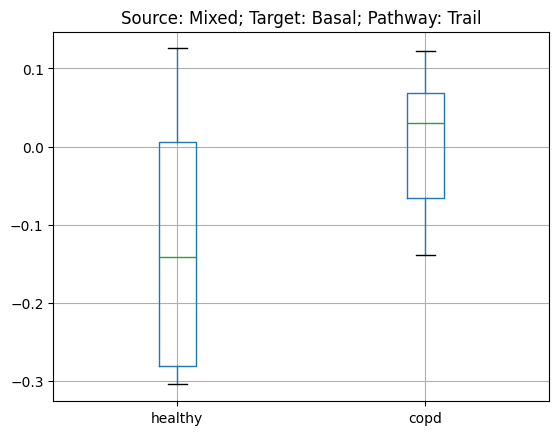

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


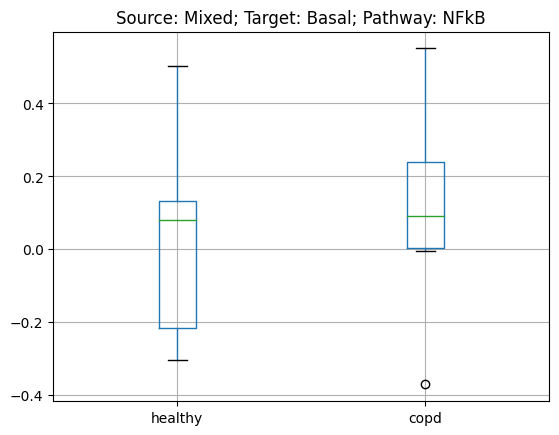

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


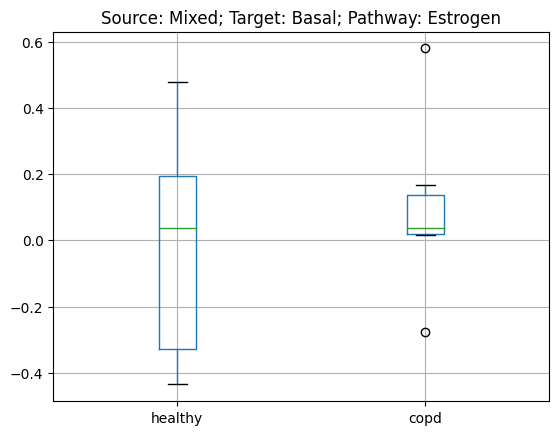

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


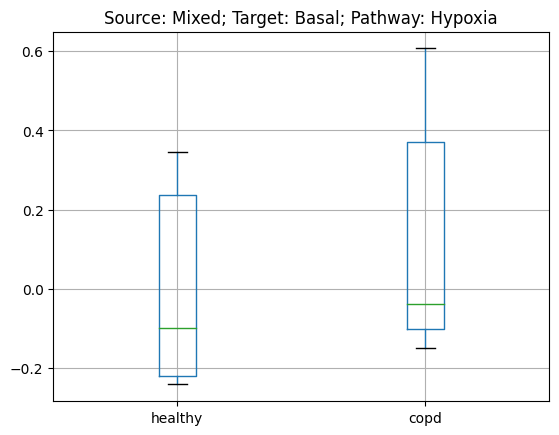

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


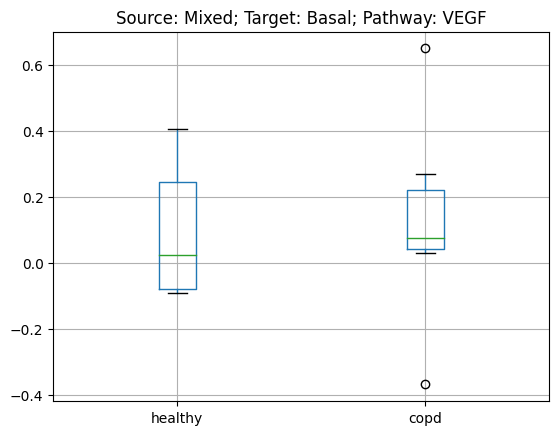

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


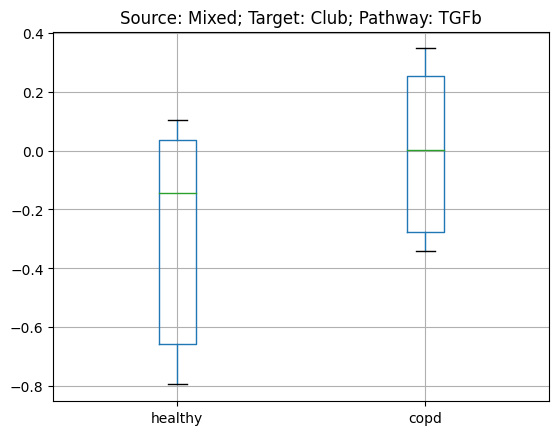

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


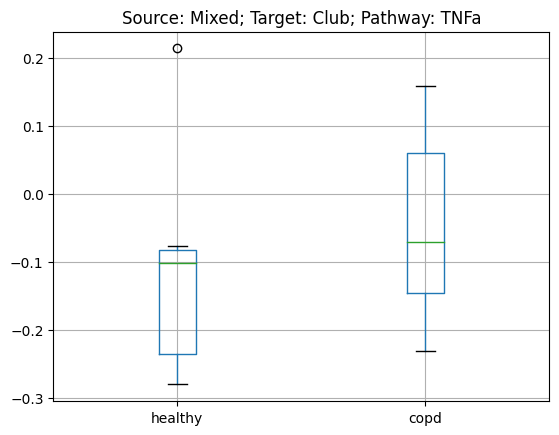

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


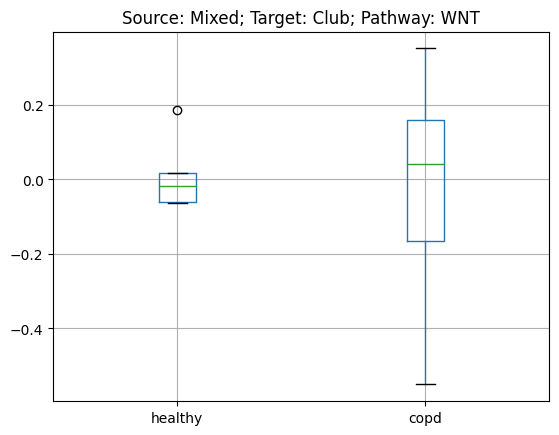

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


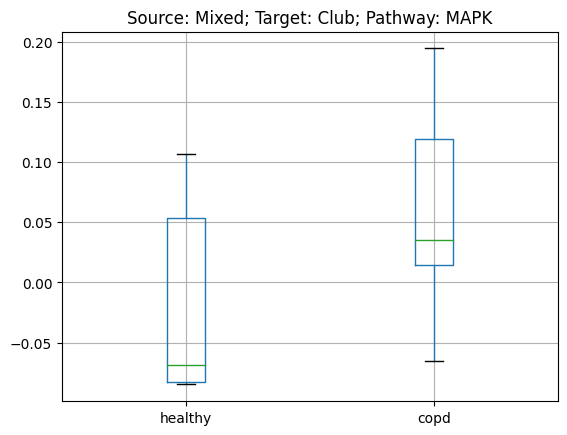

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


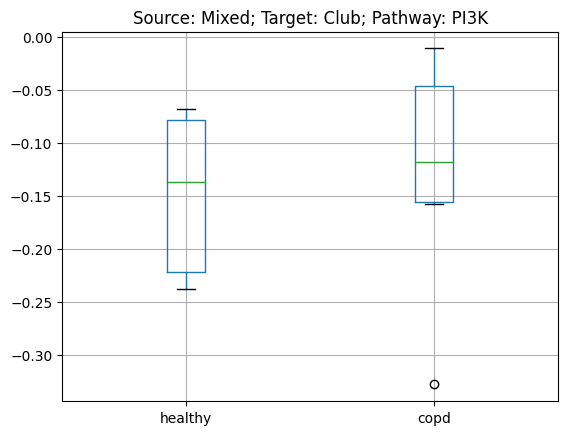

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


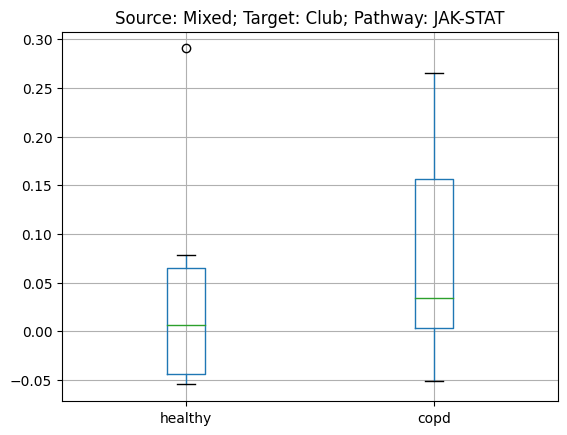

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


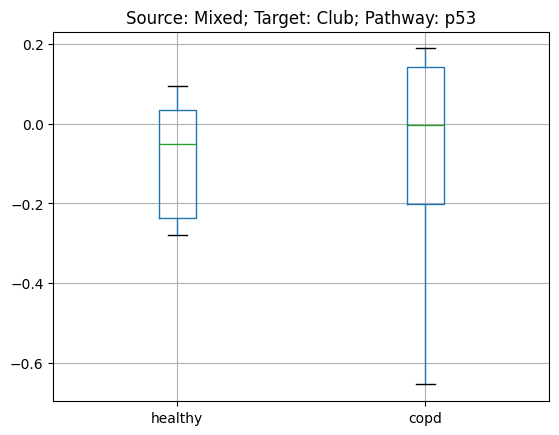

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


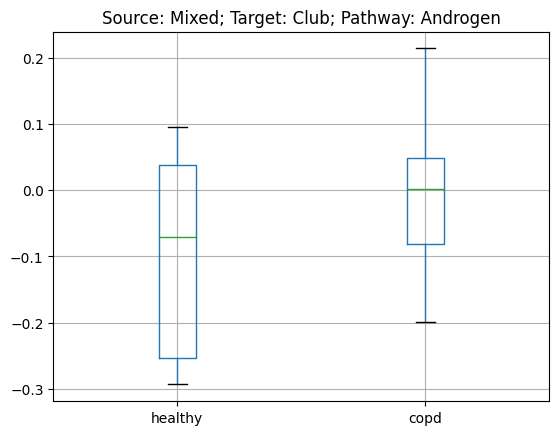

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


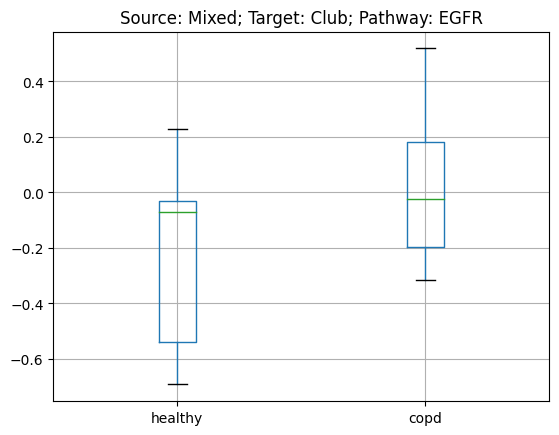

/home/ceger/miniforge3/envs/liana_c2c-env/lib/python3.8/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)


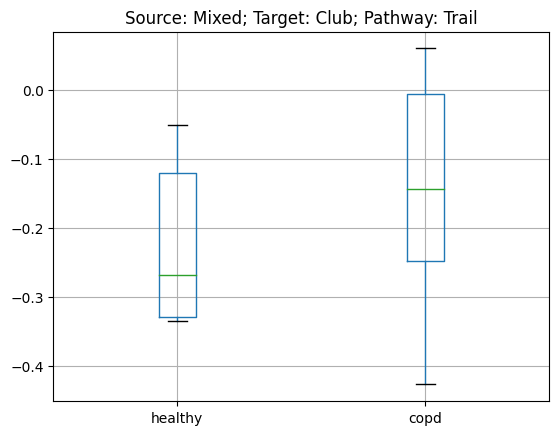

 50%|█████     | 5/10 [09:59<09:59, 119.95s/it]


KeyboardInterrupt: 

In [28]:
for cell_compartment_source in tqdm(cell_compartments):
    for cell_compartment_target in cell_compartments:
        values_dict = {}
        for source, target in {source: set(progeny[progeny['source'] == source]['target']) for source in set(progeny['source'])}.items():
            temp_df = df[(df['source'] == cell_compartment_source) & (df['target'] == cell_compartment_target) & ((df['ligand_complex'].isin(target) | df['receptor_complex'].isin(target)))]
            for condition in set(context_dict.values()):
                values_dict[condition] = []
            for batch, condition in context_dict.items():
                batch_sum = temp_df[temp_df['batch'] == batch]['magnitude_rank_inverted'].sum()
                values_dict[condition].append(batch_sum)
            values_df = pd.DataFrame.from_dict(values_dict)
            order = ['healthy_ctrl', 'healthy_iav', 'copd_ctrl', 'copd_iav']
            values_df = values_df[order]
            values_logfc_df = pd.DataFrame()
            values_logfc_df['healthy'] = np.log2(values_df['healthy_iav']/values_df['healthy_ctrl'])
            values_logfc_df['copd'] = np.log2(values_df['copd_iav']/values_df['copd_ctrl'])
            threshold = 1
            if (
                (np.linalg.norm(values_logfc_df['healthy'].mean()) > threshold)
                or (np.linalg.norm(values_logfc_df['copd'].mean()) > threshold)
            ):
                plt.figure()
                values_logfc_df.boxplot()
                plt.title(f'Source: {cell_compartment_source}; Target: {cell_compartment_target}; Pathway: {source}')
                plt.show()